###### Introduction

<b>Read this is you're new here</b>

This is a very confusing and all over the place document. Here's a few notes to make sure it ends up better than I originally planned. 

- <b>Independence:</b> Each section should be executable without the need for other sections, ideally. If you need a function, write it and put it in the function section. There, make the cell an 'initialization cell' (in <tt>View -> Initialization cells</tt>, then check the box)
- <b>Speed:</b> If the cell performs large data analysis (> 10 mins or something), try and save the data as well (if you're processing an array). Then, make the cell allow for loading that data, to save yourself time in the future.  
- <b>Save stuff: </b> I really wanted to have this as a workplace only, but it quickly grew much bigger than that. The problem is that the file becomes very very large, which makes this fairly slow. I'd say, try to save sections or parts of the code in individual python scripts, ready to be executed. 




# Intro

This is a quick script for the development of the spin dependent OAH analysis. 

## Imports And Constants

In [45]:
%matplotlib notebook
# plt.style.use('fivethirtyeight')  # pretty cool looking 
import warnings
warnings.filterwarnings('ignore')
from decimal import Decimal

import astropy.io.fits as pyfits
import numpy as np
import matplotlib.pyplot as plt
import os
from matplotlib.widgets import Slider
from matplotlib import colors
from matplotlib.gridspec import GridSpec
from IPython.display import clear_output
import scipy.odr as odr
import imageio
import gc
from matplotlib.widgets import EllipseSelector, RectangleSelector
from matplotlib.pyplot import cm
from scipy.special import eval_legendre
from scipy.optimize import curve_fit
import scipy.fftpack as fft
from matplotlib.colors import LogNorm
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from matplotlib.patches import Arc
import csv

from OAH_refocus import *
import time
import sys
import argparse
import glob
import csv
import matplotlib
import math
from scipy.optimize import curve_fit
from fitfunctions import gaussmod, tfmod, bimodalmod, tfaxialmod, gaussmod_OAH, tfmod_OAH, bimodalmod_OAH
from scipy.ndimage.interpolation import rotate
from scipy.special import zeta


# Import own fit functions
import OAH_functions as f1
# import OAHDEV_functions as f2
from OAHDEV_functions import *
# from ..data_analysis import fits_analysis as fa


# Constants:
kB = 1.38064852E-23
m = 3.81923979E-26
hb = 1.0545718E-34
asc = 2.802642E-9
mu0 = 1E-50
e0 = 8.854187E-12
pix_size = 6.5E-6 / 2.63
# Light field properties
lamb0 = 589.1E-9  # Wavelength
k0 = 2 * np.pi / lamb0  # k-vector

In [46]:
border_x = 5
border_z = 50

# Cutout
# ((xmin, xmax), (zmin, zmax)) = ((400, -200), (400, -200))
# ((xmin, xmax), (zmin, zmax)) = ((1000, 1400), (1000, 1400))
((xmin, xmax), (zmin, zmax)) = ((1, -1), (1, -1))
# ((xmin, xmax), (zmin, zmax)) = ((350, -350), (250, -250))

In [47]:
from IPython.display import display, HTML
display(HTML("<style>.container { width:80% !important; }</style>"))

## Functions

### SOAH Functions

In [48]:
def OAH_full_process(date, shot, num, dz_focus, quad_cut, mask_w=0.51, multi_loop=0, peakswithfitting=False):
    multi_loop  = 0
    el_x        = 10
    el_z        = 100
    edge_x      = 10
    edge_z      = 80
    e_w         = 0.1

    # ---------------------------------------------------------------------------------------------------
    # ------------------------------ OAH ENTIRE PROCESSING FUNCTION -------------------------------------
    # ---------------------------------------------------------------------------------------------------

    # ------------------------------------- OPEN FILES --------------------------------------------------
    atoms, flat, dark = openFiles(date, shot, num, multi_loop=multi_loop)

    # ----------------------------------- MASK THE EDGE -------------------------------------------------
    atoms      = f1.squaroid(atoms - dark, width=mask_w)
    flat       = f1.squaroid(flat - dark, width=mask_w)
#     atoms      = f1.ellipsoid(atoms - dark, width=mask_w, type="tukey")
#     flat       = f1.ellipsoid(flat - dark, width=mask_w, type="tukey")

    
    # ------------------------------------- TAKE FFT ----------------------------------------------------
    fft_atoms = np.fft.fft2(atoms)
    fft_flat = np.fft.fft2(flat)

    # ----------------------------------- TRIM THE EDGE -------------------------------------------------
    fft_atoms = fft_atoms[5:-5, 5:-5]
    fft_flat = fft_flat[5:-5, 5:-5]

    # ---------------------------- CUT QUADRANT AND MAKE ELLIPSOID  -------------------------------------
    quad1, q1peak  = f1.box_cutter_pad_ellips(fft_atoms, quad_cut, el_x, el_z, 
                                              edge_x=edge_x, edge_z=edge_z, e_w=e_w, 
                                              peakswithfitting=peakswithfitting)
    flatq1, f1peak = f1.box_cutter_pad_ellips(fft_flat,  quad_cut, indices=q1peak) # same indices as for quad
    quad1cut, flatq1cut = f1.sizecomp(quad1, flatq1)

    # ---------------------------------- SHIFT FFT TO CENTER  -------------------------------------------
    fft1 = np.fft.fftshift(quad1cut)
    flatfft1 = np.fft.fftshift(flatq1cut)
    
#     fft1 = quad1cut
#     flatfft1 = flatq1cut

    # -------------------------------------- REFOCUSING --------------------------------------------------
    fft_kx = np.fft.fftfreq(fft1.shape[1], d=pix_size)  # Discrete FFT Sample Frequency in x
    fft_ky = np.fft.fftfreq(fft1.shape[0], d=pix_size)  # Discrete FFT Sample Frequency in z
    fft_k2 = fft_kx[None, :] ** 2 + fft_ky[:, None] ** 2  # Discrete FFT Sample Frequency in main axes multiplied
    ly = 0  # .5E6#-3E6#.                                           # Adjusting the fft_ky array
    coma_y_arg = ly * fft_ky[:, None] * (3 * fft_k2 / k0 ** 2) / k0
    lin_y = np.exp(-1j * coma_y_arg)
    focus = np.exp(-1j * dz_focus * np.sqrt(k0 **2 - fft_k2))
    fft1 = fft1 * focus * lin_y
    flatfft1 = flatfft1 * focus * lin_y

    # ------------------------------------- INVERSE FFT -------------------------------------------------
    inv1 = np.fft.ifft2(fft1) / np.fft.ifft2(flatfft1)
    inv1 = inv1[border_x:-border_x, border_z:-border_z]

    # Get Phase
    ang1 = np.angle(inv1)
    ang1 = f1.unwrapper(ang1)

    # Get amp
    amp = np.abs(inv1)
    amp = np.log(amp**2)

    # Normalize
    normfactor = ang1.mean()
    ang1 = ang1 - normfactor
    ang1 = normalize(ang1)[0] 
    
    return atoms, flat, ang1, amp

In [49]:
def normalize(ang):
    """
    Returns the normalized image of the cloud - it fits each horizontal line of the image with a simple linear fit.
    Then it performs the vertical linear fit. This way, we get the background image, which we subtract from the actual image.
    It seems however that we might even have some quadratic, or maybe a gaussian would be easier? 
    """
    def linear_f(x, a, b):
        """ Faster, but does poor job. """
        return a * x + b
    
    def quadratic_f(x, a, b, c):
        """ Slower, but better equiped for normalizing"""
        return a * x**2 + b*x + c
    

    xdata = np.arange(0, len(ang[0]))
    ydata = np.arange(0, len(ang))
    arr_gradient = []
    arr_gradient_2 = []
    # Linear fit - horizontal gradient (for each line individualy)
    for i in range(ang.shape[0]):
        pars, cov = curve_fit(f=quadratic_f, xdata=xdata, ydata=ang[i], p0=[0, 0, 0])
        arr_line = quadratic_f(xdata, pars[0], pars[1], pars[2])
        arr_gradient.append(arr_line)
    lingrad = arr_gradient.copy()
    
    # Linear fit - vertical gradient (for each line individualy)
    arr_gradient = np.transpose(arr_gradient)  # Transpose
    for i in range(ang.shape[1]):
        pars, cov = curve_fit(f=quadratic_f, xdata=ydata, ydata=arr_gradient[i], p0=[0, 0, 0])
        arr_line = quadratic_f(ydata, pars[0], pars[1], pars[2])
        arr_gradient_2.append(arr_line)
    arr_gradient = np.transpose(arr_gradient_2)  # Transpose back
    
    ang = ang - arr_gradient
    return ang, arr_gradient, lingrad

In [50]:
def select_coords(pic, title_string=None):
    """ 
        A function to make a range selection a piece of cake. Plots the image (which is taken as an input).
        it is actually still a pain in the ass. It works in principle, but it's very annoying to implement it. 
    """
    def select_callback(eclick, erelease):
        """
        Callback for line selection.

        *eclick* and *erelease* are the press and release events.
        """
        global xtemp1, xtemp2, ytemp1, ytemp2
        xtemp1, ytemp1 = eclick.xdata, eclick.ydata
        xtemp2, ytemp2 = erelease.xdata, erelease.ydata
        title.set_text("Coordinates Recorded: \n X = {:} - {:}, Y = {:} - {:} \nPress Enter to save.".format(round(xtemp1),round(xtemp2),round(ytemp1),round(ytemp2)))
        fig.canvas.draw_idle()

    def toggle_selector(event):
        print('Key pressed.')
        if event.key == 't':
            for selector in selectors:
                name = type(selector).__name__
                if selector.active:
                    print(f'{name} deactivated.')
                    selector.set_active(False)
                else:
                    print(f'{name} activated.')
                    selector.set_active(True)
        elif event.key == 'enter':
            # print("Enter pressed")
            plt.close()
            t_var = True
    
    t_var = False
    fig, ax = plt.subplots()
    ax.imshow(pic)
    

    N = 100000  # If N is large one can see improvement by using blitting.
    x = np.linspace(0, 10, N)

    selectors = []
    for selector_class in [RectangleSelector]:
        selectors.append(selector_class(
            ax, select_callback,
            useblit=True,
            button=[1, 3],  # disable middle button
            minspanx=5, minspany=5,
            spancoords='pixels',
            interactive=True))
        fig.canvas.mpl_connect('key_press_event', toggle_selector)

    if title_string is None:
        title = ax.set_title("Make a selection and \n press Enter to save the coordinates.")
    else: 
        title = ax.set_title("{:} and \n press Enter to save the coordinates.".format(title_string))

    fig.canvas.draw_idle()

    return xtemp1, xtemp2, ytemp1, ytemp2

        

def wrapper(pic):
    xtemp1, xtemp2, ytemp1, ytemp2 = select_coords(pic)
    return xtemp1, xtemp2, ytemp1, ytemp2


from scipy.interpolate import interp2d

def upscale(pic1):
    fftimage = np.fft.fftshift(np.fft.fft2(pic1))
    pad_image = np.pad(fftimage, pad_width=((500, 500), (500, 500)), mode='constant', constant_values=0)
    upscaled = np.fft.ifft2(pad_image)
    return abs(upscaled)

def upscale2(array, scale_factor=2, t='cubic'):
    # Get the original dimensions of the array
    rows, cols = array.shape
    
    # Create the original grid
    x = np.arange(cols)
    y = np.arange(rows)
    
    # Create the interpolator function
    interpolator = interp2d(x, y, array, kind=t)
    
    # Create the new grid for the upscaled array
    new_x = np.linspace(0, cols-1, cols*scale_factor)
    new_y = np.linspace(0, rows-1, rows*scale_factor)
    
    # Interpolate to get the values on the new grid
    upscaled_array = interpolator(new_x, new_y)
    
    return upscaled_array


In [51]:
# Initial values
initial_fit_vals = {
    "offset": 0.,
    "amp_ov": 1.,
    "ang": 0,
    "center": (50, 850),
    "tfa": 1,
    "tfw": (20, 50),
    "ga": 1,
    "gw": (200, 200),
    "j_guess": 40 ,
    "axamp": 1,
    "x_shift": 0.0,
    "squeeze_par": 1.0,
}

In [52]:
def fitting(pic, mode, init_guess=initial_fit_vals, normalize=False, invert=False, OAH=False):
    
    # Initial values
    offset = init_guess["offset"]
    amp_ov = init_guess["amp_ov"]
    ang = init_guess["ang"]
    center = init_guess["center"]
    tfa = init_guess["tfa"]
    tfw = init_guess["tfw"]    
    ga = init_guess["ga"]
    gw = init_guess["gw"]    
    j_guess = init_guess["j_guess"]
    axamp = init_guess["axamp"]    
    x_shift = init_guess["x_shift"]
    squeeze_par = init_guess["squeeze_par"]
    
#     print(init_guess)
    
    
    # Normalize everything between 1 and 0
    if normalize:
#         pic = pic[10:-10, 10:-10]
        pic = pic + abs(pic.min()) + 0.00001
        avg_bg = pic.mean()
        pic = pic/avg_bg

    if invert:
        # Normalize such that the background is at 1, the peak is at zero.         
        pic= - pic + 0.5

        
    mask = pic == 0
    pic = np.ma.array(pic, mask=mask)
    # Generate empty arrays of the pic size which we will feed into the fitting procedure.
    # Create a 'fitvars' array of x and y coordinates
    x = np.arange(pic.shape[0])
    y = np.arange(pic.shape[1])
    xv, yv = np.meshgrid(x, y, indexing='ij')
    fitvars = np.array([xv, yv]).reshape(2, -1)

    xbin = 1
    zbin = 1

    # Constants
    pixelsize = 2.47148288973384e-06 
    kB = 1.38064852E-23
    m = 3.81923979E-26
    hb = 1.0545718E-34
    asc = 2.802642E-9
    mu0 = 1e-50
    e0 = 8.854187E-12
    fx = 115
    fz = 15
    wavelength = 589e-9
    detuning = 0
    prefactor = float((1 + 4 * detuning ** 2) * 2 * np.pi / (3 * (wavelength ** 2)) * 18. / 5.)

    xmin, xmax, zmin, zmax = 0, 0, 0, 0
    
    par_names = ['offset', 'ampl', 'ang', 'xmid', 'ymid', 'tfamp', 'tfxw', 'tfyw', 'gamp', 'gxw', 'gyw']
    bin_scaling = np.array([1., 1., 1., xbin, zbin, 1., xbin, zbin, 1., xbin, zbin])
    rng_offset = np.array([0., 0., 0., xmin, zmin, 0., 0., 0., 0., 0., 0.])
    init_guess = np.array([offset, amp_ov, ang, center[0], center[1], tfa, tfw[0], tfw[1], ga, gw[0], gw[1]])
    to_physical = np.array([1., 1., 1., pixelsize, pixelsize, prefactor, pixelsize, pixelsize, prefactor, pixelsize, pixelsize])
    corr_guess = (init_guess - rng_offset) / bin_scaling

    if OAH:
        if mode == "gauss":
            corr_guess = np.append(corr_guess[:5], corr_guess[-3:])
            bin_scaling = np.append(bin_scaling[:5], bin_scaling[-3:])
            rng_offset = np.append(rng_offset[:5], rng_offset[-3:])
            par_names = np.append(par_names[:5], par_names[-3:])
            to_physical = np.append(to_physical[:5], to_physical[-3:])
            odrmodel = odr.Model(gaussmod_OAH)  # Store information for the gaussian fitting model

        if mode == "doubletf":
            corr_guess = np.append(corr_guess[:8], [center2[0], center2[1], tfa2, tfw2[0], tfw2[1]])
            bin_scaling = np.append(bin_scaling[:8], bin_scaling[3:8])
            rng_offset = np.append(rng_offset[:8], rng_offset[3:8])
            par_names = np.append(par_names[:8], par_names[3:8])
            to_physical = np.append(to_physical[:8], to_physical[3:8])
            odrmodel = odr.Model(double_tf_OAH)  # Store information for the gaussian fitting model

            
        if mode == "tf":
            corr_guess = corr_guess[:8]
            bin_scaling = bin_scaling[:8]
            rng_offset = rng_offset[:8]
            par_names = par_names[:8]
            to_physical = to_physical[:8]
            odrmodel = odr.Model(tfmod_OAH)  # Store information for the tf fitting model

        if mode == "bimodal":
            odrmodel = odr.Model(bimodalmod_OAH)  # Store information for the bimodal fitting model
            
        
    else: 
        if mode == "gauss":
            corr_guess = np.append(corr_guess[:5], corr_guess[-3:])
            bin_scaling = np.append(bin_scaling[:5], bin_scaling[-3:])
            rng_offset = np.append(rng_offset[:5], rng_offset[-3:])
            par_names = np.append(par_names[:5], par_names[-3:])
            to_physical = np.append(to_physical[:5], to_physical[-3:])
            odrmodel = odr.Model(gaussmod)  # Store information for the gaussian fitting model

        if mode == "tf":
            corr_guess = corr_guess[:8]
            bin_scaling = bin_scaling[:8]
            rng_offset = rng_offset[:8]
            par_names = par_names[:8]
            to_physical = to_physical[:8]
            odrmodel = odr.Model(tfmod)  # Store information for the tf fitting model

        if mode == "bimodal":
            odrmodel = odr.Model(bimodalmod)  # Store information for the bimodal fitting model

        if mode == "timecrystal":
            corr_guess = corr_guess[:8]
            corr_guess = np.append(corr_guess, j_guess)
            corr_guess = np.append(corr_guess, axamp)
            corr_guess = np.append(corr_guess, x_shift)
            corr_guess = np.append(corr_guess, squeeze_par)
            bin_scaling = bin_scaling[:8]
            bin_scaling = np.append(bin_scaling, 1.)
            bin_scaling = np.append(bin_scaling, 1.)
            bin_scaling = np.append(bin_scaling, 1.)
            bin_scaling = np.append(bin_scaling, 1.)
            rng_offset = rng_offset[:8]
            rng_offset = np.append(rng_offset, 0)
            rng_offset = np.append(rng_offset, 0)
            rng_offset = np.append(rng_offset, 0)
            rng_offset = np.append(rng_offset, 0)
            par_names = par_names[:8]
            par_names = np.append(par_names, "j parameter")
            par_names = np.append(par_names, "axamp")
            par_names = np.append(par_names, "x_shift")
            par_names = np.append(par_names, "squeeze_par")
            to_physical = to_physical[:8]
            to_physical = np.append(to_physical, 1.)
            to_physical = np.append(to_physical, 1.)
            to_physical = np.append(to_physical, 1.)
            to_physical = np.append(to_physical, 1.)
            odrmodel = odr.Model(tfaxialmod)
        
       
    print(corr_guess)
    # Run the ODR Fit procedure.
    odrdata = odr.Data(fitvars[:, ~pic.mask.flatten()], pic.flatten()[~pic.mask.flatten()])
    odrobj = odr.ODR(odrdata, odrmodel, beta0=corr_guess)
    odrobj.set_job(2)  # Ordinary least-sqaures fitting
    odrout = odrobj.run()
#     odrout.pprint()


    if OAH:
        # This sets the angle to be correct wrt x and y.
        if np.abs(odrout.beta[2] % np.pi) > np.pi / 4.:
            odrout.beta[2] = odrout.beta[2] - np.pi / 2.
            print("Performing xy swap due to angle.")
            if mode == "bimodal":
                tmp_tfx = odrout.beta[6]
                tmp_gx = odrout.beta[-2]
                odrout.beta[6] = odrout.beta[7]
                odrout.beta[7] = tmp_tfx
                odrout.beta[-2] = odrout.beta[-1]
                odrout.beta[-1] = tmp_gx
            else:
                tmp = odrout.beta[6]
                odrout.beta[6] = odrout.beta[7]
                odrout.beta[7] = tmp

        if mode == "gauss":
            fitresult = gaussmod_OAH(odrout.beta, fitvars).reshape(pic.shape[0], pic.shape[1])
            fitguess = gaussmod_OAH(corr_guess, fitvars).reshape(pic.shape[0], pic.shape[1])
            fitresultgauss = []
            fitresulttf = []
        
        if mode == "doubletf":
            fitresult = double_tf_OAH(odrout.beta, fitvars).reshape(pic.shape[0], pic.shape[1])
            fitguess = double_tf_OAH(corr_guess, fitvars).reshape(pic.shape[0], pic.shape[1])
            fitresultgauss = []
            fitresulttf = []

        if mode == "tf":
            fitresult = tfmod_OAH(odrout.beta, fitvars).reshape(pic.shape[0], pic.shape[1])
            fitguess = tfmod_OAH(corr_guess, fitvars).reshape(pic.shape[0], pic.shape[1])
            fitresultgauss = []
            fitresulttf = []

        if mode == "bimodal":
            fitresult = bimodalmod_OAH(odrout.beta, fitvars).reshape(pic.shape[0], pic.shape[1])
            fitresulttf = tfmod_OAH(odrout.beta[:8], fitvars).reshape(pic.shape[0], pic.shape[1])
            fitresultgauss = gaussmod_OAH(np.append(odrout.beta[:5], odrout.beta[-3:]), fitvars).reshape(pic.shape[0],pic.shape[1])
            fitguess = bimodalmod_OAH(corr_guess, fitvars).reshape(pic.shape[0], pic.shape[1])
        
    else:
        # This sets the angle to be correct wrt x and y.
        if np.abs(odrout.beta[2] % np.pi) > np.pi / 4.:
            odrout.beta[2] = odrout.beta[2] - np.pi / 2.
            print("Performing xy swap due to angle.")
            if mode == "bimodal":
                tmp_tfx = odrout.beta[6]
                tmp_gx = odrout.beta[-2]
                odrout.beta[6] = odrout.beta[7]
                odrout.beta[7] = tmp_tfx
                odrout.beta[-2] = odrout.beta[-1]
                odrout.beta[-1] = tmp_gx
            else:
                tmp = odrout.beta[6]
                odrout.beta[6] = odrout.beta[7]
                odrout.beta[7] = tmp

        if mode == "gauss":
            fitresult = gaussmod(odrout.beta, fitvars).reshape(pic.shape[0], pic.shape[1])
            fitguess = gaussmod(corr_guess, fitvars).reshape(pic.shape[0], pic.shape[1])
            fitresultgauss = []
            fitresulttf = []
            
        if mode == "tf":
            fitresult = tfmod(odrout.beta, fitvars).reshape(pic.shape[0], pic.shape[1])
            fitguess = tfmod(corr_guess, fitvars).reshape(pic.shape[0], pic.shape[1])
            fitresultgauss = []
            fitresulttf = []

        if mode == "bimodal":
            fitresult = bimodalmod(odrout.beta, fitvars).reshape(pic.shape[0], pic.shape[1])
            fitresulttf = tfmod(odrout.beta[:8], fitvars).reshape(pic.shape[0], pic.shape[1])
            fitresultgauss = gaussmod(np.append(odrout.beta[:5], odrout.beta[-3:]), fitvars).reshape(pic.shape[0],pic.shape[1])
            fitguess = bimodalmod(corr_guess, fitvars).reshape(pic.shape[0], pic.shape[1])

        if mode == "timecrystal":
            fitresult = tfaxialmod(odrout.beta, fitvars).reshape(pic.shape[0], pic.shape[1])
            fitguess = tfaxialmod(corr_guess, fitvars).reshape(pic.shape[0], pic.shape[1])
            fitresultgauss = []
            fitresulttf = []
        


    # As the entire output, except for the angle and the offset, has to be positive,
    # we take the absolute value of the entire list, then put the angle and offset back in.
    offset_temp = odrout.beta[0]
    ang_temp = odrout.beta[2]
    odrout.beta = np.abs(odrout.beta)
    odrout.beta[0] = offset_temp
    odrout.beta[2] = ang_temp % np.pi
    
    # Converts the fit results to absolute pixel values in the unbinned image.
    fit_results = odrout.beta * bin_scaling + rng_offset
    phys_results = fit_results * to_physical

    tof = 0
    ncount = - np.log(pic.flatten()).sum() * prefactor * pixelsize ** 2 * xbin * zbin
    ntherm = 0
    ntf = 0
    tx = 0
    tz = 0
    mux = 0
    muz = 0
    mun = 0

    if mode == "gauss":
        ntherm = 2 * np.pi * phys_results[5] * phys_results[6] * phys_results[7]
        tx = 1 / kB * m / 1 * (fx * np.pi * 2 * phys_results[6]) ** 2 / (1 + (tof * fx * np.pi * 2) ** 2)
        tz = 1 / kB * m / 1 * (fz * np.pi * 2 * phys_results[7]) ** 2 / (1 + (tof * fz * np.pi * 2) ** 2)
        mux = m / 1 * (fx * np.pi * 2 * phys_results[6]) ** 2 / (1 + (tof * fx * np.pi * 2) ** 2)
        muz = m / 1 * (fz * np.pi * 2 * phys_results[7]) ** 2 / (1 + (tof * fz * np.pi * 2) ** 2)
        mun = 1.47708846953 * np.power(
            ntf * asc / (np.sqrt(hb / (m * np.power(8 * np.pi ** 3 * fx ** 2 * fz, 1. / 3.)))),
            2. / 5.) * hb * np.power(8 * np.pi ** 3 * fx ** 2 * fz, 1. / 3.)
    if mode == "tf":
        ntf = 2. * np.pi / 5. * phys_results[5] * phys_results[6] * phys_results[7]  # 2/5 = 8/15 / (4/3)
        tx = 1 / kB * m / 1 * (fx * np.pi * 2 * phys_results[6]) ** 2 / (1 + (tof * fx * np.pi * 2) ** 2)
        tz = 1 / kB * m / 1 * (fz * np.pi * 2 * phys_results[7]) ** 2 / (1 + (tof * fz * np.pi * 2) ** 2)
        mux = m / 1 * (fx * np.pi * 2 * phys_results[6]) ** 2 / (1 + (tof * fx * np.pi * 2) ** 2)
        muz = m / 1 * (fz * np.pi * 2 * phys_results[7]) ** 2 / (1 + (tof * fz * np.pi * 2) ** 2)
        mun = 1.47708846953 * np.power(
            ntf * asc / (np.sqrt(hb / (m * np.power(8 * np.pi ** 3 * fx ** 2 * fz, 1. / 3.)))),
            2. / 5.) * hb * np.power(8 * np.pi ** 3 * fx ** 2 * fz, 1. / 3.)
    if mode == "timecrystal":
        ntf = 2. * np.pi / 5. * phys_results[5] * phys_results[6] * phys_results[7]  # 2/5 = 8/15 / (4/3)
        tx = 1 / kB * m / 1 * (fx * np.pi * 2 * phys_results[6]) ** 2 / (1 + (tof * fx * np.pi * 2) ** 2)
        tz = 1 / kB * m / 1 * (fz * np.pi * 2 * phys_results[7]) ** 2 / (1 + (tof * fz * np.pi * 2) ** 2)
        mux = m / 1 * (fx * np.pi * 2 * phys_results[6]) ** 2 / (1 + (tof * fx * np.pi * 2) ** 2)
        muz = m / 1 * (fz * np.pi * 2 * phys_results[7]) ** 2 / (1 + (tof * fz * np.pi * 2) ** 2)
        mun = 1.47708846953 * np.power(
            ntf * asc / (np.sqrt(hb / (m * np.power(8 * np.pi ** 3 * fx ** 2 * fz, 1. / 3.)))),
            2. / 5.) * hb * np.power(8 * np.pi ** 3 * fx ** 2 * fz, 1. / 3.)
    if mode == "bimodal":
        ntf = 2. * np.pi / 5. * phys_results[5] * phys_results[6] * phys_results[7]
        ntherm = 2 * np.pi * phys_results[8] * phys_results[9] * phys_results[10]
        tx = 1 / kB * m / 1 * (fx * np.pi * 2 * phys_results[9]) ** 2 / (1 + (tof * fx * np.pi * 2) ** 2)
        tz = 1 / kB * m / 1 * (fz * np.pi * 2 * phys_results[10]) ** 2 / (1 + (tof * fz * np.pi * 2) ** 2)
        mux = m / 1 * (fx * np.pi * 2 * phys_results[6]) ** 2 / (1 + (tof * fx * np.pi * 2) ** 2)
        muz = m / 1 * (fz * np.pi * 2 * phys_results[7]) ** 2 / (1 + (tof * fz * np.pi * 2) ** 2)
        mun = 1.47708846953 * np.power(
            ntf * asc / (np.sqrt(hb / (m * np.power(8 * np.pi ** 3 * fx ** 2 * fz, 1. / 3.)))),
            2. / 5.) * hb * np.power(8 * np.pi ** 3 * fx ** 2 * fz, 1. / 3.)

    ntotal = ntherm + ntf

    fitted_vars = (ncount, ntherm, ntf, tx, tz, mux, muz, mun)
    
    return pic, fitresult, fitguess, fitresultgauss, fitresulttf, fitted_vars, odrout


In [53]:
def spin_reconstruction(phase1, phase2, beta=0, shift=0, fit=True, mode="tf", extra_var=1):
    """
        phase1: reconstructed sigma_+
        phase2: reconstructed sigma_-
        beta: The angle between the quantization axis and probe beam it determines the reconstruction coefficients. 
        shift: vertical displacement between the two images (don't know yet, why)
        fit: Boolean - if after reconstruction we want to fit each spin component, and extract parameters from it.
        mode: tf or gauss
        ==================
        returns: A bunch
        
        So this is a funciton that takes in two arrays, one with one polarization, one with the other.  
        
    """
    
    # Constants
    pixelsize = 2.47148288973384e-06 
    kB = 1.38064852E-23
    m = 3.81923979E-26
    hb = 1.0545718E-34
    asc = 2.802642E-9
    mu0 = 1e-50
    e0 = 8.854187E-12
    wavelength = 589e-9
    detuning = 36 # in terms of Gamma
    

    def a(beta):
        return 2/6*np.sin(beta)**2 + 4/6*np.cos(beta)**2 + 2/6*np.sin(beta)**2
    
    def b(beta, extra_var=extra_var):
        return (5/6*np.cos(beta/2)**4 + 2/6*np.sin(beta)**2 + 3/6*np.sin(beta/2)**4)*extra_var
    
    def c(beta):
        return 2/6*np.sin(beta)**2 + 4/6*np.cos(beta)**2 + 2/6*np.sin(beta)**2
    
    def d(beta, extra_var=extra_var):
        return (3/6*np.cos(beta/2)**4 + 2/6*np.sin(beta)**2 + 5/6*np.sin(beta/2)**4)

    
    prefactor = float(-(1 + 4 * detuning ** 2) * 2 * np.pi / ((3 * (wavelength ** 2)) * detuning ))
    norm_factor = 1/(a(beta)*d(beta, extra_var) - b(beta, extra_var)*c(beta))
    spin1 = prefactor*norm_factor*(-c(beta)*phase1 + a(beta)*shift_rows_down(phase2, shift))    
    spin2 = prefactor*norm_factor*(d(beta, extra_var)*phase1 - b(beta, extra_var)*shift_rows_down(phase2, shift))
    coeffs = [a(beta), b(beta, extra_var), c(beta), d(beta, extra_var)]
    
    if not fit: 
        return spin1, spin2, coeffs
        
    
    if fit: 
        f_n = 1
        output = [["spin, fitresult, fitguess, fitted_vars, odrout"]]
        for pic in [spin1, spin2]:
            # Default values. 
            offset = 0
            amp_ov = -1
            ang = 0
            center = ((int(pic.shape[0])/2, (1+f_n)*int(pic.shape[1])/5))
            tfa = 6e+15
            tfw = (20, 50)
            ga = 1
            gw = (200, 200)
                
            print(f"Fitting ... {f_n}/2")
            f_n += 1
            # Generate empty arrays of the pic size which we will feed into the fitting procedure.
            # Create a 'fitvars' array of x and y coordinates
            mask = pic == 0
            pic = np.ma.array(pic, mask=mask)
            x = np.arange(pic.shape[0])
            y = np.arange(pic.shape[1])
            xv, yv = np.meshgrid(x, y, indexing='ij')
            fitvars = np.array([xv, yv]).reshape(2, -1)

            xbin = 1
            zbin = 1
            xmin, xmax, zmin, zmax = 0, 0, 0, 0
            par_names = ['offset', 'ampl', 'ang', 'xmid', 'ymid', 'tfamp', 'tfxw', 'tfyw', 'gamp', 'gxw', 'gyw']
            bin_scaling = np.array([1., 1., 1., xbin, zbin, 1., xbin, zbin, 1., xbin, zbin])
            rng_offset = np.array([0., 0., 0., xmin, zmin, 0., 0., 0., 0., 0., 0.])
            init_guess = np.array([offset, amp_ov, ang, center[0], center[1], tfa, tfw[0], tfw[1], ga, gw[0], gw[1]])
            to_physical = np.array([1., 1., 1., pixelsize, pixelsize, 1, pixelsize, pixelsize, 1, pixelsize, pixelsize])
            corr_guess = (init_guess - rng_offset) / bin_scaling

            if mode == "gauss":
                corr_guess = np.append(corr_guess[:5], corr_guess[-3:])
                bin_scaling = np.append(bin_scaling[:5], bin_scaling[-3:])
                rng_offset = np.append(rng_offset[:5], rng_offset[-3:])
                par_names = np.append(par_names[:5], par_names[-3:])
                to_physical = np.append(to_physical[:5], to_physical[-3:])
                odrmodel = odr.Model(gaussmod_OAH)  # Store information for the gaussian fitting model

            if mode == "tf":
                corr_guess = corr_guess[:8]
                bin_scaling = bin_scaling[:8]
                rng_offset = rng_offset[:8]
                par_names = par_names[:8]
                to_physical = to_physical[:8]
                odrmodel = odr.Model(tfmod_OAH)  # Store information for the tf fitting model

            # Run the ODR Fit procedure.
            odrdata = odr.Data(fitvars[:, ~pic.mask.flatten()], pic.flatten()[~pic.mask.flatten()])
            odrobj = odr.ODR(odrdata, odrmodel, beta0=corr_guess)
            odrobj.set_job(2)
            odrout = odrobj.run()

            # This sets the angle to be correct wrt x and y.
            if np.abs(odrout.beta[2] % np.pi) > np.pi / 4.:
                odrout.beta[2] = odrout.beta[2] - np.pi / 2.
                print("Performing xy swap due to angle.")
                tmp = odrout.beta[6]
                odrout.beta[6] = odrout.beta[7]
                odrout.beta[7] = tmp

            if mode == "gauss":
                fitresult = gaussmod_OAH(odrout.beta, fitvars).reshape(pic.shape[0], pic.shape[1])
                fitguess = gaussmod_OAH(corr_guess, fitvars).reshape(pic.shape[0], pic.shape[1])
                fitresultgauss = []
                fitresulttf = []

            if mode == "tf":
                fitresult = tfmod_OAH(odrout.beta, fitvars).reshape(pic.shape[0], pic.shape[1])
                fitguess = tfmod_OAH(corr_guess, fitvars).reshape(pic.shape[0], pic.shape[1])
                fitresultgauss = []
                fitresulttf = []


            # As the entire output, except for the angle and the offset, has to be positive,
            # we take the absolute value of the entire list, then put the angle and offset back in.
            offset_temp = odrout.beta[0]
            ang_temp = odrout.beta[2]
            odrout.beta = np.abs(odrout.beta)
            odrout.beta[0] = offset_temp
            odrout.beta[2] = ang_temp % np.pi

            # Converts the fit results to absolute pixel values in the unbinned image.
            fit_results = odrout.beta * bin_scaling + rng_offset
            phys_results = fit_results * to_physical

            tof = 0
            ncount = - np.log(pic.flatten()).sum() * prefactor * norm_factor * pixelsize ** 2 * xbin * zbin
            ntherm = 0
            ntf = 0
            tx = 0
            tz = 0
            mux = 0
            muz = 0
            mun = 0

            if mode == "gauss":
                ntherm = 2 * np.pi * phys_results[5] * phys_results[6] * phys_results[7]
                tx = 1 / kB * m / 1 * (fx * np.pi * 2 * phys_results[6]) ** 2 / (1 + (tof * fx * np.pi * 2) ** 2)
                tz = 1 / kB * m / 1 * (fz * np.pi * 2 * phys_results[7]) ** 2 / (1 + (tof * fz * np.pi * 2) ** 2)
                mux = m / 1 * (fx * np.pi * 2 * phys_results[6]) ** 2 / (1 + (tof * fx * np.pi * 2) ** 2)
                muz = m / 1 * (fz * np.pi * 2 * phys_results[7]) ** 2 / (1 + (tof * fz * np.pi * 2) ** 2)
                mun = 1.47708846953 * np.power(
                    ntf * asc / (np.sqrt(hb / (m * np.power(8 * np.pi ** 3 * fx ** 2 * fz, 1. / 3.)))),
                    2. / 5.) * hb * np.power(8 * np.pi ** 3 * fx ** 2 * fz, 1. / 3.)
            if mode == "tf":
                ntf = 2. * np.pi / 5. * phys_results[5] * phys_results[6] * phys_results[7]  # 2/5 = 8/15 / (4/3)
                tx = 1 / kB * m / 1 * (fx * np.pi * 2 * phys_results[6]) ** 2 / (1 + (tof * fx * np.pi * 2) ** 2)
                tz = 1 / kB * m / 1 * (fz * np.pi * 2 * phys_results[7]) ** 2 / (1 + (tof * fz * np.pi * 2) ** 2)
                mux = m / 1 * (fx * np.pi * 2 * phys_results[6]) ** 2 / (1 + (tof * fx * np.pi * 2) ** 2)
                muz = m / 1 * (fz * np.pi * 2 * phys_results[7]) ** 2 / (1 + (tof * fz * np.pi * 2) ** 2)
                mun = 1.47708846953 * np.power(
                    ntf * asc / (np.sqrt(hb / (m * np.power(8 * np.pi ** 3 * fx ** 2 * fz, 1. / 3.)))),
                    2. / 5.) * hb * np.power(8 * np.pi ** 3 * fx ** 2 * fz, 1. / 3.)

            ntotal = ntherm + ntf

            fitted_vars = (ncount, ntherm, ntf, tx, tz, mux, muz, mun)

            output.append([pic, fitresult, fitguess, fitted_vars, odrout])
        
        print("Done.")
        return output, coeffs

In [54]:
# Fit and Rotate
###### ------------ ROTATE ---------------- 
# Since the condensates are pretty thin in the ODT, let's rotate them as well, so a linecut will be nicer. 
# Additionally, we will also be able to compare the fits themself. Fitting with TF model. 

def rotateFunction(ang1, ang2, mode="tf"):
    """
        We do it together for both, so that we also make sure that they are of
        the same size. Which we need for fitting. 
    """
    tfw = (ang1.shape[0]//5, ang1.shape[1]//2)
    gw = (ang1.shape[0]//5, ang1.shape[1]//2)
    fit_1 = fitting(ang1, init_guess=initial_g_1, mode="tf", OAH=True)
    fit_2 = fitting(ang2, init_guess=initial_g_2, mode="tf", OAH=True)
    # fit: pic, fitresult, fitguess, fitresultgauss, fitresulttf, fitted_vars, odrout
    clear_output()

    print(f"Angle 1 = {fit_1[6].beta[2]*(180/np.pi)}")
    print(f"Angle 2 = {fit_2[6].beta[2]*(180/np.pi)}")
    print(fit_1[6].beta)
    
    # Rotating the image and also the fitresult
#     ang1_rot = rotate(fit_1[0], (fit_1[6].beta[2]*(180/np.pi)), mode='reflect')
#     ang2_rot = rotate(fit_2[0], (fit_2[6].beta[2]*(180/np.pi)), mode='reflect')
    ang1_rot = rotate(ang1, (fit_1[6].beta[2]*(180/np.pi)), mode='reflect')
    ang2_rot = rotate(ang2, (fit_2[6].beta[2]*(180/np.pi)), mode='reflect')
    fitresult1_rot = rotate(fit_1[1], (fit_1[6].beta[2]*(180/np.pi)), mode='reflect')
    fitresult2_rot = rotate(fit_2[1], (fit_2[6].beta[2]*(180/np.pi)), mode='reflect')

    # If 90 degrees off: 
    if ang1_rot.shape[0] > ang1_rot.shape[1]:
        ang1_rot = np.transpose(np.transpose(np.transpose(ang1_rot)))
        fitresult1_rot = np.transpose(np.transpose(np.transpose(fitresult1_rot)))

    if ang2_rot.shape[0] > ang2_rot.shape[1]:
        ang2_rot = np.transpose(np.transpose(np.transpose(ang2_rot)))
        fitresult2_rot = np.transpose(np.transpose(np.transpose(fitresult2_rot)))

    # Also, let's minus the offset on all of them:
    ang1_rot -= fit_1[6].beta[0]
    ang2_rot -= fit_2[6].beta[0]

    fitresult1_rot -= fit_1[6].beta[0]
    fitresult2_rot -= fit_2[6].beta[0]
    
    
    # make sure ang1_rot and ang2_rot are the same size:
    xedge = min(ang1_rot.shape[0], ang2_rot.shape[0])
    yedge = min(ang1_rot.shape[1], ang2_rot.shape[1])
    ang1_rot = ang1_rot[0:xedge, 0:yedge]
    ang2_rot = ang2_rot[0:xedge, 0:yedge]
    fitresult1_rot = fitresult1_rot[0:xedge, 0:yedge]
    fitresult2_rot = fitresult2_rot[0:xedge, 0:yedge]
    
    
#     # After subtracting the background, fit with the double tf. 
#     fit_1 = fitting(ang1_rot, mode="doubletf", OAH=True)
#     fit_2 = fitting(ang2_rot, mode="doubletf", OAH=True)
#     # fit: pic, fitresult, fitguess, fitresultgauss, fitresulttf, fitted_vars, odrout
#     clear_output()
    
    return [ang1_rot, ang2_rot, fitresult1_rot, fitresult2_rot, fit_1, fit_2]




In [55]:
def rot_up(pic, angle=0, scale=1):
    pic = rotate(pic, angle, mode='reflect')
    pic = upscale2(pic, scale_factor=scale, t="linear")
    return pic 

def getCoords(date, shot):
    """ 
    Call this to open an image, and get coordinates. Coordinates 
    are automaticall saved into a global 'cut' variable
    """
    input_folder = f'/storage/data/{date}/{str(shot).zfill(4)}/'
    
    # Check for refocused one and display the 0th one
    files = []
    for file in os.listdir(input_folder):
        if file.startswith("pics"):
            files.append(file)

    if len(files) == 0:
        atom = pyfits.open(input_folder + '0.fits')[0].data.astype(float)[0]  # .mean(axis=0)
        flat = pyfits.open(input_folder + '1.fits')[0].data.astype(float)[0]  # .mean(axis=0)
        dark = pyfits.open(input_folder + '2.fits')[0].data.astype(float).mean(axis=0)
        pic = (atom - dark) / (flat - dark)
        vmin = 0
        vmax = 1.3

    else:
        pics = pyfits.open(input_folder + files[0])[0].data.astype(float)[0]  # .mean(axis=0)
        pic = pics
        vmin = -3 #pic.min()
        vmax = 3 #pic.max()


    def select_callback(eclick, erelease):
        """
        Callback for line selection.
        *eclick* and *erelease* are the press and release events.
        """
        global x1, x2, y1, y2
        x1, y1 = eclick.xdata, eclick.ydata
        x2, y2 = erelease.xdata, erelease.ydata
        title.set_text("Coordinates Recorded: \n X = {:} - {:}, Y = {:} - {:} \nPress Enter to save.".format(round(x1), round(x2), round(y1), round(y2)))
        fig.canvas.draw_idle()


    def toggle_selector(event):
        print('Key pressed.')
        if event.key == 't':
            for selector in selectors:
                name = type(selector).__name__
                if selector.active:
                    print(f'{name} deactivated.')
                    selector.set_active(False)
                else:
                    print(f'{name} activated.')
                    selector.set_active(True)
        elif event.key == 'enter':
            global cut, lc
            cut = [int(y1), int(y2), int(x1), int(x2)]
            lc = int((y2 - y1)//2)
            title.set_text(f"{cut=} SAVED in 'cut'")
            fig.canvas.draw_idle()
            plt.close()
            clear_output()


    fig, ax = plt.subplots()
    ax.imshow(pic, vmin=vmin, vmax=vmax, interpolation='none', origin="lower")
    N = 100000  # If N is large one can see improvement by using blitting.
    x = np.linspace(0, 10, N)

    selectors = []
    for selector_class in [RectangleSelector]:
        selectors.append(selector_class(
            ax, select_callback,
            useblit=True,
            button=[1, 3],  # disable middle button
            minspanx=5, minspany=5,
            spancoords='pixels',
            interactive=True))
        fig.canvas.mpl_connect('key_press_event', toggle_selector)

    title = ax.set_title("Make a selection and \n press Enter to save the coordinates.")
    fig.canvas.draw_idle()
    plt.show()
    

## FFT Processing Example

In [ ]:
# Both beams OAH in ODT 
date = 20230425
shot = 137
num = 0
dz_focus = 0.000

In [ ]:
atoms_q1, flat_q1, dark_q1, fft_atoms_q1, fft_flat_q1, ang1_q1, amp_q1 = fft_analysis(date, shot, num, dz_focus, quad_cut="quad1", multi_loop=0, el_x=10, el_z=100, edge_x=10, edge_z=80, e_w=0.1)
atoms_q2, flat_q2, dark_q2, fft_atoms_q2, fft_flat_q2, ang1_q2, amp_q2 = fft_analysis(date, shot, num, dz_focus, quad_cut="quad2", multi_loop=0, el_x=10, el_z=100, edge_x=10, edge_z=80, e_w=0.1)

In [ ]:
ang1 = ang1_q1[1070:1160, 1006:1200]
ang2 = ang1_q2[1070:1160, 1006:1200]
x = np.linspace(0, len(ang1[0]), len(ang1[0]))

fig, ax = plt.subplots(3, 2)
fig.suptitle(f"{date}-{shot}")
ax[0][0].set_title("Quad 1")
ax[0][1].set_title("Quad 2")

ax[0][0].imshow(ang1, cmap='afmhot_r', interpolation='none', origin="lower", vmin=-0.5, vmax=4, aspect='auto')
ax[0][1].imshow(ang2, cmap='afmhot_r', interpolation='none', origin="lower", vmin=-0.5, vmax=4, aspect='auto')

ax[0][0].axhline(y=40, alpha=0.2, c='C0')
ax[0][0].axhline(y=48, alpha=0.2, c='C0')
ax[0][1].axhline(y=40, alpha=0.2, c='C1')
ax[0][1].axhline(y=48, alpha=0.2, c='C1')

ax[0][0].axvline(x=62, alpha=0.2, c='C0')
ax[0][0].axvline(x=132, alpha=0.2, c='C0')
ax[0][1].axvline(x=62, alpha=0.2, c='C1')
ax[0][1].axvline(x=132, alpha=0.2, c='C1')


intg_ang1 = ang1[40:48].sum(axis=0)/8
intg_ang2 = ang2[40:48].sum(axis=0)/8
ax[1][0].plot(intg_ang1, c='C0')
ax[1][1].plot(intg_ang2, c='C1')
ax[1][0].fill_between(x, -0.20, intg_ang1, color='C0', alpha=0.3)
ax[1][1].fill_between(x, -0.20, intg_ang2, color='C1', alpha=0.3)

intg_ang1_v = ang1[:, 62:132].sum(axis=1)/70
intg_ang2_v = ang2[:, 62:132].sum(axis=1)/70
ax[2][0].plot(range(90), intg_ang1_v, c='C0')
ax[2][1].plot(range(90), intg_ang2_v, c='C1')
ax[2][0].fill_between(range(90), intg_ang1_v, color='C0', alpha=0.3)
ax[2][1].fill_between(range(90), intg_ang2_v, color='C1', alpha=0.3)

ax[1][0].set_ylabel("Horizontal Avg")
ax[2][0].set_ylabel("Vertical Avg")



for b in ax:
    for a in b:
        a.set_xticks([])
        a.set_yticks([])
        
plt.tight_layout()
plt.show()

In [ ]:
intg_ang1 = ang1[40:48].sum(axis=0)/8
intg_ang2 = ang2[40:48].sum(axis=0)/8

fig, ax = plt.subplots(2,1)
ax[0].plot(intg_ang1, c='C0')
ax[0].plot(intg_ang2, c='C1')
ax[0].fill_between(x, -0.20, intg_ang1, color='C0', alpha=0.3)
ax[0].fill_between(x, -0.20, intg_ang2, color='C1', alpha=0.3)
ax[0].set_xticks([])
ax[0].set_yticks([])
ax[0].set_title("Horizontal Avg")

ax[1].plot(intg_ang1_v, c='C0')
ax[1].plot(intg_ang2_v, c='C1')
ax[1].fill_between(range(90), -0.20, intg_ang1_v, color='C0', alpha=0.3)
ax[1].fill_between(range(90), -0.20, intg_ang2_v, color='C1', alpha=0.3)
ax[1].set_xticks([])
ax[1].set_yticks([])
ax[1].set_title("Vertical Avg")


plt.show()


# SPIN DEPENDENT OFF-AXIS HOLOGRAPHY

## General Data Processing

In [ ]:
### 
date        = 20231006
shot        = 22
num         = 0
dz_focus    = 0.005
### 

### Cut the data

In [ ]:
# Use this to help you select the cut window
# and the linecut through the center
getCoords(date, shot)

In [ ]:
cut

In [ ]:
# check the cut and lc
print(f"{cut=}")
print(f"{lc=}")

lc = 47
print(f"{lc=}")


data_1 = fft_analysis(date, shot, num, dz_focus, quad_cut="quad1", multi_loop=0)
data_2 = fft_analysis(date, shot, num, dz_focus, quad_cut="quad2", multi_loop=0)
# data: atoms, flat, dark, fft_atoms, fft_flat, ang1, amp

ang1 = data_1[5][cut[0]:cut[1], cut[2]:cut[3]]
ang2 = data_2[5][cut[0]:cut[1], cut[2]:cut[3]]


# Plot
fig, ax = plt.subplots(2, 2, figsize=(9, 6))
plt.suptitle("You should re-check the linecut after the rotation.")
ax[0][0].imshow(ang1, vmin=-2, vmax=2, cmap="afmhot_r", aspect='auto')
ax[0][1].imshow(ang2, vmin=-2, vmax=2, cmap="afmhot_r", aspect='auto')

ax[0][0].axhline(y = lc, alpha=0.45, c='k', ls='--')
ax[0][1].axhline(y = lc, alpha=0.45, c='k', ls='--')

ax[1][0].plot(ang1[lc], c='k', alpha=0.4)
ax[1][1].plot(ang2[lc], c='k', alpha=0.4)

for axs in ax:
    for a in axs:
        a.set_xticks([])
        a.set_yticks([])
        
plt.tight_layout()
plt.show()


In [ ]:
ang1_rot = rotate(ang1, (0.01*(180/np.pi)), mode='reflect')
ang2_rot = rotate(ang2, (0.01*(180/np.pi)), mode='reflect')
lc = 56

# Plot
fig, ax = plt.subplots(2, 2, figsize=(9, 6))
plt.suptitle("You should re-check the linecut after the rotation.")
ax[0][0].imshow(ang1_rot, vmin=-2, vmax=2, cmap="afmhot_r", aspect='auto')
ax[0][1].imshow(ang2_rot, vmin=-2, vmax=2, cmap="afmhot_r", aspect='auto')

ax[0][0].axhline(y = lc, alpha=0.45, c='k', ls='--')
ax[0][1].axhline(y = lc, alpha=0.45, c='k', ls='--')

ax[1][0].plot(ang1_rot[lc], c='k', alpha=0.4)
ax[1][1].plot(ang2_rot[lc], c='k', alpha=0.4)

for axs in ax:
    for a in axs:
        a.set_xticks([])
        a.set_yticks([])
        
plt.tight_layout()
plt.show()


### GET FOCUS (semi-manual)

In [ ]:
# First, determine the best focus, still manually. 
# Simply plot at various foci and by eye chose the best one. 
# We also cut here, for better fitting results

focus_range = np.linspace(-0.01, 0.01, 201)
save_folder = f"/home/bec_lab/Desktop/imgs/SOAH/{date}/{shot}_focus_optimizer/"
if not os.path.exists(save_folder):
    os.makedirs(save_folder)

###### DATA PREP for a quicker processing
atoms, flat, dark, fft_atoms, fft_flat = pre_fft(date, shot, num, multi_loop=0)

quad1, q1peak = f1.box_cutter_pad_ellips(fft_atoms, "quad1")
quad2, q2peak = f1.box_cutter_pad_ellips(fft_atoms, "quad2")
flatq1, f1peak = f1.box_cutter_pad_ellips(fft_flat, "quad1", indices=q1peak)
flatq2, f2peak = f1.box_cutter_pad_ellips(fft_flat, "quad2", indices=q2peak)
quad1cut, flatq1cut = f1.sizecomp(quad1, flatq1)
quad2cut, flatq2cut = f1.sizecomp(quad2, flatq2)
fft1 = [np.fft.fftshift(quad1cut), np.fft.fftshift(quad2cut)]
flatfft1 = [np.fft.fftshift(flatq1cut), np.fft.fftshift(flatq2cut)]
fft_kx = np.fft.fftfreq(fft1[0].shape[1], d=pix_size)  # Discrete FFT Sample Frequency in x
fft_ky = np.fft.fftfreq(fft1[0].shape[0], d=pix_size)  # Discrete FFT Sample Frequency in z
fft_k2 = fft_kx[None, :] ** 2 + fft_ky[:, None] ** 2  # Discrete FFT Sample Frequency in main axes multiplied
ly = 0  # .5E6#-3E6#.                                           # Adjusting the fft_ky array
coma_y_arg = ly * fft_ky[:, None] * (3 * fft_k2 / k0 ** 2) / k0
lin_y = np.exp(-1j * coma_y_arg)

i = 0
for dz_focus in focus_range:
    print(i)
    fig, ax = plt.subplots(3, 2, figsize=(8,8))
    plt.suptitle(f'{dz_focus=}')

    # Only loop over the 'interesting', refocusing part. 
    for c in [0, 1]: # for each quad
        focus = np.exp(-1j * dz_focus * np.sqrt(k0 **2 - fft_k2))
        fft = fft1[c] * focus 
        flatfft = flatfft1[c] * focus 
        inv1 = np.fft.ifft2(fft) / np.fft.ifft2(flatfft)
        inv1 = inv1[border_x:-border_x, border_z:-border_z]
        ang1 = f1.unwrapper(np.angle(inv1))
        ang1 = ang1 - ang1.mean()
        ang1 = normalize(ang1)[0][cut[0]:cut[1], cut[2]:cut[3]]
        
        ang1 = rotate(ang1, (0.01*(180/np.pi)), mode='reflect')
        ang2 = rotate(ang2, (0.01*(180/np.pi)), mode='reflect')

        
        ax[0][c].imshow(ang1, vmin=-2, vmax=2, cmap="afmhot_r", aspect='auto')
        ax[1][c].plot(ang1[lc], c='C1')
        ax[0][c].axhline(y=lc, xmin=0.7, xmax=1, ls='--', alpha=0.4, c='r')
        ax[1][c].set_ylim(-1, 3)
        
        
        ## If you have done the fitting in the previous step 
        width_px = 5
        tl = int(lc + width_px)
        bl = int(lc - width_px) 
        intg_ang1 = ang1[bl:tl].sum(axis=0) / abs(tl-bl)
        ax[2][c].plot(intg_ang1, c='b', alpha=0.4)
        ax[2][0].set_ylabel("Integrated around \nthe condensate", c='b', alpha=0.4, fontweight='bold')
        ax[2][c].set_ylim(-1, 2)
        ax[0][c].axhline(y=tl, xmin=0.7, xmax=1, ls='--', alpha=0.4, c='b')
        ax[0][c].axhline(y=bl, xmin=0.7, xmax=1, ls='--', alpha=0.4, c='b')
        ax[0][c].axhline(y=tl, xmin=0, xmax=0.3, ls='--', alpha=0.4, c='b')
        ax[0][c].axhline(y=bl, xmin=0, xmax=0.3, ls='--', alpha=0.4, c='b')
        
    for axs in ax:
        for a in axs:
            a.set_xticks([])
            a.set_yticks([])
    plt.tight_layout() 
    plt.savefig(save_folder + f"{str(i).zfill(5)}.png")
    plt.close()
    clear_output()
    i += 1


In [ ]:
### FOCUS (get it in previous step, if you haven't yet.)
dz_focus_1 = 0.00
dz_focus_2 = 0.00

In [ ]:
### Load and cut properly refocused data
data_1 = fft_analysis(date, shot, num, dz_focus_1, quad_cut="quad1", multi_loop=0)
data_2 = fft_analysis(date, shot, num, dz_focus_2, quad_cut="quad2", multi_loop=0)
# data: atoms, flat, dark, fft_atoms, fft_flat, ang1, amp

ang1 = data_1[5][cut[0]:cut[1], cut[2]:cut[3]]
ang2 = data_2[5][cut[0]:cut[1], cut[2]:cut[3]]

### Rotate the data

In [ ]:
### ROTATE 
""" first we fit to get the angle. then rotate for such angle """

# Fit guesses
amp_ov = 1.
ang = 0 
tfa = 1
ga = 1 
center = (ang1.shape[0]//2, ang1.shape[1]//2)
tfw = (ang1.shape[0]//20, ang1.shape[1]//5)
gw = (ang1.shape[0]//20, ang1.shape[1]//5)

print()

# Fit the data 
print("Fitting")
fit_1 = fitting(ang1, mode='tf')
fit_2 = fitting(ang2, mode='tf')
# fit: pic, fitresult, fitguess, fitresultgauss, fitresulttf, fitted_vars, odrout
clear_output()

print(f"Angle 1 = {fit_1[6].beta[2]*(180/np.pi)}")
print(f"Angle 2 = {fit_2[6].beta[2]*(180/np.pi)}")

# Rotating the image, for a nicer linecut
ang1_rot = rotate(fit_1[0], (fit_1[6].beta[2]*(180/np.pi)), mode='reflect') 
ang2_rot = rotate(fit_2[0], (fit_1[6].beta[2]*(180/np.pi)), mode='reflect')

# If 90 degrees off: 
if ang1_rot.shape[0] > ang1_rot.shape[1]:
    ang1_rot = np.transpose(np.transpose(np.transpose(ang1_rot)))

if ang2_rot.shape[0] > ang2_rot.shape[1]:
    ang2_rot = np.transpose(np.transpose(np.transpose(ang2_rot)))


#### Make sure the background is at 0 - get the background value of the fit.
norm_pic1 = fit_1[0] - fit_1[6].beta[1]
norm_pic2 = fit_2[0] - fit_2[6].beta[1]
norm_fit1 = fit_1[1] - fit_1[6].beta[1]
norm_fit2 = fit_2[1] - fit_2[6].beta[1]
ang1_rot = ang1_rot - fit_1[6].beta[1]
ang2_rot = ang2_rot - fit_2[6].beta[1]


# make sure ang1_rot and ang2_rot are the same size:
xedge = min(ang1_rot.shape[0], ang2_rot.shape[0])
yedge = min(ang1_rot.shape[1], ang2_rot.shape[1])
ang1_rot = ang1_rot[0:xedge, 0:yedge]
ang2_rot = ang2_rot[0:xedge, 0:yedge]

fig, ax = plt.subplots(4, 2, figsize=(9, 8))
ax[0][0].set_title(" "*83 + "Original image")
ax[0][0].imshow(norm_pic1, aspect='auto', cmap='afmhot', vmin=-2, vmax=2, origin='lower')
ax[0][1].imshow(norm_pic2, aspect='auto', cmap='afmhot_r', vmin=-2, vmax=2, origin='lower')
ax[1][0].set_title(" "*83 + "Initial Guess")
ax[1][0].imshow(fit_1[2], aspect='auto', cmap='afmhot', vmin=-2, vmax=2, origin='lower')
ax[1][1].imshow(fit_2[2], aspect='auto', cmap='afmhot', vmin=-2, vmax=2, origin='lower')
ax[2][0].set_title(" "*83 + "Fit")
ax[2][0].imshow(norm_fit1, aspect='auto', cmap='afmhot', vmin=-2, vmax=2, origin='lower')
ax[2][1].imshow(norm_fit2, aspect='auto', cmap='afmhot', vmin=-2, vmax=2, origin='lower')
ax[3][0].set_title(" "*83 + "Rotated image")
ax[3][0].imshow(ang1_rot, aspect='auto', cmap='afmhot', vmin=-2, vmax=2, origin='lower')
ax[3][1].imshow(ang2_rot, aspect='auto', cmap='afmhot', vmin=-2, vmax=2, origin='lower')

for axs in ax:
    for a in axs:
        a.set_xticks([])        
        a.set_yticks([])
        
plt.tight_layout()


# While at it, we will also determine the linecut coordinate, as the center of the fitted data
lc = int(fit_1[6].beta[3])
print(f"{lc=}")

In [ ]:
fig, ax = plt.subplots(3, 1)
ax[0].imshow(ang1_rot, aspect='auto', cmap='bwr', vmin=-2, vmax=2, origin='lower')
ax[1].imshow(ang2_rot, aspect='auto', cmap='bwr_r', vmin=-2, vmax=2, origin='lower')
ax[2].imshow(ang1_rot - ang2_rot, aspect='auto', cmap='bwr', vmin=-2, vmax=2, origin='lower')

plt.show()

## Spin-Component Analysis - 20231024 - 350

Now the data is processed and we are ready to begin spin component analysis.

### Prepare the data

In [11]:
### 
date        = 20231024
shot        = 350
num         = 0
dz_focus    = -0.0084
cut         = [931, 1211, 577, 1567]

# # When the cut is snug:
# ### 
# date        = 20231024
# shot        = 350
# num         = 0
# dz_focus    = 0.0019
# cut         = [418, 610, 250, 550]


### Also we should check 
# ### 
# date        = 20231006
# shot        = 22
# num         = 6
# dz_focus    = 0.005
# cut         = [18, 162, 648, 1356]
# ### 

In [12]:
# Generate Data
data_1 = fft_analysis(date, shot, num, dz_focus, quad_cut="quad1", multi_loop=0)#, shp="tight") ### with this shp - we can re-do it with the tight version
data_2 = fft_analysis(date, shot, num, dz_focus, quad_cut="quad2", multi_loop=0)#, shp="tight")
# data: atoms, flat, dark, fft_atoms, fft_flat, ang1, amp

Indices provided: 
(2148, 2548) (2148, 2548)
Indices provided: 
(2148, 2548) (2148, 2548)


In [13]:
ang1 = data_1[5][cut[0]:cut[1], cut[2]:cut[3]]
ang2 = data_2[5][cut[0]:cut[1], cut[2]:cut[3]]

In [14]:
# Rotate data
initial_g_1 = {
    "offset": 0,
    "amp_ov": 1,
    "ang": 0.005,
    "center": (135, 410), # (ang1.shape[0]//2-10, ang1.shape[1]//2-5), # 95, 157),#
    "tfa": 1,
    "tfw": (4, 300),
    "ga": 1,
    "gw": (5, 150),
    "j_guess": 40 ,
    "axamp": 1,
    "x_shift": 0.0,
    "squeeze_par": 1.0,
    }

initial_g_2 = {
    "offset": 0.,
    "amp_ov": 1,
    "ang": 0.005, 
    "center": (135, 410), #(ang2.shape[0]//2-10, ang2.shape[1]//2-5),
    "tfa": 1,
    "tfw": (2, 300),
    "ga": 1,
    "gw": (5, 300),
    "j_guess": 40 ,
    "axamp": 1,
    "x_shift": 0.0,
    "squeeze_par": 1.0,
    }

ang1_rot, ang2_rot, fitresult1_rot, fitresult2_rot, fit1, fit2 = rotateFunction(ang1, ang2)
# fit1 = pic, fitresult, fitguess, fitresultgauss, fitresulttf, fitted_vars, odrout

Angle 1 = 0.7032623620020394
Angle 2 = 0.703630322374517
[6.06685989e-03 1.18086279e+00 1.22742437e-02 1.35237665e+02
 4.32816671e+02 1.70275995e+00 2.34818026e+00 2.34839986e+02]


In [15]:
lc_1 = np.where(fitresult1_rot == fitresult1_rot.max())[0][0]
lc_2 = np.where(fitresult2_rot == fitresult2_rot.max())[0][0]

fig, ax = plt.subplots(5, 2, figsize=(8, 8))
ax[0][0].imshow(fit1[0], vmin=-2, vmax=2, cmap="afmhot_r", aspect='auto')
ax[0][1].imshow(fit2[0], vmin=-2, vmax=2, cmap="afmhot_r", aspect='auto')
ax[1][0].imshow(fit1[2], vmin=-2, vmax=2, cmap="afmhot_r", aspect='auto')
ax[1][1].imshow(fit2[2], vmin=-2, vmax=2, cmap="afmhot_r", aspect='auto')
ax[2][0].imshow(fitresult1_rot, vmin=-2, vmax=2, cmap="afmhot_r", aspect='auto')
ax[2][1].imshow(fitresult2_rot, vmin=-2, vmax=2, cmap="afmhot_r", aspect='auto')
ax[3][0].imshow(ang1_rot, vmin=-2, vmax=2, cmap="afmhot_r", aspect='auto')
ax[3][1].imshow(ang2_rot, vmin=-2, vmax=2, cmap="afmhot_r", aspect='auto')
ax[4][0].plot(ang1_rot[lc_1])
ax[4][1].plot(ang2_rot[lc_2])
ax[4][0].plot(fitresult1_rot[lc_1], alpha=0.4, c='r')
ax[4][1].plot(fitresult2_rot[lc_2], alpha=0.4, c='r')

ax[0][0].set_ylabel("Original")
ax[1][0].set_ylabel("Fit Guess")
ax[2][0].set_ylabel("Fit + Rot")
ax[3][0].set_ylabel("Rotated Image")
ax[4][0].set_ylabel("Linecut")


for axs in ax:
    for a in axs:
        a.set_yticks([])
        a.set_xticks([])

plt.show()


<IPython.core.display.Javascript object>

In [21]:
# let's also fit this with the double TF.
def thomasfermi1D(x, amp, r, mid):
    """ A 2D Thomas Fermi function, a function of amplitude, radia and means (both x and y). """
    value = 1 - ((x - mid) / r) ** 2 
    value[value < 0] = 0
    return np.abs(amp) * np.power(value, 3. / 2.)# Define the double Thomas-Fermi function as a sum of two Thomas-Fermi functions

def double_thomas_fermi(x, amp1, r1, mid1, amp2, r2, mid2):
    return thomasfermi1D(x, amp1, r1, mid1) + thomasfermi1D(x, amp2, r2, mid2)

def shift_rows_down(array, num_shifts):
    num_rows = array.shape[0]
    # Compute the effective number of shifts (as shifts can be more than the number of rows)
    num_shifts = num_shifts % num_rows
    # Shift the array
    return np.roll(array, shift=num_shifts, axis=0)

### Now analyse the data

#### Preview Raw Data

In [17]:
atoms, flat, dark, fft_atoms, fft_flat, ang1_, amp1_ = data_1
atoms, flat, dark, fft_atoms, fft_flat, ang2_, amp2_ = data_2
cut = [1001, 1141, 577, 1567]
# cut         = [418, 610, 250, 550] # tight
gs = GridSpec(4, 2)#, height_ratios=[1, 1, 1, 1, 1, 2, 2])
fig = plt.figure(figsize=(9, 8))
plt.suptitle(f"{date} - {shot}")
ax00 = fig.add_subplot(gs[0, 0])
ax01 = fig.add_subplot(gs[0, 1], sharey=ax00, sharex=ax00)
ax10 = fig.add_subplot(gs[1, 0])
ax11 = fig.add_subplot(gs[1, 1])
ax20 = fig.add_subplot(gs[2, 0], sharey=ax00, sharex=ax00)
ax21 = fig.add_subplot(gs[2, 1], sharey=ax00, sharex=ax00)
ax30 = fig.add_subplot(gs[3, 0], sharey=ax00, sharex=ax00)
ax31 = fig.add_subplot(gs[3, 1], sharey=ax00, sharex=ax00)

ax00.imshow(atoms[cut[0]:cut[1], cut[2]:cut[3]], aspect='auto', cmap='afmhot_r')
ax01.imshow(flat[cut[0]:cut[1], cut[2]:cut[3]], aspect='auto', cmap='afmhot_r')
ax10.imshow(abs(fft_atoms), cmap=plt.get_cmap('gist_heat'), norm=colors.LogNorm(), aspect='auto')
ax11.imshow(abs(fft_flat), cmap=plt.get_cmap('gist_heat'), norm=colors.LogNorm(), aspect='auto')

ax20.imshow(ang1_[cut[0]:cut[1], cut[2]:cut[3]], aspect='auto', vmin=-3, vmax=3, cmap='afmhot_r')
ax21.imshow(ang2_[cut[0]:cut[1], cut[2]:cut[3]], aspect='auto', vmin=-3, vmax=3, cmap='afmhot_r')
ax30.imshow(-amp1_[cut[0]:cut[1], cut[2]:cut[3]], aspect='auto', vmin=-3, vmax=3, cmap='afmhot_r')
ax31.imshow(-amp2_[cut[0]:cut[1], cut[2]:cut[3]], aspect='auto', vmin=-3, vmax=3, cmap='afmhot_r')

ax00.set_title("Atoms")
ax01.set_title("Flat")
ax10.set_title("FFT Atoms")
ax11.set_title("FFT Flat")
ax20.set_title("$\phi_+$")
ax21.set_title("$\phi_-$")
ax30.set_title("$OD_+$")
ax31.set_title("$OD_-$")

for a in [ax00, ax01, ax10, ax11, ax20, ax21, ax30, ax31]:
    a.set_xticks([])
    a.set_yticks([])

plt.tight_layout()
plt.show()

<IPython.core.display.Javascript object>

##### Run this through different foci - want to see how OD changes through focus 

In [362]:
foci = np.linspace(-0.02, 0.02, 201)
i = 0

for dz_focus in [-0.0084]: # foci:
    # Generate Data
    data_1 = fft_analysis(date, shot, num, dz_focus, quad_cut="quad1", multi_loop=0)#, shp="tight") ### with this shp - we can re-do it with the tight version
    data_2 = fft_analysis(date, shot, num, dz_focus, quad_cut="quad2", multi_loop=0)#, shp="tight")
    # data: atoms, flat, dark, fft_atoms, fft_flat, ang1, amp
    atoms, flat, dark, fft_atoms, fft_flat, ang1_, amp1_ = data_1
    atoms, flat, dark, fft_atoms, fft_flat, ang2_, amp2_ = data_2
    cut = [1001, 1141, 577, 1567]
    # cut         = [418, 610, 250, 550] # tight

    gs = GridSpec(5, 2)#, height_ratios=[1, 1, 1, 1, 1, 2, 2])
    fig = plt.figure(figsize=(9, 8))
    plt.suptitle(f"{date} - {shot}\nrefocus = {round(dz_focus, 4)}")
    ax00 = fig.add_subplot(gs[0, 0])
    ax01 = fig.add_subplot(gs[0, 1], sharey=ax00, sharex=ax00)
    ax10 = fig.add_subplot(gs[1, 0])
    ax11 = fig.add_subplot(gs[1, 1])
    ax20 = fig.add_subplot(gs[2, 0], sharey=ax00, sharex=ax00)
    ax21 = fig.add_subplot(gs[2, 1], sharey=ax00, sharex=ax00)
    ax30 = fig.add_subplot(gs[3, 0], sharey=ax00, sharex=ax00)
    ax31 = fig.add_subplot(gs[3, 1], sharey=ax00, sharex=ax00)
    ax40 = fig.add_subplot(gs[4, 0], sharey=ax00, sharex=ax00)
    ax41 = fig.add_subplot(gs[4, 1], sharey=ax00, sharex=ax00)

    
    ax00.imshow(ang1_[cut[0]:cut[1], cut[2]:cut[3]], aspect='auto', vmin=-3, vmax=3, cmap='afmhot_r')
    ax01.imshow(ang2_[cut[0]:cut[1], cut[2]:cut[3]], aspect='auto', vmin=-3, vmax=3, cmap='afmhot_r')
    ax10.imshow(-amp1_[cut[0]:cut[1], cut[2]:cut[3]], aspect='auto', vmin=-3, vmax=3, cmap='afmhot_r')
    ax11.imshow(-amp2_[cut[0]:cut[1], cut[2]:cut[3]], aspect='auto', vmin=-3, vmax=3, cmap='afmhot_r')
    
    
    spin1_ang = ang1_[cut[0]:cut[1], cut[2]:cut[3]] - ang2_[cut[0]:cut[1], cut[2]:cut[3]]
    spin2_ang = ang2_[cut[0]:cut[1], cut[2]:cut[3]] - 3/5 * ang1_[cut[0]:cut[1], cut[2]:cut[3]]
    
    spin1_amp = -amp1_[cut[0]:cut[1], cut[2]:cut[3]] + amp2_[cut[0]:cut[1], cut[2]:cut[3]]
    spin2_amp = -amp2_[cut[0]:cut[1], cut[2]:cut[3]] + 3/5 * amp1_[cut[0]:cut[1], cut[2]:cut[3]]
    
    
    ax20.imshow(spin1_ang, aspect='auto', vmin=-2, vmax=2, cmap="bwr")
    ax21.imshow(-spin2_ang, aspect='auto', vmin=-2, vmax=2, cmap="bwr")
    ax30.imshow(spin1_amp, aspect='auto', vmin=-2, vmax=2, cmap="bwr")
    ax31.imshow(-spin2_amp, aspect='auto', vmin=-2, vmax=2, cmap="bwr")

    ax40.imshow(spin1_ang - spin2_ang, aspect='auto', vmin=-2, vmax=2, cmap="bwr")
    ax41.imshow(spin1_amp - spin2_amp, aspect='auto', vmin=-2, vmax=2, cmap="bwr")
    
    
    ax00.set_title("$\phi_+$")
    ax01.set_title("$\phi_-$")
    ax10.set_title("$OD_+$")
    ax11.set_title("$OD_-$")
    
    ax20.set_title("$\phi_+ - \phi_-$")
    ax21.set_title("$\phi_- - 0.6 * \phi_+$")
    ax30.set_title("$OD_+ - OD_-$")
    ax31.set_title("$OD_- - 0.6 * OD_+$")
    ax40.set_title("Total Spin - $\phi$")
    ax41.set_title("Total Spin - $OD$")


    for a in [ax00, ax01, ax10, ax11, ax20, ax21, ax30, ax31]:
        a.set_xticks([])
        a.set_yticks([])

    plt.tight_layout()
#     plt.savefig(f"/home/bec_lab/Desktop/imgs/SOAH/OAH_missmatch/REFOCUSED/focus9_OD_spin/{str(i).zfill(4)}.png")
    plt.show()
    i += 1

Indices provided: 
(188, 2548) (188, 2548)
Indices provided: 
(188, 2548) (188, 2548)


<IPython.core.display.Javascript object>

<ipython-input-362-a77fe833c19d>:29: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  ax00.imshow(ang1_[cut[0]:cut[1], cut[2]:cut[3]], aspect='auto', vmin=-3, vmax=3, cmap='afmhot_r')
<ipython-input-362-a77fe833c19d>:30: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  ax01.imshow(ang2_[cut[0]:cut[1], cut[2]:cut[3]], aspect='auto', vmin=-3, vmax=3, cmap='afmhot_r')
<ipython-input-362-a77fe833c19d>:31: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  ax10.imshow(-amp1_[cut[0]:cut[1], cut[2]:cut[3]], aspect='auto', vmin=-3, vmax=3, cmap='afmhot_r')
<ipython-input-362-a77fe833c19d>:32: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  ax11.imshow(-amp2_[cut[0]:cut[1], cut[2]:cut[3]], aspect='auto', vmin=-3, vmax=3, cma

#### Linecut and 1D Spin Reconstruction

In [216]:
import matplotlib as mpl

mpl.style.use('default')

In [18]:
# More cutting from above and below
cut_strip = 60
bin_factor= 1

lc_1_small = lc_1 - cut_strip
lc_2_small = lc_2 - cut_strip

pic1 = ang1_rot[cut_strip:-cut_strip, :]
pic2 = ang2_rot[cut_strip:-cut_strip, :]

gs = GridSpec(4, 2)#, height_ratios=[1, 1, 1, 1, 1, 2, 2])
fig = plt.figure(figsize=(9, 8))
ax00 = fig.add_subplot(gs[0, 0])
ax01 = fig.add_subplot(gs[0, 1], sharey=ax00, sharex=ax00)
ax10 = fig.add_subplot(gs[1, 0])
ax11 = fig.add_subplot(gs[1, 1])
ax20 = fig.add_subplot(gs[2, 0])
ax21 = fig.add_subplot(gs[2, 1])
ax30 = fig.add_subplot(gs[3, 0])
ax31 = fig.add_subplot(gs[3, 1])

fig.suptitle("Density Profiles")

# Normal, rotated image, with linecut indicators
ax00.imshow(pic1, vmin=-2, vmax=3, cmap="afmhot_r", aspect='auto')
ax01.imshow(pic2, vmin=-2, vmax=3, cmap="afmhot_r", aspect='auto')
ax00.axhline(y = lc_1_small, alpha=0.15, c='k', ls='--')
ax01.axhline(y = lc_2_small, alpha=0.15, c='k', ls='--')
ax00.text(0.9, 0.8, "$\sigma_+$", 
          horizontalalignment='center', 
          verticalalignment='center', 
          fontsize = 15,
          c='w',
          transform=ax00.transAxes)
ax01.text(0.9, 0.8, "$\sigma_-$", 
          horizontalalignment='center',
          verticalalignment='center',
          fontsize = 15,
          c='w',
          transform=ax01.transAxes)


## LINECUTS - Different binnings
ax = [[ax10, ax11], 
      [ax20, ax21], 
      [ax30, ax31], 
      ]
i = 0
allparams_save = []
alllinecuts_save = []
for bin_factor in [1, 3, 7]:
    # Try different binnings
    linecut_profile_1 = np.array([pic1[lc_1_small][i:i+bin_factor].sum()/bin_factor for i in range(0, pic1[lc_1_small].shape[0], bin_factor)])
    linecut_profile_2 = np.array([pic2[lc_2_small][i:i+bin_factor].sum()/bin_factor for i in range(0, pic2[lc_2_small].shape[0], bin_factor)])

    # Double TF fitting
    xdata = np.arange(len(linecut_profile_1))
    p0i = [1, 15, 380/bin_factor, 1, 18, 550/bin_factor]
    params1, params_covariance = curve_fit(double_thomas_fermi, xdata, linecut_profile_1, p0=p0i, maxfev = 100000000)
    params2, params_covariance = curve_fit(double_thomas_fermi, xdata, linecut_profile_2, p0=p0i, maxfev = 100000000)
    allparams_save.append([params1, params2])
    alllinecuts_save.append([linecut_profile_1, linecut_profile_2])
    y_fit1 = double_thomas_fermi(xdata, *params1)
    y_fit2 = double_thomas_fermi(xdata, *params2)
    y_guess2 = double_thomas_fermi(xdata, *p0i)
        
    ax[i][0].plot(linecut_profile_1, c='C0', alpha=0.4)
    ax[i][0].plot(linecut_profile_2, c='C1', alpha=0.4)
    ax[i][0].plot(y_fit1, c='C0', alpha=0.4, lw=2, ls='--')
    ax[i][0].plot(y_fit2, c='C1', alpha=0.4, lw=2, ls='--')
    ax[i][0].fill_between(xdata, 0, linecut_profile_1, color='C0', alpha=0.4, label="$\sigma_+$")
    ax[i][0].fill_between(xdata, 0, linecut_profile_2, color='C1', alpha=0.4, label="$\sigma_-$")

    # ----- SPIN PROCESSING ------
    spin1 = linecut_profile_1 - linecut_profile_2
    spin2 = linecut_profile_2 - 3/6 * linecut_profile_1  # 3/5 factor is theoretical - try the other ratio we found
    
    # Single TF fitting
    xdata = np.arange(len(linecut_profile_1))
    p0i_1 = [1, 15, 380/bin_factor]
    p0i_2 = [1, 15, 550/bin_factor]
    params1, params_covariance = curve_fit(thomasfermi1D, xdata, spin1, p0=p0i_1, maxfev = 100000000)
    params2, params_covariance = curve_fit(thomasfermi1D, xdata, spin2, p0=p0i_2, maxfev = 100000000)
    y_fit1 = thomasfermi1D(xdata, *params1)
    y_fit2 = thomasfermi1D(xdata, *params2)
    
    ax[i][1].plot(spin1, c='C2', alpha=0.2)
    ax[i][1].plot(spin2, c='C3', alpha=0.2)
    ax[i][1].plot(y_fit1, c='C2', alpha=0.2, lw=2, ls='--')
    ax[i][1].plot(y_fit2, c='C3', alpha=0.2, lw=2, ls='--')
    ax[i][1].fill_between(xdata, 0, spin1, color='C2', alpha=0.4, label="$m_f$ =-1")
    ax[i][1].fill_between(xdata, 0, spin2, color='C3', alpha=0.4, label="$m_f$ = 0")
    ax[i][0].set_ylabel(f"bin = {bin_factor}")
    
    ax[i][0].legend()
    ax[i][1].legend()
    ax[i][0].set_ylim(-0.5, 4)
    ax[i][1].set_ylim(-0.5, 2)

    i += 1


for a in [ax00, ax01, ax10, ax11, ax20, ax21, ax30, ax31]:
    a.set_xticks([])
    a.set_yticks([])
        
plt.tight_layout()
plt.show()


<IPython.core.display.Javascript object>

In [19]:
spin1 = 2/3*(linecut_profile_1 - linecut_profile_2)
spin2 = 1/2*(5/3*linecut_profile_2 - linecut_profile_1)  # 3/5 factor is theoretical - try the other ratio we found

spin2 = 5/6*(linecut_profile_2 - 2/5*linecut_profile_1)  # 3/5 factor is theoretical - try the other ratio we found




# Single TF fitting
xdata = np.arange(len(linecut_profile_1))
p0i_1 = [1, 15, 380/bin_factor]
p0i_2 = [1, 15, 550/bin_factor]
params1, params_covariance = curve_fit(thomasfermi1D, xdata, spin1, p0=p0i_1, maxfev = 100000000)
params2, params_covariance = curve_fit(thomasfermi1D, xdata, spin2, p0=p0i_2, maxfev = 100000000)
y_fit1 = thomasfermi1D(xdata, *params1)
y_fit2 = thomasfermi1D(xdata, *params2)
                       
fig, ax = plt.subplots(1,1)
ax.plot(spin1, color='C0')
ax.plot(spin2, color='C3')
ax.plot(y_fit1, color='C0', ls='--')
ax.plot(y_fit2, color='C3', ls='--')
ax.fill_between(xdata, 0, spin1, color='C0', alpha=0.4, label="$m_f$ =-1")
ax.fill_between(xdata, 0, spin2, color='C3', alpha=0.4, label="$m_f$ = 0")


plt.show()

<IPython.core.display.Javascript object>

In [364]:
np.mean(alllinecuts_save[0][0][288:477]/alllinecuts_save[0][1][288:477])

2.188974076494842

In [372]:
avg_first_peak = np.mean(alllinecuts_save[0][0][290:477]/alllinecuts_save[0][1][290:477])
avg_second_peak = np.mean(alllinecuts_save[0][0][477:640]/alllinecuts_save[0][1][477:640])

print("-"*35)

# To make sure we only consider the first half, so the first peak
print("mf = -1: First peak ratios")
print(f"DATA: {round(avg_first_peak, 4)}")
print(f"PEAK: {round(alllinecuts_save[0][0][:(len(alllinecuts_save[0][0])//2)].max()/alllinecuts_save[0][1][:(len(alllinecuts_save[0][1])//2)].max(), 4)}")
print(f"FIT:  {round(allparams_save[0][0][0]/allparams_save[0][1][0], 4)}")
print(f"Theoretical: 1.666")

print("-"*35)
print("-"*35)

# And second peak 
print("mf = 0: Second peak ratios")
print(f"DATA: {round(avg_second_peak, 4)}")
print(f"PEAK: {round(alllinecuts_save[0][0][(len(alllinecuts_save[0][0])//2):].max()/alllinecuts_save[0][1][(len(alllinecuts_save[0][1])//2):].max(), 4)}")
print(f"FIT:  {round(allparams_save[0][0][3]/allparams_save[0][1][3], 4)}")
print(f"Theoretical:  1")

print("-"*35)



-----------------------------------
mf = -1: First peak ratios
DATA: 2.1929
PEAK: 1.5427
FIT:  2.2684
Theoretical: 1.666
-----------------------------------
-----------------------------------
mf = 0: Second peak ratios
DATA: 1.0999
PEAK: 1.1499
FIT:  1.162
Theoretical:  1
-----------------------------------


### SPIN RECONSTRUCTION 

In [631]:
# Takes ~20s
date        = 20231024
shot        = 350
num         = 0
dz_focus    = -0.0084
cut         = [931, 1211, 577, 1567]

initial_fit_vals = {
    "offset": 0.,
    "amp_ov": -1.,
    "ang": 0,
    "center": (140, 500),
    "tfa": 5717790839591670.0,
    "tfw": (20, 50),
    "ga": 1,
    "gw": (200, 200),
    "j_guess": 40 ,
    "axamp": 1,
    "x_shift": 0.0,
    "squeeze_par": 1.0,
}

data_1 = fft_analysis(date, shot, num, dz_focus, quad_cut="quad1", multi_loop=0)#, shp="tight") ### with shp we can re-do it with the tight version
data_2 = fft_analysis(date, shot, num, dz_focus, quad_cut="quad2", multi_loop=0)#, shp="tight")
ang1 = data_1[5][cut[0]:cut[1], cut[2]:cut[3]]
ang2 = data_2[5][cut[0]:cut[1], cut[2]:cut[3]]

Indices provided: 
(2148, 2548) (2148, 2548)
Indices provided: 
(2148, 2548) (2148, 2548)


In [632]:
# Takes ~30s
beta = 0  #np.pi/4

output, coeffs = spin_reconstruction(ang1, ang2, beta=beta, shift=-1, fit=True, mode="tf", extra_var=1)

Fitting ... 1/2
Fitting ... 2/2
Done.


<IPython.core.display.Javascript object>


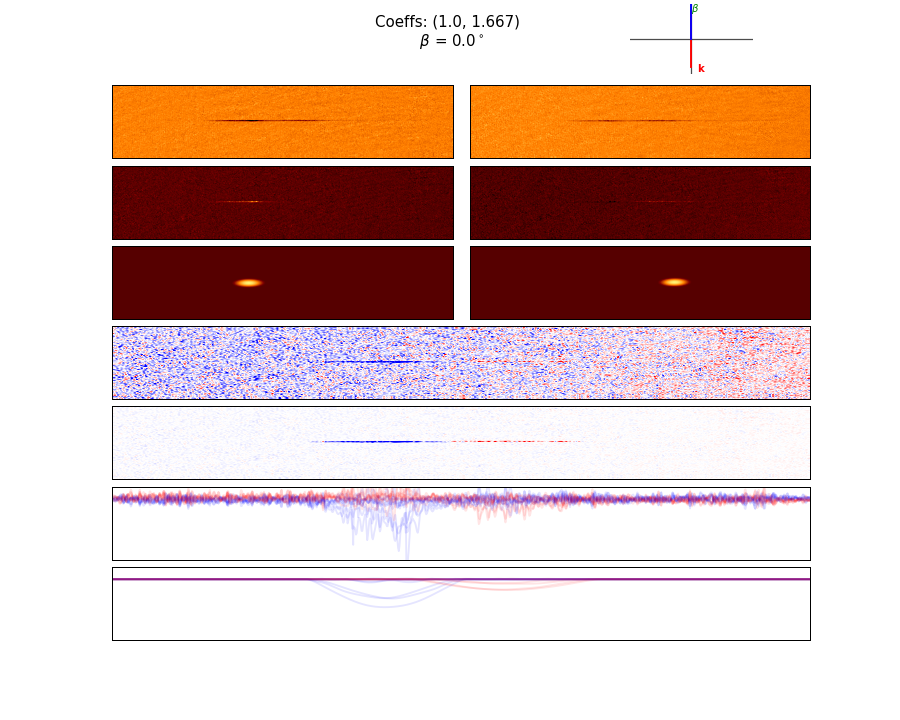

                     Spin -1         Spin 0     
ncount          :    -9.59E+10       -1.19E+11   
ntherm          :    0.00E+00        0.00E+00    
ntf             :    5.62E+06        8.67E+06    
tx              :    1.07E-08        1.13E-08    
tz              :    2.06E-06        2.88E-06    
mux             :    1.47E-31        1.56E-31    
muz             :    2.85E-29        3.97E-29    
mun             :    1.08E-30        1.29E-30    
--------------------------------------------------
offset          :    -5.34E-15       2.00E-14    
amp             :    1.37E+00        4.40E-01    
angle           :    1.27E-02        1.72E-02    
center_x        :    1.35E+02        1.36E+02    
center_y        :    3.88E+02        5.57E+02    
tf_a            :    2.97E+15        3.77E+15    
tf_w_x          :    2.11E+00        2.17E+00    
tf_w_y          :    1.17E+02        1.38E+02    


In [651]:
n_tf_1 = []
n_tf_2 = []
i = 200
vmin_s, vmax_s = [-8.8e+15, 1.8e15]
upscale_factor = 1
rot_angle = 1/2*(output[1][4].beta[2]*180/np.pi + output[2][4].beta[2]*180/np.pi)  # or about 0.9
ev = 1
y_cut_low  = (145-5)*upscale_factor
y_cut_high = (145+5)*upscale_factor

spin1, s1_fit, s1_fitguess, s1_fitted_vars, s1_odrout = output[1]
spin2, s2_fit, s2_fitguess, s2_fitted_vars, s2_odrout = output[2]

ang1_ = rot_up(ang1, angle=rot_angle, scale=upscale_factor)
ang2_ = rot_up(ang2, angle=rot_angle, scale=upscale_factor)
spin1_ = rot_up(spin1, angle=rot_angle, scale=upscale_factor)
spin2_ = rot_up(spin2, angle=rot_angle, scale=upscale_factor)
s1_fit_ = rot_up(s1_fit, angle=rot_angle, scale=upscale_factor)
s2_fit_ = rot_up(s2_fit, angle=rot_angle, scale=upscale_factor)
s1_fitguess_ = rot_up(s1_fitguess, angle=rot_angle, scale=upscale_factor)
s2_fitguess_ = rot_up(s2_fitguess, angle=rot_angle, scale=upscale_factor)


fig = plt.figure(figsize=(10,8))
fig.suptitle(f"Coeffs: {round(coeffs[0]/coeffs[2], 3), round(coeffs[1]/coeffs[3], 3)} \n $\\beta$ = {round((beta/np.pi*180), 3)}$^\circ$" )
gs = GridSpec(7, 2, width_ratios=[1, 1], height_ratios=[1, 1, 1, 1, 1, 1, 1], hspace=0.1, wspace=0.05)
ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[0, 1])#, sharex=ax1, sharey=ax1)  
ax3 = fig.add_subplot(gs[1, 0])#, sharex=ax1, sharey=ax1)
ax4 = fig.add_subplot(gs[1, 1])#, sharex=ax1, sharey=ax1)
ax3_f = fig.add_subplot(gs[2, 0])#, sharex=ax1, sharey=ax1)
ax4_f = fig.add_subplot(gs[2, 1])#, sharex=ax1, sharey=ax1)
ax5 = fig.add_subplot(gs[3, :], sharex=ax1, sharey=ax1)
ax5_f = fig.add_subplot(gs[4, :])
ax6 = fig.add_subplot(gs[5, :])
ax7 = fig.add_subplot(gs[6, :])

mask_fit = s1_fit_ + s2_fit_ # Mask using the fit - instead of masking, just multiply with the fit. better, and easier. 
mask_lim = 2e14
total_spin = spin1_ - spin2_
total_spin[(mask_fit > -mask_lim) & (mask_fit < mask_lim)] *= 0.1

ax1.imshow(ang1_, vmin=-2, vmax=2, cmap="afmhot_r", aspect='auto')
ax2.imshow(ang2_, vmin=-2, vmax=2, cmap="afmhot_r", aspect='auto')
ax3.imshow(spin1_, vmin=vmin_s, vmax=vmax_s, cmap="afmhot_r", aspect='auto')
ax4.imshow(spin2_, vmin=vmin_s, vmax=vmax_s, cmap="afmhot_r", aspect='auto')    
ax3_f.imshow(s1_fitguess_, vmin=vmin_s, vmax=vmax_s, cmap="afmhot_r", aspect='auto')
ax4_f.imshow(s2_fitguess_, vmin=vmin_s, vmax=vmax_s, cmap="afmhot_r", aspect='auto')
ax5.imshow(spin1_ - spin2_, vmin=-vmax_s, vmax=vmax_s, cmap="bwr", aspect='auto')
ax5_f.imshow(total_spin, vmin=-vmax_s, vmax=vmax_s, cmap="bwr", aspect='auto')
# ax5_f.imshow(s1_fit_ - s2_fit_, vmin=-vmax_s, vmax=vmax_s, cmap="bwr", aspect='auto')

## Angle Indicator
ax_inset = inset_axes(ax2, width="80%", height="80%", loc='upper right', bbox_to_anchor=(0.4, 1, 0.45, 1.2), bbox_transform=ax2.transAxes)
ax_inset.axhline(y=0, xmin=-1, xmax=1, c='k', alpha=0.7, lw=1)
ax_inset.axvline(x=0, ymin=-1, ymax=1, c='k', alpha=0.7, lw=1)
ax_inset.plot([0, 0], [-0.8, 0.8], c='r')
ax_inset.text(0.1, -0.9, "k", c='r', fontweight="bold", fontsize=8)
ax_inset.plot([0, np.sin(beta)], [0, np.cos(beta)], c='b')
ax_inset.text(1.3*np.sin(beta), 1.3*np.cos(beta), "B", c='b', fontweight="bold", fontsize=8)

if beta < 0:
    arc = Arc((0, 0), 1, 1, angle=0, theta1=90, theta2=90-(beta/np.pi*180), edgecolor='g', lw=1)
    ax_inset.text(0.8*np.sin(beta/2), 0.8*np.cos(beta/2), "$\\beta$", c='g', fontsize=8)
else: 
    arc = Arc((0, 0), 1, 1, angle=0, theta1=90-(beta/np.pi*180), theta2=90, edgecolor='g', lw=1)
    ax_inset.text(0.8*np.sin(beta/2), 0.8*np.cos(beta/2), "$\\beta$", c='g', fontsize=8)

ax_inset.add_patch(arc)    
ax_inset.spines[['right', 'left', 'top', 'bottom']].set_visible(False)
ax_inset.set_ylim([-1, 1])
ax_inset.set_xlim([-1, 1])


for row in range(int(y_cut_low), int(y_cut_high), 1):
    ax6.plot(spin1_[row], c='b', alpha=0.1)
    ax6.plot(spin2_[row], c='r', alpha=0.1)   
    ax6.set_xlim([0, len(spin1_[0])])
    ax6.set_ylim([vmin_s, vmax_s])

for row in range(int(y_cut_low), int(y_cut_high), 1):
    ax7.plot(s1_fit_[row], c='b', alpha=0.1)
    ax7.plot(s2_fit_[row], c='r', alpha=0.1)
    ax7.set_xlim([0, len(spin1_[0])])
    ax7.set_ylim([vmin_s, vmax_s])

for a in [ax1, ax2, ax3, ax4, ax3_f, ax4_f, ax5, ax5_f, ax6, ax7, ax_inset]:
    a.set_xticks([])
    a.set_yticks([])

plt.tight_layout()
plt.show()

#     plt.savefig(f"/home/bec_lab/Desktop/imgs/SOAH/beta_var/{str(i).zfill(4)}.png")
#     i += 1
#     plt.close()
#     clear_output()

var_phy = ["ncount", "ntherm", "ntf", "tx", "tz", "mux", "muz", "mun"]
var_fit = ["offset", "amp", "angle", "center_x", "center_y", "tf_a", "tf_w_x", "tf_w_y"]
print(f'{" ": ^16} {"Spin -1": ^15} {"Spin 0": ^15}')
for i in range(8):
    print(f"{var_phy[i]: <16}: {'%.2E' % Decimal(output[1][3][i]): ^15} {'%.2E' % Decimal(output[2][3][i]): ^15}")

print('-'*50)
for v in range(8):
    print(f"{var_fit[v]: <16}: {'%.2E' % Decimal(output[1][4].beta[v]): ^15} {'%.2E' % Decimal(output[2][4].beta[v]): ^15}")
    
n_tf_1.append(output[1][3][2])
n_tf_2.append(output[2][3][2])


In [627]:
#CAREFUL - takes 51 mins
# ### Do the suicadal loop - I expect some fits to be messed up, but some data should be good. 

# all_vars = []
# all_fitted_vars = []
# betas = np.linspace(-2*np.pi/3, 2*np.pi/3, 101)
# vmin_s, vmax_s = [-8.8e+15, 1.8e15]
# upscale_factor = 1
# rot_angle = 1/2*(output[1][4].beta[2]*180/np.pi + output[2][4].beta[2]*180/np.pi)  # or about 0.9
# beta= np.pi/4
# ev = 1
# y_cut_low  = (145-5)*upscale_factor
# y_cut_high = (145+5)*upscale_factor

# i = 0

# for beta in betas:
#     output, coeffs = spin_reconstruction(ang1, ang2, beta=beta, shift=-1, fit=True, mode="tf", extra_var=1)
#     spin1, s1_fit, s1_fitguess, s1_fitted_vars, s1_odrout = output[1]
#     spin2, s2_fit, s2_fitguess, s2_fitted_vars, s2_odrout = output[2]

#     ang1_ = rot_up(ang1, angle=rot_angle, scale=upscale_factor)
#     ang2_ = rot_up(ang2, angle=rot_angle, scale=upscale_factor)
#     spin1_ = rot_up(spin1, angle=rot_angle, scale=upscale_factor)
#     spin2_ = rot_up(spin2, angle=rot_angle, scale=upscale_factor)
#     s1_fit_ = rot_up(s1_fit, angle=rot_angle, scale=upscale_factor)
#     s2_fit_ = rot_up(s2_fit, angle=rot_angle, scale=upscale_factor)
#     s1_fitguess_ = rot_up(s1_fitguess, angle=rot_angle, scale=upscale_factor)
#     s2_fitguess_ = rot_up(s2_fitguess, angle=rot_angle, scale=upscale_factor)


#     fig = plt.figure(figsize=(10,8))
#     fig.suptitle(f"Coeffs: {round(coeffs[0]/coeffs[2], 3), round(coeffs[1]/coeffs[3], 3)} \n $\\beta$ = {round((beta/np.pi*180), 3)}$^\circ$" )
#     gs = GridSpec(7, 2, width_ratios=[1, 1], height_ratios=[1, 1, 1, 1, 1, 1, 1], hspace=0.1, wspace=0.05)
#     ax1 = fig.add_subplot(gs[0, 0])
#     ax2 = fig.add_subplot(gs[0, 1])#, sharex=ax1, sharey=ax1)  
#     ax3 = fig.add_subplot(gs[1, 0])#, sharex=ax1, sharey=ax1)
#     ax4 = fig.add_subplot(gs[1, 1])#, sharex=ax1, sharey=ax1)
#     ax3_f = fig.add_subplot(gs[2, 0])#, sharex=ax1, sharey=ax1)
#     ax4_f = fig.add_subplot(gs[2, 1])#, sharex=ax1, sharey=ax1)
#     ax5 = fig.add_subplot(gs[3, :], sharex=ax1, sharey=ax1)
#     ax5_f = fig.add_subplot(gs[4, :])
#     ax6 = fig.add_subplot(gs[5, :])
#     ax7 = fig.add_subplot(gs[6, :])

#     mask_fit = s1_fit_ + s2_fit_ # Mask using the fit - instead of masking, just multiply with the fit. better, and easier. 
#     mask_lim = 2e14
#     total_spin = spin1_ - spin2_
#     total_spin[(mask_fit > -mask_lim) & (mask_fit < mask_lim)] *= 0.1

#     ax1.imshow(ang1_, vmin=-2, vmax=2, cmap="afmhot_r", aspect='auto')
#     ax2.imshow(ang2_, vmin=-2, vmax=2, cmap="afmhot_r", aspect='auto')
#     ax3.imshow(spin1_, vmin=vmin_s, vmax=vmax_s, cmap="afmhot_r", aspect='auto')
#     ax4.imshow(spin2_, vmin=vmin_s, vmax=vmax_s, cmap="afmhot_r", aspect='auto')    
#     ax3_f.imshow(s1_fit_, vmin=vmin_s, vmax=vmax_s, cmap="afmhot_r", aspect='auto')
#     ax4_f.imshow(s2_fit_, vmin=vmin_s, vmax=vmax_s, cmap="afmhot_r", aspect='auto')
#     ax5.imshow(total_spin, vmin=-vmax_s, vmax=vmax_s, cmap="bwr", aspect='auto')
#     ax5_f.imshow(s1_fit_ - s2_fit_, vmin=-vmax_s, vmax=vmax_s, cmap="bwr", aspect='auto')

#     ## Angle Indicator
#     ax_inset = inset_axes(ax2, width="80%", height="80%", loc='upper right', bbox_to_anchor=(0.4, 1, 0.45, 1.2), bbox_transform=ax2.transAxes)
#     ax_inset.axhline(y=0, xmin=-1, xmax=1, c='k', alpha=0.7, lw=1)
#     ax_inset.axvline(x=0, ymin=-1, ymax=1, c='k', alpha=0.7, lw=1)
#     ax_inset.plot([0, 0], [-0.8, 0.8], c='r')
#     ax_inset.text(0.1, -0.9, "k", c='r', fontweight="bold", fontsize=8)
#     ax_inset.plot([0, np.sin(beta)], [0, np.cos(beta)], c='b')
#     ax_inset.text(1.3*np.sin(beta), 1.3*np.cos(beta), "B", c='b', fontweight="bold", fontsize=8)

#     if beta < 0:
#         arc = Arc((0, 0), 1, 1, angle=0, theta1=90, theta2=90-(beta/np.pi*180), edgecolor='g', lw=1)
#         ax_inset.text(0.8*np.sin(beta/2), 0.8*np.cos(beta/2), "$\\beta$", c='g', fontsize=8)
#     else: 
#         arc = Arc((0, 0), 1, 1, angle=0, theta1=90-(beta/np.pi*180), theta2=90, edgecolor='g', lw=1)
#         ax_inset.text(0.8*np.sin(beta/2), 0.8*np.cos(beta/2), "$\\beta$", c='g', fontsize=8)

#     ax_inset.add_patch(arc)    
#     ax_inset.spines[['right', 'left', 'top', 'bottom']].set_visible(False)
#     ax_inset.set_ylim([-1, 1])
#     ax_inset.set_xlim([-1, 1])


#     for row in range(int(y_cut_low), int(y_cut_high), 1):
#         ax6.plot(spin1_[row], c='b', alpha=0.1)
#         ax6.plot(spin2_[row], c='r', alpha=0.1)   
#         ax6.set_xlim([0, len(spin1_[0])])
#         ax6.set_ylim([vmin_s, vmax_s])

#     for row in range(int(y_cut_low), int(y_cut_high), 1):
#         ax7.plot(s1_fit_[row], c='b', alpha=0.1)
#         ax7.plot(s2_fit_[row], c='r', alpha=0.1)
#         ax7.set_xlim([0, len(spin1_[0])])
#         ax7.set_ylim([vmin_s, vmax_s])

#     for a in [ax1, ax2, ax3, ax4, ax3_f, ax4_f, ax5, ax5_f, ax6, ax7, ax_inset]:
#         a.set_xticks([])
#         a.set_yticks([])

# #     plt.tight_layout()
# #     plt.show()

#     plt.savefig(f"/home/bec_lab/Desktop/imgs/SOAH/beta_var_fitting/{str(i).zfill(4)}.png")
#     i += 1
#     plt.close()
#     clear_output()

#     all_vars.append([output[1][3], output[2][3]])
#     all_fitted_vars.append([output[1][4].beta, output[2][4].beta])


In [648]:
output[1][4].beta

array([-5.34050049e-15,  1.36639966e+00,  1.27314517e-02,  1.34897017e+02,
        3.87848567e+02,  2.96773879e+15,  2.10788298e+00,  1.17059132e+02])

<IPython.core.display.Javascript object>


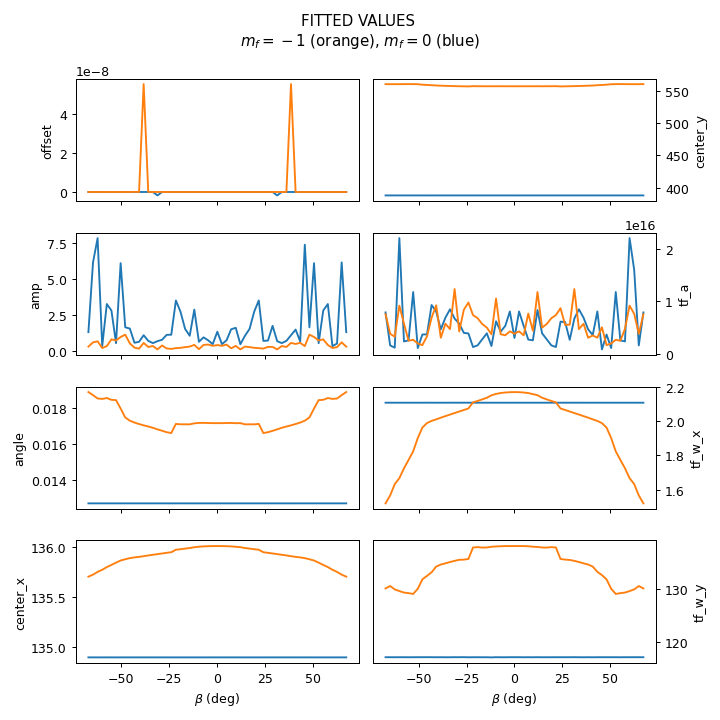

In [650]:
fig, ax = plt.subplots(4,2, figsize=(8,8), sharex=True)
c_ind = 22

for i in range(8):
    if i < 4:
        j=0
    else: 
        j=1
        ax[i%4][j].yaxis.set_label_position("right")
        ax[i%4][j].yaxis.tick_right()

    ax[i%4][j].plot(betas[c_ind:-c_ind]*180/np.pi, [el[0][i] for el in all_fitted_vars[c_ind:-c_ind]], c='C0')
    ax[i%4][j].plot(betas[c_ind:-c_ind]*180/np.pi, [el[1][i] for el in all_fitted_vars[c_ind:-c_ind]], c='C1')
    ax[i%4][j].set_ylabel(var_fit[i])
#     ax[i%4][j].set_yticks([])
    


ax[3][0].set_xlabel(r"$\beta$ (deg)")
ax[3][1].set_xlabel(r"$\beta$ (deg)")
plt.suptitle("FITTED VALUES \n$m_f = -1$ (orange), $m_f=0$ (blue)")
plt.tight_layout()

plt.show()

<IPython.core.display.Javascript object>


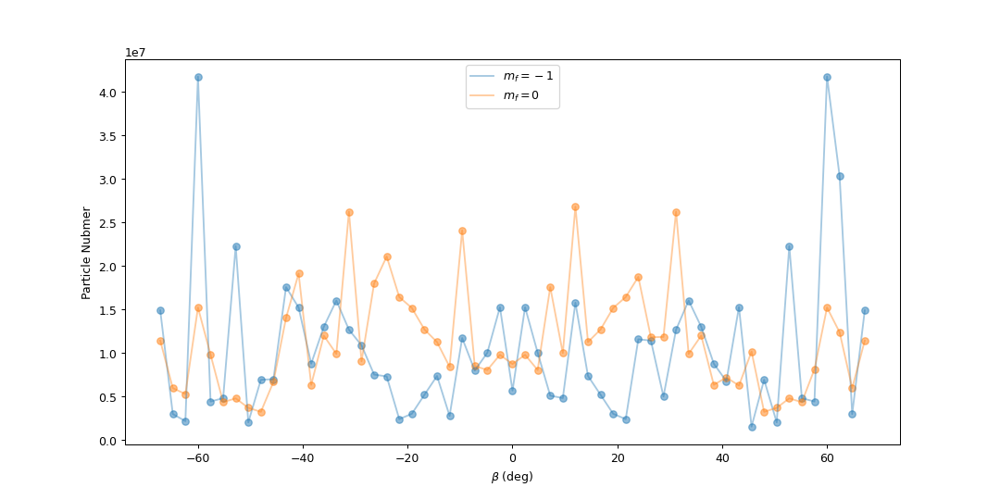

In [626]:
c_ind = 22

ntf_1 = [el[0][2] for el in all_vars[c_ind:-c_ind]]
ntf_2 = [el[1][2] for el in all_vars[c_ind:-c_ind]]

plt.figure(figsize=(12,6))
plt.scatter(betas[c_ind:-c_ind]*180/np.pi, ntf_1, c='C0', alpha=0.5)
plt.plot(betas[c_ind:-c_ind]*180/np.pi, ntf_1, c='C0', alpha=0.4, label="$m_f = -1$")
plt.scatter(betas[c_ind:-c_ind]*180/np.pi, ntf_2, c='C1', alpha=0.5)
plt.plot(betas[c_ind:-c_ind]*180/np.pi, ntf_2, c='C1', alpha=0.4, label="$m_f = 0$")
plt.xlabel(r"$\beta$ (deg)")
plt.ylabel(r"Particle Nubmer")

plt.legend()
plt.show()

#### Reconstruction - FFT? 

In [124]:
fftimage = np.fft.fftshift(np.fft.fft2(pic1))
pad_image = np.pad(fftimage, pad_width=((500, 500), (500, 500)), mode='constant', constant_values=0)
upscaled = np.fft.ifft2(pad_image)

<IPython.core.display.Javascript object>


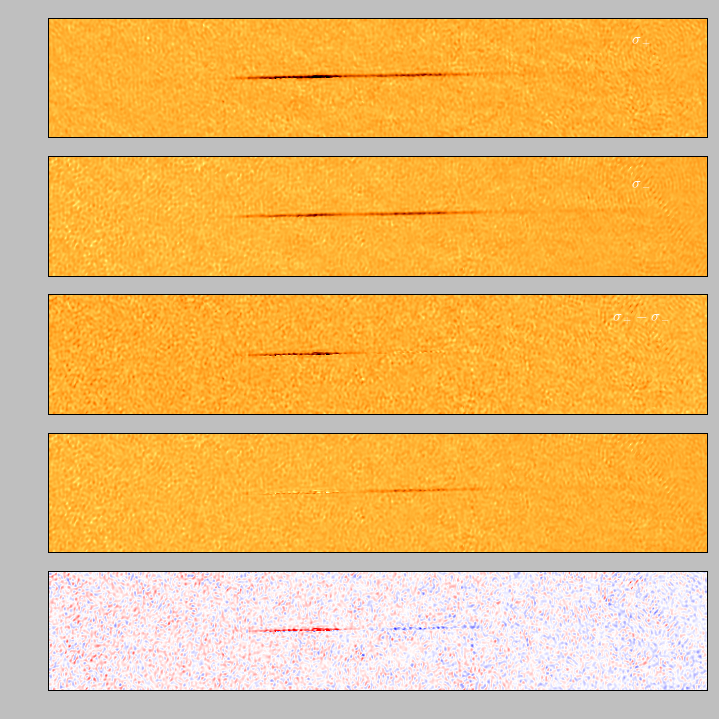

In [215]:
import warnings
warnings.filterwarnings('ignore')

fig, ax = plt.subplots(5, 1, figsize=(10, 10), sharex=True, sharey=True)
ax[0].text(0.9, 0.8, "$\sigma_+$", 
          horizontalalignment='center', 
          verticalalignment='center', 
          fontsize = 15,
          c='w',
          transform=ax[0].transAxes)

ax[1].text(0.9, 0.8, "$\sigma_-$", 
          horizontalalignment='center',
          verticalalignment='center',
          fontsize = 15,
          c='w',
          transform=ax[1].transAxes)

ax[2].text(0.9, 0.8, "$\sigma_+ - \sigma_-$", 
          horizontalalignment='center',
          verticalalignment='center',
          fontsize = 15,
          c='w',
          transform=ax[2].transAxes)



spin1 = upscale2(ang1, 8, t="linear") - shift_rows_down(upscale2(ang2, 8, t="linear"), -5)
spin2 = -3/6*upscale2(ang1, 8, t="linear") + shift_rows_down(upscale2(ang2, 8, t="linear"), -7)


ax[0].imshow
ax[0].imshow(upscale2(ang1, 8, t="linear"), vmin=-2, vmax=3, cmap="afmhot_r", aspect='auto')
ax[1].imshow(upscale2(ang2, 8, t="linear"), vmin=-2, vmax=3, cmap="afmhot_r", aspect='auto')
ax[2].imshow(spin1, vmin=-2, vmax=3, cmap="afmhot_r", aspect='auto')
ax[3].imshow(spin2, vmin=-2, vmax=3, cmap="afmhot_r", aspect='auto')
ax[4].imshow(spin1 - spin2, vmin=-2, vmax=2, cmap="bwr", aspect='auto')
plt.tight_layout()

for a in ax:
    a.set_yticks([])
    a.set_xticks([])
    a.set_ylim([70*8, 200*8])

plt.show()


<IPython.core.display.Javascript object>


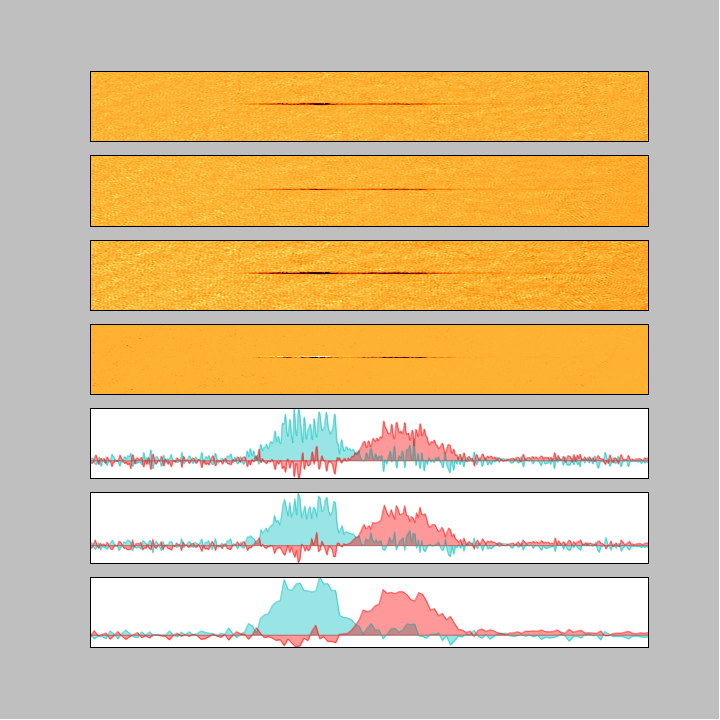

In [156]:
fig, ax = plt.subplots(7, 1, figsize=(10, 10))

comb_pic_1 = (pic1 + pic2)*(pic1-pic2) 
comb_pic_2 = (pic1 + pic2)*(pic2-0.44*pic1)


ax[0].imshow(pic1, vmin=-2, vmax=3, cmap="afmhot_r", aspect='auto')
ax[1].imshow(pic2, vmin=-2, vmax=3, cmap="afmhot_r", aspect='auto')
ax[2].imshow(pic1+pic2, vmin=-2, vmax=3, cmap="afmhot_r", aspect='auto')
ax[3].imshow(comb_pic_2, vmin=-2, vmax=3, cmap="afmhot_r", aspect='auto')


i = 4
for bin_factor in [1, 3, 7]:
    # Try different binnings
    linecut_profile_1 = np.array([pic1[lc_1_small][i:i+bin_factor].sum()/bin_factor for i in range(0, pic1[lc_1_small].shape[0], bin_factor)])
    linecut_profile_2 = np.array([pic2[lc_2_small][i:i+bin_factor].sum()/bin_factor for i in range(0, pic2[lc_2_small].shape[0], bin_factor)])

    # Double TF fitting
    xdata = np.arange(len(linecut_profile_1))
    p0i = [1, 15, 380/bin_factor, 1, 18, 550/bin_factor]
    params1, params_covariance = curve_fit(double_thomas_fermi, xdata, linecut_profile_1, p0=p0i, maxfev = 100000000)
    params2, params_covariance = curve_fit(double_thomas_fermi, xdata, linecut_profile_2, p0=p0i, maxfev = 100000000)
    y_fit1 = double_thomas_fermi(xdata, *params1)
    y_fit2 = double_thomas_fermi(xdata, *params2)
    y_guess2 = double_thomas_fermi(xdata, *p0i)
    y_fit3 = thomasfermi1D(xdata, *params1[3:])

    linecut_profile_3 = linecut_profile_1-linecut_profile_2   # spin -1
#     linecut_profile_3 = (linecut_profile_1)*(y_fit1-1.1*y_fit2)   # spin -1
    linecut_profile_4 = (linecut_profile_2 -0.5*linecut_profile_1)+0.5*y_fit3 # spin 0
#     linecut_profile_4 = (linecut_profile_2)*5*(y_fit2-0.66*y_fit1) # spin 0
    
    ax[i].plot(linecut_profile_3, c='C3', alpha=0.4)
    ax[i].plot(linecut_profile_4, c='C2', alpha=0.4)
#     ax[i].plot(linecut_profile_1, c='C0', alpha=0.4)
#     ax[i].plot(linecut_profile_2, c='C1', alpha=0.4)
#     ax[i].plot(y_fit4, c='C3', alpha=0.4, lw=2, ls='--')
#     ax[i].plot(y_fit3, c='C2', alpha=0.4, lw=2, ls='--')
#     ax[i].plot(y_fit1, c='C0', alpha=0.4, lw=2, ls='--')
#     ax[i].plot(y_fit2, c='C1', alpha=0.4, lw=2, ls='--')
    ax[i].fill_between(xdata, 0, linecut_profile_3, color='C3', alpha=0.4, label="$\sigma_-$")
    ax[i].fill_between(xdata, 0, linecut_profile_4, color='C2', alpha=0.4, label="$\sigma_-$")
#     ax[i].fill_between(xdata, 0, linecut_profile_1, color='C0', alpha=0.4, label="$\sigma_+$")
#     ax[i].fill_between(xdata, 0, linecut_profile_2, color='C1', alpha=0.4, label="$\sigma_-$")

#     # ----- SPIN PROCESSING ------
#     spin1 = linecut_profile_1 - linecut_profile_2
#     spin2 = linecut_profile_2 - 3/6 * linecut_profile_1  # 3/5 factor is theoretical - try the other ratio we found
    
#     # Single TF fitting
#     xdata = np.arange(len(linecut_profile_1))
#     p0i_1 = [1, 15, 380/bin_factor]
#     p0i_2 = [1, 15, 550/bin_factor]
#     params1, params_covariance = curve_fit(thomasfermi1D, xdata, spin1, p0=p0i_1, maxfev = 100000000)
#     params2, params_covariance = curve_fit(thomasfermi1D, xdata, spin2, p0=p0i_2, maxfev = 100000000)
#     y_fit1 = thomasfermi1D(xdata, *params1)
#     y_fit2 = thomasfermi1D(xdata, *params2)
    
#     ax[i].plot(spin1, c='C2', alpha=0.2)
#     ax[i].plot(spin2, c='C3', alpha=0.2)
#     ax[i].plot(y_fit1, c='C2', alpha=0.2, lw=2, ls='--')
#     ax[i].plot(y_fit2, c='C3', alpha=0.2, lw=2, ls='--')
#     ax[i].fill_between(xdata, 0, spin1, color='C2', alpha=0.4,label="$m_f$ =-1")
#     ax[i].fill_between(xdata, 0, spin2, color='C3', alpha=0.4, label="$m_f$ = 0")
#     ax[i].set_ylabel(f"bin = {bin_factor}")

#     ax[i].set_ylim(-1.5, 2)
#     ax[i].set_ylim(-1.5, 2)
    i += 1

for a in ax:
    a.set_xticks([])
    a.set_yticks([])
    

plt.show()

#### Masked 2D Plots - Full Spin Reconstruction 

<IPython.core.display.Javascript object>


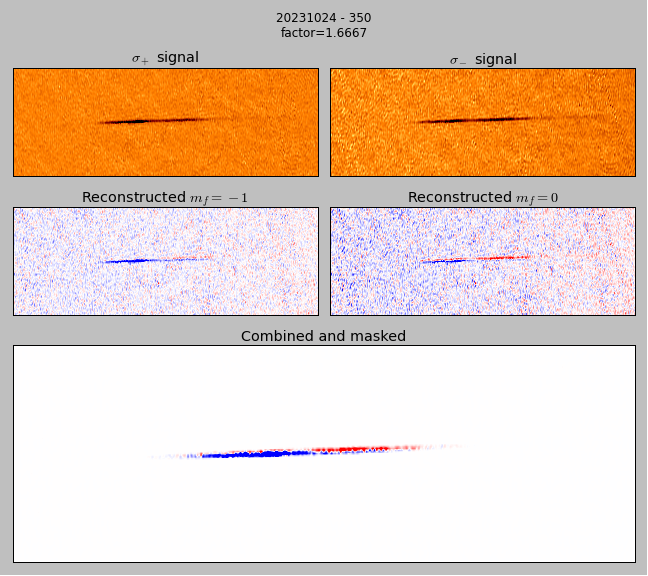

In [129]:
i = 0
for factor in [5/3]:# np.linspace(0, 3, 201):
    shift = -0
    # ---- Data
    spin1_full_norot = ang1 - shift_rows_down(ang2, int(shift))
    spin2_full_norot = factor*shift_rows_down(ang2, int(shift)) - ang1
    mask_fit = fit1[1]+fit2[1] # Mask using the fit - instead of masking, just multiply with the fit. better, and easier. 
    mask_lim = 0.005
    full = spin1_full_norot - spin2_full_norot

#     spin1_full_norot[(mask_fit > -mask_lim) & (mask_fit < mask_lim)] = 0
#     spin2_full_norot[(mask_fit > -mask_lim) & (mask_fit < mask_lim)] = 0
#     full[(mask_fit > -mask_lim) & (mask_fit < mask_lim)] = 0

    # --- Plotting 
    gs = GridSpec(3, 2, height_ratios=[1, 1, 2])
    fig = plt.figure(figsize=(9, 8))
    fig.suptitle(f"{date} - {shot}\nfactor={round(factor, 4)}")
    ax1 = fig.add_subplot(gs[0, 0])
    ax2 = fig.add_subplot(gs[0, 1], sharey=ax1, sharex=ax1)
    ax3 = fig.add_subplot(gs[1, 0], sharey=ax1, sharex=ax1)
    ax4 = fig.add_subplot(gs[1, 1], sharey=ax1, sharex=ax1)
    ax5 = fig.add_subplot(gs[2, :], sharey=ax1, sharex=ax1)

    ax1.imshow(ang1, vmin=-2, vmax=2, cmap="afmhot_r", aspect='auto')
    ax2.imshow(factor*shift_rows_down(ang2, int(shift)), vmin=-2, vmax=2, cmap="afmhot_r", aspect='auto')
    ax3.imshow(-spin1_full_norot, vmin=-1, vmax=1, cmap="bwr", aspect='auto')
    ax4.imshow(spin2_full_norot, vmin=-1, vmax=1, cmap="bwr", aspect='auto')
    im = ax5.imshow(-full*(mask_fit), vmin=-2, vmax=2., cmap="bwr", aspect='auto')

    ax1.set_title("$\sigma_+$ signal")
    ax2.set_title("$\sigma_-$ signal")
    ax3.set_title("Reconstructed $m_f = -1$")
    ax4.set_title("Reconstructed $m_f = 0$")
    ax5.set_title("Combined and masked")

    # cbar = plt.colorbar(im, ax=ax5, ticks=[-1, 1], aspect=35)
    # cbar.ax.set_yticklabels(['-1', '0'])  # vertically oriented colorbar
    # cbar.ax.set_ylabel('Normalized Magnetization')

    for a in [ax1, ax2, ax3, ax4, ax5]:
        a.set_yticks([])
        a.set_xticks([])
        a.set_ylim([70, 200])

    plt.tight_layout()
#     plt.savefig(f"/home/bec_lab/Desktop/imgs/SOAH/OAH_missmatch/subtr_frac/{str(i).zfill(4)}.png")
    plt.show()
    i += 1


<IPython.core.display.Javascript object>


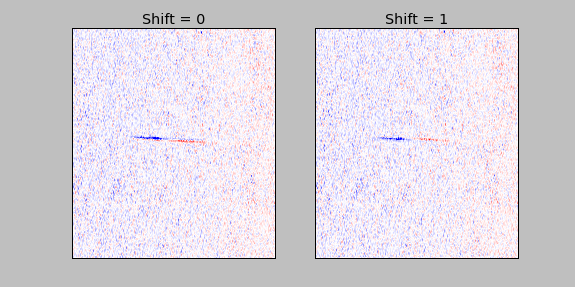

In [130]:
fig, ax = plt.subplots(1, 2, figsize=(8,4), sharex=True, sharey=True)

for i in [0, 1]:
    spin1_full_norot = ang1 - shift_rows_down(ang2, -int(i))
    spin2_full_norot = shift_rows_down(ang2, -int(i)) - 0.5*ang1
#     mask_fit = fit1[1]+fit2[1] # Mask using the fit
    mask_lim = 0.005
    full = spin1_full_norot - spin2_full_norot

#     spin1_full_norot[(mask_fit > -mask_lim) & (mask_fit < mask_lim)] = 0
#     spin2_full_norot[(mask_fit > -mask_lim) & (mask_fit < mask_lim)] = 0
#     full[(mask_fit ""> -mask_lim) & (mask_fit < mask_lim)] = 0

    ax[i].imshow(-full, vmin=-2., vmax=2., cmap="bwr", aspect="auto")
    ax[i].set_title(f"Shift = {i}")
    
for a in ax:
    a.set_yticks([])
    a.set_xticks([])
plt.show()


<IPython.core.display.Javascript object>


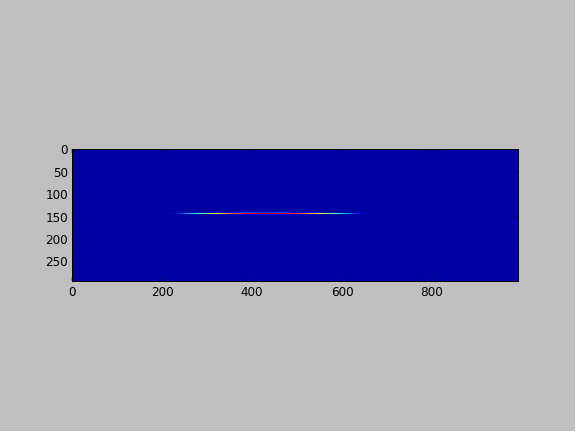

In [146]:
plt.figure()
plt.imshow(fitresult1_rot)
plt.show()

In [138]:
fitresult2_rot.shape

(292, 993)

In [139]:
mask = upscale2(fitresult1_rot + fitresult2_rot, 8, t="linear")
spin1 = upscale2(ang1_rot, 8, t="linear") - shift_rows_down(upscale2(ang2_rot, 8, t="linear"), -5)
spin2 = -3/6*upscale2(ang1_rot, 8, t="linear") + shift_rows_down(upscale2(ang2_rot, 8, t="linear"), -7)


In [145]:
spin1.shape

(2336, 7944)

In [137]:
ang1_rot.shape

(292, 993)

<IPython.core.display.Javascript object>


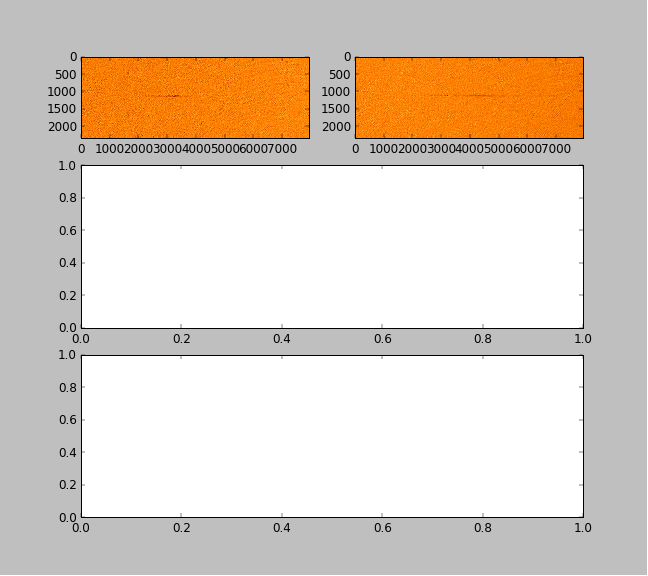

ValueError: operands could not be broadcast together with shapes (2530,7999) (2240,7920) 

In [134]:
lc_1 = np.where(fitresult1_rot == fitresult1_rot.max())[0][0]
lc_2 = np.where(fitresult2_rot == fitresult2_rot.max())[0][0]
cut_strip = 60
bin_factor= 1
lc_1_small = lc_1 - cut_strip
lc_2_small = lc_2 - cut_strip
pic1 = ang1_rot[cut_strip:-cut_strip, :]
pic2 = ang2_rot[cut_strip:-cut_strip, :]

#
# gs = GridSpec(4, 2)#, height_ratios=[1, 1, 1, 1, 1, 2, 2])
# fig = plt.figure(figsize=(9, 8))
# ax00 = fig.add_subplot(gs[0, 0])
# ax01 = fig.add_subplot(gs[0, 1], sharey=ax00, sharex=ax00)
# ax10 = fig.add_subplot(gs[1, 0])
# ax11 = fig.add_subplot(gs[1, 1])
# ax20 = fig.add_subplot(gs[2, 0])
# ax21 = fig.add_subplot(gs[2, 1])
# ax30 = fig.add_subplot(gs[3, 0])
# ax31 = fig.add_subplot(gs[3, 1])
#
# fig.suptitle("Density Profiles")
#
# # Normal, rotated image, with linecut indicators
# ax00.imshow(pic1, vmin=-2, vmax=3, cmap="afmhot_r", aspect='auto')
# ax01.imshow(pic2, vmin=-2, vmax=3, cmap="afmhot_r", aspect='auto')
# ax00.axhline(y = lc_1_small, alpha=0.15, c='k', ls='--')
# ax01.axhline(y = lc_2_small, alpha=0.15, c='k', ls='--')
# ax00.text(0.9, 0.8, "$\sigma_+$",
#           horizontalalignment='center',
#           verticalalignment='center',
#           fontsize = 15,
#           c='w',
#           transform=ax00.transAxes)
# ax01.text(0.9, 0.8, "$\sigma_-$",
#           horizontalalignment='center',
#           verticalalignment='center',
#           fontsize = 15,
#           c='w',
#           transform=ax01.transAxes)
#
#
# # LINECUTS - Different binnings
# ax = [[ax10, ax11],
#       [ax20, ax21],
#       [ax30, ax31],
#       ]
# i = 0
# allparams_save = []
# alllinecuts_save = []
# for bin_factor in [1, 3, 7]:
#     # Try different binnings
#     linecut_profile_1 = np.array([pic1[lc_1_small][i:i+bin_factor].sum()/bin_factor for i in range(0, pic1[lc_1_small].shape[0], bin_factor)])
#     linecut_profile_2 = np.array([pic2[lc_2_small][i:i+bin_factor].sum()/bin_factor for i in range(0, pic2[lc_2_small].shape[0], bin_factor)])
#
#     # Double TF fitting
#     xdata = np.arange(len(linecut_profile_1))
#     p0i = [1, 15, 380/bin_factor, 1, 18, 550/bin_factor]
#     params1, params_covariance = curve_fit(double_thomas_fermi, xdata, linecut_profile_1, p0=p0i, maxfev = 100000000)
#     params2, params_covariance = curve_fit(double_thomas_fermi, xdata, linecut_profile_2, p0=p0i, maxfev = 100000000)
#     allparams_save.append([params1, params2])
#     alllinecuts_save.append([linecut_profile_1, linecut_profile_2])
#     y_fit1 = double_thomas_fermi(xdata, *params1)
#     y_fit2 = double_thomas_fermi(xdata, *params2)
#     y_guess2 = double_thomas_fermi(xdata, *p0i)
#
#     ax[i][0].plot(linecut_profile_1, c='C0', alpha=0.4)
#     ax[i][0].plot(linecut_profile_2, c='C1', alpha=0.4)
#     ax[i][0].plot(y_fit1, c='C0', alpha=0.4, lw=2, ls='--')
#     ax[i][0].plot(y_fit2, c='C1', alpha=0.4, lw=2, ls='--')
#     ax[i][0].fill_between(xdata, 0, linecut_profile_1, color='C0', alpha=0.4, label="$\sigma_+$")
#     ax[i][0].fill_between(xdata, 0, linecut_profile_2, color='C1', alpha=0.4, label="$\sigma_-$")
#
#     # ----- SPIN PROCESSING ------
#     spin1 = linecut_profile_1 - linecut_profile_2
#     spin2 = linecut_profile_2 - 3/6 * linecut_profile_1  # 3/5 factor is theoretical - try the other ratio we found
#
#     # Single TF fitting
#     xdata = np.arange(len(linecut_profile_1))
#     p0i_1 = [1, 15, 380/bin_factor]
#     p0i_2 = [1, 15, 550/bin_factor]
#     params1, params_covariance = curve_fit(thomasfermi1D, xdata, spin1, p0=p0i_1, maxfev = 100000000)
#     params2, params_covariance = curve_fit(thomasfermi1D, xdata, spin2, p0=p0i_2, maxfev = 100000000)
#     y_fit1 = thomasfermi1D(xdata, *params1)
#     y_fit2 = thomasfermi1D(xdata, *params2)
#
#     ax[i][1].plot(spin1, c='C2', alpha=0.2)
#     ax[i][1].plot(spin2, c='C3', alpha=0.2)
#     ax[i][1].plot(y_fit1, c='C2', alpha=0.2, lw=2, ls='--')
#     ax[i][1].plot(y_fit2, c='C3', alpha=0.2, lw=2, ls='--')
#     ax[i][1].fill_between(xdata, 0, spin1, color='C2', alpha=0.4, label="$m_f$ =-1")
#     ax[i][1].fill_between(xdata, 0, spin2, color='C3', alpha=0.4, label="$m_f$ = 0")
#     ax[i][0].set_ylabel(f"bin = {bin_factor}")
#
#     ax[i][0].legend()
#     ax[i][1].legend()
#     ax[i][0].set_ylim(-0.5, 4)
#     ax[i][1].set_ylim(-0.5, 2)
#
#     i += 1
#
# for a in [ax00, ax01, ax10, ax11, ax20, ax21, ax30, ax31]:
#     a.set_xticks([])
#     a.set_yticks([])
#
# plt.tight_layout()
# plt.show()


gs = GridSpec(3, 2, height_ratios=[1, 2, 2])
fig = plt.figure(figsize=(9, 8))
axspin1 = fig.add_subplot(gs[0, 0])
axspin2 = fig.add_subplot(gs[0, 1], sharey=axspin1, sharex=axspin1)
ax_comb = fig.add_subplot(gs[1, :])
ax_comb_lc = fig.add_subplot(gs[2, :])

mask = upscale2(fit1[1]+fit2[2], 8, t="linear")
spin1 = upscale2(ang1_rot, 8, t="linear") - shift_rows_down(upscale2(ang2_rot, 8, t="linear"), -5)
spin2 = -3/6*upscale2(ang1_rot, 8, t="linear") + shift_rows_down(upscale2(ang2_rot, 8, t="linear"), -7)

angle_avg = fit1[6].beta[2] * (180 / np.pi) + fit2[6].beta[2] * (180 / np.pi)
comb_spin = rotate((spin1 - spin2), angle_avg, mode='reflect')


axspin1.imshow(spin1, vmin=-2, vmax=3, cmap="afmhot_r", aspect='auto')
axspin2.imshow(spin2, vmin=-2, vmax=3, cmap="afmhot_r", aspect='auto')
ax_comb.imshow(comb_spin*mask, vmin=-1, vmax=1, cmap="bwr", aspect='auto')
plt.tight_layout()

for a in [axspin1, axspin2, ax_comb, ax_comb_lc]:
    a.set_yticks([])
    a.set_xticks([])
    # a.set_ylim([70*8, 200*8])

plt.show()

fig, ax = plt.subplots(7, 1, figsize=(10, 10))

comb_pic_1 = (pic1 + pic2) * (pic1 - pic2)
comb_pic_2 = (pic1 + pic2) * (pic2 - 0.44 * pic1)

ax[0].imshow(pic1, vmin=-2, vmax=3, cmap="afmhot_r", aspect='auto')
ax[1].imshow(pic2, vmin=-2, vmax=3, cmap="afmhot_r", aspect='auto')
ax[2].imshow(pic1 + pic2, vmin=-2, vmax=3, cmap="afmhot_r", aspect='auto')
ax[3].imshow(comb_pic_2, vmin=-2, vmax=3, cmap="afmhot_r", aspect='auto')

i = 4
for bin_factor in [1, 3, 7]:
    # Try different binnings
    linecut_profile_1 = np.array([pic1[lc_1_small][i:i + bin_factor].sum() / bin_factor for i in
                                  range(0, pic1[lc_1_small].shape[0], bin_factor)])
    linecut_profile_2 = np.array([pic2[lc_2_small][i:i + bin_factor].sum() / bin_factor for i in
                                  range(0, pic2[lc_2_small].shape[0], bin_factor)])

    # Double TF fitting
    xdata = np.arange(len(linecut_profile_1))
    p0i = [1, 15, 380 / bin_factor, 1, 18, 550 / bin_factor]
    params1, params_covariance = curve_fit(double_thomas_fermi, xdata, linecut_profile_1, p0=p0i, maxfev=100000000)
    params2, params_covariance = curve_fit(double_thomas_fermi, xdata, linecut_profile_2, p0=p0i, maxfev=100000000)
    y_fit1 = double_thomas_fermi(xdata, *params1)
    y_fit2 = double_thomas_fermi(xdata, *params2)
    y_guess2 = double_thomas_fermi(xdata, *p0i)

    linecut_profile_3 = linecut_profile_1 - linecut_profile_2  # spin -1
    #     linecut_profile_3 = (linecut_profile_1)*(y_fit1-1.1*y_fit2)   # spin -1
    linecut_profile_4 = 2 * (linecut_profile_2 - 0.44 * linecut_profile_1)  # spin 0
    #     linecut_profile_4 = (linecut_profile_2)*5*(y_fit2-0.66*y_fit1) # spin 0

    ax[i].plot(linecut_profile_3, c='C3', alpha=0.4)
    ax[i].plot(linecut_profile_4, c='C2', alpha=0.4)
    #     ax[i].plot(linecut_profile_1, c='C0', alpha=0.4)
    #     ax[i].plot(linecut_profile_2, c='C1', alpha=0.4)
    #     ax[i].plot(y_fit4, c='C3', alpha=0.4, lw=2, ls='--')
    #     ax[i].plot(y_fit3, c='C2', alpha=0.4, lw=2, ls='--')
    #     ax[i].plot(y_fit1, c='C0', alpha=0.4, lw=2, ls='--')
    #     ax[i].plot(y_fit2, c='C1', alpha=0.4, lw=2, ls='--')
    ax[i].fill_between(xdata, 0, linecut_profile_3, color='C3', alpha=0.4, label="$\sigma_-$")
    ax[i].fill_between(xdata, 0, linecut_profile_4, color='C2', alpha=0.4, label="$\sigma_-$")
    #     ax[i].fill_between(xdata, 0, linecut_profile_1, color='C0', alpha=0.4, label="$\sigma_+$")
    #     ax[i].fill_between(xdata, 0, linecut_profile_2, color='C1', alpha=0.4, label="$\sigma_-$")

    #     # ----- SPIN PROCESSING ------
    #     spin1 = linecut_profile_1 - linecut_profile_2
    #     spin2 = linecut_profile_2 - 3/6 * linecut_profile_1  # 3/5 factor is theoretical - try the other ratio we found

    #     # Single TF fitting
    #     xdata = np.arange(len(linecut_profile_1))
    #     p0i_1 = [1, 15, 380/bin_factor]
    #     p0i_2 = [1, 15, 550/bin_factor]
    #     params1, params_covariance = curve_fit(thomasfermi1D, xdata, spin1, p0=p0i_1, maxfev = 100000000)
    #     params2, params_covariance = curve_fit(thomasfermi1D, xdata, spin2, p0=p0i_2, maxfev = 100000000)
    #     y_fit1 = thomasfermi1D(xdata, *params1)
    #     y_fit2 = thomasfermi1D(xdata, *params2)

    #     ax[i].plot(spin1, c='C2', alpha=0.2)
    #     ax[i].plot(spin2, c='C3', alpha=0.2)
    #     ax[i].plot(y_fit1, c='C2', alpha=0.2, lw=2, ls='--')
    #     ax[i].plot(y_fit2, c='C3', alpha=0.2, lw=2, ls='--')
    #     ax[i].fill_between(xdata, 0, spin1, color='C2', alpha=0.4,label="$m_f$ =-1")
    #     ax[i].fill_between(xdata, 0, spin2, color='C3', alpha=0.4, label="$m_f$ = 0")
    #     ax[i].set_ylabel(f"bin = {bin_factor}")

    #     ax[i].set_ylim(-1.5, 2)
    #     ax[i].set_ylim(-1.5, 2)
    i += 1

for a in ax:
    a.set_xticks([])
    a.set_yticks([])

plt.show()




i = 0
for factor in [5/3]:# np.linspace(0, 3, 201):
    shift = -0
    # ---- Data
    spin1_full_norot = ang1 - shift_rows_down(ang2, int(shift))
    spin2_full_norot = factor*shift_rows_down(ang2, int(shift)) - ang1
    mask_fit = fit1[1]+fit2[1] # Mask using the fit - instead of masking, just multiply with the fit. better, and easier.
    mask_lim = 0.005
    full = spin1_full_norot - spin2_full_norot

#     spin1_full_norot[(mask_fit > -mask_lim) & (mask_fit < mask_lim)] = 0
#     spin2_full_norot[(mask_fit > -mask_lim) & (mask_fit < mask_lim)] = 0
#     full[(mask_fit > -mask_lim) & (mask_fit < mask_lim)] = 0

    # --- Plotting
    gs = GridSpec(3, 2, height_ratios=[1, 1, 2])
    fig = plt.figure(figsize=(9, 8))
    fig.suptitle(f"{date} - {shot}\nfactor={round(factor, 4)}")
    ax1 = fig.add_subplot(gs[0, 0])
    ax2 = fig.add_subplot(gs[0, 1], sharey=ax1, sharex=ax1)
    ax3 = fig.add_subplot(gs[1, 0], sharey=ax1, sharex=ax1)
    ax4 = fig.add_subplot(gs[1, 1], sharey=ax1, sharex=ax1)
    ax5 = fig.add_subplot(gs[2, :], sharey=ax1, sharex=ax1)

    ax1.imshow(ang1, vmin=-2, vmax=2, cmap="afmhot_r", aspect='auto')
    ax2.imshow(factor*shift_rows_down(ang2, int(shift)), vmin=-2, vmax=2, cmap="afmhot_r", aspect='auto')
    ax3.imshow(-spin1_full_norot, vmin=-1, vmax=1, cmap="bwr", aspect='auto')
    ax4.imshow(spin2_full_norot, vmin=-1, vmax=1, cmap="bwr", aspect='auto')
    im = ax5.imshow(-full*(mask_fit), vmin=-2, vmax=2., cmap="bwr", aspect='auto')

    ax1.set_title("$\sigma_+$ signal")
    ax2.set_title("$\sigma_-$ signal")
    ax3.set_title("Reconstructed $m_f = -1$")
    ax4.set_title("Reconstructed $m_f = 0$")
    ax5.set_title("Combined and masked")

    # cbar = plt.colorbar(im, ax=ax5, ticks=[-1, 1], aspect=35)
    # cbar.ax.set_yticklabels(['-1', '0'])  # vertically oriented colorbar
    # cbar.ax.set_ylabel('Normalized Magnetization')

    for a in [ax1, ax2, ax3, ax4, ax5]:
        a.set_yticks([])
        a.set_xticks([])
        a.set_ylim([70, 200])

    plt.tight_layout()
#     plt.savefig(f"/home/bec_lab/Desktop/imgs/SOAH/OAH_missmatch/subtr_frac/{str(i).zfill(4)}.png")
    plt.show()
    i += 1


<IPython.core.display.Javascript object>


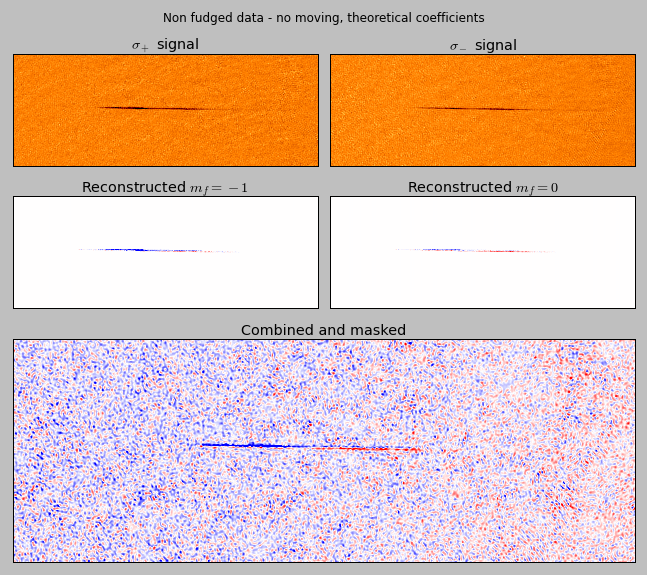

In [131]:
#### DATA PROCESS 
# Generate Data
# data_1 = fft_analysis(date, shot, num, dz_focus, quad_cut="quad1", multi_loop=0)#, shp="tight") ### with this shp - we can re-do it with the tight version
# data_2 = fft_analysis(date, shot, num, dz_focus, quad_cut="quad2", multi_loop=0)#, shp="tight")
# # data: atoms, flat, dark, fft_atoms, fft_flat, ang1, amp
# cut         = [931, 1211, 577, 1567]
# ang1 = data_1[5][cut[0]:cut[1], cut[2]:cut[3]]
# ang2 = data_2[5][cut[0]:cut[1], cut[2]:cut[3]]


# ---- Data
spin1_full_norot = ang1 - shift_rows_down(ang2, 0)
spin2_full_norot = ang2 - 3/5*shift_rows_down(ang1, 0)
mask_fit = fit1[1]+fit2[1] # Mask using the fit
mask_lim = 0.05
full = spin1_full_norot - spin2_full_norot

spin1_full_norot[(mask_fit > -mask_lim) & (mask_fit < mask_lim)] = 0
spin2_full_norot[(mask_fit > -mask_lim) & (mask_fit < mask_lim)] = 0
# full[(mask_fit > -mask_lim) & (mask_fit < mask_lim)] = 0

# --- Plotting 
gs = GridSpec(3, 2, height_ratios=[1, 1, 2])
fig = plt.figure(figsize=(9, 8))
ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[0, 1], sharey=ax1, sharex=ax1)
ax3 = fig.add_subplot(gs[1, 0], sharey=ax1, sharex=ax1)
ax4 = fig.add_subplot(gs[1, 1], sharey=ax1, sharex=ax1)
ax5 = fig.add_subplot(gs[2, :], sharey=ax1, sharex=ax1)

ax1.imshow(ang1, vmin=-2, vmax=2, cmap="afmhot_r", aspect='auto')
ax2.imshow(ang2, vmin=-2, vmax=2, cmap="afmhot_r", aspect='auto')
ax3.imshow(-spin1_full_norot, vmin=-1, vmax=1, cmap="bwr", aspect='auto')
ax4.imshow(spin2_full_norot, vmin=-1, vmax=1, cmap="bwr", aspect='auto')
im = ax5.imshow(-full, vmin=-1., vmax=1., cmap="bwr", aspect='auto')

fig.suptitle("Non fudged data - no moving, theoretical coefficients")
ax1.set_title("$\sigma_+$ signal")
ax2.set_title("$\sigma_-$ signal")
ax3.set_title("Reconstructed $m_f = -1$")
ax4.set_title("Reconstructed $m_f = 0$")
ax5.set_title("Combined and masked")

# cbar = plt.colorbar(im, ax=ax5, ticks=[-1, 1], aspect=35)
# cbar.ax.set_yticklabels(['-1', '0'])  # vertically oriented colorbar
# cbar.ax.set_ylabel('Normalized Magnetization')

for a in [ax1, ax2, ax3, ax4, ax5]:
    a.set_yticks([])
    a.set_xticks([])
#     a.set_ylim([70, 200])

plt.tight_layout()
plt.show()

##### Background Normalization

<IPython.core.display.Javascript object>


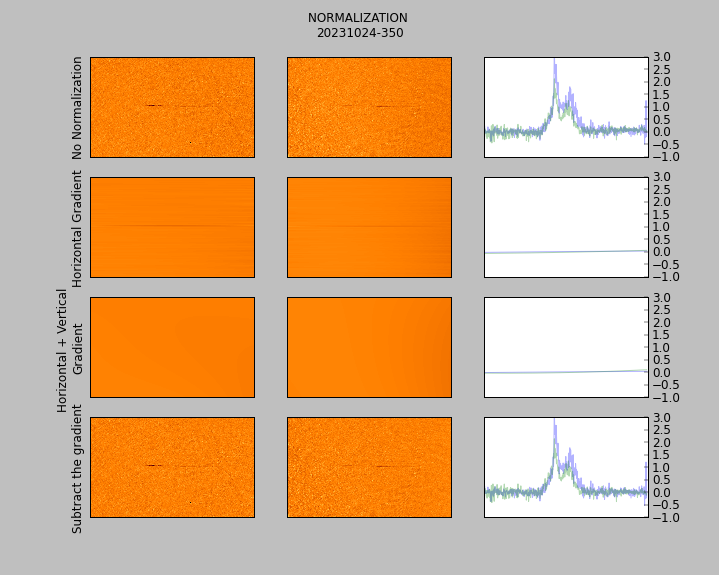

In [132]:
date        = 20231024
shot        = 350
num         = 0
dz_focus    = -0.0084
cut         = [931, 1211, 577, 1567]

# # Generate Data
# data_1 = fft_analysis(date, shot, num, dz_focus, quad_cut="quad1", multi_loop=0)#, shp="tight") ### with this shp - we can re-do it with the tight version
# data_2 = fft_analysis(date, shot, num, dz_focus, quad_cut="quad2", multi_loop=0)#, shp="tight")
# data: atoms, flat, dark, fft_atoms, fft_flat, ang1, amp

ang1 = data_1[5][cut[0]-200:cut[1]+200, cut[2]-200:cut[3]+200]
ang2 = data_2[5][cut[0]-200:cut[1]+200, cut[2]-200:cut[3]+200]

fig, ax = plt.subplots(4, 3, figsize=(10, 8))
fig.suptitle(f"NORMALIZATION \n{date}-{shot}")

ax[0][0].imshow(ang1, vmin=-2, vmax=2, cmap='afmhot_r', aspect='auto')
ax[0][1].imshow(ang2, vmin=-2, vmax=2, cmap='afmhot_r', aspect='auto')
ax[0][2].plot(ang1[336], c='C0', alpha=0.3)
ax[0][2].plot(ang2[336], c='C1', alpha=0.3)
ax[0][2].set_ylim([-1, 3])
ax[0][0].set_ylabel("No Normalization")

ax[1][0].imshow(normalize(ang1)[2], vmin=-2, vmax=2, cmap='afmhot_r', aspect='auto')
ax[1][1].imshow(normalize(ang2)[2], vmin=-2, vmax=2, cmap='afmhot_r', aspect='auto')
ax[1][2].plot(normalize(ang1)[2][356], c='C0', alpha=0.3)
ax[1][2].plot(normalize(ang2)[2][356], c='C1', alpha=0.3)
ax[1][2].set_ylim([-1, 3])
ax[1][0].set_ylabel("Horizontal Gradient")

ax[2][0].imshow(normalize(ang1)[1], vmin=-2, vmax=2, cmap='afmhot_r', aspect='auto')
ax[2][1].imshow(normalize(ang2)[1], vmin=-2, vmax=2, cmap='afmhot_r', aspect='auto')
ax[2][2].plot(normalize(ang1)[1][336], c='C0', alpha=0.3)
ax[2][2].plot(normalize(ang2)[1][336], c='C1', alpha=0.3)
ax[2][2].set_ylim([-1, 3])
ax[2][0].set_ylabel("Horizontal + Vertical \nGradient")

ax[3][0].imshow(normalize(ang1)[0], vmin=-2, vmax=2, cmap='afmhot_r', aspect='auto')
ax[3][1].imshow(normalize(ang2)[0], vmin=-2, vmax=2, cmap='afmhot_r', aspect='auto')
ax[3][2].plot(normalize(ang1)[0][336], c='C0', alpha=0.3)
ax[3][2].plot(normalize(ang2)[0][336], c='C1', alpha=0.3)
ax[3][2].set_ylim([-1, 3])
ax[3][0].set_ylabel("Subtract the gradient")


ax[0][2].yaxis.tick_right()
ax[1][2].yaxis.tick_right()
ax[2][2].yaxis.tick_right()
ax[3][2].yaxis.tick_right()

for axs in ax:
    for i in range(2):
        axs[i].set_xticks([])
        axs[i+1].set_xticks([])
        axs[i].set_yticks([])
        

plt.show()

###### LIST 

In [ ]:
foci = np.linspace(-0.02, 0.02, 201)
i = 0
for dz_focus in foci:
    #### DATA PROCESS 
    # Generate Data
    data_1 = fft_analysis(date, shot, num, dz_focus, quad_cut="quad1", multi_loop=0)#, shp="tight") ### with this shp - we can re-do it with the tight version
    data_2 = fft_analysis(date, shot, num, dz_focus, quad_cut="quad2", multi_loop=0)#, shp="tight")
    # data: atoms, flat, dark, fft_atoms, fft_flat, ang1, amp
    cut  = [931, 1211, 577, 1567]
    ang1 = data_1[5][cut[0]:cut[1], cut[2]:cut[3]]
    ang2 = data_2[5][cut[0]:cut[1], cut[2]:cut[3]]

    # ---- Data
    spin1_full_norot = ang1 - shift_rows_down(ang2, 0)
    spin2_full_norot = ang2 - 3/5*shift_rows_down(ang1, 0)
    mask_fit = fit1[1]+fit2[1] # Mask using the fit
    mask_lim = 0.05
    full = spin1_full_norot - spin2_full_norot

    spin1_full_norot[(mask_fit > -mask_lim) & (mask_fit < mask_lim)] = 0
    spin2_full_norot[(mask_fit > -mask_lim) & (mask_fit < mask_lim)] = 0

    # --- Plotting 
    gs = GridSpec(3, 2, height_ratios=[1, 1, 2])
    fig = plt.figure(figsize=(9, 8))
    ax1 = fig.add_subplot(gs[0, 0])
    ax2 = fig.add_subplot(gs[0, 1], sharey=ax1, sharex=ax1)
    ax3 = fig.add_subplot(gs[1, 0], sharey=ax1, sharex=ax1)
    ax4 = fig.add_subplot(gs[1, 1], sharey=ax1, sharex=ax1)
    ax5 = fig.add_subplot(gs[2, 0], sharey=ax1, sharex=ax1)
    ax6 = fig.add_subplot(gs[2, 1], sharey=ax1, sharex=ax1)

    ax1.imshow(ang1, vmin=-2, vmax=2, cmap="afmhot_r", aspect='auto')
    ax2.imshow(ang2, vmin=-2, vmax=2, cmap="afmhot_r", aspect='auto')
    ax3.imshow(-spin1_full_norot, vmin=-1, vmax=1, cmap="bwr", aspect='auto')
    ax4.imshow(spin2_full_norot, vmin=-1, vmax=1, cmap="bwr", aspect='auto')
    im = ax5.imshow(-full, vmin=-1., vmax=1., cmap="bwr", aspect='auto')

    full[(mask_fit > -mask_lim) & (mask_fit < mask_lim)] = 0
    im = ax6.imshow(-full, vmin=-1., vmax=1., cmap="bwr", aspect='auto')

    fig.suptitle(f"Non fudged data \nrefocus = {round(dz_focus, 6)}")
    ax1.set_title("$\sigma_+$ signal")
    ax2.set_title("$\sigma_-$ signal")
    ax3.set_title("Reconstructed $m_f = -1$")
    ax4.set_title("Reconstructed $m_f = 0$")
    ax5.set_title("Combined")
    ax6.set_title("Masked")

    # cbar = plt.colorbar(im, ax=ax5, ticks=[-1, 1], aspect=35)
    # cbar.ax.set_yticklabels(['-1', '0'])  # vertically oriented colorbar
    # cbar.ax.set_ylabel('Normalized Magnetization')

    for a in [ax1, ax2, ax3, ax4, ax5]:
        a.set_yticks([])
        a.set_xticks([])
        a.set_ylim([70, 200])

    
    plt.tight_layout()
    plt.savefig(f"/home/bec_lab/Desktop/imgs/SOAH/OAH_missmatch/focus6/{str(i).zfill(4)}.png")
    plt.close()
    i += 1

#### Smooth it out -> Make the FFT Cut bigger 

In [ ]:
### 
date        = 20231024
shot        = 350
num         = 0
dz_focus    = 0.0019
cut         = [931, 1211, 577, 1567]

def OAH_full_process_extend(date, shot, num, dz_focus, quad_cut, mask_w=0.51, multi_loop=0, fit_peaks=False, shp=None):
    multi_loop  = 0
    el_x        = 10
    el_z        = 100
    edge_x      = 10
    edge_z      = 80
    e_w         = 0.1


    atoms, flat, dark = openFiles(date, shot, num, multi_loop=multi_loop)
    atoms      = f1.squaroid(atoms - dark, width=mask_w)
    flat       = f1.squaroid(flat - dark, width=mask_w)
    fft_atoms = np.fft.fft2(atoms)
    fft_flat = np.fft.fft2(flat)

    fft_atoms = fft_atoms[5:-5, 5:-5]
    fft_flat = fft_flat[5:-5, 5:-5]

    quad1, q1peak  = f1.box_cutter_pad_ellips(fft_atoms, quad_cut, 
                                              el_x, el_z, 
                                              edge_x=edge_x, edge_z=edge_z, e_w=e_w, 
                                              peakswithfitting=fit_peaks,
                                              shp=shp)
    flatq1, f1peak = f1.box_cutter_pad_ellips(fft_flat,  quad_cut, 
                                              el_x, el_z, 
                                              edge_x=edge_x, edge_z=edge_z, e_w=e_w, 
                                              indices=q1peak,                                              
                                              peakswithfitting=fit_peaks,
                                              shp=shp)
    quad1cut, flatq1cut = f1.sizecomp(quad1, flatq1)

    fft1 = np.fft.fftshift(quad1cut)
    flatfft1 = np.fft.fftshift(flatq1cut)

    fft_kx = np.fft.fftfreq(fft1.shape[1], d=pix_size)  # Discrete FFT Sample Frequency in x
    fft_ky = np.fft.fftfreq(fft1.shape[0], d=pix_size)  # Discrete FFT Sample Frequency in z
    fft_k2 = fft_kx[None, :] ** 2 + fft_ky[:, None] ** 2  # Discrete FFT Sample Frequency in main axes multiplied
    ly = 0  # .5E6#-3E6#.                                           # Adjusting the fft_ky array
    coma_y_arg = ly * fft_ky[:, None] * (3 * fft_k2 / k0 ** 2) / k0
    lin_y = np.exp(-1j * coma_y_arg)
    focus = np.exp(-1j * dz_focus * np.sqrt(k0 **2 - fft_k2))
    fft1 = fft1 * focus * lin_y
    flatfft1 = flatfft1 * focus * lin_y

    inv1 = np.fft.ifft2(fft1) / np.fft.ifft2(flatfft1)
    inv1 = inv1[border_x:-border_x, border_z:-border_z]

    # Get Phase
    ang1 = np.angle(inv1)
    ang1 = f1.unwrapper(ang1)

    # Get amp 
    amp = np.abs(inv1)
    amp = np.log(amp**2)

    # Normalize
    normfactor = ang1.mean()
    ang1 = ang1 - normfactor
    ang1 = normalize(ang1)[0] 
    
    return atoms, flat, ang1, amp

##### Focus over tight cut -> no extension to the cut window

In [ ]:
multi_loop  = 0
el_x        = 10
el_z        = 100
edge_x      = 10
edge_z      = 80
e_w         = 0.1
mask_w      = 0.51
quad_cut    = "quad1"

atoms, flat, dark = openFiles(date, shot, num, multi_loop=multi_loop)
atoms      = f1.squaroid(atoms - dark, width=mask_w)
flat       = f1.squaroid(flat - dark, width=mask_w)
fft_atoms = np.fft.fft2(atoms)
fft_flat = np.fft.fft2(flat)
fft_atoms = fft_atoms[5:-5, 5:-5]
fft_flat = fft_flat[5:-5, 5:-5]

quad1, q1peak  = f1.box_cutter_pad_ellips(fft_atoms, quad_cut, el_x, el_z, edge_x=edge_x, edge_z=edge_z, e_w=e_w, shp="tight")
flatq1, f1peak = f1.box_cutter_pad_ellips(fft_flat,  quad_cut, el_x, el_z, edge_x=edge_x, edge_z=edge_z, e_w=e_w, indices=q1peak, shp="tight") # same indices as for quad
quad1cut, flatq1cut = f1.sizecomp(quad1, flatq1)

fft1 = np.fft.fftshift(quad1cut)
flatfft1 = np.fft.fftshift(flatq1cut)

In [ ]:
# Loop this? 
foci = np.linspace(-0.02, 0.02, 301)
i = 0

for dz_focus in foci: 
    # -------------------------------------- REFOCUSING --------------------------------------------------
    fft_kx = np.fft.fftfreq(fft1.shape[1], d=pix_size)  # Discrete FFT Sample Frequency in x
    fft_ky = np.fft.fftfreq(fft1.shape[0], d=pix_size)  # Discrete FFT Sample Frequency in z
    fft_k2 = fft_kx[None, :] ** 2 + fft_ky[:, None] ** 2  # Discrete FFT Sample Frequency in main axes multiplied
    ly = 0  # .5E6#-3E6#.                                           # Adjusting the fft_ky array
    coma_y_arg = ly * fft_ky[:, None] * (3 * fft_k2 / k0 ** 2) / k0
    lin_y = np.exp(-1j * coma_y_arg)
    focus = np.exp(-1j * dz_focus * np.sqrt(k0 **2 - fft_k2))
    fft1_proc = fft1 * focus * lin_y
    flatfft1_proc = flatfft1 * focus * lin_y

    inv1 = np.fft.ifft2(fft1_proc) / np.fft.ifft2(flatfft1_proc)
    inv1 = inv1[border_x:-border_x, border_z:-border_z]

    ang1 = np.angle(inv1)
    ang1 = f1.unwrapper(ang1)
    amp = np.abs(inv1)
    amp = np.log(amp**2)

    normfactor = ang1.mean()
    ang1 = ang1 - normfactor
    ang1 = normalize(ang1)[0] 

    fig, ax = plt.subplots(2, 2)
    fig.suptitle(f"{round(dz_focus, 4)}")
    ax[0][0].imshow(abs(quad1), cmap=plt.get_cmap('gist_heat'), norm=colors.LogNorm(), aspect='auto', interpolation="none")
    ax[0][1].imshow(abs(flatq1), cmap=plt.get_cmap('gist_heat'), norm=colors.LogNorm(), aspect='auto', interpolation="none")

    angcut = ang1[int(0.48 * ang1.shape[0]) : int(0.52 * ang1.shape[0]), int(0.3 * ang1.shape[1]) : int(0.6 * ang1.shape[1])]
    ampcut = amp[int(0.48 * amp.shape[0]) : int(0.52 * amp.shape[0]), int(0.3 * amp.shape[1]) : int(0.6 * amp.shape[1])]

    ax[1][0].imshow(angcut, vmin=-2, vmax=2, cmap="afmhot_r", aspect="auto", interpolation="none")
    ax[1][1].imshow(ampcut, vmin=-2, vmax=2, cmap="afmhot_r", aspect="auto", interpolation="none")


    for axs in ax:
        for a in axs:
            a.set_xticks([])
            a.set_yticks([])

    plt.savefig(f"/home/bec_lab/Desktop/imgs/SOAH/OAH_missmatch/windowExpansion/{str(i).zfill(4)}.jpg")
    plt.close()
    i += 1

##### Different cut sizes

In [ ]:
shape_list = ["tight", None, (2148*2, 2548*2), (2148*3, 2548*3), (2148*4, 2548*4)]
big_data_1 = [OAH_full_process_extend(date, shot, num, dz_focus, "quad1", mask_w=0.51, multi_loop=0, fit_peaks=False, shp=shape) for shape in shape_list]
big_data_2 = [OAH_full_process_extend(date, shot, num, dz_focus, "quad2", mask_w=0.51, multi_loop=0, fit_peaks=False, shp=shape) for shape in shape_list]

In [ ]:
fig, ax = plt.subplots(3, 2)
fig.suptitle("QUAD 1")

for i in range(5):
    if i > 2:
        k = 1
    else:
        k = 0

    dat_i = big_data_1[i][2]
    dat_i = dat_i[int(0.48 * dat_i.shape[0]) : int(0.52 * dat_i.shape[0]), int(0.3 * dat_i.shape[1]) : int(0.6 * dat_i.shape[1])]
    
    ax[i%3][k].imshow(dat_i, vmin=-2, vmax=2, cmap="afmhot_r", aspect="auto")
    ax[i%3][k].set_title(f"{shape_list[i]}")
    
for axs in ax:
    for a in axs:
        a.set_xticks([])
        a.set_yticks([])

plt.tight_layout()
plt.show()


fig, ax = plt.subplots(3, 2)
fig.suptitle("QUAD 2")
for i in range(5):
    if i > 2:
        k = 1
    else:
        k = 0

    dat_i = big_data_2[i][2]
    dat_i = dat_i[int(0.48 * dat_i.shape[0]) : int(0.52 * dat_i.shape[0]), int(0.3 * dat_i.shape[1]) : int(0.6 * dat_i.shape[1])]
    
    ax[i%3][k].imshow(dat_i, vmin=-2, vmax=2, cmap="afmhot_r", aspect="auto")
    ax[i%3][k].set_title(f"{shape_list[i]}")
    
for axs in ax:
    for a in axs:
        a.set_xticks([])
        a.set_yticks([])

        
ax[2][1].plot(dat_i[int(0.48 * dat_i.shape[0]) : int(0.52 * dat_i.shape[0]), int(0.3 * dat_i.shape[1]) : int(0.6 * dat_i.shape[1])][])



plt.tight_layout()
plt.show()


In [ ]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.cm as cm
import numpy as np


fig, ax = plt.subplots(2, 2, figsize=(9,7))

# setup the normalization and the colormap

for i in range(4):
    pos = format(i, '08b')
    dat_i = big_data_1[i][2]

    hsv2rgb = lambda hue: mcolors.hsv_to_rgb([hue, 0.9,0.7])
    hues = np.linspace(0, 0.7, 25)
    colors = [hsv2rgb(hue) for hue in hues]

    dat_i = dat_i[int(0.48 * dat_i.shape[0]) : int(0.52 * dat_i.shape[0]), int(0.3 * dat_i.shape[1]) : int(0.6 * dat_i.shape[1])]
    
    for j in range(25):
        ax[int(pos[-1])][int(pos[-2])].plot(dat_i[:, (230*(i+1))+j], c=colors[j], alpha=0.2)
        ax[int(pos[-1])][int(pos[-2])].set_title(f"{shape_list[i]}")
    
for axs in ax:
    for a in axs:
        a.set_xticks([])
        a.set_yticks([])

plt.tight_layout()
plt.show()


### Why are they not at the same spot? 

So we noticed that the two condensates are not precisely aligned, which might be a bit problematic. If we want to publish, we need to first understand this. So let's put some effort into figuring out the reason behind this. 

In [ ]:
### -- if we need to load and fit the data again 
date        = 20231024
shot        = 350
num         = 0
dz_focus    = 0.0055
cut         = [931, 1211, 577, 1567]

# Generate Data
data_1 = fft_analysis(date, shot, num, dz_focus, quad_cut="quad1", multi_loop=0)
data_2 = fft_analysis(date, shot, num, dz_focus, quad_cut="quad2", multi_loop=0)
# data: atoms, flat, dark, fft_atoms, fft_flat, ang1, amp
ang1 = data_1[5][cut[0]:cut[1], cut[2]:cut[3]]
ang2 = data_2[5][cut[0]:cut[1], cut[2]:cut[3]]

# Rotate data
initial_g_1 = {
    "offset": 0.,
    "amp_ov": 1.,
    "ang": 0,
    "center": (ang1.shape[0]//2, ang1.shape[1]//2),
    "tfa": 1,
    "tfw": (5, 300),
    "ga": 1,
    "gw": (5, 300),
    "j_guess": 40 ,
    "axamp": 1,
    "x_shift": 0.0,
    "squeeze_par": 1.0,
    }

initial_g_2 = {
    "offset": 0.,
    "amp_ov": 1.,
    "ang": 0,
    "center": (ang2.shape[0]//2, ang2.shape[1]//2),
    "tfa": 1,
    "tfw": (5, 300),
    "ga": 1,
    "gw": (5, 300),
    "j_guess": 40 ,
    "axamp": 1,
    "x_shift": 0.0,
    "squeeze_par": 1.0,
    }

ang1_rot, ang2_rot, fitresult1_rot, fitresult2_rot, fit1, fit2 = rotateFunction(ang1, ang2)
# fit1 = pic, fitresult, fitguess, fitresultgauss, fitresulttf, fitted_vars, odrout

In [ ]:
# print(fit1[-1].beta)
# print(fit2[-1].beta)
par_names = ['offset', 'ampl', 'ang', 'xmid', 'ymid', 'tfamp', 'tfxw', 'tfyw']

print(f'{"CHECK THE FITTED VALUES - ARE THE TWO FITS VASTLY DIFFERENT?": ^104}')
print("-"*104)
print(f'| {"": <16} | {"OAH 1": >25} | {"OAH 2": >25} | {"diff" : >25} |')
for i in range(8):
    print(f'| {par_names[i]: <16} | {round(fit1[-1].beta[i], 8): >25} | {round(fit2[-1].beta[i], 8): >25} | {round(fit1[-1].beta[i] - fit2[-1].beta[i], 8): >25} |' )
print("-"*104)


cs = 100
f1_cropped = fit1[1][cs:-cs,:]
f2_cropped = fit2[1][cs:-cs,:]

f1_cropped[f1_cropped<0.1] = 0

maxcoord_1 = np.where(f1_cropped == f1_cropped.max())
# maxcoord_2 = maxcoord_1
maxcoord_2 = np.where(f2_cropped == f2_cropped.max())


fig, ax = plt.subplots(2, 2, figsize=(8,8))
fig.suptitle("Centers Are Off")
ax[0][0].imshow(f1_cropped - f2_cropped, vmin=-2, vmax=2, cmap="bwr", aspect='auto')
ax[0][0].contour(f1_cropped, levels=[0.25], colors=['C0'], alpha=0.2)
ax[0][0].contour(f2_cropped, levels=[0.25], colors=['C1'], alpha=0.2)
ax[0][1].imshow(f2_cropped, vmin=-2, vmax=2, cmap="bwr", aspect='auto')
ax[0][1].contour(f2_cropped, levels=[0.25], colors=['C1'], alpha=0.2)
ax[1][0].plot(f1_cropped[maxcoord_1[0][0]], c='C0', alpha=0.3, ls='--')
ax[1][0].plot(f2_cropped[maxcoord_2[0][0]], c='C1', alpha=0.3, ls='--')
ax[1][1].plot(f1_cropped[:, maxcoord_1[1][0]], range(len(f1_cropped[:, maxcoord_1[1][0]])), c='C0', alpha=0.3, ls='--')
ax[1][1].plot(f2_cropped[:, maxcoord_2[1][0]], range(len(f2_cropped[:, maxcoord_2[1][0]])), c='C1', alpha=0.3, ls='--')

ax[0][0].axhline(y=maxcoord_1[0][0], alpha=0.3, ls='--', c='C0')
ax[0][0].axvline(x=maxcoord_1[1][0], alpha=0.3, ls='--', c='C0')
ax[0][1].axhline(y=maxcoord_2[0][0], alpha=0.3, ls='--', c='C2')
ax[0][1].axvline(x=maxcoord_2[1][0], alpha=0.3, ls='--', c='C2')


# ax[0][0].axhline(y=maxcoord_2[0][0], xmin=maxcoord_2[1][0]-10, xmax=maxcoord_2[1][0]+10, alpha=0.8, ls='--', c='C1')
# ax[0][0].axvline(x=maxcoord_2[1][0], ymin=maxcoord_2[0][0]-10, ymax=maxcoord_2[0][0]+10, alpha=0.8, ls='--', c='C1')
# ax[0][1].axhline(y=maxcoord_1[0][0], xmin=maxcoord_1[1][0]-10, xmax=maxcoord_1[1][0]+10, alpha=0.8, ls='--', c='C1')
# ax[0][1].axvline(x=maxcoord_1[1][0], ymin=maxcoord_1[0][0]-10, ymax=maxcoord_1[0][0]+10, alpha=0.8, ls='--', c='C1')

ax[0][0].scatter(maxcoord_2[1][0], maxcoord_2[0][0], marker='x', c='C2')
ax[0][1].scatter(maxcoord_1[1][0], maxcoord_1[0][0], marker='x', c='C0')

for a in ax[0]:
    a.set_yticks([])
    a.set_xticks([])
    
plt.show()

In [ ]:
### Load and cut properly refocused data
date = 20231211
shot = 51 # = range(50, 53)

dz_focus = 0.005
shot_time = 2 # time between shots in ms 
cut = [1, -1, 1, -250]
n = 10

# Generate Data
data_1 = fft_analysis(date, shot, num, dz_focus, quad_cut="quad1", multi_loop=0)
data_2 = fft_analysis(date, shot, num, dz_focus, quad_cut="quad2", multi_loop=0)
# data: atoms, flat, dark, fft_atoms, fft_flat, ang1, amp
ang1 = data_1[5][cut[0]:cut[1], cut[2]:cut[3]]
ang2 = data_2[5][cut[0]:cut[1], cut[2]:cut[3]]

In [ ]:
fig, ax = plt.subplots(2, 2)
ax[0][0].imshow(ang1, vmin=-2, vmax=3, cmap="afmhot_r", aspect='auto')
ax[0][1].imshow(ang2, vmin=-2, vmax=3, cmap="afmhot_r", aspect='auto')
# ax[1][0].imshow(ang1, vmin=-2, vmax=3, cmap="afmhot_r")
# ax[1][1].imshow(ang1, vmin=-2, vmax=3, cmap="afmhot_r")

plt.show()

## Spin-Component Analysis - 20231024 - something else

Now the data is processed and we are ready to begin spin component analysis.

### Prepare the data

In [124]:
# ### 
# date        = 20231006
# shot        = 22
# num         = 6
# dz_focus    = -0.002
# cut         = [18, 162, 648, 1356]
# ### 

date        = 20231109
shot        = 122
num         = 0
dz_focus    = -0.000
# cut         = [18, 162, 648, 1356]

In [126]:
cut = [906, 1154, 666, 1712]

In [125]:
# Generate Data
data_1 = fft_analysis(date, shot, num, dz_focus, quad_cut="quad1", multi_loop=0)#, shp="tight") ### with this shp - we can re-do it with the tight version
data_2 = fft_analysis(date, shot, num, dz_focus, quad_cut="quad2", multi_loop=0)#, shp="tight")
# data: atoms, flat, dark, fft_atoms, fft_flat, ang1, amp

Indices provided: 
(2148, 2548) (2148, 2548)
Indices provided: 
(2148, 2548) (2148, 2548)


In [127]:
ang1 = data_1[5][cut[0]:cut[1], cut[2]:cut[3]]
ang2 = data_2[5][cut[0]:cut[1], cut[2]:cut[3]]

In [128]:
# Rotate data
initial_g_1 = {
    "offset": 0,
    "amp_ov": 1,
    "ang": 0.005,
    "center": (116, 514), #(ang1.shape[0]//2-10, ang1.shape[1]//2-5), # 95, 157),#
    "tfa": 1,
    "tfw": (4, 300),
    "ga": 1,
    "gw": (5, 150),
    "j_guess": 40 ,
    "axamp": 1,
    "x_shift": 0.0,
    "squeeze_par": 1.0,
    }

initial_g_2 = {
    "offset": 0.,
    "amp_ov": 1,
    "ang": 0.005, 
    "center": (120, 590), #(ang2.shape[0]//2-10, ang2.shape[1]//2-5),
    "tfa": 1,
    "tfw": (2, 300),
    "ga": 1,
    "gw": (5, 300),
    "j_guess": 40 ,
    "axamp": 1,
    "x_shift": 0.0,
    "squeeze_par": 1.0,
    }

ang1_rot, ang2_rot, fitresult1_rot, fitresult2_rot, fit1, fit2 = rotateFunction(ang1, ang2)
# fit1 = pic, fitresult, fitguess, fitresultgauss, fitresulttf, fitted_vars, odrout

Angle 1 = 1.020299284338474
Angle 2 = 1.0193921873060308
[2.07725099e-02 1.01252450e+00 1.78075819e-02 1.19131361e+02
 5.30855456e+02 4.52711807e-01 3.56144535e+00 4.72498756e+02]


In [129]:
lc_1 = np.where(fitresult1_rot == fitresult1_rot.max())[0][0]
lc_2 = np.where(fitresult2_rot == fitresult2_rot.max())[0][0]

fig, ax = plt.subplots(5, 2, figsize=(8, 8))
ax[0][0].imshow(fit1[0], vmin=-2, vmax=2, cmap="afmhot_r", aspect='auto')
ax[0][1].imshow(fit2[0], vmin=-2, vmax=2, cmap="afmhot_r", aspect='auto')
ax[1][0].imshow(fit1[2], vmin=-2, vmax=2, cmap="afmhot_r", aspect='auto')
ax[1][1].imshow(fit2[2], vmin=-2, vmax=2, cmap="afmhot_r", aspect='auto')
ax[2][0].imshow(fitresult1_rot, vmin=-2, vmax=2, cmap="afmhot_r", aspect='auto')
ax[2][1].imshow(fitresult2_rot, vmin=-2, vmax=2, cmap="afmhot_r", aspect='auto')
ax[3][0].imshow(ang1_rot, vmin=-2, vmax=2, cmap="afmhot_r", aspect='auto')
ax[3][1].imshow(ang2_rot, vmin=-2, vmax=2, cmap="afmhot_r", aspect='auto')
ax[4][0].plot(ang1_rot[lc_1])
ax[4][1].plot(ang2_rot[lc_2])
ax[4][0].plot(fitresult1_rot[lc_1], alpha=0.4, c='r')
ax[4][1].plot(fitresult2_rot[lc_2], alpha=0.4, c='r')

ax[0][0].set_ylabel("Original")
ax[1][0].set_ylabel("Fit Guess")
ax[2][0].set_ylabel("Fit + Rot")
ax[3][0].set_ylabel("Rotated Image")
ax[4][0].set_ylabel("Linecut")


for axs in ax:
    for a in axs:
        a.set_yticks([])
        a.set_xticks([])

plt.show()


<IPython.core.display.Javascript object>

In [102]:
# let's also fit this with the double TF.
def thomasfermi1D(x, amp, r, mid):
    """ A 2D Thomas Fermi function, a function of amplitude, radia and means (both x and y). """
    value = 1 - ((x - mid) / r) ** 2 
    value[value < 0] = 0
    return np.abs(amp) * np.power(value, 3. / 2.)# Define the double Thomas-Fermi function as a sum of two Thomas-Fermi functions

def double_thomas_fermi(x, amp1, r1, mid1, amp2, r2, mid2):
    return thomasfermi1D(x, amp1, r1, mid1) + thomasfermi1D(x, amp2, r2, mid2)

def shift_rows_down(array, num_shifts):
    num_rows = array.shape[0]
    # Compute the effective number of shifts (as shifts can be more than the number of rows)
    num_shifts = num_shifts % num_rows
    # Shift the array
    return np.roll(array, shift=num_shifts, axis=0)

### Now analyse the data

#### Preview Raw Data

In [130]:
atoms, flat, dark, fft_atoms, fft_flat, ang1_, amp1_ = data_1
atoms, flat, dark, fft_atoms, fft_flat, ang2_, amp2_ = data_2
# cut = [1001, 1141, 577, 1567]
# cut         = [418, 610, 250, 550] # tight
gs = GridSpec(4, 2)#, height_ratios=[1, 1, 1, 1, 1, 2, 2])
fig = plt.figure(figsize=(9, 8))
plt.suptitle(f"{date} - {shot}")
ax00 = fig.add_subplot(gs[0, 0])
ax01 = fig.add_subplot(gs[0, 1], sharey=ax00, sharex=ax00)
ax10 = fig.add_subplot(gs[1, 0])
ax11 = fig.add_subplot(gs[1, 1])
ax20 = fig.add_subplot(gs[2, 0], sharey=ax00, sharex=ax00)
ax21 = fig.add_subplot(gs[2, 1], sharey=ax00, sharex=ax00)
ax30 = fig.add_subplot(gs[3, 0], sharey=ax00, sharex=ax00)
ax31 = fig.add_subplot(gs[3, 1], sharey=ax00, sharex=ax00)

ax00.imshow(atoms[cut[0]:cut[1], cut[2]:cut[3]], aspect='auto', cmap='afmhot_r')
ax01.imshow(flat[cut[0]:cut[1], cut[2]:cut[3]], aspect='auto', cmap='afmhot_r')
ax10.imshow(abs(fft_atoms), cmap=plt.get_cmap('gist_heat'), norm=colors.LogNorm(), aspect='auto')
ax11.imshow(abs(fft_flat), cmap=plt.get_cmap('gist_heat'), norm=colors.LogNorm(), aspect='auto')

ax20.imshow(ang1_[cut[0]:cut[1], cut[2]:cut[3]], aspect='auto', vmin=-3, vmax=3, cmap='afmhot_r')
ax21.imshow(ang2_[cut[0]:cut[1], cut[2]:cut[3]], aspect='auto', vmin=-3, vmax=3, cmap='afmhot_r')
ax30.imshow(-amp1_[cut[0]:cut[1], cut[2]:cut[3]], aspect='auto', vmin=-3, vmax=3, cmap='afmhot_r')
ax31.imshow(-amp2_[cut[0]:cut[1], cut[2]:cut[3]], aspect='auto', vmin=-3, vmax=3, cmap='afmhot_r')

ax00.set_title("Atoms")
ax01.set_title("Flat")
ax10.set_title("FFT Atoms")
ax11.set_title("FFT Flat")
ax20.set_title("$\phi_+$")
ax21.set_title("$\phi_-$")
ax30.set_title("$OD_+$")
ax31.set_title("$OD_-$")

for a in [ax00, ax01, ax10, ax11, ax20, ax21, ax30, ax31]:
    a.set_xticks([])
    a.set_yticks([])

plt.tight_layout()
plt.show()

<IPython.core.display.Javascript object>

##### Run this through different foci - want to see how OD changes through focus 

In [131]:
foci = np.linspace(-0.015, 0.0, 7)
i = 0

for dz_focus in [0.001]: #foci:
    # Generate Data
    data_1 = fft_analysis(date, shot, num, dz_focus, quad_cut="quad1", multi_loop=0)#, shp="tight") ### with this shp - we can re-do it with the tight version
    data_2 = fft_analysis(date, shot, num, dz_focus, quad_cut="quad2", multi_loop=0)#, shp="tight")
    # data: atoms, flat, dark, fft_atoms, fft_flat, ang1, amp
    atoms, flat, dark, fft_atoms, fft_flat, ang1_, amp1_ = data_1
    atoms, flat, dark, fft_atoms, fft_flat, ang2_, amp2_ = data_2
#     cut = [1001, 1141, 577, 1567]
    # cut         = [418, 610, 250, 550] # tight

    gs = GridSpec(5, 2)#, height_ratios=[1, 1, 1, 1, 1, 2, 2])
    fig = plt.figure(figsize=(9, 8))
    plt.suptitle(f"{date} - {shot}\nrefocus = {round(dz_focus, 4)}")
    ax00 = fig.add_subplot(gs[0, 0])
    ax01 = fig.add_subplot(gs[0, 1], sharey=ax00, sharex=ax00)
    ax10 = fig.add_subplot(gs[1, 0])
    ax11 = fig.add_subplot(gs[1, 1])
    ax20 = fig.add_subplot(gs[2, 0], sharey=ax00, sharex=ax00)
    ax21 = fig.add_subplot(gs[2, 1], sharey=ax00, sharex=ax00)
    ax30 = fig.add_subplot(gs[3, 0], sharey=ax00, sharex=ax00)
    ax31 = fig.add_subplot(gs[3, 1], sharey=ax00, sharex=ax00)
    ax40 = fig.add_subplot(gs[4, 0], sharey=ax00, sharex=ax00)
    ax41 = fig.add_subplot(gs[4, 1], sharey=ax00, sharex=ax00)

    
    ax00.imshow(ang1_[cut[0]:cut[1], cut[2]:cut[3]], aspect='auto', vmin=-3, vmax=3, cmap='afmhot_r')
    ax01.imshow(ang2_[cut[0]:cut[1], cut[2]:cut[3]], aspect='auto', vmin=-3, vmax=3, cmap='afmhot_r')
    ax10.imshow(-amp1_[cut[0]:cut[1], cut[2]:cut[3]], aspect='auto', vmin=-3, vmax=3, cmap='afmhot_r')
    ax11.imshow(-amp2_[cut[0]:cut[1], cut[2]:cut[3]], aspect='auto', vmin=-3, vmax=3, cmap='afmhot_r')
    
    
    spin1_ang = ang1_[cut[0]:cut[1], cut[2]:cut[3]] - ang2_[cut[0]:cut[1], cut[2]:cut[3]]
    spin2_ang = ang2_[cut[0]:cut[1], cut[2]:cut[3]] - 3/5 * ang1_[cut[0]:cut[1], cut[2]:cut[3]]
    
    spin1_amp = -amp1_[cut[0]:cut[1], cut[2]:cut[3]] + amp2_[cut[0]:cut[1], cut[2]:cut[3]]
    spin2_amp = -amp2_[cut[0]:cut[1], cut[2]:cut[3]] + 3/5 * amp1_[cut[0]:cut[1], cut[2]:cut[3]]
    
    
    ax20.imshow(spin1_ang, aspect='auto', vmin=-2, vmax=2, cmap="bwr")
    ax21.imshow(-spin2_ang, aspect='auto', vmin=-2, vmax=2, cmap="bwr")
    ax30.imshow(spin1_amp, aspect='auto', vmin=-2, vmax=2, cmap="bwr")
    ax31.imshow(-spin2_amp, aspect='auto', vmin=-2, vmax=2, cmap="bwr")

    ax40.imshow(spin1_ang - spin2_ang, aspect='auto', vmin=-2, vmax=2, cmap="bwr")
    ax41.imshow(spin1_amp - spin2_amp, aspect='auto', vmin=-2, vmax=2, cmap="bwr")
    
    
    ax00.set_title("$\phi_+$")
    ax01.set_title("$\phi_-$")
    ax10.set_title("$OD_+$")
    ax11.set_title("$OD_-$")
    
    ax20.set_title("$\phi_+ - \phi_-$")
    ax21.set_title("$\phi_- - 0.6 * \phi_+$")
    ax30.set_title("$OD_+ - OD_-$")
    ax31.set_title("$OD_- - 0.6 * OD_+$")
    ax40.set_title("Total Spin - $\phi$")
    ax41.set_title("Total Spin - $OD$")


    for a in [ax00, ax01, ax10, ax11, ax20, ax21, ax30, ax31]:
        a.set_xticks([])
        a.set_yticks([])

    plt.tight_layout()
#     plt.savefig(f"/home/bec_lab/Desktop/imgs/SOAH/OAH_missmatch/REFOCUSED/focus9_OD_spin/{str(i).zfill(4)}.png")
    plt.show()
    i += 1

Indices provided: 
(2148, 2548) (2148, 2548)
Indices provided: 
(2148, 2548) (2148, 2548)


<IPython.core.display.Javascript object>

#### Linecut and 1D Spin Reconstruction

In [132]:
# More cutting from above and below
cut_strip = 60
bin_factor= 1

lc_1_small = lc_1 - cut_strip
lc_2_small = lc_2 - cut_strip

pic1 = ang1_rot[cut_strip:-cut_strip, :]
pic2 = ang2_rot[cut_strip:-cut_strip, :]

gs = GridSpec(4, 2)#, height_ratios=[1, 1, 1, 1, 1, 2, 2])
fig = plt.figure(figsize=(9, 8))
ax00 = fig.add_subplot(gs[0, 0])
ax01 = fig.add_subplot(gs[0, 1], sharey=ax00, sharex=ax00)
ax10 = fig.add_subplot(gs[1, 0])
ax11 = fig.add_subplot(gs[1, 1])
ax20 = fig.add_subplot(gs[2, 0])
ax21 = fig.add_subplot(gs[2, 1])
ax30 = fig.add_subplot(gs[3, 0])
ax31 = fig.add_subplot(gs[3, 1])

fig.suptitle("Density Profiles")

# Normal, rotated image, with linecut indicators
ax00.imshow(pic1, vmin=-1, vmax=1, cmap="afmhot_r", aspect='auto')
ax01.imshow(pic2, vmin=-1, vmax=1, cmap="afmhot_r", aspect='auto')
ax00.axhline(y = lc_1_small, alpha=0.15, c='k', ls='--')
ax01.axhline(y = lc_2_small, alpha=0.15, c='k', ls='--')
ax00.text(0.9, 0.8, "$\sigma_+$", 
          horizontalalignment='center', 
          verticalalignment='center', 
          fontsize = 15,
          c='w',
          transform=ax00.transAxes)
ax01.text(0.9, 0.8, "$\sigma_-$", 
          horizontalalignment='center',
          verticalalignment='center',
          fontsize = 15,
          c='w',
          transform=ax01.transAxes)


## LINECUTS - Different binnings
ax = [[ax10, ax11], 
      [ax20, ax21], 
      [ax30, ax31], 
      ]
i = 0

for bin_factor in [1, 7, 19]:
    # Try different binnings
    linecut_profile_1 = np.array([pic1[lc_1_small][i:i+bin_factor].sum()/bin_factor for i in range(0, pic1[lc_1_small].shape[0], bin_factor)])
    linecut_profile_2 = np.array([pic2[lc_2_small][i:i+bin_factor].sum()/bin_factor for i in range(0, pic2[lc_2_small].shape[0], bin_factor)])

    # Double TF fitting
    xdata = np.arange(len(linecut_profile_1))
    p0i = [1, 15, 380/bin_factor, 1, 18, 550/bin_factor]
    params1, params_covariance = curve_fit(double_thomas_fermi, xdata, linecut_profile_1, p0=p0i, maxfev = 100000000)
    params2, params_covariance = curve_fit(double_thomas_fermi, xdata, linecut_profile_2, p0=p0i, maxfev = 100000000)
    y_fit1 = double_thomas_fermi(xdata, *params1)
    y_fit2 = double_thomas_fermi(xdata, *params2)
    y_guess2 = double_thomas_fermi(xdata, *p0i)
        
    ax[i][0].plot(linecut_profile_1, c='C0', alpha=0.4)
    ax[i][0].plot(linecut_profile_2, c='C1', alpha=0.4)
    ax[i][0].plot(y_fit1, c='C0', alpha=0.4, lw=2, ls='--')
    ax[i][0].plot(y_fit2, c='C1', alpha=0.4, lw=2, ls='--')
    ax[i][0].fill_between(xdata, 0, linecut_profile_1, color='C0', alpha=0.4, label="$\sigma_+$")
    ax[i][0].fill_between(xdata, 0, linecut_profile_2, color='C1', alpha=0.4, label="$\sigma_-$")

    # ----- SPIN PROCESSING ------
    spin1 = linecut_profile_1 - linecut_profile_2
    spin2 = linecut_profile_2 - 3/6 * linecut_profile_1  # 3/5 factor is theoretical - try the other ratio we found
    
    # Single TF fitting
    xdata = np.arange(len(linecut_profile_1))
    p0i_1 = [1, 15, 380/bin_factor]
    p0i_2 = [1, 15, 550/bin_factor]
    params1, params_covariance = curve_fit(thomasfermi1D, xdata, spin1, p0=p0i_1, maxfev = 100000000)
    params2, params_covariance = curve_fit(thomasfermi1D, xdata, spin2, p0=p0i_2, maxfev = 100000000)
    y_fit1 = thomasfermi1D(xdata, *params1)
    y_fit2 = thomasfermi1D(xdata, *params2)
    
    ax[i][1].plot(spin1, c='C2', alpha=0.2)
    ax[i][1].plot(spin2, c='C3', alpha=0.2)
    ax[i][1].plot(y_fit1, c='C2', alpha=0.2, lw=2, ls='--')
    ax[i][1].plot(y_fit2, c='C3', alpha=0.2, lw=2, ls='--')
    ax[i][1].fill_between(xdata, 0, spin1, color='C2', alpha=0.4, label="$m_f$ =-1")
    ax[i][1].fill_between(xdata, 0, spin2, color='C3', alpha=0.4, label="$m_f$ = 0")
    ax[i][0].set_ylabel(f"bin = {bin_factor}")
    
    ax[i][0].legend()
    ax[i][1].legend()
    ax[i][0].set_ylim(-0.1, 0.9)
    ax[i][1].set_ylim(-0.1, 0.9)

    i += 1


for a in [ax00, ax01, ax10, ax11, ax20, ax21, ax30, ax31]:
    a.set_xticks([])
    a.set_yticks([])
        
plt.tight_layout()
plt.show()


<IPython.core.display.Javascript object>

In [139]:
fig, ax = plt.subplots(3, 1)
ax[0].imshow(pic1+pic2, vmin=-1, vmax=1, cmap="afmhot_r", aspect='auto')
ax[1].imshow(pic1, vmin=-1, vmax=1, cmap="afmhot_r", aspect='auto')
ax[2].imshow(pic2, vmin=-1, vmax=1, cmap="afmhot_r", aspect='auto')


<IPython.core.display.Javascript object>

#### Masked 2D Plots - Full Spin Reconstruction 

In [134]:
i = 0
for factor in [5/3]:# np.linspace(0, 3, 201):
    shift = -0
    # ---- Data
    spin1_full_norot = ang1 - shift_rows_down(ang2, int(shift))
    spin2_full_norot = factor*shift_rows_down(ang2, int(shift)) - ang1
    mask_fit = fit1[1]+fit2[1] # Mask using the fit
    mask_lim = 0.005
    full = spin1_full_norot - spin2_full_norot

    spin1_full_norot[(mask_fit > -mask_lim) & (mask_fit < mask_lim)] = 0
    spin2_full_norot[(mask_fit > -mask_lim) & (mask_fit < mask_lim)] = 0
    full[(mask_fit > -mask_lim) & (mask_fit < mask_lim)] = 0

    # --- Plotting 
    gs = GridSpec(3, 2, height_ratios=[1, 1, 2])
    fig = plt.figure(figsize=(9, 8))
    fig.suptitle(f"{date} - {shot}\nfactor={round(factor, 4)}")
    ax1 = fig.add_subplot(gs[0, 0])
    ax2 = fig.add_subplot(gs[0, 1], sharey=ax1, sharex=ax1)
    ax3 = fig.add_subplot(gs[1, 0], sharey=ax1, sharex=ax1)
    ax4 = fig.add_subplot(gs[1, 1], sharey=ax1, sharex=ax1)
    ax5 = fig.add_subplot(gs[2, :], sharey=ax1, sharex=ax1)

    ax1.imshow(ang1, vmin=-2, vmax=2, cmap="afmhot_r", aspect='auto')
    ax2.imshow(factor*shift_rows_down(ang2, int(shift)), vmin=-2, vmax=2, cmap="afmhot_r", aspect='auto')
    ax3.imshow(-spin1_full_norot, vmin=-1, vmax=1, cmap="bwr", aspect='auto')
    ax4.imshow(spin2_full_norot, vmin=-1, vmax=1, cmap="bwr", aspect='auto')
    im = ax5.imshow(-full, vmin=-2, vmax=2., cmap="bwr", aspect='auto')

    ax1.set_title("$\sigma_+$ signal")
    ax2.set_title("$\sigma_-$ signal")
    ax3.set_title("Reconstructed $m_f = -1$")
    ax4.set_title("Reconstructed $m_f = 0$")
    ax5.set_title("Combined and masked")

    # cbar = plt.colorbar(im, ax=ax5, ticks=[-1, 1], aspect=35)
    # cbar.ax.set_yticklabels(['-1', '0'])  # vertically oriented colorbar
    # cbar.ax.set_ylabel('Normalized Magnetization')

    for a in [ax1, ax2, ax3, ax4, ax5]:
        a.set_yticks([])
        a.set_xticks([])
        a.set_ylim([70, 200])

    plt.tight_layout()
#     plt.savefig(f"/home/bec_lab/Desktop/imgs/SOAH/OAH_missmatch/subtr_frac/{str(i).zfill(4)}.png")
    plt.show()
    i += 1


<IPython.core.display.Javascript object>

In [135]:
fig, ax = plt.subplots(1, 2, figsize=(8,4), sharex=True, sharey=True)

for i in [0, 1]:
    spin1_full_norot = ang1 - shift_rows_down(ang2, -int(i))
    spin2_full_norot = shift_rows_down(ang2, -int(i)) - 0.5*ang1
#     mask_fit = fit1[1]+fit2[1] # Mask using the fit
    mask_lim = 0.005
    full = spin1_full_norot - spin2_full_norot

#     spin1_full_norot[(mask_fit > -mask_lim) & (mask_fit < mask_lim)] = 0
#     spin2_full_norot[(mask_fit > -mask_lim) & (mask_fit < mask_lim)] = 0
#     full[(mask_fit ""> -mask_lim) & (mask_fit < mask_lim)] = 0

    ax[i].imshow(-full, vmin=-2., vmax=2., cmap="bwr", aspect="auto")
    ax[i].set_title(f"Shift = {i}")
    
for a in ax:
    a.set_yticks([])
    a.set_xticks([])
plt.show()


<IPython.core.display.Javascript object>

In [133]:
#### DATA PROCESS 
# Generate Data
# data_1 = fft_analysis(date, shot, num, dz_focus, quad_cut="quad1", multi_loop=0)#, shp="tight") ### with this shp - we can re-do it with the tight version
# data_2 = fft_analysis(date, shot, num, dz_focus, quad_cut="quad2", multi_loop=0)#, shp="tight")
# # data: atoms, flat, dark, fft_atoms, fft_flat, ang1, amp
# cut         = [931, 1211, 577, 1567]
# ang1 = data_1[5][cut[0]:cut[1], cut[2]:cut[3]]
# ang2 = data_2[5][cut[0]:cut[1], cut[2]:cut[3]]


# ---- Data
spin1_full_norot = ang1 - shift_rows_down(ang2, 0)
spin2_full_norot = ang2 - 3/5*shift_rows_down(ang1, 0)
mask_fit = fit1[1]+fit2[1] # Mask using the fit
mask_lim = 0.05
full = spin1_full_norot - spin2_full_norot

spin1_full_norot[(mask_fit > -mask_lim) & (mask_fit < mask_lim)] = 0
spin2_full_norot[(mask_fit > -mask_lim) & (mask_fit < mask_lim)] = 0
# full[(mask_fit > -mask_lim) & (mask_fit < mask_lim)] = 0

# --- Plotting 
gs = GridSpec(3, 2, height_ratios=[1, 1, 2])
fig = plt.figure(figsize=(9, 8))
ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[0, 1], sharey=ax1, sharex=ax1)
ax3 = fig.add_subplot(gs[1, 0], sharey=ax1, sharex=ax1)
ax4 = fig.add_subplot(gs[1, 1], sharey=ax1, sharex=ax1)
ax5 = fig.add_subplot(gs[2, :], sharey=ax1, sharex=ax1)

ax1.imshow(ang1, vmin=-2, vmax=2, cmap="afmhot_r", aspect='auto')
ax2.imshow(ang2, vmin=-2, vmax=2, cmap="afmhot_r", aspect='auto')
ax3.imshow(-spin1_full_norot, vmin=-1, vmax=1, cmap="bwr", aspect='auto')
ax4.imshow(spin2_full_norot, vmin=-1, vmax=1, cmap="bwr", aspect='auto')
im = ax5.imshow(-full, vmin=-1., vmax=1., cmap="bwr", aspect='auto')

fig.suptitle("Non fudged data - no moving, theoretical coefficients")
ax1.set_title("$\sigma_+$ signal")
ax2.set_title("$\sigma_-$ signal")
ax3.set_title("Reconstructed $m_f = -1$")
ax4.set_title("Reconstructed $m_f = 0$")
ax5.set_title("Combined and masked")

# cbar = plt.colorbar(im, ax=ax5, ticks=[-1, 1], aspect=35)
# cbar.ax.set_yticklabels(['-1', '0'])  # vertically oriented colorbar
# cbar.ax.set_ylabel('Normalized Magnetization')

for a in [ax1, ax2, ax3, ax4, ax5]:
    a.set_yticks([])
    a.set_xticks([])
#     a.set_ylim([70, 200])

plt.tight_layout()
plt.show()

<IPython.core.display.Javascript object>

##### Background Normalization

<IPython.core.display.Javascript object>


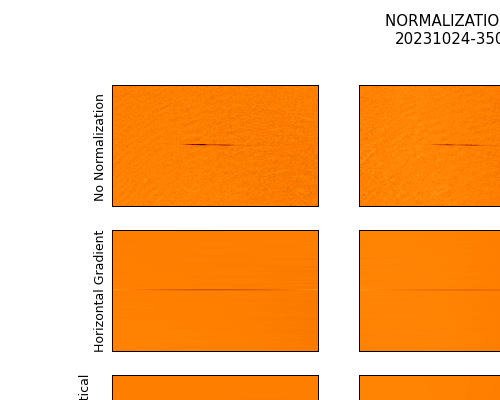

In [22]:
date        = 20231024
shot        = 350
num         = 0
dz_focus    = -0.0084
cut         = [931, 1211, 577, 1567]

# # Generate Data
# data_1 = fft_analysis(date, shot, num, dz_focus, quad_cut="quad1", multi_loop=0)#, shp="tight") ### with this shp - we can re-do it with the tight version
# data_2 = fft_analysis(date, shot, num, dz_focus, quad_cut="quad2", multi_loop=0)#, shp="tight")
# data: atoms, flat, dark, fft_atoms, fft_flat, ang1, amp

ang1 = data_1[5][cut[0]-200:cut[1]+200, cut[2]-200:cut[3]+200]
ang2 = data_2[5][cut[0]-200:cut[1]+200, cut[2]-200:cut[3]+200]

fig, ax = plt.subplots(4, 3, figsize=(10, 8))
fig.suptitle(f"NORMALIZATION \n{date}-{shot}")

ax[0][0].imshow(ang1, vmin=-2, vmax=2, cmap='afmhot_r', aspect='auto')
ax[0][1].imshow(ang2, vmin=-2, vmax=2, cmap='afmhot_r', aspect='auto')
ax[0][2].plot(ang1[336], c='C0', alpha=0.3)
ax[0][2].plot(ang2[336], c='C1', alpha=0.3)
ax[0][2].set_ylim([-1, 3])
ax[0][0].set_ylabel("No Normalization")

ax[1][0].imshow(normalize(ang1)[2], vmin=-2, vmax=2, cmap='afmhot_r', aspect='auto')
ax[1][1].imshow(normalize(ang2)[2], vmin=-2, vmax=2, cmap='afmhot_r', aspect='auto')
ax[1][2].plot(normalize(ang1)[2][356], c='C0', alpha=0.3)
ax[1][2].plot(normalize(ang2)[2][356], c='C1', alpha=0.3)
ax[1][2].set_ylim([-1, 3])
ax[1][0].set_ylabel("Horizontal Gradient")

ax[2][0].imshow(normalize(ang1)[1], vmin=-2, vmax=2, cmap='afmhot_r', aspect='auto')
ax[2][1].imshow(normalize(ang2)[1], vmin=-2, vmax=2, cmap='afmhot_r', aspect='auto')
ax[2][2].plot(normalize(ang1)[1][336], c='C0', alpha=0.3)
ax[2][2].plot(normalize(ang2)[1][336], c='C1', alpha=0.3)
ax[2][2].set_ylim([-1, 3])
ax[2][0].set_ylabel("Horizontal + Vertical \nGradient")

ax[3][0].imshow(normalize(ang1)[0], vmin=-2, vmax=2, cmap='afmhot_r', aspect='auto')
ax[3][1].imshow(normalize(ang2)[0], vmin=-2, vmax=2, cmap='afmhot_r', aspect='auto')
ax[3][2].plot(normalize(ang1)[0][336], c='C0', alpha=0.3)
ax[3][2].plot(normalize(ang2)[0][336], c='C1', alpha=0.3)
ax[3][2].set_ylim([-1, 3])
ax[3][0].set_ylabel("Subtract the gradient")


ax[0][2].yaxis.tick_right()
ax[1][2].yaxis.tick_right()
ax[2][2].yaxis.tick_right()
ax[3][2].yaxis.tick_right()

for axs in ax:
    for i in range(2):
        axs[i].set_xticks([])
        axs[i+1].set_xticks([])
        axs[i].set_yticks([])
        

plt.show()

###### LIST 

In [ ]:
foci = np.linspace(-0.02, 0.02, 201)
i = 0
for dz_focus in foci:
    #### DATA PROCESS 
    # Generate Data
    data_1 = fft_analysis(date, shot, num, dz_focus, quad_cut="quad1", multi_loop=0)#, shp="tight") ### with this shp - we can re-do it with the tight version
    data_2 = fft_analysis(date, shot, num, dz_focus, quad_cut="quad2", multi_loop=0)#, shp="tight")
    # data: atoms, flat, dark, fft_atoms, fft_flat, ang1, amp
    cut  = [931, 1211, 577, 1567]
    ang1 = data_1[5][cut[0]:cut[1], cut[2]:cut[3]]
    ang2 = data_2[5][cut[0]:cut[1], cut[2]:cut[3]]

    # ---- Data
    spin1_full_norot = ang1 - shift_rows_down(ang2, 0)
    spin2_full_norot = ang2 - 3/5*shift_rows_down(ang1, 0)
    mask_fit = fit1[1]+fit2[1] # Mask using the fit
    mask_lim = 0.05
    full = spin1_full_norot - spin2_full_norot

    spin1_full_norot[(mask_fit > -mask_lim) & (mask_fit < mask_lim)] = 0
    spin2_full_norot[(mask_fit > -mask_lim) & (mask_fit < mask_lim)] = 0

    # --- Plotting 
    gs = GridSpec(3, 2, height_ratios=[1, 1, 2])
    fig = plt.figure(figsize=(9, 8))
    ax1 = fig.add_subplot(gs[0, 0])
    ax2 = fig.add_subplot(gs[0, 1], sharey=ax1, sharex=ax1)
    ax3 = fig.add_subplot(gs[1, 0], sharey=ax1, sharex=ax1)
    ax4 = fig.add_subplot(gs[1, 1], sharey=ax1, sharex=ax1)
    ax5 = fig.add_subplot(gs[2, 0], sharey=ax1, sharex=ax1)
    ax6 = fig.add_subplot(gs[2, 1], sharey=ax1, sharex=ax1)

    ax1.imshow(ang1, vmin=-2, vmax=2, cmap="afmhot_r", aspect='auto')
    ax2.imshow(ang2, vmin=-2, vmax=2, cmap="afmhot_r", aspect='auto')
    ax3.imshow(-spin1_full_norot, vmin=-1, vmax=1, cmap="bwr", aspect='auto')
    ax4.imshow(spin2_full_norot, vmin=-1, vmax=1, cmap="bwr", aspect='auto')
    im = ax5.imshow(-full, vmin=-1., vmax=1., cmap="bwr", aspect='auto')

    full[(mask_fit > -mask_lim) & (mask_fit < mask_lim)] = 0
    im = ax6.imshow(-full, vmin=-1., vmax=1., cmap="bwr", aspect='auto')

    fig.suptitle(f"Non fudged data \nrefocus = {round(dz_focus, 6)}")
    ax1.set_title("$\sigma_+$ signal")
    ax2.set_title("$\sigma_-$ signal")
    ax3.set_title("Reconstructed $m_f = -1$")
    ax4.set_title("Reconstructed $m_f = 0$")
    ax5.set_title("Combined")
    ax6.set_title("Masked")

    # cbar = plt.colorbar(im, ax=ax5, ticks=[-1, 1], aspect=35)
    # cbar.ax.set_yticklabels(['-1', '0'])  # vertically oriented colorbar
    # cbar.ax.set_ylabel('Normalized Magnetization')

    for a in [ax1, ax2, ax3, ax4, ax5]:
        a.set_yticks([])
        a.set_xticks([])
        a.set_ylim([70, 200])

    
    plt.tight_layout()
    plt.savefig(f"/home/bec_lab/Desktop/imgs/SOAH/OAH_missmatch/focus6/{str(i).zfill(4)}.png")
    plt.close()
    i += 1

#### Smooth it out -> Make the FFT Cut bigger 

In [ ]:
### 
date        = 20231024
shot        = 350
num         = 0
dz_focus    = 0.0019
cut         = [931, 1211, 577, 1567]

def OAH_full_process_extend(date, shot, num, dz_focus, quad_cut, mask_w=0.51, multi_loop=0, fit_peaks=False, shp=None):
    multi_loop  = 0
    el_x        = 10
    el_z        = 100
    edge_x      = 10
    edge_z      = 80
    e_w         = 0.1


    atoms, flat, dark = openFiles(date, shot, num, multi_loop=multi_loop)
    atoms      = f1.squaroid(atoms - dark, width=mask_w)
    flat       = f1.squaroid(flat - dark, width=mask_w)
    fft_atoms = np.fft.fft2(atoms)
    fft_flat = np.fft.fft2(flat)

    fft_atoms = fft_atoms[5:-5, 5:-5]
    fft_flat = fft_flat[5:-5, 5:-5]

    quad1, q1peak  = f1.box_cutter_pad_ellips(fft_atoms, quad_cut, 
                                              el_x, el_z, 
                                              edge_x=edge_x, edge_z=edge_z, e_w=e_w, 
                                              peakswithfitting=fit_peaks,
                                              shp=shp)
    flatq1, f1peak = f1.box_cutter_pad_ellips(fft_flat,  quad_cut, 
                                              el_x, el_z, 
                                              edge_x=edge_x, edge_z=edge_z, e_w=e_w, 
                                              indices=q1peak,                                              
                                              peakswithfitting=fit_peaks,
                                              shp=shp)
    quad1cut, flatq1cut = f1.sizecomp(quad1, flatq1)

    fft1 = np.fft.fftshift(quad1cut)
    flatfft1 = np.fft.fftshift(flatq1cut)

    fft_kx = np.fft.fftfreq(fft1.shape[1], d=pix_size)  # Discrete FFT Sample Frequency in x
    fft_ky = np.fft.fftfreq(fft1.shape[0], d=pix_size)  # Discrete FFT Sample Frequency in z
    fft_k2 = fft_kx[None, :] ** 2 + fft_ky[:, None] ** 2  # Discrete FFT Sample Frequency in main axes multiplied
    ly = 0  # .5E6#-3E6#.                                           # Adjusting the fft_ky array
    coma_y_arg = ly * fft_ky[:, None] * (3 * fft_k2 / k0 ** 2) / k0
    lin_y = np.exp(-1j * coma_y_arg)
    focus = np.exp(-1j * dz_focus * np.sqrt(k0 **2 - fft_k2))
    fft1 = fft1 * focus * lin_y
    flatfft1 = flatfft1 * focus * lin_y

    inv1 = np.fft.ifft2(fft1) / np.fft.ifft2(flatfft1)
    inv1 = inv1[border_x:-border_x, border_z:-border_z]

    # Get Phase
    ang1 = np.angle(inv1)
    ang1 = f1.unwrapper(ang1)

    # Get amp 
    amp = np.abs(inv1)
    amp = np.log(amp**2)

    # Normalize
    normfactor = ang1.mean()
    ang1 = ang1 - normfactor
    ang1 = normalize(ang1)[0] 
    
    return atoms, flat, ang1, amp

##### Focus over tight cut -> no extension to the cut window

In [ ]:
multi_loop  = 0
el_x        = 10
el_z        = 100
edge_x      = 10
edge_z      = 80
e_w         = 0.1
mask_w      = 0.51
quad_cut    = "quad1"

atoms, flat, dark = openFiles(date, shot, num, multi_loop=multi_loop)
atoms      = f1.squaroid(atoms - dark, width=mask_w)
flat       = f1.squaroid(flat - dark, width=mask_w)
fft_atoms = np.fft.fft2(atoms)
fft_flat = np.fft.fft2(flat)
fft_atoms = fft_atoms[5:-5, 5:-5]
fft_flat = fft_flat[5:-5, 5:-5]

quad1, q1peak  = f1.box_cutter_pad_ellips(fft_atoms, quad_cut, el_x, el_z, edge_x=edge_x, edge_z=edge_z, e_w=e_w, shp="tight")
flatq1, f1peak = f1.box_cutter_pad_ellips(fft_flat,  quad_cut, el_x, el_z, edge_x=edge_x, edge_z=edge_z, e_w=e_w, indices=q1peak, shp="tight") # same indices as for quad
quad1cut, flatq1cut = f1.sizecomp(quad1, flatq1)

fft1 = np.fft.fftshift(quad1cut)
flatfft1 = np.fft.fftshift(flatq1cut)

In [ ]:
# Loop this? 
foci = np.linspace(-0.02, 0.02, 301)
i = 0

for dz_focus in foci: 
    # -------------------------------------- REFOCUSING --------------------------------------------------
    fft_kx = np.fft.fftfreq(fft1.shape[1], d=pix_size)  # Discrete FFT Sample Frequency in x
    fft_ky = np.fft.fftfreq(fft1.shape[0], d=pix_size)  # Discrete FFT Sample Frequency in z
    fft_k2 = fft_kx[None, :] ** 2 + fft_ky[:, None] ** 2  # Discrete FFT Sample Frequency in main axes multiplied
    ly = 0  # .5E6#-3E6#.                                           # Adjusting the fft_ky array
    coma_y_arg = ly * fft_ky[:, None] * (3 * fft_k2 / k0 ** 2) / k0
    lin_y = np.exp(-1j * coma_y_arg)
    focus = np.exp(-1j * dz_focus * np.sqrt(k0 **2 - fft_k2))
    fft1_proc = fft1 * focus * lin_y
    flatfft1_proc = flatfft1 * focus * lin_y

    inv1 = np.fft.ifft2(fft1_proc) / np.fft.ifft2(flatfft1_proc)
    inv1 = inv1[border_x:-border_x, border_z:-border_z]

    ang1 = np.angle(inv1)
    ang1 = f1.unwrapper(ang1)
    amp = np.abs(inv1)
    amp = np.log(amp**2)

    normfactor = ang1.mean()
    ang1 = ang1 - normfactor
    ang1 = normalize(ang1)[0] 

    fig, ax = plt.subplots(2, 2)
    fig.suptitle(f"{round(dz_focus, 4)}")
    ax[0][0].imshow(abs(quad1), cmap=plt.get_cmap('gist_heat'), norm=colors.LogNorm(), aspect='auto', interpolation="none")
    ax[0][1].imshow(abs(flatq1), cmap=plt.get_cmap('gist_heat'), norm=colors.LogNorm(), aspect='auto', interpolation="none")

    angcut = ang1[int(0.48 * ang1.shape[0]) : int(0.52 * ang1.shape[0]), int(0.3 * ang1.shape[1]) : int(0.6 * ang1.shape[1])]
    ampcut = amp[int(0.48 * amp.shape[0]) : int(0.52 * amp.shape[0]), int(0.3 * amp.shape[1]) : int(0.6 * amp.shape[1])]

    ax[1][0].imshow(angcut, vmin=-2, vmax=2, cmap="afmhot_r", aspect="auto", interpolation="none")
    ax[1][1].imshow(ampcut, vmin=-2, vmax=2, cmap="afmhot_r", aspect="auto", interpolation="none")


    for axs in ax:
        for a in axs:
            a.set_xticks([])
            a.set_yticks([])

    plt.savefig(f"/home/bec_lab/Desktop/imgs/SOAH/OAH_missmatch/windowExpansion/{str(i).zfill(4)}.jpg")
    plt.close()
    i += 1

## SPIN DEPENDENT CONTRAST 

### With MOT, with BIAS-Y - SG pull. 

In [ ]:
### Load and cut properly refocused data
date = 20231207
shots = range(185, 205)
dz_focus = 0.005
shot_time = 2 # time between shots in ms 
cut = [1, -1, 1, -250]
n = 50

save_folder = f"/home/bec_lab/Desktop/imgs/SOAH/polarizations_contrast/{date}/"
if not os.path.exists(save_folder):
    os.makedirs(save_folder)

##### Generate the data 

In [ ]:
### Generate data, with processed and refocused images. 
ALL_DATA = []

for shot in shots:
    print(f"ANALYSING SHOT {shot}")
    data_1 = [fft_analysis(date, shot, num, dz_focus, quad_cut="quad1", multi_loop=0) for num in range(n)]
    data_2 = [fft_analysis(date, shot, num, dz_focus, quad_cut="quad2", multi_loop=0) for num in range(n)]
    angs1 = [data_1[i][5][cut[0]:cut[1], cut[2]:cut[3]] for i in range(len(data_1))]
    angs2 = [data_2[i][5][cut[0]:cut[1], cut[2]:cut[3]] for i in range(len(data_2))]
    ALL_DATA.append([shot, [angs1, angs2]])
    clear_output()
    
np.save(save_folder + "all_data.npy", np.asarray(ALL_DATA, dtype="object"))

##### Load the data

In [ ]:
## Takes 3.69 s to load 
ALL_DATA = np.load(save_folder + "all_data.npy", allow_pickle=True)

In [ ]:
### Load and cut properly refocused data
date = 20231207
dz_focus = 0.005
shot_time = 2 # time between shots in ms 
# cut = [1, 140, 568, 1581]
cut = [1, -1, 1, -1]

shots = range(185, 205)

n = 50

for shot in shots:
    print(f"ANALYSING SHOT {shot}")
    try: 
        data_1 = [fft_analysis(date, shot, num, dz_focus, quad_cut="quad1", multi_loop=0) for num in range(n)]
        data_2 = [fft_analysis(date, shot, num, dz_focus, quad_cut="quad2", multi_loop=0) for num in range(n)]
        clear_output()
        print(f"ANALYSING SHOT {shot}")
        print("Done")
        # data: atoms, flat, dark, fft_atoms, fft_flat, ang1, amp

        # Get all the cut versions of angles in one array 
        angs1 = [data_1[i][5][cut[0]:cut[1], cut[2]:cut[3]] for i in range(len(data_1))]
        angs2 = [data_2[i][5][cut[0]:cut[1], cut[2]:cut[3]] for i in range(len(data_2))]

        save_folder = f"/home/bec_lab/Desktop/imgs/SOAH/{date}/{shot}_video/"
        if not os.path.exists(save_folder):
            os.makedirs(save_folder)

        for i in range(n):
            fig, ax = plt.subplots(2, 1, figsize=(8, 4))
            ax[0].imshow(angs1[i], aspect='auto', cmap='afmhot_r', vmin=-1, vmax=2, origin='lower')
            ax[1].imshow(angs2[i], aspect='auto', cmap='afmhot_r', vmin=-1, vmax=2, origin='lower')
            ax[0].set_title(f"{date} - {shot} - t = {0 + i*shot_time} ms")

            for a in ax:
                a.set_xticks([])
                a.set_yticks([])

            plt.tight_layout()
            plt.savefig(save_folder + f"{str(i).zfill(3)}")
            plt.close()

        clear_output()
    except: 
        pass


##### Fitting 

In [ ]:
for shot, quads in ALL_DATA:
    print(f"{shot=}")

    save_folder_fit = f"/home/bec_lab/Desktop/imgs/SOAH/polarizations_contrast/{date}/fitted_images/{shot}/"
    if not os.path.exists(save_folder_fit):
        "Making a folder"
        os.makedirs(save_folder_fit)

    fits_1 = []  # For quad1
    fits_2 = []  # For quad2

    initial_g_1 = {'offset': 0.0,
                   'amp_ov': 1.0,
                   'ang': 0,
                   'center': (50, 1250),
                   'tfa': 1,
                   'tfw': (20, 200),
                   'ga': 1,
                   'gw': (200, 200),
                   'j_guess': 40,
                   'axamp': 1,
                   'x_shift': 0.0,
                   'squeeze_par': 1.0}
    initial_g_2 = {'offset': 0.0,
                   'amp_ov': 1.0,
                   'ang': 0,
                   'center': (50, 1250),
                   'tfa': 1,
                   'tfw': (20, 200),
                   'ga': 1,
                   'gw': (20, 200),
                   'j_guess': 40,
                   'axamp': 1,
                   'x_shift': 0.0,
                   'squeeze_par': 1.0}

    for i in range(50):
        # Do some extra background subtraction.
        pic1 = normalize(quads[0][i])[0]
        pic2 = normalize(quads[1][i])[0]

        fit1 = fitting(pic1, "tf", init_guess=initial_g_1, OAH=True)
        fit2 = fitting(pic2, "tf", init_guess=initial_g_2, OAH=True)

        fig, ax = plt.subplots(3, 2, figsize=(8, 4))
        fig.suptitle(f"{shot}- t = {0 + i * shot_time} ms")
        ax[0][0].set_title("Quad 1")
        ax[0][1].set_title("Quad 2")
        ax[0][0].imshow(fit1[0], aspect='auto', cmap='afmhot_r', vmin=-1, vmax=1, origin='lower')
        ax[1][0].imshow(fit1[1], aspect='auto', cmap='afmhot_r', vmin=-1, vmax=1, origin='lower')
        ax[2][0].imshow(fit1[2], aspect='auto', cmap='afmhot_r', vmin=-1, vmax=1, origin='lower')
        ax[0][1].imshow(fit2[0], aspect='auto', cmap='afmhot_r', vmin=-1, vmax=1, origin='lower')
        ax[1][1].imshow(fit2[1], aspect='auto', cmap='afmhot_r', vmin=-1, vmax=1, origin='lower')
        ax[2][1].imshow(fit2[2], aspect='auto', cmap='afmhot_r', vmin=-1, vmax=1, origin='lower')
        for axs in ax:
            for a in axs:
                a.set_xticks([])
                a.set_yticks([])
        plt.tight_layout()
        plt.savefig(save_folder_fit + f"{str(i).zfill(3)}")
        plt.close()

        fits_1.append(fit1)
        fits_2.append(fit2)

        # Set initial guess to the last guess.
        initial_g_1 = {'offset': fit1[-1].beta[0],
                       'amp_ov': fit1[-1].beta[1],
                       'ang': fit1[-1].beta[2],
                       'center': (fit1[-1].beta[3], fit1[-1].beta[4]),
                       'tfa': fit1[-1].beta[5],
                       'tfw': (fit1[-1].beta[6], fit1[-1].beta[7]),
                       'ga': 1,
                       'gw': (200, 200),
                       'j_guess': 40,
                       'axamp': 1,
                       'x_shift': 0.0,
                       'squeeze_par': 1.0}

        initial_g_2 = {'offset': fit2[-1].beta[0],
                       'amp_ov': fit2[-1].beta[1],
                       'ang': fit2[-1].beta[2],
                       'center': (fit2[-1].beta[3], fit2[-1].beta[4]),
                       'tfa': fit2[-1].beta[5],
                       'tfw': (fit2[-1].beta[6], fit2[-1].beta[7]),
                       'ga': fit2[-1].beta[5],
                       'gw': (fit2[-1].beta[6], fit2[-1].beta[7]),
                       'j_guess': 40,
                       'axamp': 1,
                       'x_shift': 0.0,
                       'squeeze_par': 1.0}

        clear_output()

    ###  Each of these files is about 10GB large, so maybe that kindof explains it.
    np.save(save_folder_fit + "fitted_run.npy", np.asarray([fits_1, fits_2], dtype="object"))

In [ ]:
# Chrashes if I try to load all of the data at once. 
# Might need to split it up a bit
# ALL_FITS = [np.load(f"/home/bec_lab/Desktop/imgs/SOAH/polarizations_contrast/{date}/fitted_images/{shot}/fitted_run.npy",  allow_pickle=True) for shot in shots]

##### Load the fits

In [ ]:
date = 20231207
shots = range(185, 205)

# Takes 2 min 13s
quad1_betas = []
quad2_betas = []

# Also get max values of the fit, and of the data itself. 
max_arrs_1 = []
max_fits_1 = []
max_arrs_2 = []
max_fits_2 = []

for shot in shots:
    print(f"Opening shot: {shot}")
    betas = np.load(f"/home/bec_lab/Desktop/imgs/SOAH/polarizations_contrast/{date}/fitted_images/{shot}/fitted_run.npy",  allow_pickle=True)
    max_arr_1 = [betas[0][i][0].max() for i in range(50)]
    max_fit_1 = [betas[0][i][1].max() for i in range(50)]
    max_arr_2 = [betas[1][i][0].max() for i in range(50)]
    max_fit_2 = [betas[1][i][1].max() for i in range(50)]
    max_arrs_1.append(max_arr_1)
    max_fits_1.append(max_fit_1)
    max_arrs_2.append(max_arr_2)
    max_fits_2.append(max_fit_2)
    
    quad1_b = [betas[0][i][-1].beta for i in range(50)]
    quad2_b = [betas[1][i][-1].beta for i in range(50)]
    quad1_betas.append([shot, quad1_b])    
    quad2_betas.append([shot, quad2_b])

clear_output()
print("All files loaded successfully. It seems.")

flip_betas1 = np.array([np.array([quad1_betas[shot][1][num] for num in range(50)]).T for shot in range(20)])
flip_betas2 = np.array([np.array([quad2_betas[shot][1][num] for num in range(50)]).T for shot in range(20)])
names = ["offset", "amplitude", "angle", "X-position", "Z-position", "TF-amplitude", "width X", "width Z"]

In [ ]:
flip_betas1.shape

##### Plotting

In [ ]:
def create_two_colored_suptitle(fig, text1, text2, color1, color2, x_pos, y_pos):
    # Add the first part of the suptitle
    t = fig.text(x_pos, y_pos, text1, ha='right', va='baseline', color=color1, fontsize=16)
    # Add the second part of the suptitle
    fig.text(x_pos + 0.01, y_pos, text2, ha='left', va='baseline', color=color2, fontsize=16)


In [ ]:
for run in range(20):
    xs = np.linspace(0, 100, 50)
    fig, ax = plt.subplots(10, 1, figsize=(8,10))
    fig.suptitle(f"Fitted Variables:  {date} - {str(run+185).zfill(4)}")
    for i in range(8):
        ax[i].plot(xs, flip_betas1[run][i], alpha=0.4, c='firebrick')
        ax[i].plot(xs, flip_betas2[run][i], alpha=0.4, c='cornflowerblue')
        ax[i].set_ylabel(names[i])
        ax[i].set_xticks([])
    
    ax[8].plot(xs, max_arrs_1[run], alpha=0.4, c='firebrick') 
    ax[8].plot(xs, max_arrs_2[run], alpha=0.4, c='cornflowerblue') 
    ax[9].plot(xs, max_fits_1[run], alpha=0.4, c='firebrick') 
    ax[9].plot(xs, max_fits_2[run], alpha=0.4, c='cornflowerblue')
    ax[8].set_ylabel("Max array value")
    ax[9].set_ylabel("Max fitted value")
    
    ax[-1].set_xticks([0, 25.0, 50.0, 75.0, 100.0])
    ax[-1].set_xlabel("Time [ms]")

    create_two_colored_suptitle(fig, 'BEAM (-1)', ' BEAM (+1)', 'firebrick', 'cornflowerblue', 0.5, 0.92)
    plt.savefig(f"/home/bec_lab/Desktop/imgs/SOAH/polarizations_contrast/{date}/betas/{str(run+185).zfill(4)}.png")
    plt.show()

In [ ]:
min(flip_betas2[i+10][4])

In [ ]:
# Smaller plots, just the max_fitted_values
fig, ax = plt.subplots(10, 2, figsize=(9, 10))
xs = np.linspace(0, 100, 50)
fig.suptitle(f"WITH MOT, BIAS-Y \n{date} - {shots[0]} - {shots[-1]}")
# create_two_colored_suptitle(fig, 'BEAM (-1)', ' BEAM (+1)', 'firebrick', 'cornflowerblue', 0.5, 0.92)

all_avgs = []

ax[0][0].set_title("Peak (fitted) density")
ax[0][1].set_title("Z-position")

for i in range(10):
    ax[i][0].plot(xs, max_fits_1[i+10], alpha=0.4, c='firebrick') 
    ax[i][0].plot(xs, max_fits_2[i+10], alpha=0.4, c='cornflowerblue')
    ax[i][1].plot(xs, flip_betas1[i+10][4], alpha=0.4, c='firebrick')
    ax[i][1].plot(xs, flip_betas2[i+10][4], alpha=0.4, c='cornflowerblue')
    ax[i][1].axhline(y=flip_betas2[i+10][4][0], alpha=0.4, c='k', ls='--')
    ax[i][1].fill_between(xs, flip_betas2[i+10][4][0], flip_betas2[i+10][4], step="mid", alpha=0.051, color='k')

    ratios = [max_fits_1[i+10][j] / max_fits_2[i+10][j] for j in range(50)]
    avg = round(sum(ratios)/len(ratios), 3)
    ax[i][0].scatter([], [], alpha=0.4, c='purple', label=f"r = {avg}")
    ax[i][0].legend()
    all_avgs.append(sum(ratios)/len(ratios))
    
    if avg > 1:
        ax[i][0].fill_between(xs, max_fits_1[i+10], max_fits_2[i+10], step="mid", alpha=0.1, color='firebrick')
#         ax[i][1].set_ylim([0.9*min(flip_betas2[i+10][4]), 1.1*2*flip_betas2[i+10][4][0]-min(flip_betas2[i+10][4])])
        ax[i][1].set_ylim([400, 1600])
        ax[i][0].set_ylabel(f"$sf_t$ = 15 ms", rotation=0, labelpad=40)

    else: 
        ax[i][0].fill_between(xs, max_fits_1[i+10], max_fits_2[i+10], step="mid", alpha=0.1, color='cornflowerblue')
#         ax[i][1].set_ylim([0.9*2*flip_betas2[i+10][4][0]-max(flip_betas2[i+10][4]), 1.1*max(flip_betas2[i+10][4])])
        ax[i][1].set_ylim([400, 1600])
        ax[i][0].set_ylabel(f"$sf_t$ = 95 ms", rotation=0, labelpad=40)

    ax[i][1].yaxis.set_label_position("right")
    ax[i][1].yaxis.tick_right()
    ax[i][0].set_xticks([])
    ax[i][1].set_xticks([])
#     ax[i][0].set_yticks([])
#     ax[i][1].set_yticks([round(flip_betas2[i+10][4][0])])

ax[-1][0].set_xticks([0, 50.0, 100.0])
ax[-1][1].set_xticks([0, 50.0, 100.0])
ax[-1][0].set_xlabel("Time [ms]")
ax[-1][1].set_xlabel("Time [ms]")
plt.tight_layout()

#   plt.savefig(f"/home/bec_lab/Desktop/imgs/SOAH/polarizations_contrast/{date}/betas/{str(run+185).zfill(4)}.png")
plt.show()


In [ ]:
print(sum(all_avgs[:5])/len(all_avgs[:5]))
print(sum(all_avgs[5:])/len(all_avgs[5:]))

In [ ]:
print([0.9*min(flip_betas2[i+10][4]), 1.1*2*flip_betas2[i+10][4][0]-min(flip_betas2[i+10][4])])
print([0.9*2*flip_betas2[i+10][4][0]-max(flip_betas2[i+10][4]), 1.1*max(flip_betas2[i+10][4])])


In [ ]:
sum(all_avgs[5:])/len(all_avgs[5:])

### No MOT, no BIAS

In [ ]:
### Load and cut properly refocused data
date = 20231208
shots = range(65, 75)
dz_focus = 0.005
shot_time = 2 # time between shots in ms 
cut = [1, -1, 1, -250]
n = 50

save_folder = f"/home/bec_lab/Desktop/imgs/SOAH/polarizations_contrast/{date}/"
if not os.path.exists(save_folder):
    os.makedirs(save_folder)

##### Generate Data

In [ ]:
### Generate data, with processed and refocused images. 
ALL_DATA = []

for shot in shots:
    print(f"ANALYSING SHOT {shot}")
    data_1 = [fft_analysis(date, shot, num, dz_focus, quad_cut="quad1", multi_loop=0) for num in range(n)]
    data_2 = [fft_analysis(date, shot, num, dz_focus, quad_cut="quad2", multi_loop=0) for num in range(n)]
    angs1 = [data_1[i][5][cut[0]:cut[1], cut[2]:cut[3]] for i in range(len(data_1))]
    angs2 = [data_2[i][5][cut[0]:cut[1], cut[2]:cut[3]] for i in range(len(data_2))]
    ALL_DATA.append([shot, [angs1, angs2]])
    clear_output()
    
np.save(save_folder + "all_data.npy", np.asarray(ALL_DATA, dtype="object"))

In [ ]:
arr_t = [i for i in range(65, 75)]
arr_t.append(81)

##### Load Data

In [ ]:
print(arr_t)

In [ ]:
## Takes 3.69 s to load 
ALL_DATA = np.load(save_folder + "all_data.npy", allow_pickle=True)

##### Fitting

In [ ]:
for shot, quads in ALL_DATA:
    print(f"{shot=}")

#     if shot not in [67, 71]:
#         continue
    save_folder_fit = f"/home/bec_lab/Desktop/imgs/SOAH/polarizations_contrast/{date}/fitted_images/{shot}/"
    if not os.path.exists(save_folder_fit):
        os.makedirs(save_folder_fit)

    fits_1 = []  # For quad1
    fits_2 = []  # For quad2

    initial_g_1 = {'offset': 0.0,
                   'amp_ov': 1.0,
                   'ang': 0,
                   'center': (50, 1150),
                   'tfa': 1,
                   'tfw': (20, 200),
                   'ga': 1,
                   'gw': (200, 200),
                   'j_guess': 40,
                   'axamp': 1,
                   'x_shift': 0.0,
                   'squeeze_par': 1.0}
    initial_g_2 = {'offset': 0.0,
                   'amp_ov': 1.0,
                   'ang': 0,
                   'center': (50, 1150),
                   'tfa': 1,
                   'tfw': (20, 200),
                   'ga': 1,
                   'gw': (20, 200),
                   'j_guess': 40,
                   'axamp': 1,
                   'x_shift': 0.0,
                   'squeeze_par': 1.0}

    for i in range(50):
        # Do some extra background subtraction.
        pic1 = normalize(quads[0][i])[0]
        pic2 = normalize(quads[1][i])[0]

        fit1 = fitting(pic1, "tf", init_guess=initial_g_1, OAH=True)
        fit2 = fitting(pic2, "tf", init_guess=initial_g_2, OAH=True)

        fig, ax = plt.subplots(3, 2, figsize=(8, 4))
        fig.suptitle(f"{shot}- t = {0 + i * shot_time} ms")
        ax[0][0].set_title("Quad 1")
        ax[0][1].set_title("Quad 2")
        ax[0][0].imshow(fit1[0], aspect='auto', cmap='afmhot_r', vmin=-1, vmax=1, origin='lower')
        ax[1][0].imshow(fit1[1], aspect='auto', cmap='afmhot_r', vmin=-1, vmax=1, origin='lower')
        ax[2][0].imshow(fit1[2], aspect='auto', cmap='afmhot_r', vmin=-1, vmax=1, origin='lower')
        ax[0][1].imshow(fit2[0], aspect='auto', cmap='afmhot_r', vmin=-1, vmax=1, origin='lower')
        ax[1][1].imshow(fit2[1], aspect='auto', cmap='afmhot_r', vmin=-1, vmax=1, origin='lower')
        ax[2][1].imshow(fit2[2], aspect='auto', cmap='afmhot_r', vmin=-1, vmax=1, origin='lower')
        for axs in ax:
            for a in axs:
                a.set_xticks([])
                a.set_yticks([])
        plt.tight_layout()
        plt.savefig(save_folder_fit + f"{str(i).zfill(3)}")
        plt.close()

        fits_1.append(fit1)
        fits_2.append(fit2)

        # Set initial guess to the last guess.
        initial_g_1 = {'offset': fit1[-1].beta[0],
                       'amp_ov': fit1[-1].beta[1],
                       'ang': fit1[-1].beta[2],
                       'center': (fit1[-1].beta[3], fit1[-1].beta[4]),
                       'tfa': fit1[-1].beta[5],
                       'tfw': (fit1[-1].beta[6], fit1[-1].beta[7]),
                       'ga': 1,
                       'gw': (200, 200),
                       'j_guess': 40,
                       'axamp': 1,
                       'x_shift': 0.0,
                       'squeeze_par': 1.0}

        initial_g_2 = {'offset': fit2[-1].beta[0],
                       'amp_ov': fit2[-1].beta[1],
                       'ang': fit2[-1].beta[2],
                       'center': (fit2[-1].beta[3], fit2[-1].beta[4]),
                       'tfa': fit2[-1].beta[5],
                       'tfw': (fit2[-1].beta[6], fit2[-1].beta[7]),
                       'ga': fit2[-1].beta[5],
                       'gw': (fit2[-1].beta[6], fit2[-1].beta[7]),
                       'j_guess': 40,
                       'axamp': 1,
                       'x_shift': 0.0,
                       'squeeze_par': 1.0}

        clear_output()

    ###  Each of these files is about 10GB large, so maybe that kindof explains it.
    np.save(save_folder_fit + "fitted_run.npy", np.asarray([fits_1, fits_2], dtype="object"))

In [ ]:
np.append(ALL_DATA[0]dd, [shot, [angs1, angs2]])

##### Loading the fits

In [ ]:
for a in ALL_DATA:
    print(a[0])

In [ ]:
date = 20231208
shot = 81
data_1 = [fft_analysis(date, shot, num, dz_focus, quad_cut="quad1", multi_loop=0) for num in range(n)]
data_2 = [fft_analysis(date, shot, num, dz_focus, quad_cut="quad2", multi_loop=0) for num in range(n)]
angs1 = [data_1[i][5][cut[0]:cut[1], cut[2]:cut[3]] for i in range(len(data_1))]
angs2 = [data_2[i][5][cut[0]:cut[1], cut[2]:cut[3]] for i in range(len(data_2))]
ALL_DATA.append([shot, [angs1, angs2]]) # Append the nr 81 instead


In [ ]:
# Takes 2 min 13s
quad1_betas = []
quad2_betas = []

# Also get max values of the fit, and of the data itself. 
max_arrs_1 = []
max_fits_1 = []
max_arrs_2 = []
max_fits_2 = []

for shot in shots:
    print(f"Opening shot: {shot}")
    betas = np.load(f"/home/bec_lab/Desktop/imgs/SOAH/polarizations_contrast/{date}/fitted_images/{shot}/fitted_run.npy",  allow_pickle=True)
    max_arr_1 = [betas[0][i][0].max() for i in range(50)]
    max_fit_1 = [betas[0][i][1].max() for i in range(50)]
    max_arr_2 = [betas[1][i][0].max() for i in range(50)]
    max_fit_2 = [betas[1][i][1].max() for i in range(50)]
    max_arrs_1.append(max_arr_1)
    max_fits_1.append(max_fit_1)
    max_arrs_2.append(max_arr_2)
    max_fits_2.append(max_fit_2)
    
    quad1_b = [betas[0][i][-1].beta for i in range(50)]
    quad2_b = [betas[1][i][-1].beta for i in range(50)]
    quad1_betas.append([shot, quad1_b])    
    quad2_betas.append([shot, quad2_b])

clear_output()
print("All files loaded successfully. It seems.")

In [ ]:
flip_betas1 = np.array([np.array([quad1_betas[shot][1][num] for num in range(50)]).T for shot in range(10)])
flip_betas2 = np.array([np.array([quad2_betas[shot][1][num] for num in range(50)]).T for shot in range(10)])
names = ["offset", "amplitude", "angle", "X-position", "Z-position", "TF-amplitude", "width X", "width Z"]

##### Plotting 

In [ ]:
for run in range(10):
    xs = np.linspace(0, 100, 50)
    fig, ax = plt.subplots(10, 1, figsize=(8,10))
    fig.suptitle(f"Fitted Variables:  {date} - {str(run+65).zfill(4)}")
    for i in range(8):
        ax[i].plot(xs, flip_betas1[run][i], alpha=0.4, c='firebrick')
        ax[i].plot(xs, flip_betas2[run][i], alpha=0.4, c='cornflowerblue')
        ax[i].set_ylabel(names[i])
        ax[i].set_xticks([])
    
    ax[8].plot(xs, max_arrs_1[run], alpha=0.4, c='firebrick') 
    ax[8].plot(xs, max_arrs_2[run], alpha=0.4, c='cornflowerblue') 
    ax[9].plot(xs, max_fits_1[run], alpha=0.4, c='firebrick') 
    ax[9].plot(xs, max_fits_2[run], alpha=0.4, c='cornflowerblue')
    ax[8].set_ylabel("Max array value")
    ax[9].set_ylabel("Max fitted value")
    
    ax[-1].set_xticks([0, 25.0, 50.0, 75.0, 100.0])
    ax[-1].set_xlabel("Time [ms]")

    create_two_colored_suptitle(fig, 'BEAM (-1)', ' BEAM (+1)', 'firebrick', 'cornflowerblue', 0.5, 0.92)
    plt.savefig(f"/home/bec_lab/Desktop/imgs/SOAH/polarizations_contrast/{date}/betas/{str(run+65).zfill(4)}.png")
    plt.show()

In [ ]:
# Smaller plots, just the max_fitted_values
fig, ax = plt.subplots(10, 2, figsize=(9, 10))
xs = np.linspace(0, 100, 50)
fig.suptitle(f"NO MOT NO BIAS \n{date} - {shots[0]} - {shots[-1]}")
# create_two_colored_suptitle(fig, 'BEAM (-1)', ' BEAM (+1)', 'firebrick', 'cornflowerblue', 0.5, 0.92)

all_avgs = []

ax[0][0].set_title("Peak (fitted) density")
ax[0][1].set_title("Z-position")

## Turn the arrays around so that it mathces the colors of the other runs: 
max_fits_1 = np.concatenate((max_fits_1[5:], max_fits_1[:5]))
max_fits_2 = np.concatenate((max_fits_2[5:], max_fits_2[:5]))
flip_betas1 = np.concatenate((flip_betas1[5:], flip_betas1[:5]))
flip_betas2 = np.concatenate((flip_betas2[5:], flip_betas2[:5]))


for i in range(10):
    ax[i][0].plot(xs, max_fits_1[i], alpha=0.4, c='firebrick') 
    ax[i][0].plot(xs, max_fits_2[i], alpha=0.4, c='cornflowerblue')
    ax[i][1].plot(xs, flip_betas1[i][4], alpha=0.4, c='firebrick')
    ax[i][1].plot(xs, flip_betas2[i][4], alpha=0.4, c='cornflowerblue')
    ax[i][1].axhline(y=flip_betas2[i][4][0], alpha=0.4, c='k', ls='--')
    ax[i][1].fill_between(xs, flip_betas2[i][4][0], flip_betas2[i][4], step="mid", alpha=0.051, color='k')

    ratios = [max_fits_1[i][j] / max_fits_2[i][j] for j in range(50)]
    avg = round(sum(ratios)/len(ratios), 3)
    ax[i][0].scatter([], [], alpha=0.4, c='purple', label=f"r = {avg}")
    ax[i][0].legend(loc=1)
    all_avgs.append(sum(ratios)/len(ratios))
    
    if avg > 1:
        ax[i][0].fill_between(xs, max_fits_1[i], max_fits_2[i], step="mid", alpha=0.1, color='firebrick')
#         ax[i][1].set_ylim([0.95*min(flip_betas2[i][4]), 1.05*2*flip_betas2[i][4][0]-min(flip_betas2[i][4])])
        ax[i][0].set_ylabel(f"$sf_t$ = 15 ms", rotation=0, labelpad=40)
        
    else: 
        ax[i][0].fill_between(xs, max_fits_1[i], max_fits_2[i], step="mid", alpha=0.1, color='cornflowerblue')
#         ax[i][1].set_ylim([0.95*2*flip_betas2[i][4][0]-max(flip_betas2[i][4]), 1.05*max(flip_betas2[i][4])])
        ax[i][0].set_ylabel(f"$sf_t$ = 95 ms", rotation=0, labelpad=40)

    
    ax[i][1].set_ylim([400, 1600])
    ax[i][1].yaxis.set_label_position("right")
    ax[i][1].yaxis.tick_right()
    ax[i][0].set_xticks([])
    ax[i][1].set_xticks([])
#     ax[i][0].set_yticks([])
#     ax[i][1].set_yticks([round(flip_betas2[i][4][0])])
    
ax[-1][0].set_xticks([0, 50.0, 100.0])
ax[-1][1].set_xticks([0, 50.0, 100.0])
ax[-1][0].set_xlabel("Time [ms]")
ax[-1][1].set_xlabel("Time [ms]")
plt.tight_layout()

#   plt.savefig(f"/home/bec_lab/Desktop/imgs/SOAH/polarizations_contrast/{date}/betas/{str(run+185).zfill(4)}.png")
plt.show()


In [ ]:
print(sum(all_avgs[:5])/len(all_avgs[:5]))
print(sum(all_avgs[5:])/len(all_avgs[5:]))

### No MOT, with BIAS-Y

In [ ]:
### Load and cut properly refocused data
date = 20231208
shots = range(48, 53)

dz_focus = 0.005
shot_time = 2 # time between shots in ms 
cut = [1, -1, 1, -250]
n = 50

save_folder = f"/home/bec_lab/Desktop/imgs/SOAH/polarizations_contrast/{date}/"
if not os.path.exists(save_folder):
    os.makedirs(save_folder)

In [ ]:
### Generate data, with processed and refocused images. 
ALL_DATA = []

for shot in shots:
    print(f"ANALYSING SHOT {shot}")
    data_1 = [fft_analysis(date, shot, num, dz_focus, quad_cut="quad1", multi_loop=0) for num in range(n)]
    data_2 = [fft_analysis(date, shot, num, dz_focus, quad_cut="quad2", multi_loop=0) for num in range(n)]
    angs1 = [data_1[i][5][cut[0]:cut[1], cut[2]:cut[3]] for i in range(len(data_1))]
    angs2 = [data_2[i][5][cut[0]:cut[1], cut[2]:cut[3]] for i in range(len(data_2))]
    ALL_DATA.append([shot, [angs1, angs2]])
    clear_output()
    
np.save(save_folder + "all_data_BIAS.npy", np.asarray(ALL_DATA, dtype="object"))

In [ ]:
## Takes 3.69 s to load 
ALL_DATA = np.load(save_folder + "all_data_BIAS.npy", allow_pickle=True)

In [ ]:
for shot, quads in ALL_DATA:
    print(f"{shot=}")

    if shot not in [52]:
        continue
    save_folder_fit = f"/home/bec_lab/Desktop/imgs/SOAH/polarizations_contrast/{date}/fitted_images/{shot}/"
    if not os.path.exists(save_folder_fit):
        os.makedirs(save_folder_fit)

    fits_1 = []  # For quad1
    fits_2 = []  # For quad2

    initial_g_1 = {'offset': 0.0,
                   'amp_ov': 1.0,
                   'ang': 0,
                   'center': (45, 1150),
                   'tfa': 0.6,
                   'tfw': (5, 300),
                   'ga': 1,
                   'gw': (200, 200),
                   'j_guess': 40,
                   'axamp': 1,
                   'x_shift': 0.0,
                   'squeeze_par': 1.0}
    initial_g_2 = {'offset': 0.0,
                   'amp_ov': 1.0,
                   'ang': 0,
                   'center': (50, 1150),
                   'tfa': 1,
                   'tfw': (10, 300),
                   'ga': 1,
                   'gw': (20, 200),
                   'j_guess': 40,
                   'axamp': 1,
                   'x_shift': 0.0,
                   'squeeze_par': 1.0}

    for i in range(50):
        # Do some extra background subtraction.
        pic1 = normalize(quads[0][i])[0]
        pic2 = normalize(quads[1][i])[0]

        fit1 = fitting(pic1, "tf", init_guess=initial_g_1, OAH=True)
        fit2 = fitting(pic2, "tf", init_guess=initial_g_2, OAH=True)

        fig, ax = plt.subplots(3, 2, figsize=(8, 4))
        fig.suptitle(f"{shot}- t = {0 + i * shot_time} ms")
        ax[0][0].set_title("Quad 1")
        ax[0][1].set_title("Quad 2")
        ax[0][0].imshow(fit1[0], aspect='auto', cmap='afmhot_r', vmin=-1, vmax=1, origin='lower')
        ax[1][0].imshow(fit1[1], aspect='auto', cmap='afmhot_r', vmin=-1, vmax=1, origin='lower')
        ax[2][0].imshow(fit1[2], aspect='auto', cmap='afmhot_r', vmin=-1, vmax=1, origin='lower')
        ax[0][1].imshow(fit2[0], aspect='auto', cmap='afmhot_r', vmin=-1, vmax=1, origin='lower')
        ax[1][1].imshow(fit2[1], aspect='auto', cmap='afmhot_r', vmin=-1, vmax=1, origin='lower')
        ax[2][1].imshow(fit2[2], aspect='auto', cmap='afmhot_r', vmin=-1, vmax=1, origin='lower')
        for axs in ax:
            for a in axs:
                a.set_xticks([])
                a.set_yticks([])
        plt.tight_layout()
        plt.savefig(save_folder_fit + f"{str(i).zfill(3)}")
        plt.close()

        fits_1.append(fit1)
        fits_2.append(fit2)

        # Set initial guess to the last guess.
        initial_g_1 = {'offset': fit1[-1].beta[0],
                       'amp_ov': fit1[-1].beta[1],
                       'ang': fit1[-1].beta[2],
                       'center': (fit1[-1].beta[3], fit1[-1].beta[4]),
                       'tfa': fit1[-1].beta[5],
                       'tfw': (fit1[-1].beta[6], fit1[-1].beta[7]),
                       'ga': 1,
                       'gw': (200, 200),
                       'j_guess': 40,
                       'axamp': 1,
                       'x_shift': 0.0,
                       'squeeze_par': 1.0}

        initial_g_2 = {'offset': fit2[-1].beta[0],
                       'amp_ov': fit2[-1].beta[1],
                       'ang': fit2[-1].beta[2],
                       'center': (fit2[-1].beta[3], fit2[-1].beta[4]),
                       'tfa': fit2[-1].beta[5],
                       'tfw': (fit2[-1].beta[6], fit2[-1].beta[7]),
                       'ga': fit2[-1].beta[5],
                       'gw': (fit2[-1].beta[6], fit2[-1].beta[7]),
                       'j_guess': 40,
                       'axamp': 1,
                       'x_shift': 0.0,
                       'squeeze_par': 1.0}

        clear_output()

    ###  Each of these files is about 10GB large, so maybe that kindof explains it.
    np.save(save_folder_fit + "fitted_run.npy", np.asarray([fits_1, fits_2], dtype="object"))

In [ ]:
shots = [48, 49, 50, 51, 52, 65, 66, 67, 68, 69]

# Takes 2 min 13s
quad1_betas = []
quad2_betas = []

# Also get max values of the fit, and of the data itself. 
max_arrs_1 = []
max_fits_1 = []
max_arrs_2 = []
max_fits_2 = []

for shot in shots:
    print(f"Opening shot: {shot}")
    betas = np.load(f"/home/bec_lab/Desktop/imgs/SOAH/polarizations_contrast/{date}/fitted_images/{shot}/fitted_run.npy",  allow_pickle=True)
    max_arr_1 = [betas[0][i][0].max() for i in range(50)]
    max_fit_1 = [betas[0][i][1].max() for i in range(50)]
    max_arr_2 = [betas[1][i][0].max() for i in range(50)]
    max_fit_2 = [betas[1][i][1].max() for i in range(50)]
    max_arrs_1.append(max_arr_1)
    max_fits_1.append(max_fit_1)
    max_arrs_2.append(max_arr_2)
    max_fits_2.append(max_fit_2)
    
    quad1_b = [betas[0][i][-1].beta for i in range(50)]
    quad2_b = [betas[1][i][-1].beta for i in range(50)]
    quad1_betas.append([shot, quad1_b])    
    quad2_betas.append([shot, quad2_b])

clear_output()
print("All files loaded successfully. It seems.")

In [ ]:
flip_betas1 = np.array([np.array([quad1_betas[shot][1][num] for num in range(50)]).T for shot in range(10)])
flip_betas2 = np.array([np.array([quad2_betas[shot][1][num] for num in range(50)]).T for shot in range(10)])
names = ["offset", "amplitude", "angle", "X-position", "Z-position", "TF-amplitude", "width X", "width Z"]

In [ ]:
for run in range(10):
    xs = np.linspace(0, 100, 50)
    fig, ax = plt.subplots(10, 1, figsize=(8,10))
    fig.suptitle(f"Fitted Variables:  {date} - {str(shots[run]).zfill(4)}")
    for i in range(8):
        ax[i].plot(xs, flip_betas1[run][i], alpha=0.4, c='firebrick')
        ax[i].plot(xs, flip_betas2[run][i], alpha=0.4, c='cornflowerblue')
        ax[i].set_ylabel(names[i])
        ax[i].set_xticks([])
    
    ax[8].plot(xs, max_arrs_1[run], alpha=0.4, c='firebrick') 
    ax[8].plot(xs, max_arrs_2[run], alpha=0.4, c='cornflowerblue') 
    ax[9].plot(xs, max_fits_1[run], alpha=0.4, c='firebrick') 
    ax[9].plot(xs, max_fits_2[run], alpha=0.4, c='cornflowerblue')
    ax[8].set_ylabel("Max array value")
    ax[9].set_ylabel("Max fitted value")
    
    ax[-1].set_xticks([0, 25.0, 50.0, 75.0, 100.0])
    ax[-1].set_xlabel("Time [ms]")

    create_two_colored_suptitle(fig, 'BEAM (-1)', ' BEAM (+1)', 'firebrick', 'cornflowerblue', 0.5, 0.92)
    plt.savefig(f"/home/bec_lab/Desktop/imgs/SOAH/polarizations_contrast/{date}/betas/{str(run+65).zfill(4)}.png")
    plt.close()

In [ ]:
# Smaller plots, just the max_fitted_values
fig, ax = plt.subplots(10, 2, figsize=(9, 10))
xs = np.linspace(0, 100, 50)
fig.suptitle(f"Y-BIAS (at $sf_t$ = 95ms) \n{date} - {shots[0]} - {shots[-1]}")
# create_two_colored_suptitle(fig, 'BEAM (-1)', ' BEAM (+1)', 'firebrick', 'cornflowerblue', 0.5, 0.92)

all_avgs = []

ax[0][0].set_title("Peak (fitted) density")
ax[0][1].set_title("Z-position")

for i in range(10):
    ax[i][0].plot(xs, max_fits_1[i], alpha=0.4, c='firebrick') 
    ax[i][0].plot(xs, max_fits_2[i], alpha=0.4, c='cornflowerblue')
    ax[i][1].plot(xs, flip_betas1[i][4], alpha=0.4, c='firebrick')
    ax[i][1].plot(xs, flip_betas2[i][4], alpha=0.4, c='cornflowerblue')
    ax[i][1].axhline(y=flip_betas2[i][4][0], alpha=0.4, c='k', ls='--')
    ax[i][1].fill_between(xs, flip_betas2[i][4][0], flip_betas2[i][4], step="mid", alpha=0.051, color='k')

    ratios = [max_fits_1[i][j] / max_fits_2[i][j] for j in range(50)]
    avg = round(sum(ratios)/len(ratios), 3)
    ax[i][0].scatter([], [], alpha=0.4, c='purple', label=f"r = {avg}")
    ax[i][0].legend(loc=1)
    all_avgs.append(sum(ratios)/len(ratios))
    
    if avg > 1:
        ax[i][0].fill_between(xs, max_fits_1[i], max_fits_2[i], step="mid", alpha=0.1, color='firebrick')
#         ax[i][1].set_ylim([0.95*min(flip_betas2[i][4]), 1.05*2*flip_betas2[i][4][0]-min(flip_betas2[i][4])])
        ax[i][1].set_ylim([400, 1600])
#         ax[i][0].set_ylabel(f"$sf_t$ = 15 ms", rotation=0, labelpad=40)

    else: 
        ax[i][0].fill_between(xs, max_fits_1[i], max_fits_2[i], step="mid", alpha=0.1, color='cornflowerblue')
#         ax[i][1].set_ylim([0.95*2*flip_betas2[i][4][0]-max(flip_betas2[i][4]), 1.05*max(flip_betas2[i][4])])
        ax[i][1].set_ylim([400, 1600])
#         ax[i][0].set_ylabel(f"$sf_t$ = 95 ms", rotation=0, labelpad=40)

    if i < 5: 
        ax[i][0].set_ylabel(f"No bias", rotation=0, labelpad=40)

    else: 
        ax[i][0].set_ylabel(f"Bias-Y", rotation=0, labelpad=40)
   
    
    ax[i][1].yaxis.set_label_position("right")
    ax[i][1].yaxis.tick_right()
    ax[i][0].set_xticks([])
    ax[i][1].set_xticks([])
#     ax[i][0].set_yticks([])
#     ax[i][1].set_yticks([round(flip_betas2[i][4][0])])
    
ax[-1][0].set_xticks([0, 50.0, 100.0])
ax[-1][1].set_xticks([0, 50.0, 100.0])
ax[-1][0].set_xlabel("Time [ms]")
ax[-1][1].set_xlabel("Time [ms]")
plt.tight_layout()

#   plt.savefig(f"/home/bec_lab/Desktop/imgs/SOAH/polarizations_contrast/{date}/betas/{str(run+185).zfill(4)}.png")
plt.show()


In [ ]:
print(sum(all_avgs[:5])/len(all_avgs[:5]))
print(sum(all_avgs[5:])/len(all_avgs[5:]))

### No MOT, with BIAS-X (light polarization should be in x - should have $\pi$ transitions

In [ ]:
### Load and cut properly refocused data
date = 20231211
shots = range(15, 25)

dz_focus = 0.005
shot_time = 2 # time between shots in ms 
cut = [1, -1, 1, -250]
n = 50

save_folder = f"/home/bec_lab/Desktop/imgs/SOAH/polarizations_contrast/{date}/"
if not os.path.exists(save_folder):
    os.makedirs(save_folder)

##### Generate Data

In [ ]:
### Generate data, with processed and refocused images. 
ALL_DATA = []

for shot in shots:
    print(f"ANALYSING SHOT {shot}")
    data_1 = [fft_analysis(date, shot, num, dz_focus, quad_cut="quad1", multi_loop=0) for num in range(n)]
    data_2 = [fft_analysis(date, shot, num, dz_focus, quad_cut="quad2", multi_loop=0) for num in range(n)]
    angs1 = [data_1[i][5][cut[0]:cut[1], cut[2]:cut[3]] for i in range(len(data_1))]
    angs2 = [data_2[i][5][cut[0]:cut[1], cut[2]:cut[3]] for i in range(len(data_2))]
    ALL_DATA.append([shot, [angs1, angs2]])
    clear_output()
    
np.save(save_folder + "all_data_BIAS.npy", np.asarray(ALL_DATA, dtype="object"))

In [ ]:
## Takes 3.69 s to load 
ALL_DATA = np.load(save_folder + "all_data_BIAS.npy", allow_pickle=True)

##### Fit data

In [ ]:
for shot, quads in ALL_DATA:
    print(f"{shot=}")

#     if shot not in [52]:
#         continue
    save_folder_fit = f"/home/bec_lab/Desktop/imgs/SOAH/polarizations_contrast/{date}/fitted_images/{shot}/"
    if not os.path.exists(save_folder_fit):
        os.makedirs(save_folder_fit)

    fits_1 = []  # For quad1
    fits_2 = []  # For quad2

    initial_g_1 = {'offset': 0.0,
                   'amp_ov': 1.0,
                   'ang': 0,
                   'center': (45, 1150),
                   'tfa': 0.6,
                   'tfw': (5, 300),
                   'ga': 1,
                   'gw': (200, 200),
                   'j_guess': 40,
                   'axamp': 1,
                   'x_shift': 0.0,
                   'squeeze_par': 1.0}
    initial_g_2 = {'offset': 0.0,
                   'amp_ov': 1.0,
                   'ang': 0,
                   'center': (50, 1150),
                   'tfa': 1,
                   'tfw': (10, 300),
                   'ga': 1,
                   'gw': (20, 200),
                   'j_guess': 40,
                   'axamp': 1,
                   'x_shift': 0.0,
                   'squeeze_par': 1.0}

    for i in range(50):
        # Do some extra background subtraction.
        pic1 = normalize(quads[0][i])[0]
        pic2 = normalize(quads[1][i])[0]

        fit1 = fitting(pic1, "tf", init_guess=initial_g_1, OAH=True)
        fit2 = fitting(pic2, "tf", init_guess=initial_g_2, OAH=True)

        fig, ax = plt.subplots(3, 2, figsize=(8, 4))
        fig.suptitle(f"{shot}- t = {0 + i * shot_time} ms")
        ax[0][0].set_title("Quad 1")
        ax[0][1].set_title("Quad 2")
        ax[0][0].imshow(fit1[0], aspect='auto', cmap='afmhot_r', vmin=-1, vmax=1, origin='lower')
        ax[1][0].imshow(fit1[1], aspect='auto', cmap='afmhot_r', vmin=-1, vmax=1, origin='lower')
        ax[2][0].imshow(fit1[2], aspect='auto', cmap='afmhot_r', vmin=-1, vmax=1, origin='lower')
        ax[0][1].imshow(fit2[0], aspect='auto', cmap='afmhot_r', vmin=-1, vmax=1, origin='lower')
        ax[1][1].imshow(fit2[1], aspect='auto', cmap='afmhot_r', vmin=-1, vmax=1, origin='lower')
        ax[2][1].imshow(fit2[2], aspect='auto', cmap='afmhot_r', vmin=-1, vmax=1, origin='lower')
        for axs in ax:
            for a in axs:
                a.set_xticks([])
                a.set_yticks([])
        plt.tight_layout()
        plt.savefig(save_folder_fit + f"{str(i).zfill(3)}")
        plt.close()

        fits_1.append(fit1)
        fits_2.append(fit2)

        # Set initial guess to the last guess.
        initial_g_1 = {'offset': fit1[-1].beta[0],
                       'amp_ov': fit1[-1].beta[1],
                       'ang': fit1[-1].beta[2],
                       'center': (fit1[-1].beta[3], fit1[-1].beta[4]),
                       'tfa': fit1[-1].beta[5],
                       'tfw': (fit1[-1].beta[6], fit1[-1].beta[7]),
                       'ga': 1,
                       'gw': (200, 200),
                       'j_guess': 40,
                       'axamp': 1,
                       'x_shift': 0.0,
                       'squeeze_par': 1.0}

        initial_g_2 = {'offset': fit2[-1].beta[0],
                       'amp_ov': fit2[-1].beta[1],
                       'ang': fit2[-1].beta[2],
                       'center': (fit2[-1].beta[3], fit2[-1].beta[4]),
                       'tfa': fit2[-1].beta[5],
                       'tfw': (fit2[-1].beta[6], fit2[-1].beta[7]),
                       'ga': fit2[-1].beta[5],
                       'gw': (fit2[-1].beta[6], fit2[-1].beta[7]),
                       'j_guess': 40,
                       'axamp': 1,
                       'x_shift': 0.0,
                       'squeeze_par': 1.0}

        clear_output()

    ###  Each of these files is about 10GB large, so maybe that kindof explains it.
    np.save(save_folder_fit + "fitted_run.npy", np.asarray([fits_1, fits_2], dtype="object"))

##### Load fits

In [ ]:
# Takes 2 min 13s
quad1_betas = []
quad2_betas = []

# Also get max values of the fit, and of the data itself. 
max_arrs_1 = []
max_fits_1 = []
max_arrs_2 = []
max_fits_2 = []

for shot in shots:
    print(f"Opening shot: {shot}")
    betas = np.load(f"/home/bec_lab/Desktop/imgs/SOAH/polarizations_contrast/{date}/fitted_images/{shot}/fitted_run.npy",  allow_pickle=True)
    max_arr_1 = [betas[0][i][0].max() for i in range(50)]
    max_fit_1 = [betas[0][i][1].max() for i in range(50)]
    max_arr_2 = [betas[1][i][0].max() for i in range(50)]
    max_fit_2 = [betas[1][i][1].max() for i in range(50)]
    max_arrs_1.append(max_arr_1)
    max_fits_1.append(max_fit_1)
    max_arrs_2.append(max_arr_2)
    max_fits_2.append(max_fit_2)
    
    quad1_b = [betas[0][i][-1].beta for i in range(50)]
    quad2_b = [betas[1][i][-1].beta for i in range(50)]
    quad1_betas.append([shot, quad1_b])    
    quad2_betas.append([shot, quad2_b])

clear_output()
print("All files loaded successfully. It seems.")

In [ ]:
flip_betas1 = np.array([np.array([quad1_betas[shot][1][num] for num in range(50)]).T for shot in range(10)])
flip_betas2 = np.array([np.array([quad2_betas[shot][1][num] for num in range(50)]).T for shot in range(10)])
names = ["offset", "amplitude", "angle", "X-position", "Z-position", "TF-amplitude", "width X", "width Z"]

##### Plotting

In [ ]:
save_folder_betas = f"/home/bec_lab/Desktop/imgs/SOAH/polarizations_contrast/{date}/betas"
if not os.path.exists(save_folder_betas):
    os.makedirs(save_folder_betas)

for run in range(10):
    xs = np.linspace(0, 100, 50)
    fig, ax = plt.subplots(10, 1, figsize=(8,10))
    fig.suptitle(f"WITH X-BIAS \n{date} - {shots[0]} - {shots[-1]}")
    for i in range(8):
        ax[i].plot(xs, flip_betas1[run][i], alpha=0.4, c='firebrick')
        ax[i].plot(xs, flip_betas2[run][i], alpha=0.4, c='cornflowerblue')
        ax[i].set_ylabel(names[i])
        ax[i].set_xticks([])
    
    ax[8].plot(xs, max_arrs_1[run], alpha=0.4, c='firebrick') 
    ax[8].plot(xs, max_arrs_2[run], alpha=0.4, c='cornflowerblue') 
    ax[9].plot(xs, max_fits_1[run], alpha=0.4, c='firebrick') 
    ax[9].plot(xs, max_fits_2[run], alpha=0.4, c='cornflowerblue')
    ax[8].set_ylabel("Max array value")
    ax[9].set_ylabel("Max fitted value")
    
    ax[-1].set_xticks([0, 25.0, 50.0, 75.0, 100.0])
    ax[-1].set_xlabel("Time [ms]")

    create_two_colored_suptitle(fig, 'BEAM (-1)', ' BEAM (+1)', 'firebrick', 'cornflowerblue', 0.5, 0.92)
    plt.savefig(f"{save_folder_betas}/{str(run+65).zfill(4)}.png")
    plt.close()

In [ ]:
## Allows to plot this in a single execution


# Smaller plots, just the max_fitted_values
fig, ax = plt.subplots(10, 2, figsize=(9, 10))
xs = np.linspace(0, 100, 50)
fig.suptitle(f"X-BIAS \n{date} - {shots[0]} - {shots[-1]}")
# create_two_colored_suptitle(fig, 'BEAM (-1)', ' BEAM (+1)', 'firebrick', 'cornflowerblue', 0.5, 0.92)

all_avgs = []

ax[0][0].set_title("Peak (fitted) density")
ax[0][1].set_title("Z-position")

for i in range(10):
    ax[i][0].plot(xs, max_fits_1[i], alpha=0.4, c='firebrick') 
    ax[i][0].plot(xs, max_fits_2[i], alpha=0.4, c='cornflowerblue')
    ax[i][1].plot(xs, flip_betas1[i][4], alpha=0.4, c='firebrick')
    ax[i][1].plot(xs, flip_betas2[i][4], alpha=0.4, c='cornflowerblue')
    ax[i][1].axhline(y=flip_betas2[i][4][0], alpha=0.4, c='k', ls='--')
    ax[i][1].fill_between(xs, flip_betas2[i][4][0], flip_betas2[i][4], step="mid", alpha=0.051, color='k')

    ratios = [max_fits_1[i][j] / max_fits_2[i][j] for j in range(50)]
    avg = round(sum(ratios)/len(ratios), 3)
    ax[i][0].scatter([], [], alpha=0.4, c='purple', label=f"r = {avg}")
    ax[i][0].legend(loc=1)
    all_avgs.append(sum(ratios)/len(ratios))
    
    if avg > 1:
        ax[i][0].fill_between(xs, max_fits_1[i], max_fits_2[i], step="mid", alpha=0.1, color='firebrick')
#         ax[i][1].set_ylim([0.9*min(flip_betas2[i+10][4]), 1.1*2*flip_betas2[i+10][4][0]-min(flip_betas2[i+10][4])])
        ax[i][1].set_ylim([400, 1600])

    else: 
        ax[i][0].fill_between(xs, max_fits_1[i], max_fits_2[i], step="mid", alpha=0.1, color='cornflowerblue')
#         ax[i][1].set_ylim([0.9*2*flip_betas2[i+10][4][0]-max(flip_betas2[i+10][4]), 1.1*max(flip_betas2[i+10][4])])
        ax[i][1].set_ylim([400, 1600])
        
    if i < 5: 
        ax[i][0].set_ylabel(f"$sf_t$ = 15 ms", rotation=0, labelpad=40)

    else: 
        ax[i][0].set_ylabel(f"$sf_t$ = 95 ms", rotation=0, labelpad=40)
   
    ax[i][1].yaxis.set_label_position("right")
    ax[i][1].yaxis.tick_right()
    ax[i][0].set_xticks([])
    ax[i][1].set_xticks([])
#     ax[i][0].set_yticks([])
#     ax[i][1].set_yticks([round(flip_betas2[i+10][4][0])])

ax[-1][0].set_xticks([0, 50.0, 100.0])
ax[-1][1].set_xticks([0, 50.0, 100.0])
ax[-1][0].set_xlabel("Time [ms]")
ax[-1][1].set_xlabel("Time [ms]")
plt.tight_layout()

#   plt.savefig(f"/home/bec_lab/Desktop/imgs/SOAH/polarizations_contrast/{date}/betas/{str(run+185).zfill(4)}.png")
plt.show()


In [ ]:
print(sum(all_avgs[:5])/len(all_avgs[:5]))
print(sum(all_avgs[5:])/len(all_avgs[5:]))

### IN MT 

In [ ]:
### Load and cut properly refocused data
date = 20231211
shots = range(50, 53)

dz_focus = 0.005
shot_time = 2 # time between shots in ms 
cut = [1, -1, 1, -250]
n = 10

save_folder = f"/home/bec_lab/Desktop/imgs/SOAH/polarizations_contrast/{date}/"
if not os.path.exists(save_folder):
    os.makedirs(save_folder)

##### Generate Data

In [ ]:
### Generate data, with processed and refocused images. 
ALL_DATA = []

for shot in shots:
    print(f"ANALYSING SHOT {shot}")
    data_1 = [fft_analysis(date, shot, num, dz_focus, quad_cut="quad1", multi_loop=0) for num in range(n)]
    data_2 = [fft_analysis(date, shot, num, dz_focus, quad_cut="quad2", multi_loop=0) for num in range(n)]
    angs1 = [data_1[i][5][cut[0]:cut[1], cut[2]:cut[3]] for i in range(len(data_1))]
    angs2 = [data_2[i][5][cut[0]:cut[1], cut[2]:cut[3]] for i in range(len(data_2))]
    ALL_DATA.append([shot, [angs1, angs2]])
    clear_output()
    
np.save(save_folder + "all_data_BIAS.npy", np.asarray(ALL_DATA, dtype="object"))

In [ ]:
## Takes 3.69 s to load 
ALL_DATA = np.load(save_folder + "all_data_BIAS.npy", allow_pickle=True)

##### Fit

In [ ]:
for shot, quads in ALL_DATA:
    print(f"{shot=}")

#     if shot not in [52]:
#         continue
    save_folder_fit = f"/home/bec_lab/Desktop/imgs/SOAH/polarizations_contrast/{date}/fitted_images/{shot}/"
    if not os.path.exists(save_folder_fit):
        os.makedirs(save_folder_fit)

    fits_1 = []  # For quad1
    fits_2 = []  # For quad2

    initial_g_1 = {'offset': 0.0,
                   'amp_ov': 1.0,
                   'ang': 0,
                   'center': (35, 1050),
                   'tfa': 1,
                   'tfw': (10, 70),
                   'ga': 1,
                   'gw': (200, 200),
                   'j_guess': 40,
                   'axamp': 1,
                   'x_shift': 0.0,
                   'squeeze_par': 1.0}
    initial_g_2 = {'offset': 0.0,
                   'amp_ov': 1.0,
                   'ang': 0,
                   'center': (30, 1050),
                   'tfa': 1,
                   'tfw': (10, 70),
                   'ga': 1,
                   'gw': (20, 200),
                   'j_guess': 40,
                   'axamp': 1,
                   'x_shift': 0.0,
                   'squeeze_par': 1.0}

    for i in range(n):
        # Do some extra background subtraction.
        pic1 = normalize(quads[0][i])[0]
        pic2 = normalize(quads[1][i])[0]

        fit1 = fitting(pic1, "tf", init_guess=initial_g_1, OAH=True)
        fit2 = fitting(pic2, "tf", init_guess=initial_g_2, OAH=True)

        fig, ax = plt.subplots(3, 2, figsize=(8, 4))
        fig.suptitle(f"{shot}- t = {0 + i * shot_time} ms")
        ax[0][0].set_title("Quad 1")
        ax[0][1].set_title("Quad 2")
        ax[0][0].imshow(fit1[0], aspect='auto', cmap='afmhot_r', vmin=-1, vmax=1, origin='lower')
        ax[1][0].imshow(fit1[1], aspect='auto', cmap='afmhot_r', vmin=-1, vmax=1, origin='lower')
        ax[2][0].imshow(fit1[2], aspect='auto', cmap='afmhot_r', vmin=-1, vmax=1, origin='lower')
        ax[0][1].imshow(fit2[0], aspect='auto', cmap='afmhot_r', vmin=-1, vmax=1, origin='lower')
        ax[1][1].imshow(fit2[1], aspect='auto', cmap='afmhot_r', vmin=-1, vmax=1, origin='lower')
        ax[2][1].imshow(fit2[2], aspect='auto', cmap='afmhot_r', vmin=-1, vmax=1, origin='lower')
        for axs in ax:
            for a in axs:
                a.set_xticks([])
                a.set_yticks([])
        plt.tight_layout()
        plt.savefig(save_folder_fit + f"{str(i).zfill(3)}")
        plt.close()

        fits_1.append(fit1)
        fits_2.append(fit2)

        # Set initial guess to the last guess.
        initial_g_1 = {'offset': fit1[-1].beta[0],
                       'amp_ov': fit1[-1].beta[1],
                       'ang': fit1[-1].beta[2],
                       'center': (fit1[-1].beta[3], fit1[-1].beta[4]),
                       'tfa': fit1[-1].beta[5],
                       'tfw': (fit1[-1].beta[6], fit1[-1].beta[7]),
                       'ga': 1,
                       'gw': (200, 200),
                       'j_guess': 40,
                       'axamp': 1,
                       'x_shift': 0.0,
                       'squeeze_par': 1.0}

        initial_g_2 = {'offset': fit2[-1].beta[0],
                       'amp_ov': fit2[-1].beta[1],
                       'ang': fit2[-1].beta[2],
                       'center': (fit2[-1].beta[3], fit2[-1].beta[4]),
                       'tfa': fit2[-1].beta[5],
                       'tfw': (fit2[-1].beta[6], fit2[-1].beta[7]),
                       'ga': fit2[-1].beta[5],
                       'gw': (fit2[-1].beta[6], fit2[-1].beta[7]),
                       'j_guess': 40,
                       'axamp': 1,
                       'x_shift': 0.0,
                       'squeeze_par': 1.0}

        clear_output()

    ###  Each of these files is about 10GB large, so maybe that kindof explains it.
    np.save(save_folder_fit + "fitted_run.npy", np.asarray([fits_1, fits_2], dtype="object"))

##### Load Fits

In [ ]:
# Takes 2 min 13s
quad1_betas = []
quad2_betas = []

# Also get max values of the fit, and of the data itself. 
max_arrs_1 = []
max_fits_1 = []
max_arrs_2 = []
max_fits_2 = []

for shot in shots:
    print(f"Opening shot: {shot}")
    betas = np.load(f"/home/bec_lab/Desktop/imgs/SOAH/polarizations_contrast/{date}/fitted_images/{shot}/fitted_run.npy",  allow_pickle=True)
    max_arr_1 = [betas[0][i][0].max() for i in range(n)]
    max_fit_1 = [betas[0][i][1].max() for i in range(n)]
    max_arr_2 = [betas[1][i][0].max() for i in range(n)]
    max_fit_2 = [betas[1][i][1].max() for i in range(n)]
    max_arrs_1.append(max_arr_1)
    max_fits_1.append(max_fit_1)
    max_arrs_2.append(max_arr_2)
    max_fits_2.append(max_fit_2)
    
    quad1_b = [betas[0][i][-1].beta for i in range(n)]
    quad2_b = [betas[1][i][-1].beta for i in range(n)]
    quad1_betas.append([shot, quad1_b])    
    quad2_betas.append([shot, quad2_b])

clear_output()
print("All files loaded successfully. It seems.")

In [ ]:
flip_betas1 = np.array([np.array([quad1_betas[shot][1][num] for num in range(n)]).T for shot in range(3)])
flip_betas2 = np.array([np.array([quad2_betas[shot][1][num] for num in range(n)]).T for shot in range(3)])
names = ["offset", "amplitude", "angle", "X-position", "Z-position", "TF-amplitude", "width X", "width Z"]

##### Plotting

In [ ]:
save_folder_betas = f"/home/bec_lab/Desktop/imgs/SOAH/polarizations_contrast/{date}/betas"
if not os.path.exists(save_folder_betas):
    os.makedirs(save_folder_betas)

for run in range(3):
    xs = np.linspace(0, 100, 10)
    fig, ax = plt.subplots(10, 1, figsize=(8,10))
    fig.suptitle(f"WITH X-BIAS \n{date} - {shots[0]} - {shots[-1]}")
    for i in range(8):
        ax[i].plot(xs, flip_betas1[run][i], alpha=0.4, c='firebrick')
        ax[i].plot(xs, flip_betas2[run][i], alpha=0.4, c='cornflowerblue')
        ax[i].set_ylabel(names[i])
        ax[i].set_xticks([])
    
    ax[8].plot(xs, max_arrs_1[run], alpha=0.4, c='firebrick') 
    ax[8].plot(xs, max_arrs_2[run], alpha=0.4, c='cornflowerblue') 
    ax[9].plot(xs, max_fits_1[run], alpha=0.4, c='firebrick') 
    ax[9].plot(xs, max_fits_2[run], alpha=0.4, c='cornflowerblue')
    ax[8].set_ylabel("Max array value")
    ax[9].set_ylabel("Max fitted value")
    
    ax[-1].set_xticks([0, 25.0, 50.0, 75.0, 100.0])
    ax[-1].set_xlabel("Time [ms]")

#     create_two_colored_suptitle(fig, 'BEAM (-1)', ' BEAM (+1)', 'firebrick', 'cornflowerblue', 0.5, 0.92)
    plt.savefig(f"{save_folder_betas}/{str(run+65).zfill(4)}.png")
    plt.close()

In [ ]:
max_fits_1[2][5] = 1/2*(max_fits_1[2][3] + max_fits_1[2][6])

In [ ]:
max_fits_1[2]

In [ ]:
## Allows to plot this in a single execution


# Smaller plots, just the max_fitted_values
fig, ax = plt.subplots(3, 2, figsize=(9, 5))
xs = np.linspace(0, 100, 10)
fig.suptitle(f"-1 Atoms in MT \n{date} - {shots[0]} - {shots[-1]}")
# create_two_colored_suptitle(fig, 'BEAM (-1)', ' BEAM (+1)', 'firebrick', 'cornflowerblue', 0.5, 0.92)

all_avgs = []

ax[0][0].set_title("Peak (fitted) density")
ax[0][1].set_title("Z-position")

for i in range(3):
    ax[i][0].plot(xs, max_fits_1[i], alpha=0.4, c='firebrick') 
    ax[i][0].plot(xs, max_fits_2[i], alpha=0.4, c='cornflowerblue')
    ax[i][1].plot(xs, flip_betas1[i][4], alpha=0.4, c='firebrick')
    ax[i][1].plot(xs, flip_betas2[i][4], alpha=0.4, c='cornflowerblue')
    ax[i][1].axhline(y=flip_betas2[i][4][0], alpha=0.4, c='k', ls='--')
    ax[i][1].fill_between(xs, flip_betas2[i][4][0], flip_betas2[i][4], step="mid", alpha=0.051, color='k')

    ratios = [max_fits_1[i][j] / max_fits_2[i][j] for j in range(n)]
    avg = round(sum(ratios)/len(ratios), 3)
    ax[i][0].scatter([], [], alpha=0.4, c='purple', label=f"r = {avg}")
    ax[i][0].legend(loc=1)
    all_avgs.append(sum(ratios)/len(ratios))
    
    if avg > 1:
        ax[i][0].fill_between(xs, max_fits_1[i], max_fits_2[i], step="mid", alpha=0.1, color='firebrick')
#         ax[i][1].set_ylim([0.9*min(flip_betas2[i+10][4]), 1.1*2*flip_betas2[i+10][4][0]-min(flip_betas2[i+10][4])])

    else: 
        ax[i][0].fill_between(xs, max_fits_1[i], max_fits_2[i], step="mid", alpha=0.1, color='cornflowerblue')
#         ax[i][1].set_ylim([0.9*2*flip_betas2[i+10][4][0]-max(flip_betas2[i+10][4]), 1.1*max(flip_betas2[i+10][4])])
    
    ax[i][0].set_ylim([3.2, 5])
    ax[i][1].set_ylim([400, 1600])
        
    ax[i][1].yaxis.set_label_position("right")
    ax[i][1].yaxis.tick_right()
    ax[i][0].set_xticks([])
    ax[i][1].set_xticks([])
#     ax[i][0].set_yticks([])
#     ax[i][1].set_yticks([round(flip_betas2[i+10][4][0])])

ax[-1][0].set_xticks([0, 50.0, 100.0])
ax[-1][1].set_xticks([0, 50.0, 100.0])
ax[-1][0].set_xlabel("Time [ms]")
ax[-1][1].set_xlabel("Time [ms]")
plt.tight_layout()

#   plt.savefig(f"/home/bec_lab/Desktop/imgs/SOAH/polarizations_contrast/{date}/betas/{str(run+185).zfill(4)}.png")
plt.show()


In [ ]:
sum(all_avgs_MT)/len(all_avgs_MT)

### Strong Finetune On

In [ ]:
### Load and cut properly refocused data
date = 20231211
shots = [76, 77, 78, 79, 80, 68, 69, 71, 89, 90]
sftimes = [15, 15, 15, 15, 15, 95, 95, 95, 95, 95]


dz_focus = 0.005
shot_time = 2 # time between shots in ms 
cut = [1, -1, 1, -250]
n = 50

save_folder = f"/home/bec_lab/Desktop/imgs/SOAH/polarizations_contrast/{date}/"
if not os.path.exists(save_folder):
    os.makedirs(save_folder)

##### Generate Data

In [ ]:
### Generate data, with processed and refocused images. 
ALL_DATA = []

for shot in shots:
    print(f"ANALYSING SHOT {shot}")
    data_1 = [fft_analysis(date, shot, num, dz_focus, quad_cut="quad1", multi_loop=0) for num in range(n)]
    data_2 = [fft_analysis(date, shot, num, dz_focus, quad_cut="quad2", multi_loop=0) for num in range(n)]
    angs1 = [data_1[i][5][cut[0]:cut[1], cut[2]:cut[3]] for i in range(len(data_1))]
    angs2 = [data_2[i][5][cut[0]:cut[1], cut[2]:cut[3]] for i in range(len(data_2))]
    ALL_DATA.append([shot, [angs1, angs2]])
    clear_output()
    
np.save(save_folder + "all_data_BIAS.npy", np.asarray(ALL_DATA, dtype="object"))

In [ ]:
## Takes 3.69 s to load 
ALL_DATA = np.load(save_folder + "all_data_BIAS.npy", allow_pickle=True)

#### Fitting

In [ ]:
for shot, quads in ALL_DATA:
    print(f"{shot=}")

#     if shot not in [52]:
#         continue
    save_folder_fit = f"/home/bec_lab/Desktop/imgs/SOAH/polarizations_contrast/{date}/fitted_images/{shot}/"
    if not os.path.exists(save_folder_fit):
        os.makedirs(save_folder_fit)

    fits_1 = []  # For quad1
    fits_2 = []  # For quad2

    initial_g_1 = {'offset': 0.0,
                   'amp_ov': 1.0,
                   'ang': 0,
                   'center': (45, 1150),
                   'tfa': 0.6,
                   'tfw': (10, 300),
                   'ga': 1,
                   'gw': (200, 200),
                   'j_guess': 40,
                   'axamp': 1,
                   'x_shift': 0.0,
                   'squeeze_par': 1.0}
    initial_g_2 = {'offset': 0.0,
                   'amp_ov': 1.0,
                   'ang': 0,
                   'center': (50, 1150),
                   'tfa': 0.6,
                   'tfw': (10, 300),
                   'ga': 1,
                   'gw': (20, 200),
                   'j_guess': 40,
                   'axamp': 1,
                   'x_shift': 0.0,
                   'squeeze_par': 1.0}

    for i in range(n):
        # Do some extra background subtraction.
        pic1 = normalize(quads[0][i])[0]
        pic2 = normalize(quads[1][i])[0]

        fit1 = fitting(pic1, "tf", init_guess=initial_g_1, OAH=True)
        fit2 = fitting(pic2, "tf", init_guess=initial_g_2, OAH=True)

        fig, ax = plt.subplots(3, 2, figsize=(8, 4))
        fig.suptitle(f"{shot}- t = {0 + i * shot_time} ms")
        ax[0][0].set_title("Quad 1")
        ax[0][1].set_title("Quad 2")
        ax[0][0].imshow(fit1[0], aspect='auto', cmap='afmhot_r', vmin=-1, vmax=1, origin='lower')
        ax[1][0].imshow(fit1[1], aspect='auto', cmap='afmhot_r', vmin=-1, vmax=1, origin='lower')
        ax[2][0].imshow(fit1[2], aspect='auto', cmap='afmhot_r', vmin=-1, vmax=1, origin='lower')
        ax[0][1].imshow(fit2[0], aspect='auto', cmap='afmhot_r', vmin=-1, vmax=1, origin='lower')
        ax[1][1].imshow(fit2[1], aspect='auto', cmap='afmhot_r', vmin=-1, vmax=1, origin='lower')
        ax[2][1].imshow(fit2[2], aspect='auto', cmap='afmhot_r', vmin=-1, vmax=1, origin='lower')
        for axs in ax:
            for a in axs:
                a.set_xticks([])
                a.set_yticks([])
        plt.tight_layout()
        plt.savefig(save_folder_fit + f"{str(i).zfill(3)}")
        plt.close()

        fits_1.append(fit1)
        fits_2.append(fit2)

        # Set initial guess to the last guess.
        initial_g_1 = {'offset': fit1[-1].beta[0],
                       'amp_ov': fit1[-1].beta[1],
                       'ang': fit1[-1].beta[2],
                       'center': (fit1[-1].beta[3], fit1[-1].beta[4]),
                       'tfa': fit1[-1].beta[5],
                       'tfw': (fit1[-1].beta[6], fit1[-1].beta[7]),
                       'ga': 1,
                       'gw': (200, 200),
                       'j_guess': 40,
                       'axamp': 1,
                       'x_shift': 0.0,
                       'squeeze_par': 1.0}

        initial_g_2 = {'offset': fit2[-1].beta[0],
                       'amp_ov': fit2[-1].beta[1],
                       'ang': fit2[-1].beta[2],
                       'center': (fit2[-1].beta[3], fit2[-1].beta[4]),
                       'tfa': fit2[-1].beta[5],
                       'tfw': (fit2[-1].beta[6], fit2[-1].beta[7]),
                       'ga': fit2[-1].beta[5],
                       'gw': (fit2[-1].beta[6], fit2[-1].beta[7]),
                       'j_guess': 40,
                       'axamp': 1,
                       'x_shift': 0.0,
                       'squeeze_par': 1.0}

        clear_output()

    ###  Each of these files is about 10GB large, so maybe that kindof explains it.
    np.save(save_folder_fit + "fitted_run.npy", np.asarray([fits_1, fits_2], dtype="object"))

##### Load the fits

In [ ]:
# Takes 2 min 13s
quad1_betas = []
quad2_betas = []

# Also get max values of the fit, and of the data itself. 
max_arrs_1 = []
max_fits_1 = []
max_arrs_2 = []
max_fits_2 = []

for shot in shots:
    print(f"Opening shot: {shot}")
    betas = np.load(f"/home/bec_lab/Desktop/imgs/SOAH/polarizations_contrast/{date}/fitted_images/{shot}/fitted_run.npy",  allow_pickle=True)
    max_arr_1 = [betas[0][i][0].max() for i in range(n)]
    max_fit_1 = [betas[0][i][1].max() for i in range(n)]
    max_arr_2 = [betas[1][i][0].max() for i in range(n)]
    max_fit_2 = [betas[1][i][1].max() for i in range(n)]
    max_arrs_1.append(max_arr_1)
    max_fits_1.append(max_fit_1)
    max_arrs_2.append(max_arr_2)
    max_fits_2.append(max_fit_2)
    
    quad1_b = [betas[0][i][-1].beta for i in range(n)]
    quad2_b = [betas[1][i][-1].beta for i in range(n)]
    quad1_betas.append([shot, quad1_b])    
    quad2_betas.append([shot, quad2_b])

clear_output()
print("All files loaded successfully. It seems.")

In [ ]:
flip_betas1 = np.array([np.array([quad1_betas[shot][1][num] for num in range(n)]).T for shot in range(10)])
flip_betas2 = np.array([np.array([quad2_betas[shot][1][num] for num in range(n)]).T for shot in range(10)])
names = ["offset", "amplitude", "angle", "X-position", "Z-position", "TF-amplitude", "width X", "width Z"]

##### Plotting 

In [ ]:
save_folder_betas = f"/home/bec_lab/Desktop/imgs/SOAH/polarizations_contrast/{date}/betas"
if not os.path.exists(save_folder_betas):
    os.makedirs(save_folder_betas)

for run in range(10):
    xs = np.linspace(0, 100, n)
    fig, ax = plt.subplots(10, 1, figsize=(8,10))
    fig.suptitle(f"WITH X-BIAS \n{date} - {shots[0]} - {shots[-1]}")
    for i in range(8):
        ax[i].plot(xs, flip_betas1[run][i], alpha=0.4, c='firebrick')
        ax[i].plot(xs, flip_betas2[run][i], alpha=0.4, c='cornflowerblue')
        ax[i].set_ylabel(names[i])
        ax[i].set_xticks([])
    
    ax[8].plot(xs, max_arrs_1[run], alpha=0.4, c='firebrick') 
    ax[8].plot(xs, max_arrs_2[run], alpha=0.4, c='cornflowerblue') 
    ax[9].plot(xs, max_fits_1[run], alpha=0.4, c='firebrick') 
    ax[9].plot(xs, max_fits_2[run], alpha=0.4, c='cornflowerblue')
    ax[8].set_ylabel("Max array value")
    ax[9].set_ylabel("Max fitted value")
    
    ax[-1].set_xticks([0, 25.0, 50.0, 75.0, 100.0])
    ax[-1].set_xlabel("Time [ms]")

#     create_two_colored_suptitle(fig, 'BEAM (-1)', ' BEAM (+1)', 'firebrick', 'cornflowerblue', 0.5, 0.92)
    plt.savefig(f"{save_folder_betas}/{str(run+65).zfill(4)}.png")
    plt.close()

In [ ]:
## Allows to plot this in a single execution


# Smaller plots, just the max_fitted_values
fig, ax = plt.subplots(10, 2, figsize=(9, 10))
xs = np.linspace(0, 100, 50)
fig.suptitle(f"With Finetune \n{date} - {shots[0]} - {shots[-1]}")
# create_two_colored_suptitle(fig, 'BEAM (-1)', ' BEAM (+1)', 'firebrick', 'cornflowerblue', 0.5, 0.92)

all_avgs = []

ax[0][0].set_title("Peak (fitted) density")
ax[0][1].set_title("Z-position")

for i in range(10):
    ax[i][0].plot(xs, max_fits_1[i], alpha=0.4, c='firebrick') 
    ax[i][0].plot(xs, max_fits_2[i], alpha=0.4, c='cornflowerblue')
    ax[i][1].plot(xs, flip_betas1[i][4], alpha=0.4, c='firebrick')
    ax[i][1].plot(xs, flip_betas2[i][4], alpha=0.4, c='cornflowerblue')
    ax[i][1].axhline(y=flip_betas2[i][4][0], alpha=0.4, c='k', ls='--')
    ax[i][1].fill_between(xs, flip_betas2[i][4][0], flip_betas2[i][4], step="mid", alpha=0.051, color='k')

    ratios = [max_fits_1[i][j] / max_fits_2[i][j] for j in range(50)]
    avg = round(sum(ratios)/len(ratios), 3)
    ax[i][0].scatter([], [], alpha=0.4, c='purple', label=f"r = {avg}")
    ax[i][0].legend(loc=1)
    all_avgs.append(sum(ratios)/len(ratios))
    
    if avg > 1:
        ax[i][0].fill_between(xs, max_fits_1[i], max_fits_2[i], step="mid", alpha=0.1, color='firebrick')
#         ax[i][1].set_ylim([0.9*min(flip_betas2[i+10][4]), 1.1*2*flip_betas2[i+10][4][0]-min(flip_betas2[i+10][4])])
        ax[i][1].set_ylim([400, 1600])

    else: 
        ax[i][0].fill_between(xs, max_fits_1[i], max_fits_2[i], step="mid", alpha=0.1, color='cornflowerblue')
#         ax[i][1].set_ylim([0.9*2*flip_betas2[i+10][4][0]-max(flip_betas2[i+10][4]), 1.1*max(flip_betas2[i+10][4])])
        ax[i][1].set_ylim([400, 1600])
        
    ax[i][0].set_ylabel(f"$sf_t$ = {sftimes[i]} ms", rotation=0, labelpad=40)

    ax[i][1].yaxis.set_label_position("right")
    ax[i][1].yaxis.tick_right()
    ax[i][0].set_xticks([])
    ax[i][1].set_xticks([])
#     ax[i][0].set_yticks([])
#     ax[i][1].set_yticks([round(flip_betas2[i+10][4][0])])

ax[-1][0].set_xticks([0, 50.0, 100.0])
ax[-1][1].set_xticks([0, 50.0, 100.0])
ax[-1][0].set_xlabel("Time [ms]")
ax[-1][1].set_xlabel("Time [ms]")
plt.tight_layout()

#   plt.savefig(f"/home/bec_lab/Desktop/imgs/SOAH/polarizations_contrast/{date}/betas/{str(run+185).zfill(4)}.png")
plt.show()


In [ ]:
print(sum(all_avgs[:5])/len(all_avgs[:5]))
print(sum(all_avgs[5:])/len(all_avgs[5:]))

### No Bias, Strong Finetune

In [ ]:
### Load and cut properly refocused data
date = 20231211
shots = range(104, 114)

dz_focus = 0.005
shot_time = 2 # time between shots in ms 
cut = [1, -1, 1, -250]
n = 50

save_folder = f"/home/bec_lab/Desktop/imgs/SOAH/polarizations_contrast/{date}/"
if not os.path.exists(save_folder):
    os.makedirs(save_folder)

##### Generate data

In [ ]:
### Generate data, with processed and refocused images. 
ALL_DATA = []

for shot in shots:
    print(f"ANALYSING SHOT {shot}")
    data_1 = [fft_analysis(date, shot, num, dz_focus, quad_cut="quad1", multi_loop=0) for num in range(n)]
    data_2 = [fft_analysis(date, shot, num, dz_focus, quad_cut="quad2", multi_loop=0) for num in range(n)]
    angs1 = [data_1[i][5][cut[0]:cut[1], cut[2]:cut[3]] for i in range(len(data_1))]
    angs2 = [data_2[i][5][cut[0]:cut[1], cut[2]:cut[3]] for i in range(len(data_2))]
    ALL_DATA.append([shot, [angs1, angs2]])
    clear_output()
    
np.save(save_folder + "all_data_BIAS.npy", np.asarray(ALL_DATA, dtype="object"))

In [ ]:
## Takes 3.69 s to load 
ALL_DATA = np.load(save_folder + "all_data_BIAS.npy", allow_pickle=True)

#### Fitting

In [ ]:
for shot, quads in ALL_DATA:
    print(f"{shot=}")

#     if shot not in [52]:
#         continue
    save_folder_fit = f"/home/bec_lab/Desktop/imgs/SOAH/polarizations_contrast/{date}/fitted_images/{shot}/"
    if not os.path.exists(save_folder_fit):
        os.makedirs(save_folder_fit)

    fits_1 = []  # For quad1
    fits_2 = []  # For quad2

    initial_g_1 = {'offset': 0.0,
                   'amp_ov': 1.0,
                   'ang': 0,
                   'center': (45, 1150),
                   'tfa': 0.6,
                   'tfw': (10, 300),
                   'ga': 1,
                   'gw': (200, 200),
                   'j_guess': 40,
                   'axamp': 1,
                   'x_shift': 0.0,
                   'squeeze_par': 1.0}
    initial_g_2 = {'offset': 0.0,
                   'amp_ov': 1.0,
                   'ang': 0,
                   'center': (50, 1150),
                   'tfa': 0.6,
                   'tfw': (10, 300),
                   'ga': 1,
                   'gw': (20, 200),
                   'j_guess': 40,
                   'axamp': 1,
                   'x_shift': 0.0,
                   'squeeze_par': 1.0}

    for i in range(n):
        # Do some extra background subtraction.
        pic1 = normalize(quads[0][i])[0]
        pic2 = normalize(quads[1][i])[0]

        fit1 = fitting(pic1, "tf", init_guess=initial_g_1, OAH=True)
        fit2 = fitting(pic2, "tf", init_guess=initial_g_2, OAH=True)

        fig, ax = plt.subplots(3, 2, figsize=(8, 4))
        fig.suptitle(f"{shot}- t = {0 + i * shot_time} ms")
        ax[0][0].set_title("Quad 1")
        ax[0][1].set_title("Quad 2")
        ax[0][0].imshow(fit1[0], aspect='auto', cmap='afmhot_r', vmin=-1, vmax=1, origin='lower')
        ax[1][0].imshow(fit1[1], aspect='auto', cmap='afmhot_r', vmin=-1, vmax=1, origin='lower')
        ax[2][0].imshow(fit1[2], aspect='auto', cmap='afmhot_r', vmin=-1, vmax=1, origin='lower')
        ax[0][1].imshow(fit2[0], aspect='auto', cmap='afmhot_r', vmin=-1, vmax=1, origin='lower')
        ax[1][1].imshow(fit2[1], aspect='auto', cmap='afmhot_r', vmin=-1, vmax=1, origin='lower')
        ax[2][1].imshow(fit2[2], aspect='auto', cmap='afmhot_r', vmin=-1, vmax=1, origin='lower')
        for axs in ax:
            for a in axs:
                a.set_xticks([])
                a.set_yticks([])
        plt.tight_layout()
        plt.savefig(save_folder_fit + f"{str(i).zfill(3)}")
        plt.close()

        fits_1.append(fit1)
        fits_2.append(fit2)

        # Set initial guess to the last guess.
        initial_g_1 = {'offset': fit1[-1].beta[0],
                       'amp_ov': fit1[-1].beta[1],
                       'ang': fit1[-1].beta[2],
                       'center': (fit1[-1].beta[3], fit1[-1].beta[4]),
                       'tfa': fit1[-1].beta[5],
                       'tfw': (fit1[-1].beta[6], fit1[-1].beta[7]),
                       'ga': 1,
                       'gw': (200, 200),
                       'j_guess': 40,
                       'axamp': 1,
                       'x_shift': 0.0,
                       'squeeze_par': 1.0}

        initial_g_2 = {'offset': fit2[-1].beta[0],
                       'amp_ov': fit2[-1].beta[1],
                       'ang': fit2[-1].beta[2],
                       'center': (fit2[-1].beta[3], fit2[-1].beta[4]),
                       'tfa': fit2[-1].beta[5],
                       'tfw': (fit2[-1].beta[6], fit2[-1].beta[7]),
                       'ga': fit2[-1].beta[5],
                       'gw': (fit2[-1].beta[6], fit2[-1].beta[7]),
                       'j_guess': 40,
                       'axamp': 1,
                       'x_shift': 0.0,
                       'squeeze_par': 1.0}

        clear_output()

    ###  Each of these files is about 10GB large, so maybe that kindof explains it.
    np.save(save_folder_fit + "fitted_run.npy", np.asarray([fits_1, fits_2], dtype="object"))

##### Load the fits

In [ ]:
# Takes 2 min 13s
quad1_betas = []
quad2_betas = []

# Also get max values of the fit, and of the data itself. 
max_arrs_1 = []
max_fits_1 = []
max_arrs_2 = []
max_fits_2 = []

for shot in shots:
    print(f"Opening shot: {shot}")
    betas = np.load(f"/home/bec_lab/Desktop/imgs/SOAH/polarizations_contrast/{date}/fitted_images/{shot}/fitted_run.npy",  allow_pickle=True)
    max_arr_1 = [betas[0][i][0].max() for i in range(n)]
    max_fit_1 = [betas[0][i][1].max() for i in range(n)]
    max_arr_2 = [betas[1][i][0].max() for i in range(n)]
    max_fit_2 = [betas[1][i][1].max() for i in range(n)]
    max_arrs_1.append(max_arr_1)
    max_fits_1.append(max_fit_1)
    max_arrs_2.append(max_arr_2)
    max_fits_2.append(max_fit_2)
    
    quad1_b = [betas[0][i][-1].beta for i in range(n)]
    quad2_b = [betas[1][i][-1].beta for i in range(n)]
    quad1_betas.append([shot, quad1_b])    
    quad2_betas.append([shot, quad2_b])

clear_output()
print("All files loaded successfully. It seems.")

In [ ]:
flip_betas1 = np.array([np.array([quad1_betas[shot][1][num] for num in range(n)]).T for shot in range(10)])
flip_betas2 = np.array([np.array([quad2_betas[shot][1][num] for num in range(n)]).T for shot in range(10)])
names = ["offset", "amplitude", "angle", "X-position", "Z-position", "TF-amplitude", "width X", "width Z"]

##### Plotting 

In [ ]:
save_folder_betas = f"/home/bec_lab/Desktop/imgs/SOAH/polarizations_contrast/{date}/betas"
if not os.path.exists(save_folder_betas):
    os.makedirs(save_folder_betas)

for run in range(10):
    xs = np.linspace(0, 100, n)
    fig, ax = plt.subplots(10, 1, figsize=(8,10))
    fig.suptitle(f"WITH X-BIAS \n{date} - {shots[0]} - {shots[-1]}")
    for i in range(8):
        ax[i].plot(xs, flip_betas1[run][i], alpha=0.4, c='firebrick')
        ax[i].plot(xs, flip_betas2[run][i], alpha=0.4, c='cornflowerblue')
        ax[i].set_ylabel(names[i])
        ax[i].set_xticks([])
    
    ax[8].plot(xs, max_arrs_1[run], alpha=0.4, c='firebrick') 
    ax[8].plot(xs, max_arrs_2[run], alpha=0.4, c='cornflowerblue') 
    ax[9].plot(xs, max_fits_1[run], alpha=0.4, c='firebrick') 
    ax[9].plot(xs, max_fits_2[run], alpha=0.4, c='cornflowerblue')
    ax[8].set_ylabel("Max array value")
    ax[9].set_ylabel("Max fitted value")
    
    ax[-1].set_xticks([0, 25.0, 50.0, 75.0, 100.0])
    ax[-1].set_xlabel("Time [ms]")

#     create_two_colored_suptitle(fig, 'BEAM (-1)', ' BEAM (+1)', 'firebrick', 'cornflowerblue', 0.5, 0.92)
    plt.savefig(f"{save_folder_betas}/{str(run+65).zfill(4)}.png")
    plt.close()

In [ ]:
## Allows to plot this in a single execution
sftimes = [95, 95, 95, 95, 95, 15, 15, 15, 15, 15]

# Smaller plots, just the max_fitted_values
fig, ax = plt.subplots(9, 2, figsize=(9, 10))
xs = np.linspace(0, 100, 50)
fig.suptitle(f"With Finetune, no bias \n{date} - {shots[0]} - {shots[-1]}")
# create_two_colored_suptitle(fig, 'BEAM (-1)', ' BEAM (+1)', 'firebrick', 'cornflowerblue', 0.5, 0.92)

all_avgs = []

ax[0][0].set_title("Peak (fitted) density")
ax[0][1].set_title("Z-position")

for i in range(9):
    ax[i][0].plot(xs, max_fits_1[i], alpha=0.4, c='firebrick') 
    ax[i][0].plot(xs, max_fits_2[i], alpha=0.4, c='cornflowerblue')
    ax[i][1].plot(xs, flip_betas1[i][4], alpha=0.4, c='firebrick')
    ax[i][1].plot(xs, flip_betas2[i][4], alpha=0.4, c='cornflowerblue')
    ax[i][1].axhline(y=flip_betas2[i][4][0], alpha=0.4, c='k', ls='--')
    ax[i][1].fill_between(xs, flip_betas2[i][4][0], flip_betas2[i][4], step="mid", alpha=0.051, color='k')

    ratios = [max_fits_1[i][j] / max_fits_2[i][j] for j in range(50)]
    avg = round(sum(ratios)/len(ratios), 3)
    ax[i][0].scatter([], [], alpha=0.4, c='purple', label=f"r = {avg}")
    ax[i][0].legend(loc=1)
    all_avgs.append(sum(ratios)/len(ratios))
    
    if avg > 1:
        ax[i][0].fill_between(xs, max_fits_1[i], max_fits_2[i], step="mid", alpha=0.1, color='firebrick')
#         ax[i][1].set_ylim([0.9*min(flip_betas2[i+10][4]), 1.1*2*flip_betas2[i+10][4][0]-min(flip_betas2[i+10][4])])
        ax[i][1].set_ylim([400, 1600])

    else: 
        ax[i][0].fill_between(xs, max_fits_1[i], max_fits_2[i], step="mid", alpha=0.1, color='cornflowerblue')
#         ax[i][1].set_ylim([0.9*2*flip_betas2[i+10][4][0]-max(flip_betas2[i+10][4]), 1.1*max(flip_betas2[i+10][4])])
        ax[i][1].set_ylim([400, 1600])

    ax[i][0].set_ylabel(f"$sf_t$ = {sftimes[i]} ms", rotation=0, labelpad=40)

    ax[i][1].yaxis.set_label_position("right")
    ax[i][1].yaxis.tick_right()
    ax[i][0].set_xticks([])
    ax[i][1].set_xticks([])
#     ax[i][0].set_yticks([])
#     ax[i][1].set_yticks([round(flip_betas2[i+10][4][0])])

ax[-1][0].set_xticks([0, 50.0, 100.0])
ax[-1][1].set_xticks([0, 50.0, 100.0])
ax[-1][0].set_xlabel("Time [ms]")
ax[-1][1].set_xlabel("Time [ms]")
plt.tight_layout()

#   plt.savefig(f"/home/bec_lab/Desktop/imgs/SOAH/polarizations_contrast/{date}/betas/{str(run+185).zfill(4)}.png")
plt.show()


### Varying Y Bias Field - No other fields

##### Generate data

In [169]:
### Load and cut properly refocused data
date = 20231212
shots = range(80, 109)

dz_focus = 0.005
shot_time = 2 # time between shots in ms 
cut = [1, -1, 1, -250]
n = 25

save_folder = f"/home/bec_lab/Desktop/imgs/SOAH/polarizations_contrast/{date}/"
if not os.path.exists(save_folder):
    os.makedirs(save_folder)

In [ ]:
### Generate data, with processed and refocused images. 
ALL_DATA = []

for shot in shots:
    print(f"ANALYSING SHOT {shot}")
    data_1 = [fft_analysis(date, shot, num, dz_focus, quad_cut="quad1", multi_loop=0) for num in range(n)]
    data_2 = [fft_analysis(date, shot, num, dz_focus, quad_cut="quad2", multi_loop=0) for num in range(n)]
    angs1 = [data_1[i][5][cut[0]:cut[1], cut[2]:cut[3]] for i in range(len(data_1))]
    angs2 = [data_2[i][5][cut[0]:cut[1], cut[2]:cut[3]] for i in range(len(data_2))]
    ALL_DATA.append([shot, [angs1, angs2]])
    clear_output()
    
np.save(save_folder + "all_data_BIAS.npy", np.asarray(ALL_DATA, dtype="object"))

In [170]:
## Takes 3.69 s to load 
ALL_DATA = np.load(save_folder + "all_data_BIAS.npy", allow_pickle=True)

#### Fitting - New Saving Procedure

In [ ]:
for shot, quads in ALL_DATA:
    print(f"{shot=}")

    if shot not in [106]:
        continue
    save_folder_fit = f"/home/bec_lab/Desktop/imgs/SOAH/polarizations_contrast/{date}/fitted_images/{shot}/"
    if not os.path.exists(save_folder_fit):
        os.makedirs(save_folder_fit)

    fits_1 = []  # For quad1
    fits_2 = []  # For quad2

    initial_g_1 = {'offset': 0.0,
                   'amp_ov': 1.0,
                   'ang': 0,
                   'center': (45, 1150),
                   'tfa': 0.6,
                   'tfw': (10, 300),
                   'ga': 1,
                   'gw': (200, 200),
                   'j_guess': 40,
                   'axamp': 1,
                   'x_shift': 0.0,
                   'squeeze_par': 1.0}
    initial_g_2 = {'offset': 0.0,
                   'amp_ov': 1.0,
                   'ang': 0,
                   'center': (45, 1150),
                   'tfa': 0.6,
                   'tfw': (10, 300),
                   'ga': 1,
                   'gw': (20, 200),
                   'j_guess': 40,
                   'axamp': 1,
                   'x_shift': 0.0,
                   'squeeze_par': 1.0}

    for i in range(n):
        # Do some extra background subtraction.
        pic1 = normalize(quads[0][i])[0]
        pic2 = normalize(quads[1][i])[0]

        fit1 = fitting(pic1, "tf", init_guess=initial_g_1, OAH=True)
        fit2 = fitting(pic2, "tf", init_guess=initial_g_2, OAH=True)

        fig, ax = plt.subplots(3, 2, figsize=(8, 4))
        fig.suptitle(f"{shot}- t = {0 + i * shot_time} ms")
        ax[0][0].set_title("Quad 1")
        ax[0][1].set_title("Quad 2")
        ax[0][0].imshow(fit1[0], aspect='auto', cmap='afmhot_r', vmin=-1, vmax=1, origin='lower')
        ax[1][0].imshow(fit1[1], aspect='auto', cmap='afmhot_r', vmin=-1, vmax=1, origin='lower')
        ax[2][0].imshow(fit1[2], aspect='auto', cmap='afmhot_r', vmin=-1, vmax=1, origin='lower')
        ax[0][1].imshow(fit2[0], aspect='auto', cmap='afmhot_r', vmin=-1, vmax=1, origin='lower')
        ax[1][1].imshow(fit2[1], aspect='auto', cmap='afmhot_r', vmin=-1, vmax=1, origin='lower')
        ax[2][1].imshow(fit2[2], aspect='auto', cmap='afmhot_r', vmin=-1, vmax=1, origin='lower')
        for axs in ax:
            for a in axs:
                a.set_xticks([])
                a.set_yticks([])
        plt.tight_layout()
        plt.savefig(save_folder_fit + f"{str(i).zfill(3)}")
        plt.close()

        fits_1.append(fit1)
        fits_2.append(fit2)

        # Set initial guess to the last guess.
        initial_g_1 = {'offset': fit1[-1].beta[0],
                       'amp_ov': fit1[-1].beta[1],
                       'ang': fit1[-1].beta[2],
                       'center': (fit1[-1].beta[3], fit1[-1].beta[4]),
                       'tfa': fit1[-1].beta[5],
                       'tfw': (fit1[-1].beta[6], fit1[-1].beta[7]),
                       'ga': 1,
                       'gw': (200, 200),
                       'j_guess': 40,
                       'axamp': 1,
                       'x_shift': 0.0,
                       'squeeze_par': 1.0}

        initial_g_2 = {'offset': fit2[-1].beta[0],
                       'amp_ov': fit2[-1].beta[1],
                       'ang': fit2[-1].beta[2],
                       'center': (fit2[-1].beta[3], fit2[-1].beta[4]),
                       'tfa': fit2[-1].beta[5],
                       'tfw': (fit2[-1].beta[6], fit2[-1].beta[7]),
                       'ga': fit2[-1].beta[5],
                       'gw': (fit2[-1].beta[6], fit2[-1].beta[7]),
                       'j_guess': 40,
                       'axamp': 1,
                       'x_shift': 0.0,
                       'squeeze_par': 1.0}

        

        clear_output()

    max_arr_1 = [fits_1[i][0].max() for i in range(n)]
    max_fit_1 = [fits_1[i][1].max() for i in range(n)]
    max_arr_2 = [fits_2[i][0].max() for i in range(n)]
    max_fit_2 = [fits_2[i][1].max() for i in range(n)]
    quad1_b = [fits_1[i][-1].beta for i in range(n)]
    quad2_b = [fits_2[i][-1].beta for i in range(n)]
    master_save=[[max_arr_1, max_fit_1, max_arr_2, max_fit_2], [quad1_b, quad2_b]]
    
    np.save(save_folder_fit + "fitted_run.npy", np.asarray(master_save, dtype="object"))

##### Load the fits - New Loading Procedure

In [171]:
shots = [shot for shot in shots if shot not in [89, 90, 91, 96, 97, 98, 108, 95]]
Y_comp = [-10.0, -9.5, -9.0, -8.5, -8.0, -7.5, -7.0, -6.5, -6.0, -4.0, -3.5, -3.0, -0.5, 0.0, 0.5, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0]

In [14]:
atoms, flat, dark = openFiles(20240219, 231, 0, multi_loop=0)

<IPython.core.display.Javascript object>


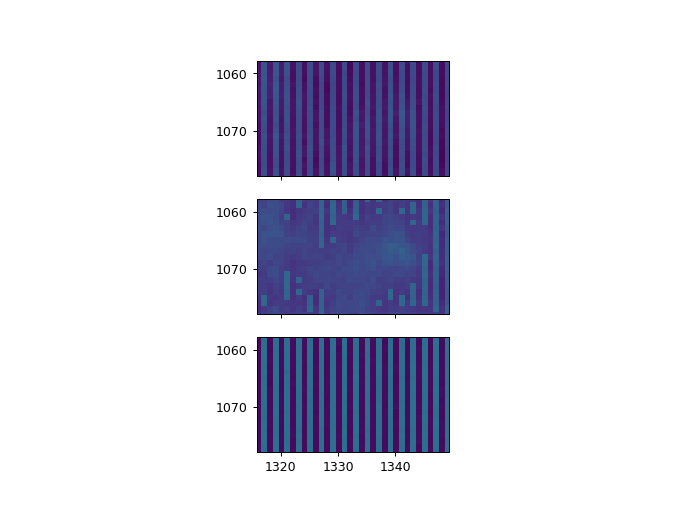

In [16]:
fig, ax = plt.subplots(3, 1, sharex=True, sharey=True)
ax[0].imshow(atoms)
ax[1].imshow(flat)
ax[2].imshow(dark)

plt.show()



In [172]:
# Takes 2 min 13s
quad1_betas = []
quad2_betas = []

# Also get max values of the fit, and of the data itself. 
max_arrs_1 = []
max_fits_1 = []
max_arrs_2 = []
max_fits_2 = []

for shot in shots:
    print(f"Opening shot: {shot}")
    betas = np.load(f"/home/bec_lab/Desktop/imgs/SOAH/polarizations_contrast/{date}/fitted_images/{shot}/fitted_run.npy",  allow_pickle=True)
    max_arr_1 = betas[0][0]
    max_fit_1 = betas[0][1]
    max_arr_2 = betas[0][2]
    max_fit_2 = betas[0][3]
    max_arrs_1.append(max_arr_1)
    max_fits_1.append(max_fit_1)
    max_arrs_2.append(max_arr_2)
    max_fits_2.append(max_fit_2)
    
    quad1_b = betas[1][0]
    quad2_b = betas[1][1]
    
    quad1_betas.append([shot, quad1_b])    
    quad2_betas.append([shot, quad2_b])
    
clear_output()
print("All files loaded successfully. It seems.")

All files loaded successfully. It seems.


In [173]:
flip_betas1 = np.array([np.array([quad1_betas[shot][1][num] for num in range(n)]).T for shot in range(len(shots))])
flip_betas2 = np.array([np.array([quad2_betas[shot][1][num] for num in range(n)]).T for shot in range(len(shots))])
names = ["offset", "amplitude", "angle", "X-position", "Z-position", "TF-amplitude", "width X", "width Z"]

<IPython.core.display.Javascript object>


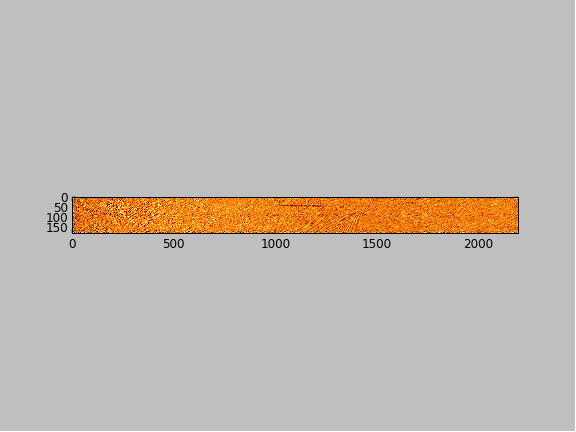

In [193]:
plt.figure()
plt.imshow(ALL_DATA[0][1][1][1], cmap="afmhot_r", vmin=-1, vmax=1)
plt.show()

##### Variable Plot

<IPython.core.display.Javascript object>


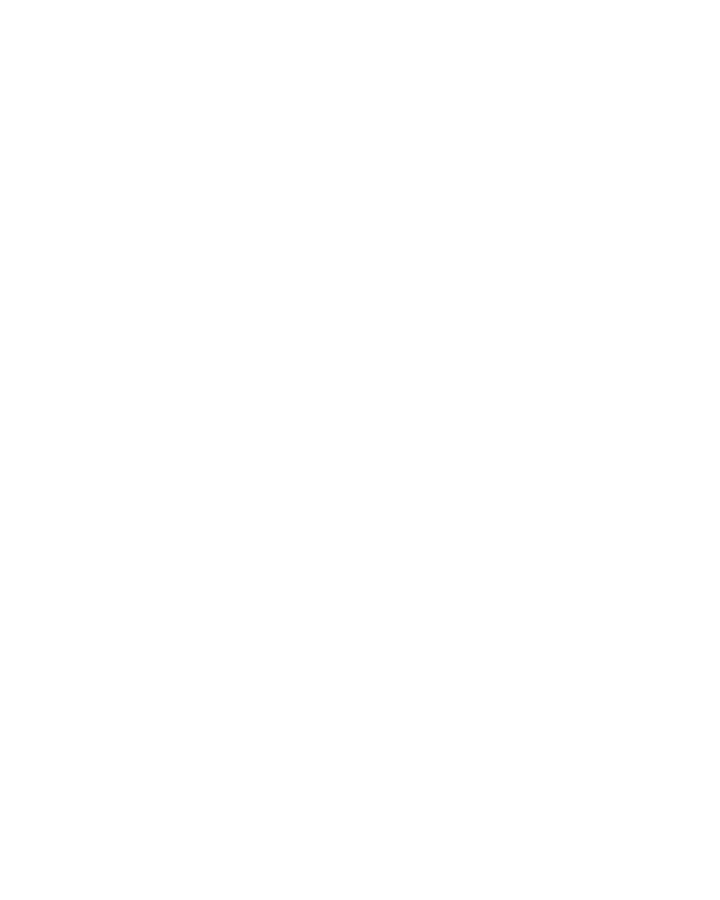

In [402]:
save_folder_betas = f"/home/bec_lab/Desktop/imgs/SOAH/polarizations_contrast/{date}/betas"
if not os.path.exists(save_folder_betas):
    os.makedirs(save_folder_betas)

fig, ax = plt.subplots(10, 1, figsize=(8,10))

for run in range(10):
    xs = np.linspace(0, 100, n)
    fig.suptitle(f"WITH X-BIAS \n{date} - {shots[0]} - {shots[-1]}")
    for i in range(8):
        ax[i].plot(xs, flip_betas1[run][i], alpha=0.4, c='firebrick')
        ax[i].plot(xs, flip_betas2[run][i], alpha=0.4, c='cornflowerblue')
        ax[i].set_ylabel(names[i])
        ax[i].set_xticks([])
    
    ax[8].plot(xs, max_arrs_1[run], alpha=0.4, c='firebrick') 
    ax[8].plot(xs, max_arrs_2[run], alpha=0.4, c='cornflowerblue') 
    ax[9].plot(xs, max_fits_1[run], alpha=0.4, c='firebrick') 
    ax[9].plot(xs, max_fits_2[run], alpha=0.4, c='cornflowerblue')
    ax[8].set_ylabel("Max array value")
    ax[9].set_ylabel("Max fitted value")
    
    ax[-1].set_xticks([0, 25.0, 50.0, 75.0, 100.0])
    ax[-1].set_xlabel("Time [ms]")

#     create_two_colored_suptitle(fig, 'BEAM (-1)', ' BEAM (+1)', 'firebrick', 'cornflowerblue', 0.5, 0.92)
    plt.savefig(f"{save_folder_betas}/{str(shots[run]).zfill(4)}.png")
    plt.close()

##### Contrast Plot

<IPython.core.display.Javascript object>


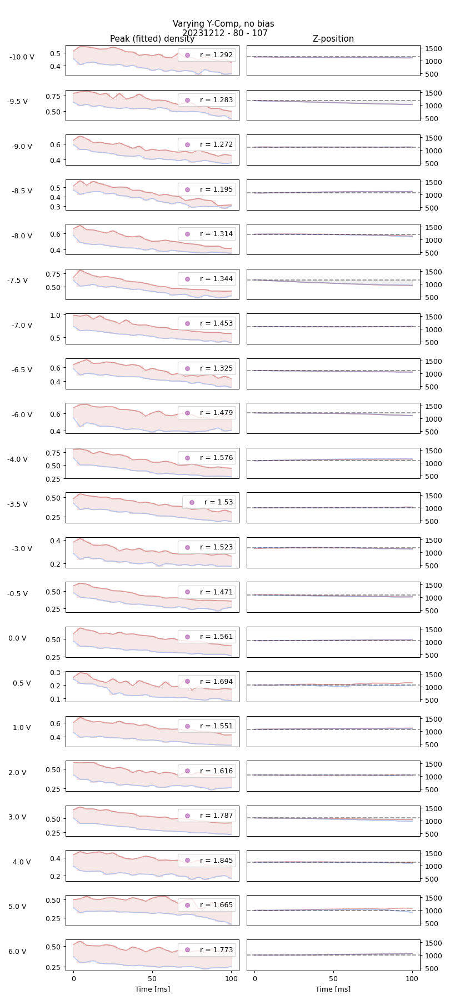

In [46]:
# Smaller plots, just the max_fitted_values
fig, ax = plt.subplots(len(shots), 2, figsize=(9, 20))
xs = np.linspace(0, 100, n)
fig.suptitle(f"Varying Y-Comp, no bias \n{date} - {shots[0]} - {shots[-1]}")
# create_two_colored_suptitle(fig, 'BEAM (-1)', ' BEAM (+1)', 'firebrick', 'cornflowerblue', 0.5, 0.92)

all_avgs = []

ax[0][0].set_title("Peak (fitted) density")
ax[0][1].set_title("Z-position")

for i in range(len(shots)):
    ax[i][0].plot(xs, max_fits_1[i], alpha=0.4, c='firebrick') 
    ax[i][0].plot(xs, max_fits_2[i], alpha=0.4, c='cornflowerblue')
    ax[i][1].plot(xs, flip_betas1[i][4], alpha=0.4, c='firebrick')
    ax[i][1].plot(xs, flip_betas2[i][4], alpha=0.4, c='cornflowerblue')
    ax[i][1].axhline(y=flip_betas2[i][4][0], alpha=0.4, c='k', ls='--')
    ax[i][1].fill_between(xs, flip_betas2[i][4][0], flip_betas2[i][4], step="mid", alpha=0.051, color='k')

    ratios = [max_fits_1[i][j] / max_fits_2[i][j] for j in range(n)]
    avg = round(sum(ratios)/len(ratios), 3)
    ax[i][0].scatter([], [], alpha=0.4, c='purple', label=f"r = {avg}")
    ax[i][0].legend(loc=1)
    all_avgs.append(sum(ratios)/len(ratios))
    
    if avg > 1:
        ax[i][0].fill_between(xs, max_fits_1[i], max_fits_2[i], step="mid", alpha=0.1, color='firebrick')
        ax[i][1].set_ylim([400, 1600])

    else: 
        ax[i][0].fill_between(xs, max_fits_1[i], max_fits_2[i], step="mid", alpha=0.1, color='cornflowerblue')
        ax[i][1].set_ylim([400, 1600])

    ax[i][0].set_ylabel(f"{Y_comp[i]} V", rotation=0, labelpad=40)

    ax[i][1].yaxis.set_label_position("right")
    ax[i][1].yaxis.tick_right()
    ax[i][0].set_xticks([])
    ax[i][1].set_xticks([])
#     ax[i][0].set_yticks([])
#     ax[i][1].set_yticks([round(flip_betas2[i+10][4][0])])

ax[-1][0].set_xticks([0, 50.0, 100.0])
ax[-1][1].set_xticks([0, 50.0, 100.0])
ax[-1][0].set_xlabel("Time [ms]")
ax[-1][1].set_xlabel("Time [ms]")
plt.tight_layout()

#   plt.savefig(f"/home/bec_lab/Desktop/imgs/SOAH/polarizations_contrast/{date}/betas/{str(run+185).zfill(4)}.png")
plt.show()

In [404]:
all_avgs

[1.2924418113162033,
 1.2834918565365847,
 1.2723639134396023,
 1.19472872829303,
 1.3137118067511648,
 1.343790501490096,
 1.4533826083584938,
 1.324506757500283,
 1.4794578941493892,
 1.5758725271645841,
 1.5301300528623942,
 1.5227995617859196,
 1.4706145258900643,
 1.5605226202966493,
 1.6938670573945596,
 1.5512081003910787,
 1.6158070757427907,
 1.7867430134409463,
 1.8446386390196972,
 1.6645004109174601,
 1.773310791620188]

In [406]:
Y_comp = [-10.0, -9.5, -9.0, -8.5, -8.0, -7.5, -7.0, -6.5, -6.0, -4.0, -3.5, -3.0, -0.5, 0.0, 0.5, 1, 2.0, 3.0, 4.0, 5.0, 6.0]
Y_curr = [0, 0, 0, 0.5, 0.17, 0.30, 0.42, 0.55, 0.68, 1.19, 1.31, 1.44, 2.08, 2.20, 2.33, 2.46, 2.72, 2.97, 3.15, 3.15, 3.15]
# Let's save them in case the notebook resets
# all_avgs = [1.2924418113162033,
#  1.2834918565365847,
#  1.2723639134396023,
#  1.19472872829303,
#  1.3137118067511648,
#  1.343790501490096,
#  1.4533826083584938,
#  1.324506757500283,
#  1.4794578941493892,
#  1.5758725271645841,
#  1.5301300528623942,
#  1.5227995617859196,
#  1.4706145258900643,
#  1.5605226202966493,
#  1.6938670573945596,
#  1.5512081003910787,
#  1.6158070757427907,
#  1.7867430134409463,
#  1.8446386390196972,
#  1.6645004109174601,
#  1.773310791620188]

In [ ]:
len(Y_comp)

<IPython.core.display.Javascript object>


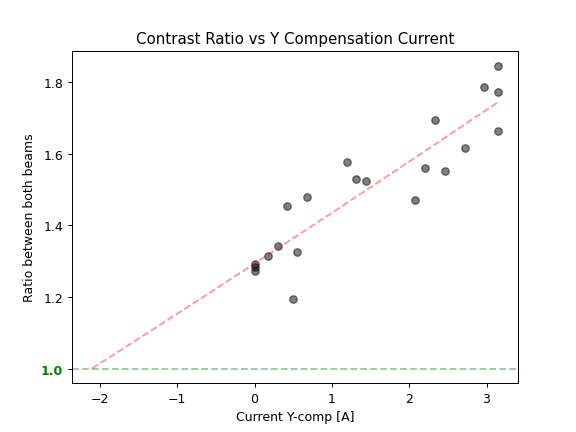

In [409]:
from scipy.optimize import curve_fit

def linear(x, a, b):
    return a*x + b

def cosfunc(x, a, b, c, d):
    return a*np.arctan(b*x+c) + d

xdata = np.linspace(-2.1, max(Y_curr), 1000)


params, params_covariance = curve_fit(cosfunc, Y_curr, all_avgs, maxfev=100000)
y_fit = cosfunc(np.array(xdata), *params)

plt.figure()
plt.title("Contrast Ratio vs Y Compensation Current")
plt.scatter(Y_curr, all_avgs, c='k', alpha=0.5)
plt.plot(xdata, y_fit, c='r', alpha=0.4, ls='--')
plt.axhline(y=1, ls='--', c='g', alpha=0.4)
plt.gca().get_yticklabels()[1].set_color('green') 
plt.gca().get_yticklabels()[1].set_weight('bold') 
plt.xlabel("Current Y-comp [A]")
plt.ylabel("Ratio between both beams")

plt.show()

### Opposite Current Y COMP

In [32]:
### Load and cut properly refocused data
date = 20231213
shots = [ 8,  9, 10, 11, 12, 
         13, 14, 15, 16, 17, 
         18, 19, 20, 21, 22, 
         38, 39, 40, 41, 42, 
         43, 44, 45, 46, 47, 48, 49] 

dz_focus = 0.005
shot_time = 2 # time between shots in ms 
cut = [1, -1, 1, -250]
n = 25

save_folder = f"/home/bec_lab/Desktop/imgs/SOAH/polarizations_contrast/{date}/"
if not os.path.exists(save_folder):
    os.makedirs(save_folder)

In [ ]:
### Generate data, with processed and refocused images. 
ALL_DATA = []

for shot in shots:
    print(f"ANALYSING SHOT {shot}")
    data_1 = [fft_analysis(date, shot, num, dz_focus, quad_cut="quad1", multi_loop=0) for num in range(n)]
    data_2 = [fft_analysis(date, shot, num, dz_focus, quad_cut="quad2", multi_loop=0) for num in range(n)]
    angs1 = [data_1[i][5][cut[0]:cut[1], cut[2]:cut[3]] for i in range(len(data_1))]
    angs2 = [data_2[i][5][cut[0]:cut[1], cut[2]:cut[3]] for i in range(len(data_2))]
    ALL_DATA.append([shot, [angs1, angs2]])
    clear_output()
    
np.save(save_folder + "all_data_BIAS.npy", np.asarray(ALL_DATA, dtype="object"))

In [479]:
## Takes 3.69 s to load 
ALL_DATA = np.load(save_folder + "all_data_BIAS.npy", allow_pickle=True)

#### Fitting - New Saving Procedure

In [ ]:
for shot, quads in ALL_DATA:
    print(f"{shot=}")

    if shot not in [18]:
        continue

    save_folder_fit = f"/home/bec_lab/Desktop/imgs/SOAH/polarizations_contrast/{date}/fitted_images/{shot}/"
    if not os.path.exists(save_folder_fit):
        os.makedirs(save_folder_fit)

    fits_1 = []  # For quad1
    fits_2 = []  # For quad2

    initial_g_1 = {'offset': 0.0,
                   'amp_ov': 1.0,
                   'ang': 0,
                   'center': (45, 1150),
                   'tfa': 0.6,
                   'tfw': (10, 300),
                   'ga': 1,
                   'gw': (200, 200),
                   'j_guess': 40,
                   'axamp': 1,
                   'x_shift': 0.0,
                   'squeeze_par': 1.0}
    initial_g_2 = {'offset': 0.0,
                   'amp_ov': 1.0,
                   'ang': 0,
                   'center': (45, 1150),
                   'tfa': 0.6,
                   'tfw': (10, 300),
                   'ga': 1,
                   'gw': (20, 200),
                   'j_guess': 40,
                   'axamp': 1,
                   'x_shift': 0.0,
                   'squeeze_par': 1.0}

    for i in range(n):
        # Do some extra background subtraction.
        pic1 = normalize(quads[0][i])[0]
        pic2 = normalize(quads[1][i])[0]

        fit1 = fitting(pic1, "tf", init_guess=initial_g_1, OAH=True)
        fit2 = fitting(pic2, "tf", init_guess=initial_g_2, OAH=True)

        fig, ax = plt.subplots(3, 2, figsize=(8, 4))
        fig.suptitle(f"{shot}- t = {0 + i * shot_time} ms")
        ax[0][0].set_title("Quad 1")
        ax[0][1].set_title("Quad 2")
        ax[0][0].imshow(fit1[0], aspect='auto', cmap='afmhot_r', vmin=-1, vmax=1, origin='lower')
        ax[1][0].imshow(fit1[1], aspect='auto', cmap='afmhot_r', vmin=-1, vmax=1, origin='lower')
        ax[2][0].imshow(fit1[2], aspect='auto', cmap='afmhot_r', vmin=-1, vmax=1, origin='lower')
        ax[0][1].imshow(fit2[0], aspect='auto', cmap='afmhot_r', vmin=-1, vmax=1, origin='lower')
        ax[1][1].imshow(fit2[1], aspect='auto', cmap='afmhot_r', vmin=-1, vmax=1, origin='lower')
        ax[2][1].imshow(fit2[2], aspect='auto', cmap='afmhot_r', vmin=-1, vmax=1, origin='lower')
        for axs in ax:
            for a in axs:
                a.set_xticks([])
                a.set_yticks([])
        plt.tight_layout()
        plt.savefig(save_folder_fit + f"{str(i).zfill(3)}")
        plt.close()

        fits_1.append(fit1)
        fits_2.append(fit2)

        # Set initial guess to the last guess.
        initial_g_1 = {'offset': fit1[-1].beta[0],
                       'amp_ov': fit1[-1].beta[1],
                       'ang': fit1[-1].beta[2],
                       'center': (fit1[-1].beta[3], fit1[-1].beta[4]),
                       'tfa': fit1[-1].beta[5],
                       'tfw': (fit1[-1].beta[6], fit1[-1].beta[7]),
                       'ga': 1,
                       'gw': (200, 200),
                       'j_guess': 40,
                       'axamp': 1,
                       'x_shift': 0.0,
                       'squeeze_par': 1.0}

        initial_g_2 = {'offset': fit2[-1].beta[0],
                       'amp_ov': fit2[-1].beta[1],
                       'ang': fit2[-1].beta[2],
                       'center': (fit2[-1].beta[3], fit2[-1].beta[4]),
                       'tfa': fit2[-1].beta[5],
                       'tfw': (fit2[-1].beta[6], fit2[-1].beta[7]),
                       'ga': fit2[-1].beta[5],
                       'gw': (fit2[-1].beta[6], fit2[-1].beta[7]),
                       'j_guess': 40,
                       'axamp': 1,
                       'x_shift': 0.0,
                       'squeeze_par': 1.0}

        

        clear_output()

    max_arr_1 = [fits_1[i][0].max() for i in range(n)]
    max_fit_1 = [fits_1[i][1].max() for i in range(n)]
    max_arr_2 = [fits_2[i][0].max() for i in range(n)]
    max_fit_2 = [fits_2[i][1].max() for i in range(n)]
    quad1_b = [fits_1[i][-1].beta for i in range(n)]
    quad2_b = [fits_2[i][-1].beta for i in range(n)]
    master_save=[[max_arr_1, max_fit_1, max_arr_2, max_fit_2], [quad1_b, quad2_b]]
    
    np.save(save_folder_fit + "fitted_run.npy", np.asarray(master_save, dtype="object"))

##### Load the fits - New Loading Procedure

In [33]:
Y_comp = [-8.5, -8., -6.5, -6. , -5.5, -5. , -4.5, -4. ,
       -3.5, -3. , -2.5, -2. , -1.5, -1.,  0. ,  0.5, 1.5,
        2. ,  2.5,  3. ,  3.5,  4. ]


shots = [9, 10, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 38, 39,
       41, 42, 44, 45, 46, 47, 48, 49] 

In [34]:
# Takes 2 min 13s
quad1_betas = []
quad2_betas = []

# Also get max values of the fit, and of the data itself. 
max_arrs_1 = []
max_fits_1 = []
max_arrs_2 = []
max_fits_2 = []

for shot in shots:
    print(f"Opening shot: {shot}")
    betas = np.load(f"/home/bec_lab/Desktop/imgs/SOAH/polarizations_contrast/{date}/fitted_images/{shot}/fitted_run.npy",  allow_pickle=True)
    max_arr_1 = betas[0][0]
    max_fit_1 = betas[0][1]
    max_arr_2 = betas[0][2]
    max_fit_2 = betas[0][3]
    max_arrs_1.append(max_arr_1)
    max_fits_1.append(max_fit_1)
    max_arrs_2.append(max_arr_2)
    max_fits_2.append(max_fit_2)
    
    quad1_b = betas[1][0]
    quad2_b = betas[1][1]
    
    quad1_betas.append([shot, quad1_b])    
    quad2_betas.append([shot, quad2_b])
    
clear_output()
print("All files loaded successfully. It seems.")

All files loaded successfully. It seems.


In [35]:
flip_betas1 = np.array([np.array([quad1_betas[shot][1][num] for num in range(n)]).T for shot in range(len(shots))])
flip_betas2 = np.array([np.array([quad2_betas[shot][1][num] for num in range(n)]).T for shot in range(len(shots))])
names = ["offset", "amplitude", "angle", "X-position", "Z-position", "TF-amplitude", "width X", "width Z"]

##### Variable Plot

<IPython.core.display.Javascript object>


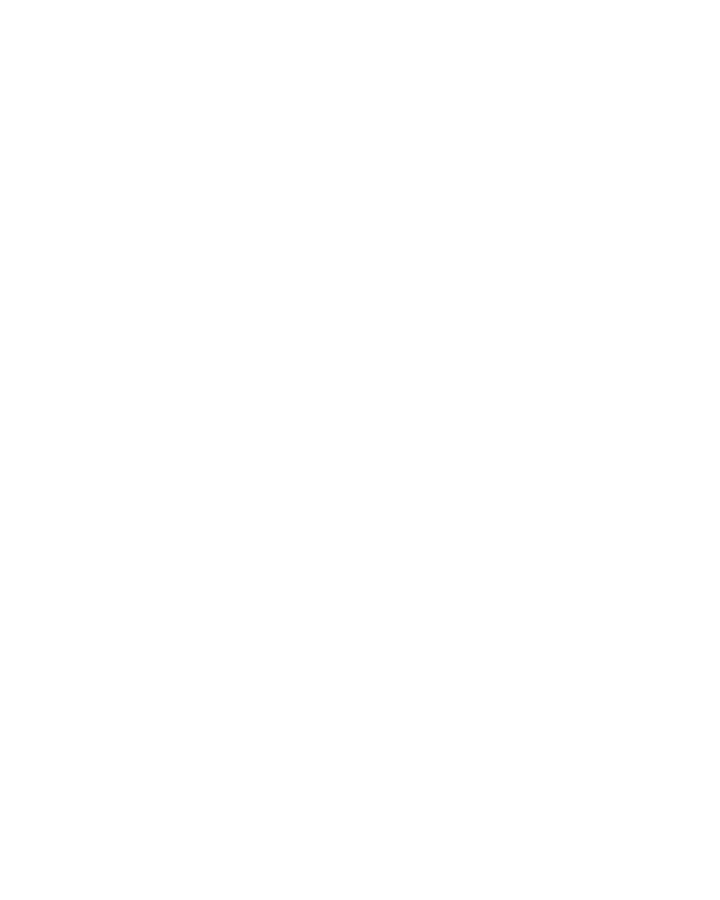

<IPython.core.display.Javascript object>


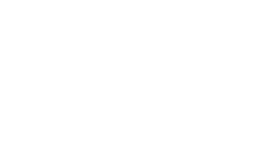

<IPython.core.display.Javascript object>


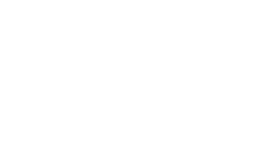

<IPython.core.display.Javascript object>


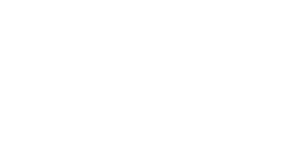

<IPython.core.display.Javascript object>


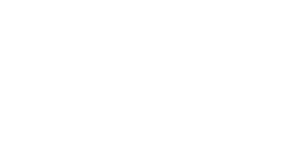

<IPython.core.display.Javascript object>


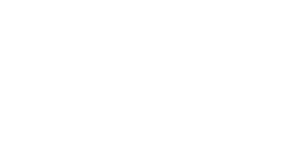

<IPython.core.display.Javascript object>


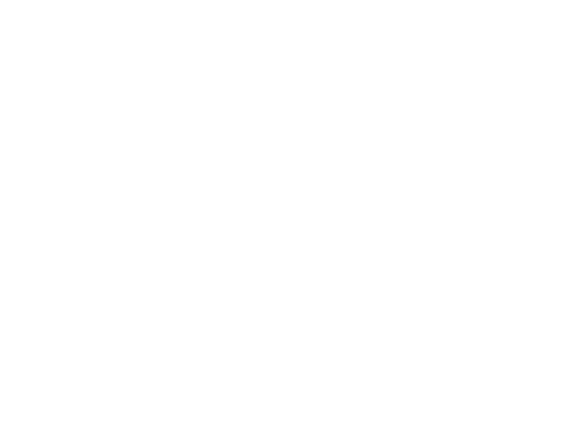

In [417]:
save_folder_betas = f"/home/bec_lab/Desktop/imgs/SOAH/polarizations_contrast/{date}/betas"
if not os.path.exists(save_folder_betas):
    os.makedirs(save_folder_betas)

fig, ax = plt.subplots(10, 1, figsize=(8,10))

for run in range(10):
    xs = np.linspace(0, 100, n)
    fig.suptitle(f"WITH X-BIAS \n{date} - {shots[0]} - {shots[-1]}")
    for i in range(8):
        ax[i].plot(xs, flip_betas1[run][i], alpha=0.4, c='firebrick')
        ax[i].plot(xs, flip_betas2[run][i], alpha=0.4, c='cornflowerblue')
        ax[i].set_ylabel(names[i])
        ax[i].set_xticks([])
    
    ax[8].plot(xs, max_arrs_1[run], alpha=0.4, c='firebrick') 
    ax[8].plot(xs, max_arrs_2[run], alpha=0.4, c='cornflowerblue') 
    ax[9].plot(xs, max_fits_1[run], alpha=0.4, c='firebrick') 
    ax[9].plot(xs, max_fits_2[run], alpha=0.4, c='cornflowerblue')
    ax[8].set_ylabel("Max array value")
    ax[9].set_ylabel("Max fitted value")
    
    ax[-1].set_xticks([0, 25.0, 50.0, 75.0, 100.0])
    ax[-1].set_xlabel("Time [ms]")

#     create_two_colored_suptitle(fig, 'BEAM (-1)', ' BEAM (+1)', 'firebrick', 'cornflowerblue', 0.5, 0.92)
    plt.savefig(f"{save_folder_betas}/{str(shots[run]).zfill(4)}.png")
    plt.close()

##### Contrast Plot

<IPython.core.display.Javascript object>


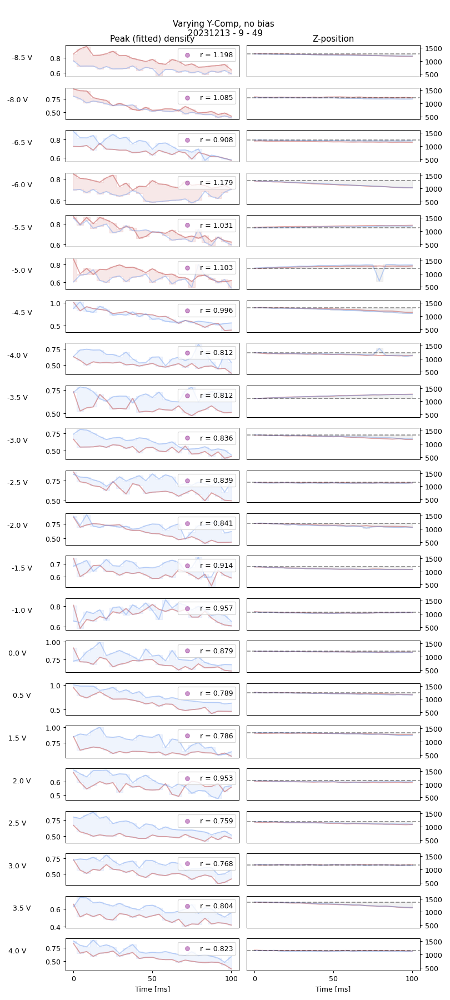

In [36]:
# Smaller plots, just the max_fitted_values
fig, ax = plt.subplots(len(shots), 2, figsize=(9, 20))
xs = np.linspace(0, 100, n)
fig.suptitle(f"Varying Y-Comp, no bias \n{date} - {shots[0]} - {shots[-1]}")
# create_two_colored_suptitle(fig, 'BEAM (-1)', ' BEAM (+1)', 'firebrick', 'cornflowerblue', 0.5, 0.92)

all_avgs2 = []

ax[0][0].set_title("Peak (fitted) density")
ax[0][1].set_title("Z-position")

for i in range(len(shots)):
    ax[i][0].plot(xs, max_fits_1[i], alpha=0.4, c='firebrick') 
    ax[i][0].plot(xs, max_fits_2[i], alpha=0.4, c='cornflowerblue')
    ax[i][1].plot(xs, flip_betas1[i][4], alpha=0.4, c='firebrick')
    ax[i][1].plot(xs, flip_betas2[i][4], alpha=0.4, c='cornflowerblue')
    ax[i][1].axhline(y=flip_betas2[i][4][0], alpha=0.4, c='k', ls='--')
    ax[i][1].fill_between(xs, flip_betas2[i][4][0], flip_betas2[i][4], step="mid", alpha=0.051, color='k')

    ratios = [max_fits_1[i][j] / max_fits_2[i][j] for j in range(n)]
    avg = round(sum(ratios)/len(ratios), 3)
    ax[i][0].scatter([], [], alpha=0.4, c='purple', label=f"r = {avg}")
    ax[i][0].legend(loc=1)
    
    all_avgs2.append(sum(ratios)/len(ratios))
    
    if avg > 1:
        ax[i][0].fill_between(xs, max_fits_1[i], max_fits_2[i], step="mid", alpha=0.1, color='firebrick')
        ax[i][1].set_ylim([400, 1600])

    else: 
        ax[i][0].fill_between(xs, max_fits_1[i], max_fits_2[i], step="mid", alpha=0.1, color='cornflowerblue')
        ax[i][1].set_ylim([400, 1600])

    ax[i][0].set_ylabel(f"{Y_comp[i]} V", rotation=0, labelpad=40)

    ax[i][1].yaxis.set_label_position("right")
    ax[i][1].yaxis.tick_right()
    ax[i][0].set_xticks([])
    ax[i][1].set_xticks([])
#     ax[i][0].set_yticks([])
#     ax[i][1].set_yticks([round(flip_betas2[i+10][4][0])])

ax[-1][0].set_xticks([0, 50.0, 100.0])
ax[-1][1].set_xticks([0, 50.0, 100.0])
ax[-1][0].set_xlabel("Time [ms]")
ax[-1][1].set_xlabel("Time [ms]")
plt.tight_layout()

#   plt.savefig(f"/home/bec_lab/Desktop/imgs/SOAH/polarizations_contrast/{date}/betas/{str(run+185).zfill(4)}.png")
plt.show()

In [468]:
aa_2 = [1.1979747249765043,
 1.0847255108840048,
 0.907624912096264,
 1.178767218809696,
 1.0311899517334135,
 1.1029661470030523,
 0.9955296984779214,
 0.8117728814103191,
 0.8122078109918627,
 0.8357354425926108,
 0.8393655907517857,
 0.8409849586901527,
 0.9141622833278524,
 0.9568071864034414,
 0.8225064367353013]


len(aa_2)


15

In [50]:
ratios = [1.2924418113162033,
          1.2834918565365847,
          1.2723639134396023,
            1.19472872829303,
            1.3137118067511648,
            1.343790501490096,
            1.4533826083584938,
            1.324506757500283,
            1.4794578941493892,
            1.5758725271645841,
            1.5301300528623942,
            1.5227995617859196,
            1.4706145258900643,
            1.5605226202966493,
            1.6938670573945596,
            1.5512081003910787,
            1.6158070757427907,
            1.7867430134409463,
            1.8446386390196972,
            1.6645004109174601,
            1.773310791620188,
            1.1979747249765043,
            1.0847255108840048,
            0.907624912096264,
            1.178767218809696,
            1.0311899517334135,
            1.1029661470030523,
            0.9955296984779214,
            0.8117728814103191,
            0.8122078109918627,
            0.8357354425926108,
            0.8393655907517857,
            0.8409849586901527,
            0.9141622833278524,
            0.9568071864034414,
            0.8225064367353013]

In [59]:
Y_comp1 = [-10.0, -9.5, -9.0, -8.5, -8.0, -7.5, -7.0, -6.5, -6.0, -4.0,
           -3.5, -3.0, -0.5, 0.0, 0.5, 1, 2.0, 3.0, 4.0, 5.0, 6.0]
Y_curr1 = [0, 0, 0, 0.5, 0.17, 0.30, 0.42, 0.55, 0.68, 1.19, 1.31, 1.44, 
           2.08, 2.20, 2.33, 2.46, 2.72, 2.97, 3.15, 3.15, 3.15]

# Let's save them in case the notebook resets
all_avgs1 = [1.2924418113162033,
 1.2834918565365847,
 1.2723639134396023,
 1.19472872829303,
 1.3137118067511648,
 1.343790501490096,
 1.4533826083584938,
 1.324506757500283,
 1.4794578941493892,
 1.5758725271645841,
 1.5301300528623942,
 1.5227995617859196,
 1.4706145258900643,
 1.5605226202966493,
 1.6938670573945596,
 1.5512081003910787,
 1.6158070757427907,
 1.7867430134409463,
 1.8446386390196972,
 1.6645004109174601,
 1.773310791620188]

Y_comp2 = [-8.5, -8.00, -6.50, -6.00, -5.50, -5.00, -4.50, -4.00, -3.50, -3.00,
           -2.50, -2.00, -1.50, -1.00,  0.00]
Y_curr2 = [-0.05, -0.17, -0.55, -0.68, -0.81, -0.93, -1.06, -1.19, -1.31, -1.44, 
           -1.57, -1.70, -1.82, -1.95, -2.05]
all_avgs2 = [1.1979747249765043,
 1.0847255108840048,
 0.907624912096264,
 1.178767218809696,
 1.0311899517334135,
 1.1029661470030523,
 0.9955296984779214,
 0.8117728814103191,
 0.8122078109918627,
 0.8357354425926108,
 0.8393655907517857,
 0.8409849586901527,
 0.9141622833278524,
 0.9568071864034414,
 0.8225064367353013]

all_currs = np.concatenate((Y_curr1, Y_curr2))
all_all_avgs = np.concatenate((all_avgs1, all_avgs2))

In [60]:
top_ratio = abs(params[0]) + params[3] 
bottom_ratio = -abs(params[0]) + params[3]

In [103]:
Deviations = np.array([0.12664569, 0.09064911, 0.10401412, 0.13288078, 0.10215096, 0.10215096,
       0.10583536, 0.08800878, 0.12778034, 0.12778034, 0.1054183 , 0.12636893,
       0.16173739, 0.19854697, 0.15027953, 0.18541125, 0.23060338,
       0.20536895, 0.21691381, 0.11561387, 0.22662066, 0.18161254,
       0.17700779, 0.12452069, 0.13635329, 0.18439078, 0.10196251,
       0.11299501, 0.1799694 , 0.09720151, 0.12638714, 0.0923612 ,
       0.10335709, 0.11229709, 0.13599143, 0.10173276])

In [89]:
len(Spin_Contrast)

34

<IPython.core.display.Javascript object>


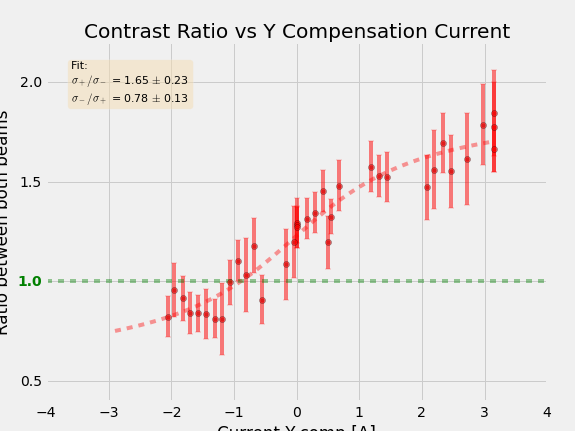

In [105]:
from scipy.optimize import curve_fit

def linear(x, a, b):
    return a*x + b

def cosfunc(x, a, b, c, d):
    return a*np.arctan(b*x+c) + d

xdata = np.linspace(-2.9, max(Y_curr), 1000)

params, params_covariance = curve_fit(cosfunc, all_currs, all_all_avgs, maxfev=100000)
y_fit = cosfunc(np.array(xdata), *params)

top_ratio = abs(params[0]) + params[3]
bottom_ratio = -abs(params[0]) + params[3]

sigma_a_squared = params_covariance[0, 0]  # Variance of a
sigma_c_squared = params_covariance[2, 2]  # Variance of c
sigma_ac = params_covariance[0, 2]         # Covariance between a and c
err1 = np.sqrt(sigma_a_squared + sigma_c_squared + 2 * sigma_ac)
err2 = np.sqrt(sigma_a_squared + sigma_c_squared - 2 * sigma_ac)

fig, ax = plt.subplots()
ax.set_title("Contrast Ratio vs Y Compensation Current")
ax.scatter(Y_curr1, all_avgs1, c='k', alpha=0.5)
ax.scatter(Y_curr2, all_avgs2, c='k', alpha=0.5)

ax.errorbar(all_currs, all_all_avgs, yerr=Deviations, fmt='o', c='r', alpha=0.5)

ax.plot(xdata, y_fit, c='r', alpha=0.4, ls='--')
ax.axhline(y=1, ls='--', c='g', alpha=0.4)

ax.plot([], [], ls='--', c='r', alpha=0.4, label=f"$\sigma_+ / \sigma_-$ = {round(top_ratio, 2)}")
ax.plot([], [], ls='--', c='r', alpha=0.4, label=f"$\sigma_- / \sigma_+$ = {round(bottom_ratio, 2)}")
textstr = f"Fit: \n$\sigma_+ / \sigma_-$ = {round(top_ratio, 2)} $\pm$ {round(err1, 2)} \n$\sigma_- / \sigma_+$ = {round(bottom_ratio, 2)} $\pm$ {format(round(err2, 2), '.2f' )}"
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)

# place a text box in upper left in axes coords
ax.text(0.05, 0.95, textstr, transform=ax.transAxes, fontsize=11,
        verticalalignment='top', bbox=props)


plt.gca().get_yticklabels()[2].set_color('green') 
plt.gca().get_yticklabels()[2].set_weight('bold') 
plt.xlabel("Current Y-comp [A]")
plt.ylabel("Ratio between both beams")

plt.show()

### Ratios

In [431]:
all_ratios = np.array([
              [1.5607864022935016, 0.7485001653716603], ## MOT + Bias
              [1.6554310569044077, 0.8481949097311243], ## NO MOT + NO Bias
              [None,               0.7867195790973401], ## No MOT + Y Bias
              [1.5748563272217995, 0.8436653949306858], ## NO MOT + X Bias 
              [1.3843161353029134, 0.8452918614576284]
              ])

In [432]:
MT = np.array([0.9907169673091989, None] )    ## In the MT 


In [433]:
avg1 = sum(filter(None, all_ratios.T[0])) / 4
avgmin1 = sum(filter(None, all_ratios.T[1])) / 5

descriptions = ["MOT\n+Bias-Y", "No MOT\n+No Bias", "No MOT\n+Y-Bias", "No MOT\n+X Bias", "Strong \nFinetune"]

In [434]:
def create_two_colored_suptitle(fig, text1, text2, color1, color2, x_pos, y_pos):
    # Add the first part of the suptitle
    t = fig.text(x_pos, y_pos, text1, ha='right', va='baseline', color=color1, fontsize=16)
    # Add the second part of the suptitle
    fig.text(x_pos + 0.01, y_pos, text2, ha='left', va='baseline', color=color2, fontsize=16)

<IPython.core.display.Javascript object>


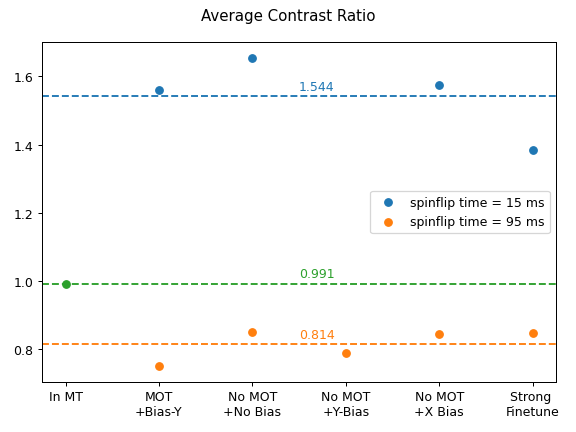

In [435]:
fig, ax = plt.subplots(1,1)
fig.suptitle("Average Contrast Ratio")

plt.axhline(y=MT[0], ls='--', c='C2')
plt.scatter(["In MT"], MT[0], c='C2')
plt.text(2.5, MT[0]*1.02, f"{round(MT[0], 3)}", c='C2')

plt.scatter(descriptions, all_ratios.T[0], c='C0', label="spinflip time = 15 ms")
plt.axhline(y=avg1, c='C0', ls='--')
plt.scatter(descriptions, all_ratios.T[1], c='C1', label="spinflip time = 95 ms")
plt.axhline(y=avgmin1, c='C1', ls='--')

plt.text(2.5, avg1*1.01, f"{round(avg1, 3)}", c='C0')
plt.text(2.5, avgmin1*1.02, f"{round(avgmin1, 3)}", c='C1')
# plt.xticks(rotation=45)

plt.legend()
plt.tight_layout()
plt.show()

## MULTI SHOT DYNAMICS

### 20231004 - 0052 - 10 frames with spinpull 

In [ ]:
###### DATA PREP for a quicker processing
### Load and cut properly refocused data
date = 20231004
shot = 52
dz_focus = 0.0033
data_1 = [fft_analysis(date, shot, num, dz_focus, quad_cut="quad1", multi_loop=0) for num in range(10)]
data_2 = [fft_analysis(date, shot, num, dz_focus, quad_cut="quad2", multi_loop=0) for num in range(10)]
clear_output()
print("Done")
# data: atoms, flat, dark, fft_atoms, fft_flat, ang1, amp

In [ ]:
# Get all the cut versions of angles in one array 
cut=[72, 110, 640, 1440]
angs1 = [data_1[i][5][cut[0]:cut[1], cut[2]:cut[3]] for i in range(len(data_1))]
angs2 = [data_2[i][5][cut[0]:cut[1], cut[2]:cut[3]] for i in range(len(data_2))]

In [ ]:
fig, ax = plt.subplots(10, 2)

for i in range(10):
    ax[i][0].imshow(angs1[i], aspect='auto', cmap='afmhot_r', vmin=-2, vmax=2, origin='lower')
    ax[i][1].imshow(angs2[i], aspect='auto', cmap='afmhot_r', vmin=-2, vmax=2, origin='lower')
    ax[i][0].set_ylabel(f"{0 + i*2}")

for axs in ax:
    for a in axs:
        a.set_xticks([])
        a.set_yticks([])
        
plt.tight_layout()
plt.show()


In [ ]:
###### ------------ ROTATE ---------------- 
# Since the condensates are pretty thin in the ODT, let's rotate them as well, so a linecut will be nicer. 
# Additionally, we will also be able to compare the fits themself. Fitting with TF model. 

# Fit guesses
amp_ov = 1.
ang = 0 
tfa = 1
ga = 1 
center = (25, 300) # (ang1.shape[0]//2, ang1.shape[1]//2)
tfw = (ang1.shape[0]//5, ang1.shape[1]//2)
gw = (ang1.shape[0]//5, ang1.shape[1]//2)
tfa2 = 0.3
center2 = (24, 500) # (ang1.shape[0]//2, ang1.shape[1]//2+100)
tfw2 = (3, 200) # (ang1.shape[0]//10, ang1.shape[1]//8)

def rotateFunction(ang1, ang2, mode="tf"):
    """
        We do it together for both, so that we also make sure that they are of
        the same size. Which we need for fitting. 
    """

    fit_1 = fitting(ang1, mode="tf", OAH=True)
    fit_2 = fitting(ang2, mode="tf", OAH=True)
    # fit: pic, fitresult, fitguess, fitresultgauss, fitresulttf, fitted_vars, odrout
    clear_output()

    print(f"Angle 1 = {fit_1[6].beta[2]*(180/np.pi)}")
    print(f"Angle 2 = {fit_2[6].beta[2]*(180/np.pi)}")
    print(fit_1[6].beta)
    
    # Rotating the image and also the fitresult
#     ang1_rot = rotate(fit_1[0], (fit_1[6].beta[2]*(180/np.pi)), mode='reflect')
#     ang2_rot = rotate(fit_2[0], (fit_2[6].beta[2]*(180/np.pi)), mode='reflect')
    ang1_rot = rotate(ang1, (fit_1[6].beta[2]*(180/np.pi)), mode='reflect')
    ang2_rot = rotate(ang2, (fit_2[6].beta[2]*(180/np.pi)), mode='reflect')
    fitresult1_rot = rotate(fit_1[1], (fit_1[6].beta[2]*(180/np.pi)), mode='reflect')
    fitresult2_rot = rotate(fit_2[1], (fit_2[6].beta[2]*(180/np.pi)), mode='reflect')

    # If 90 degrees off: 
    if ang1_rot.shape[0] > ang1_rot.shape[1]:
        ang1_rot = np.transpose(np.transpose(np.transpose(ang1_rot)))
        fitresult1_rot = np.transpose(np.transpose(np.transpose(fitresult1_rot)))

    if ang2_rot.shape[0] > ang2_rot.shape[1]:
        ang2_rot = np.transpose(np.transpose(np.transpose(ang2_rot)))
        fitresult2_rot = np.transpose(np.transpose(np.transpose(fitresult2_rot)))

    # Also, let's minus the offset on all of them:
    ang1_rot -= fit_1[6].beta[0]
    ang2_rot -= fit_2[6].beta[0]

    fitresult1_rot -= fit_1[6].beta[0]
    fitresult2_rot -= fit_2[6].beta[0]
    
    
    # make sure ang1_rot and ang2_rot are the same size:
    xedge = min(ang1_rot.shape[0], ang2_rot.shape[0])
    yedge = min(ang1_rot.shape[1], ang2_rot.shape[1])
    ang1_rot = ang1_rot[0:xedge, 0:yedge]
    ang2_rot = ang2_rot[0:xedge, 0:yedge]
    fitresult1_rot = fitresult1_rot[0:xedge, 0:yedge]
    fitresult2_rot = fitresult2_rot[0:xedge, 0:yedge]
    
    
#     # After subtracting the background, fit with the double tf. 
#     fit_1 = fitting(ang1_rot, mode="doubletf", OAH=True)
#     fit_2 = fitting(ang2_rot, mode="doubletf", OAH=True)
#     # fit: pic, fitresult, fitguess, fitresultgauss, fitresulttf, fitted_vars, odrout
#     clear_output()
    
    
    
    return [ang1_rot, ang2_rot, fitresult1_rot, fitresult2_rot, fit_1[0], fit_2[0]]



In [ ]:
full_data = [rotateFunction(ang1, ang2) for ang1, ang2 in zip(angs1, angs2)]

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

# Define the Thomas-Fermi function
def thomasfermi1D(x, amp, r, mid):
    """ A 2D Thomas Fermi function, a function of amplitude, radia and means (both x and y). """
    value = 1 - ((x - mid) / r) ** 2 
    value[value < 0] = 0
    
    return np.abs(amp) * np.power(value, 3. / 2.)# Define the double Thomas-Fermi function as a sum of two Thomas-Fermi functions
def double_thomas_fermi(x, amp1, r1, mid1, amp2, r2, mid2):
    return thomasfermi1D(x, amp1, r1, mid1) + thomasfermi1D(x, amp2, r2, mid2)


In [ ]:
full_data[i][0].shape

In [ ]:
lcs = [[23, 24],
       [23, 24],
       [23, 23],
       [23, 23],
       [22, 24],
       [23, 24],
       [23, 24],
       [25, 21],
       [25, 24],
       [25, 21]]


fig, ax = plt.subplots(10, 2, sharex=True, sharey=True, figsize=(8, 9))
plt.suptitle(f"{date}-{shot}")
for i in range(10):
    lc_1 = lcs[i][0]
    lc_2 = lcs[i][1]
    ax[i][0].imshow(full_data[i][0], aspect='auto', cmap='afmhot_r', vmin=-2, vmax=2, origin='lower')    
    ax[i][1].imshow(full_data[i][1], aspect='auto', cmap='afmhot_r', vmin=-2, vmax=2, origin='lower')
    ax[i][0].set_ylabel(f"{0 + i*2}")
    
    ax[i][0].axhline(y=lc_1, c='k', alpha=0.4, ls='--')
    ax[i][1].axhline(y=lc_2, c='k', alpha=0.4, ls='--')
    
    ax[i][0].axhline(y=lc_1+intg_width, c='r', alpha=0.2, ls='--')
    ax[i][0].axhline(y=lc_1-intg_width, c='r', alpha=0.2, ls='--')
    ax[i][1].axhline(y=lc_2+intg_width, c='r', alpha=0.2, ls='--')    
    ax[i][1].axhline(y=lc_2-intg_width, c='r', alpha=0.2, ls='--')
    
    
for axs in ax:
    for a in axs:
        a.set_xticks([])
        a.set_yticks([])
        
plt.tight_layout()
plt.show()


fig, ax = plt.subplots(10, 2, figsize=(8, 14))
for j in range(10):
    lc_1 = lcs[j][0]
    lc_2 = lcs[j][1]

    ang1 = full_data[j][0]
    ang2 = full_data[j][1]
    ax[0][0].set_title("Integrated")
    ax[0][1].set_title("Line Cut")
    
    
    #### INTEGRATED LINEWIDTH PLOT 
    # binning for nicer plots
    bin_factor = 4
    p0i = [1, 20, 300/bin_factor, 1, 20, 570/bin_factor]
    intg_width = 2
    
    binned1 = [ang1[lc_1-intg_width:lc_1+intg_width].mean(axis=0)[i:i+bin_factor].sum()/bin_factor for i in range(0, ang1.mean(axis=0).shape[0], bin_factor)] 
    binned2 = [ang2[lc_2-intg_width:lc_2+intg_width].mean(axis=0)[i:i+bin_factor].sum()/bin_factor for i in range(0, ang2.mean(axis=0).shape[0], bin_factor)]
    ax[j][0].plot(binned1, c='C0', alpha=0.4, label="B1")
    ax[j][0].plot(binned2, c='C1', alpha=0.4, label="B2")
    
    xdata = range(len(binned1))

    ax[j][0].fill_between(xdata, binned1, step="pre", alpha=0.1, color='C0')
    ax[j][0].fill_between(xdata, binned2, step="pre", alpha=0.1, color='C1')
    
 
    # Fitting here with a double tf curve. 
    params1, params_covariance = curve_fit(double_thomas_fermi, xdata, binned1, p0=p0i, maxfev = 100000000)
    params2, params_covariance = curve_fit(double_thomas_fermi, xdata, binned2, p0=p0i, maxfev = 100000000)
    y_fit1 = double_thomas_fermi(xdata, *params1)
    y_fit2 = double_thomas_fermi(xdata, *params2)
    ax[j][0].plot(y_fit1, c='C0', alpha=0.4, label="B1")
    ax[j][0].plot(y_fit2, c='C1', alpha=0.4, label="B2")
    ax[j][0].set_ylim([-0.2, 1.5])
   
    #### LINECUT PLOT 
    binned1 = [ang1[lc_1][i:i+bin_factor].sum()/bin_factor for i in range(0, ang1[lc_1].shape[0], bin_factor)]
    binned2 = [ang2[lc_2][i:i+bin_factor].sum()/bin_factor for i in range(0, ang2[lc_2].shape[0], bin_factor)]
    ax[j][1].plot(binned1, c='C0', alpha=0.4, label="B1")
    ax[j][1].plot(binned2, c='C1', alpha=0.4, label="B2")
    ax[j][1].fill_between(xdata, binned1, step="pre", alpha=0.1, color='C0')
    ax[j][1].fill_between(xdata, binned2, step="pre", alpha=0.1, color='C1')

    # Fitting here with a double tf curve. 
    xdata = range(len(binned1))
    params1, params_covariance = curve_fit(double_thomas_fermi, xdata, binned1, p0=p0i, maxfev = 100000000)
    params2, params_covariance = curve_fit(double_thomas_fermi, xdata, binned2, p0=p0i, maxfev = 100000000)
    y_fit1 = double_thomas_fermi(xdata, *params1)
    y_fit2 = double_thomas_fermi(xdata, *params2)
    ax[j][1].plot(y_fit1, c='C0', alpha=0.4, label="B1")
    ax[j][1].plot(y_fit2, c='C1', alpha=0.4, label="B2")
    ax[j][1].set_ylim([-0.2, 3])
    
    ax[j][1].yaxis.set_label_position("right")
    ax[j][1].yaxis.tick_right()
    ax[j][0].set_ylabel(f"{0 + j*2}")
        
for axs in ax:
    for a in axs:
        a.set_xticks([])
        a.set_yticks([])
        
plt.tight_layout()
plt.show()

### 20231006 - 22 - 25 shots with spinpull

In [ ]:
###### DATA PREP for a quicker processing
### Load and cut properly refocused data
date = 20231006
shot = 22
dz_focus = 0.0033
n_shots = 25
data_1 = [fft_analysis(date, shot, num, dz_focus, quad_cut="quad1", multi_loop=0) for num in range(25)]
data_2 = [fft_analysis(date, shot, num, dz_focus, quad_cut="quad2", multi_loop=0) for num in range(25)]
clear_output()
print("Done")
# data: atoms, flat, dark, fft_atoms, fft_flat, ang1, amp

In [ ]:
# Get all the cut versions of angles in one array 
cut=[72, 110, 340, 1440]
angs1 = [data_1[i][5][cut[0]:cut[1], cut[2]:cut[3]] for i in range(len(data_1))]
angs2 = [data_2[i][5][cut[0]:cut[1], cut[2]:cut[3]] for i in range(len(data_2))]

In [ ]:
fig, ax = plt.subplots(25, 2, figsize=(8, 20))

for i in range(25):
    ax[i][0].imshow(angs1[i], aspect='auto', cmap='afmhot_r', vmin=-2, vmax=2, origin='lower')
    ax[i][1].imshow(angs2[i], aspect='auto', cmap='afmhot_r', vmin=-2, vmax=2, origin='lower')
    ax[i][0].set_ylabel(f"{0 + i*2}")

for axs in ax:
    for a in axs:
        a.set_xticks([])
        a.set_yticks([])
        
plt.tight_layout()
plt.show()


In [ ]:
initial_g_1 = {
    "offset": 0.,
    "amp_ov": 1.,
    "ang": 0,
    "center": (25, 450),
    "tfa": 1,
    "tfw": (angs1[0].shape[0]//5, angs1[0].shape[1]//2+150),
    "ga": 1,
    "gw": (angs1[0].shape[0]//5, angs1[0].shape[1]//2+150),
    "j_guess": 40 ,
    "axamp": 1,
    "x_shift": 0.0,
    "squeeze_par": 1.0,
    }

initial_g_2 = {
    "offset": 0.,
    "amp_ov": 1.,
    "ang": 0,
    "center": (25, 450),
    "tfa": 1,
    "tfw": (angs1[0].shape[0]//5, angs1[0].shape[1]//2+150),
    "ga": 1,
    "gw": (angs1[0].shape[0]//5, angs1[0].shape[1]//2+150),
    "j_guess": 40 ,
    "axamp": 1,
    "x_shift": 0.0,
    "squeeze_par": 1.0,
    }

In [ ]:
###### ------------ ROTATE ---------------- 
# Since the condensates are pretty thin in the ODT, let's rotate them as well, so a linecut will be nicer. 
# Additionally, we will also be able to compare the fits themself. Fitting with TF model. 

# # Fit guesses
# amp_ov = 1.
# ang = 0 
# tfa = 1
# ga = 1 
# center = (25, 300) # (ang1.shape[0]//2, ang1.shape[1]//2)
# # tfw = (ang1.shape[0]//5, ang1.shape[1]//2)
# # gw = (ang1.shape[0]//5, ang1.shape[1]//2)
# tfa2 = 0.3
# center2 = (24, 500) # (ang1.shape[0]//2, ang1.shape[1]//2+100)
# tfw2 = (3, 200) # (ang1.shape[0]//10, ang1.shape[1]//8)

def rotateFunction(ang1, ang2, mode="tf"):
    """
        We do it together for both, so that we also make sure that they are of
        the same size. Which we need for fitting. 
    """
    tfw = (ang1.shape[0]//5, ang1.shape[1]//2)
    gw = (ang1.shape[0]//5, ang1.shape[1]//2)
    fit_1 = fitting(ang1, init_guess=initial_g_1, mode="tf", OAH=True)
    fit_2 = fitting(ang2, init_guess=initial_g_2, mode="tf", OAH=True)
    # fit: pic, fitresult, fitguess, fitresultgauss, fitresulttf, fitted_vars, odrout
    clear_output()

    print(f"Angle 1 = {fit_1[6].beta[2]*(180/np.pi)}")
    print(f"Angle 2 = {fit_2[6].beta[2]*(180/np.pi)}")
    print(fit_1[6].beta)
    
    # Rotating the image and also the fitresult
#     ang1_rot = rotate(fit_1[0], (fit_1[6].beta[2]*(180/np.pi)), mode='reflect')
#     ang2_rot = rotate(fit_2[0], (fit_2[6].beta[2]*(180/np.pi)), mode='reflect')
    ang1_rot = rotate(ang1, (fit_1[6].beta[2]*(180/np.pi)), mode='reflect')
    ang2_rot = rotate(ang2, (fit_2[6].beta[2]*(180/np.pi)), mode='reflect')
    fitresult1_rot = rotate(fit_1[1], (fit_1[6].beta[2]*(180/np.pi)), mode='reflect')
    fitresult2_rot = rotate(fit_2[1], (fit_2[6].beta[2]*(180/np.pi)), mode='reflect')

    # If 90 degrees off: 
    if ang1_rot.shape[0] > ang1_rot.shape[1]:
        ang1_rot = np.transpose(np.transpose(np.transpose(ang1_rot)))
        fitresult1_rot = np.transpose(np.transpose(np.transpose(fitresult1_rot)))

    if ang2_rot.shape[0] > ang2_rot.shape[1]:
        ang2_rot = np.transpose(np.transpose(np.transpose(ang2_rot)))
        fitresult2_rot = np.transpose(np.transpose(np.transpose(fitresult2_rot)))

    # Also, let's minus the offset on all of them:
    ang1_rot -= fit_1[6].beta[0]
    ang2_rot -= fit_2[6].beta[0]

    fitresult1_rot -= fit_1[6].beta[0]
    fitresult2_rot -= fit_2[6].beta[0]
    
    
    # make sure ang1_rot and ang2_rot are the same size:
    xedge = min(ang1_rot.shape[0], ang2_rot.shape[0])
    yedge = min(ang1_rot.shape[1], ang2_rot.shape[1])
    ang1_rot = ang1_rot[0:xedge, 0:yedge]
    ang2_rot = ang2_rot[0:xedge, 0:yedge]
    fitresult1_rot = fitresult1_rot[0:xedge, 0:yedge]
    fitresult2_rot = fitresult2_rot[0:xedge, 0:yedge]
    
    
#     # After subtracting the background, fit with the double tf. 
#     fit_1 = fitting(ang1_rot, mode="doubletf", OAH=True)
#     fit_2 = fitting(ang2_rot, mode="doubletf", OAH=True)
#     # fit: pic, fitresult, fitguess, fitresultgauss, fitresulttf, fitted_vars, odrout
#     clear_output()
    
    return [ang1_rot, ang2_rot, fitresult1_rot, fitresult2_rot, fit_1[0], fit_2[0]]



##### Manual Fitting

This allows for defining intial guess based on the previous good guess. 

In [ ]:
full_data = []
initial_g_1 = {
    "offset": 0.,
    "amp_ov": 1.,
    "ang": 0,
    "center": (20, 500),
    "tfa": 1,
    "tfw": (2, 200),
    "ga": 1,
    "gw": (2, 200),
    "j_guess": 40 ,
    "axamp": 1,
    "x_shift": 0.0,
    "squeeze_par": 1.0,
    }

initial_g_2 = {
    "offset": 0.,
    "amp_ov": 1.,
    "ang": 0,
    "center": (20, 500),
    "tfa": 1,
    "tfw": (2, 200),
    "ga": 1,
    "gw": (2, 200),
    "j_guess": 40 ,
    "axamp": 1,
    "x_shift": 0.0,
    "squeeze_par": 1.0,
    }

for ang1, ang2 in zip(angs1, angs2):
#     tfw = (ang1.shape[0]//5, ang1.shape[1]//2)
#     gw = (ang1.shape[0]//5, ang1.shape[1]//2)
    fit_1 = fitting(ang1, init_guess=initial_g_1, mode="tf", OAH=True)
    fit_2 = fitting(ang2, init_guess=initial_g_2, mode="tf", OAH=True)
    # fit: pic, fitresult, fitguess, fitresultgauss, fitresulttf, fitted_vars, odrout
    clear_output()
    

    print(f"Angle 1 = {fit_1[6].beta[2]*(180/np.pi)}")
    print(f"Angle 2 = {fit_2[6].beta[2]*(180/np.pi)}")
    print(fit_1[6].beta)

    # Rotating the image and also the fitresult
    #     ang1_rot = rotate(fit_1[0], (fit_1[6].beta[2]*(180/np.pi)), mode='reflect')
    #     ang2_rot = rotate(fit_2[0], (fit_2[6].beta[2]*(180/np.pi)), mode='reflect')
    ang1_rot = rotate(ang1, (fit_1[6].beta[2]*(180/np.pi)), mode='nearest')
    ang2_rot = rotate(ang2, (fit_2[6].beta[2]*(180/np.pi)), mode='nearest')
    fitresult1_rot = rotate(fit_1[1], (fit_1[6].beta[2]*(180/np.pi)), mode='nearest')
    fitresult2_rot = rotate(fit_2[1], (fit_2[6].beta[2]*(180/np.pi)), mode='nearest')

    # If 90 degrees off: 
    if ang1_rot.shape[0] > ang1_rot.shape[1]:
        ang1_rot = np.transpose(np.transpose(np.transpose(ang1_rot)))
        fitresult1_rot = np.transpose(np.transpose(np.transpose(fitresult1_rot)))

    if ang2_rot.shape[0] > ang2_rot.shape[1]:
        ang2_rot = np.transpose(np.transpose(np.transpose(ang2_rot)))
        fitresult2_rot = np.transpose(np.transpose(np.transpose(fitresult2_rot)))

    # Also, let's minus the offset on all of them:
    ang1_rot -= fit_1[6].beta[0]
    ang2_rot -= fit_2[6].beta[0]

    fitresult1_rot -= fit_1[6].beta[0]
    fitresult2_rot -= fit_2[6].beta[0]

    # make sure ang1_rot and ang2_rot are the same size:
    xedge = min(ang1_rot.shape[0], ang2_rot.shape[0])
    yedge = min(ang1_rot.shape[1], ang2_rot.shape[1])
    ang1_rot = ang1_rot[0:xedge, 0:yedge]
    ang2_rot = ang2_rot[0:xedge, 0:yedge]
    fitresult1_rot = fitresult1_rot[0:xedge, 0:yedge]
    fitresult2_rot = fitresult2_rot[0:xedge, 0:yedge]


    #     # After subtracting the background, fit with the double tf. 
    #     fit_1 = fitting(ang1_rot, mode="doubletf", OAH=True)
    #     fit_2 = fitting(ang2_rot, mode="doubletf", OAH=True)
    #     # fit: pic, fitresult, fitguess, fitresultgauss, fitresulttf, fitted_vars, odrout
    #     clear_output()

#     Set initial guess to the last guess.
    initial_g_1 = {'offset': fit_1[-1].beta[0],
                   'amp_ov': fit_1[-1].beta[1],
                   'ang': fit_1[-1].beta[2],
                   'center': (fit_1[-1].beta[3], fit_1[-1].beta[4]),
                   'tfa': fit_1[-1].beta[5],
                   'tfw': (fit_1[-1].beta[6], fit_1[-1].beta[7]),
                   'ga': 1,
                   'gw': (200, 200),
                   'j_guess': 40,
                   'axamp': 1,
                   'x_shift': 0.0,
                   'squeeze_par': 1.0}

    initial_g_2 = {'offset': fit_2[-1].beta[0],
                   'amp_ov': fit_2[-1].beta[1],
                   'ang': fit_2[-1].beta[2],
                   'center': (fit_2[-1].beta[3], fit_2[-1].beta[4]),
                   'tfa': fit_2[-1].beta[5],
                   'tfw': (fit_2[-1].beta[6], fit_2[-1].beta[7]),
                   'ga': fit_2[-1].beta[5],
                   'gw': (fit_2[-1].beta[6], fit_2[-1].beta[7]),
                   'j_guess': 40,
                   'axamp': 1,
                   'x_shift': 0.0,
                   'squeeze_par': 1.0}

    full_data.append([ang1_rot, ang2_rot, fitresult1_rot, fitresult2_rot, fit_1[0], fit_2[0], fit_1[2],  fit_2[2]])



In [ ]:
save_folder = f"/home/bec_lab/Desktop/imgs/SOAH/contrast_linecut_video/{date}/{shot}/firstfits/"
if not os.path.exists(save_folder):
    os.makedirs(save_folder)
    
    
for i in range(25):
    fig, ax = plt.subplots(3,2)    
    ax[0][0].imshow(full_data[i][4], aspect='auto', cmap='afmhot_r', vmin=-2, vmax=2, origin='lower')
    ax[0][1].imshow(full_data[i][5], aspect='auto', cmap='afmhot_r', vmin=-2, vmax=2, origin='lower')
    ax[1][0].imshow(full_data[i][2], aspect='auto', cmap='afmhot_r', vmin=-2, vmax=2, origin='lower')
    ax[1][1].imshow(full_data[i][3], aspect='auto', cmap='afmhot_r', vmin=-2, vmax=2, origin='lower')
    ax[2][0].imshow(full_data[i][0], aspect='auto', cmap='afmhot_r', vmin=-2, vmax=2, origin='lower')
    ax[2][1].imshow(full_data[i][1], aspect='auto', cmap='afmhot_r', vmin=-2, vmax=2, origin='lower')
    plt.savefig(save_folder + f"{str(i).zfill(4)}.png")
    plt.close()

In [ ]:
plt.plot()

##### Rotate data and plot

In [ ]:
# full_data = [rotateFunction(ang1, ang2) for ang1, ang2 in zip(angs1, angs2)]

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

# Define the Thomas-Fermi function
def thomasfermi1D(x, amp, r, mid):
    """ A 2D Thomas Fermi function, a function of amplitude, radia and means (both x and y). """
    value = 1 - ((x - mid) / r) ** 2 
    value[value < 0] = 0
    
    return np.abs(amp) * np.power(value, 3. / 2.)# Define the double Thomas-Fermi function as a sum of two Thomas-Fermi functions

def double_thomas_fermi(x, amp1, r1, mid1, amp2, r2, mid2):
    return thomasfermi1D(x, amp1, r1, mid1) + thomasfermi1D(x, amp2, r2, mid2)

def tripple_thomas_fermi(x, amp1, r1, mid1, amp2, r2, mid2, amp3, r3, mid3):
    return thomasfermi1D(x, amp1, r1, mid1) + thomasfermi1D(x, amp2, r2, mid2) + thomasfermi1D(x, amp2, r2, mid2)




In [ ]:
lcs = [[24, 25],
       [24, 25],
       [24, 24],
       [24, 24],
       [24, 24],
       [24, 24],
       [24, 25],
       [24, 25],
       [24, 25],
       [24, 25]]

intg_width = 2

fig, ax = plt.subplots(10, 2, sharex=True, sharey=True, figsize=(8, 9))
plt.suptitle(f"{date}-{shot}")
for i in range(10):
    lc_1 = lcs[i][0]
    lc_2 = lcs[i][1]
    ax[i][0].imshow(full_data[i][0], aspect='auto', cmap='afmhot_r', vmin=-2, vmax=2, origin='lower')    
    ax[i][1].imshow(full_data[i][1], aspect='auto', cmap='afmhot_r', vmin=-2, vmax=2, origin='lower')
    ax[i][0].set_ylabel(f"{0 + i*2}")
    
    ax[i][0].axhline(y=lc_1, c='k', alpha=0.4, ls='--')
    ax[i][1].axhline(y=lc_2, c='k', alpha=0.4, ls='--')
    
    ax[i][0].axhline(y=lc_1+intg_width, c='r', alpha=0.2, ls='--')
    ax[i][0].axhline(y=lc_1-intg_width, c='r', alpha=0.2, ls='--')
    ax[i][1].axhline(y=lc_2+intg_width, c='r', alpha=0.2, ls='--')    
    ax[i][1].axhline(y=lc_2-intg_width, c='r', alpha=0.2, ls='--')
    
    
for axs in ax:
    for a in axs:
        a.set_xticks([])
        a.set_yticks([])
        
plt.tight_layout()
plt.show()


fig, ax = plt.subplots(10, 2, figsize=(8, 14))
for j in range(10):
    lc_1 = lcs[j][0]
    lc_2 = lcs[j][1]

    ang1 = full_data[j][0]
    ang2 = full_data[j][1]
    ax[0][0].set_title("Integrated")
    ax[0][1].set_title("Line Cut")
    
    
    #### INTEGRATED LINEWIDTH PLOT 
    # binning for nicer plots
    bin_factor = 4
    p0i = [1, 15, 200/bin_factor, 1, 18, 550/bin_factor]
    intg_width = 2
    
    binned1 = [ang1[lc_1-intg_width:lc_1+intg_width].mean(axis=0)[i:i+bin_factor].sum()/bin_factor for i in range(0, ang1.mean(axis=0).shape[0], bin_factor)] 
    binned2 = [ang2[lc_2-intg_width:lc_2+intg_width].mean(axis=0)[i:i+bin_factor].sum()/bin_factor for i in range(0, ang2.mean(axis=0).shape[0], bin_factor)]
    ax[j][0].plot(binned1, c='C0', alpha=0.4, label="B1")
    ax[j][0].plot(binned2, c='C1', alpha=0.4, label="B2")
    
    xdata = range(len(binned1))

    ax[j][0].fill_between(xdata, binned1, step="pre", alpha=0.1, color='C0')
    ax[j][0].fill_between(xdata, binned2, step="pre", alpha=0.1, color='C1')
    
 
    # Fitting here with a double tf curve. 
    params1, params_covariance = curve_fit(double_thomas_fermi, xdata, binned1, p0=p0i, maxfev = 100000000)
    params2, params_covariance = curve_fit(double_thomas_fermi, xdata, binned2, p0=p0i, maxfev = 100000000)
    y_fit1 = double_thomas_fermi(xdata, *params1)
    y_fit2 = double_thomas_fermi(xdata, *params2)
    ax[j][0].plot(y_fit1, c='C0', alpha=0.4, label="B1")
    ax[j][0].plot(y_fit2, c='C1', alpha=0.4, label="B2")
    ax[j][0].set_ylim([-0.2, 1.5])
   
    #### LINECUT PLOT 
    binned1 = [ang1[lc_1][i:i+bin_factor].sum()/bin_factor for i in range(0, ang1[lc_1].shape[0], bin_factor)]
    binned2 = [ang2[lc_2][i:i+bin_factor].sum()/bin_factor for i in range(0, ang2[lc_2].shape[0], bin_factor)]
    ax[j][1].plot(binned1, c='C0', alpha=0.4, label="B1")
    ax[j][1].plot(binned2, c='C1', alpha=0.4, label="B2")
    ax[j][1].fill_between(xdata, binned1, step="pre", alpha=0.1, color='C0')
    ax[j][1].fill_between(xdata, binned2, step="pre", alpha=0.1, color='C1')

    # Fitting here with a double tf curve. 
    xdata = range(len(binned1))
    params1, params_covariance = curve_fit(double_thomas_fermi, xdata, binned1, p0=p0i, maxfev = 100000000)
    params2, params_covariance = curve_fit(double_thomas_fermi, xdata, binned2, p0=p0i, maxfev = 100000000)
    y_fit1 = double_thomas_fermi(xdata, *params1)
    y_fit2 = double_thomas_fermi(xdata, *params2)
    ax[j][1].plot(y_fit1, c='C0', alpha=0.4, label="B1")
    ax[j][1].plot(y_fit2, c='C1', alpha=0.4, label="B2")
    ax[j][1].set_ylim([-0.2, 3])
    
    ax[j][1].yaxis.set_label_position("right")
    ax[j][1].yaxis.tick_right()
    ax[j][0].set_ylabel(f"{0 + j*2}")
        
for axs in ax:
    for a in axs:
        a.set_xticks([])
        a.set_yticks([])
        
plt.tight_layout()
plt.show()

In [ ]:
fit_1[1].max()

In [ ]:
np.where(full_data[0][2] == full_data[0][2].max())[0][0]

In [ ]:
np.where(fit_1[1] == fit_1[1].max())[0][0]

#####  Make a video of this

In [ ]:
save_folder = f"/home/bec_lab/Desktop/imgs/SOAH/contrast_linecut_video/{date}/{shot}/"
if not os.path.exists(save_folder):
    os.makedirs(save_folder)

intg_width = 2
bin_factor = 4
params1_1 = [1, 50, 500/bin_factor, 1, 50, 550/bin_factor, 1, 50, 650/bin_factor]
params2_1 = [1, 50, 500/bin_factor, 1, 50, 550/bin_factor, 1, 50, 650/bin_factor]
params1_2 = [1, 50, 500/bin_factor, 1, 50, 550/bin_factor, 1, 50, 650/bin_factor]
params2_2 = [1, 50, 500/bin_factor, 1, 50, 550/bin_factor, 1, 50, 650/bin_factor]

for i in range(25):
    fig, ax = plt.subplots(2, 2, figsize=(8, 4))
    fig.suptitle(f"{date}-{shot}\nt = {0 + i*2} ms")

    lc_1 = np.where(full_data[i][2] == full_data[i][2].max())[0][0]
    lc_2 = np.where(full_data[i][3] == full_data[i][3].max())[0][0]

    ax[0][0].imshow(full_data[i][0], aspect='auto', cmap='afmhot_r', vmin=-2, vmax=2, origin='lower')    
    ax[0][1].imshow(full_data[i][1], aspect='auto', cmap='afmhot_r', vmin=-2, vmax=2, origin='lower')
    
    ax[0][0].axhline(y=lc_1, c='k', alpha=0.4, ls='--')
    ax[0][1].axhline(y=lc_2, c='k', alpha=0.4, ls='--')
    ax[0][0].axhline(y=lc_1+intg_width, c='r', alpha=0.2, ls='--')
    ax[0][0].axhline(y=lc_1-intg_width, c='r', alpha=0.2, ls='--')
    ax[0][1].axhline(y=lc_2+intg_width, c='r', alpha=0.2, ls='--')    
    ax[0][1].axhline(y=lc_2-intg_width, c='r', alpha=0.2, ls='--')
    
    ## Now the linefits
    
    ang1 = full_data[i][0]
    ang2 = full_data[i][1]
    
    ax[1][0].set_title("Integrated")
    ax[1][1].set_title("Line Cut")
    
    #### INTEGRATED LINEWIDTH PLOT 
    # binning for nicer plots    
    binned1 = [ang1[lc_1-intg_width:lc_1+intg_width].mean(axis=0)[i:i+bin_factor].sum()/bin_factor for i in range(0, ang1.mean(axis=0).shape[0], bin_factor)] 
    binned2 = [ang2[lc_2-intg_width:lc_2+intg_width].mean(axis=0)[i:i+bin_factor].sum()/bin_factor for i in range(0, ang2.mean(axis=0).shape[0], bin_factor)]
    ax[1][0].plot(binned1, c='C0', alpha=0.4, label="B1")
    ax[1][0].plot(binned2, c='C1', alpha=0.4, label="B2")
    
    xdata = range(len(binned1))

    ax[1][0].fill_between(xdata, binned1, step="pre", alpha=0.1, color='C0')
    ax[1][0].fill_between(xdata, binned2, step="pre", alpha=0.1, color='C1')
    
    #     Initial guess
#     y_fit3 = tripple_thomas_fermi(np.linspace(0,len(binned1), len(binned1)), *params1_1)
#     ax[1][0].plot(y_fit3, c='C2', alpha=0.4, label="B2")

    # Fitting here with a double tf curve. 
    params1_1, params_covariance = curve_fit(tripple_thomas_fermi, xdata, binned1, p0=params1_1, maxfev = 100000000)
    params2_1, params_covariance = curve_fit(tripple_thomas_fermi, xdata, binned2, p0=params2_1, maxfev = 100000000)
    y_fit1 = tripple_thomas_fermi(xdata, *params1_1)
    y_fit2 = tripple_thomas_fermi(xdata, *params2_1)

    ax[1][0].plot(y_fit1, c='C0', alpha=0.4, label="B1")
    ax[1][0].plot(y_fit2, c='C1', alpha=0.4, label="B2")

    ax[1][0].set_ylim([-0.2, 1.5])
   
    #### LINECUT PLOT 
    binned1 = [ang1[lc_1][i:i+bin_factor].sum()/bin_factor for i in range(0, ang1[lc_1].shape[0], bin_factor)]
    binned2 = [ang2[lc_2][i:i+bin_factor].sum()/bin_factor for i in range(0, ang2[lc_2].shape[0], bin_factor)]
    ax[1][1].plot(binned1, c='C0', alpha=0.4, label="B1")
    ax[1][1].plot(binned2, c='C1', alpha=0.4, label="B2")
    ax[1][1].fill_between(xdata, binned1, step="pre", alpha=0.1, color='C0')
    ax[1][1].fill_between(xdata, binned2, step="pre", alpha=0.1, color='C1')

    # Fitting here with a double tf curve. 
    xdata = range(len(binned1))
    
#     Initial guess
#     y_fit3 = tripple_thomas_fermi(np.linspace(0,len(binned1), len(binned1)), *params1_2)
#     ax[1][1].plot(y_fit3, c='C2', alpha=0.4, label="B2")

    params1_2, params_covariance = curve_fit(tripple_thomas_fermi, xdata, binned1, p0=params1_2, maxfev = 100000000)
    params2_2, params_covariance = curve_fit(tripple_thomas_fermi, xdata, binned2, p0=params2_2, maxfev = 100000000)
    y_fit1 = tripple_thomas_fermi(xdata, *params1_2)
    y_fit2 = tripple_thomas_fermi(xdata, *params2_2)
    ax[1][1].plot(y_fit1, c='C0', alpha=0.4, label="B1")
    ax[1][1].plot(y_fit2, c='C1', alpha=0.4, label="B2")
    ax[1][1].set_ylim([-0.2, 3])
    
    ax[1][1].yaxis.set_label_position("right")
    ax[1][1].yaxis.tick_right()
    
    for axs in ax:
        for a in axs:
            a.set_xticks([])
            a.set_yticks([])
        
    
    plt.tight_layout()
    
    plt.savefig(save_folder + f"{str(i).zfill(4)}.png")
    plt.close()


In [ ]:
# move it up down:



In [ ]:
# Make videos for selecte
try: 
    images = []
    for filename in sorted(os.listdir(save_folder)):
        print("Moviefying ", filename)
        images.append(imageio.imread(save_folder + filename))
        clear_output(wait=True)

#     imageio.mimsave(f'{save_folder}/{date}{shot}_video.mov', images, fps=7)
#     imageio.mimsave(f'{save_folder}/{date}{shot}_video.gif', images, fps=7)
    save_folder = f"/home/bec_lab/Desktop/imgs/SOAH/contrast_linecut_video"
    if not os.path.exists(save_folder):
        os.makedirs(save_folder)
    imageio.mimsave(f'{save_folder}/{date}{shot}_video.mov', images, fps=15)
    imageio.mimsave(f'{save_folder}/{date}{shot}_gif.gif', images, fps=15)
    print("Moviefying completed!")
except: 
    pass

### 20231006 - 41 

In [ ]:
###### DATA PREP for a quicker processing
### Load and cut properly refocused data
date = 20231006
shot = 41
sh = shot
dz_focus = 0.0033
n_shots = 25
data_1 = [fft_analysis(date, shot, num, dz_focus, quad_cut="quad1", multi_loop=0) for num in range(n_shots)]
data_2 = [fft_analysis(date, shot, num, dz_focus, quad_cut="quad2", multi_loop=0) for num in range(n_shots)]
clear_output()
print("Done")
# data: atoms, flat, dark, fft_atoms, fft_flat, ang1, amp
# Get all the cut versions of angles in one array 

In [ ]:
p0i

In [ ]:
cut=[72, 110, 640, 1440]
angs1 = [data_1[i][5][cut[0]:cut[1], cut[2]:cut[3]] for i in range(len(data_1))]
angs2 = [data_2[i][5][cut[0]:cut[1], cut[2]:cut[3]] for i in range(len(data_2))]

In [ ]:
save_folder = f"/home/bec_lab/Desktop/imgs/SOAH/BECShooter_Videos/{date}/single_plots/"
if not os.path.exists(save_folder):
    os.makedirs(save_folder)

In [ ]:
fig, ax = plt.subplots(15, 2, figsize=(8, 20))

for i in range(15):
    ax[i][0].imshow(angs1[i], aspect='auto', cmap='afmhot_r', vmin=-2, vmax=2, origin='lower')
    ax[i][1].imshow(angs2[i], aspect='auto', cmap='afmhot_r', vmin=-2, vmax=2, origin='lower')
    ax[i][0].set_ylabel(f"{0 + i*2}")

for axs in ax:
    for a in axs:
        a.set_xticks([])
        a.set_yticks([])

plt.tight_layout()
plt.show()
# plt.savefig(f"{save_folder}/plot1_{date}_{sh}.png")

In [ ]:
###### ------------ ROTATE ---------------- 
# Since the condensates are pretty thin in the ODT, let's rotate them as well, so a linecut will be nicer. 
# Additionally, we will also be able to compare the fits themself. Fitting with TF model.     

def rotateFunction(ang1, ang2, init_guess=init_guess, mode="tf"):
    """
        We do it together for both, so that we also make sure that they are of
        the same size. Which we need for fitting. 
    """

    fit_1 = fitting(ang1, init_guess=init_guess, mode="tf", OAH=True)
    fit_2 = fitting(ang2, init_guess=init_guess, mode="tf", OAH=True)
    # fit: pic, fitresult, fitguess, fitresultgauss, fitresulttf, fitted_vars, odrout
    clear_output()

    print(f"Angle 1 = {fit_1[6].beta[2]*(180/np.pi)}")
    print(f"Angle 2 = {fit_2[6].beta[2]*(180/np.pi)}")
    print(fit_1[6].beta)

    # Rotating the image and also the fitresult
#     ang1_rot = rotate(fit_1[0], (fit_1[6].beta[2]*(180/np.pi)), mode='reflect')
#     ang2_rot = rotate(fit_2[0], (fit_2[6].beta[2]*(180/np.pi)), mode='reflect')
    ang1_rot = rotate(ang1, (fit_1[6].beta[2]*(180/np.pi)), mode='reflect')
    ang2_rot = rotate(ang2, (fit_1[6].beta[2]*(180/np.pi)), mode='reflect')
    fitresult1_rot = rotate(fit_1[1], (fit_1[6].beta[2]*(180/np.pi)), mode='reflect')
    fitresult2_rot = rotate(fit_2[1], (fit_2[6].beta[2]*(180/np.pi)), mode='reflect')

    # If 90 degrees off: 
    if ang1_rot.shape[0] > ang1_rot.shape[1]:
        ang1_rot = np.transpose(np.transpose(np.transpose(ang1_rot)))
        fitresult1_rot = np.transpose(np.transpose(np.transpose(fitresult1_rot)))

    if ang2_rot.shape[0] > ang2_rot.shape[1]:
        ang2_rot = np.transpose(np.transpose(np.transpose(ang2_rot)))
        fitresult2_rot = np.transpose(np.transpose(np.transpose(fitresult2_rot)))

    # Also, let's minus the offset on all of them:
    ang1_rot -= fit_1[6].beta[0]
    ang2_rot -= fit_2[6].beta[0]

    fitresult1_rot -= fit_1[6].beta[0]
    fitresult2_rot -= fit_2[6].beta[0]


    # make sure ang1_rot and ang2_rot are the same size:
    xedge = min(ang1_rot.shape[0], ang2_rot.shape[0])
    yedge = min(ang1_rot.shape[1], ang2_rot.shape[1])
    ang1_rot = ang1_rot[0:xedge, 0:yedge]
    ang2_rot = ang2_rot[0:xedge, 0:yedge]
    fitresult1_rot = fitresult1_rot[0:xedge, 0:yedge]
    fitresult2_rot = fitresult2_rot[0:xedge, 0:yedge]


#     # After subtracting the background, fit with the double tf. 
#     fit_1 = fitting(ang1_rot, mode="doubletf", OAH=True)
#     fit_2 = fitting(ang2_rot, mode="doubletf", OAH=True)
#     # fit: pic, fitresult, fitguess, fitresultgauss, fitresulttf, fitted_vars, odrout
#     clear_output()



    return [ang1_rot, ang2_rot, fitresult1_rot, fitresult2_rot, fit_1[0], fit_2[0]]


In [ ]:
init_guess = {
    "offset": 0.,
    "amp_ov": 1.,
    "ang": 0,
    "center": (25, 300),
    "tfa": 1,
    "tfw": (angs1[0].shape[0]//5, angs1[0].shape[1]//2),
    "ga": 1,
    "gw": (angs1[0].shape[0]//5, angs1[0].shape[1]//2),
    "j_guess": 40 ,
    "axamp": 1,
    "x_shift": 0.0,
    "squeeze_par": 1.0,
    }

In [ ]:
len(full_data)

In [ ]:
full_data = [rotateFunction(ang1, ang2, init_guess=init_guess) for ang1, ang2 in zip(angs1, angs2)]

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

# Define the Thomas-Fermi function
def thomasfermi1D(x, amp, r, mid):
    """ A 2D Thomas Fermi function, a function of amplitude, radia and means (both x and y). """
    value = 1 - ((x - mid) / r) ** 2 
    value[value < 0] = 0

    return np.abs(amp) * np.power(value, 3. / 2.)# Define the double Thomas-Fermi function as a sum of two Thomas-Fermi functions

def double_thomas_fermi(x, amp1, r1, mid1, amp2, r2, mid2):
    return thomasfermi1D(x, amp1, r1, mid1) + thomasfermi1D(x, amp2, r2, mid2)

def tripple_thomas_fermi(x, amp1, r1, mid1, amp2, r2, mid2, amp3, r3, mid3):
    return thomasfermi1D(x, amp1, r1, mid1) + thomasfermi1D(x, amp2, r2, mid2) + thomasfermi1D(x, amp3, r3, mid3)



In [ ]:
lcs = [[24, 25],
       [24, 25],
       [24, 24],
       [24, 24],
       [24, 24],
       [24, 24],
       [24, 25],
       [24, 25],
       [22, 23],
       [22, 23]]

intg_width = 2

fig, ax = plt.subplots(10, 2, sharex=True, sharey=True, figsize=(8, 9))
plt.suptitle(f"{date}-{shot}")
for i in range(10):
    lc_1 = lcs[i][0]
    lc_2 = lcs[i][1]
    ax[i][0].imshow(full_data[i][0], aspect='auto', cmap='afmhot_r', vmin=-2, vmax=2, origin='lower')    
    ax[i][1].imshow(full_data[i][1], aspect='auto', cmap='afmhot_r', vmin=-2, vmax=2, origin='lower')
    ax[i][0].set_ylabel(f"{0 + i*2}")

    ax[i][0].axhline(y=lc_1, c='k', alpha=0.4, ls='--')
    ax[i][1].axhline(y=lc_2, c='k', alpha=0.4, ls='--')

    ax[i][0].axhline(y=lc_1+intg_width, c='r', alpha=0.2, ls='--')
    ax[i][0].axhline(y=lc_1-intg_width, c='r', alpha=0.2, ls='--')
    ax[i][1].axhline(y=lc_2+intg_width, c='r', alpha=0.2, ls='--')    
    ax[i][1].axhline(y=lc_2-intg_width, c='r', alpha=0.2, ls='--')


for axs in ax:
    for a in axs:
        a.set_xticks([])
        a.set_yticks([])

plt.tight_layout()
plt.show()
plt.savefig(f"{save_folder}/plot2_{date}_{sh}.png")


fig, ax = plt.subplots(10, 2, figsize=(8, 14))
for j in range(10):
    lc_1 = lcs[j][0]
    lc_2 = lcs[j][1]

    ang1 = full_data[j][0]
    ang2 = full_data[j][1]
    ax[0][0].set_title("Integrated")
    ax[0][1].set_title("Line Cut")


    #### INTEGRATED LINEWIDTH PLOT 
    # binning for nicer plots
    bin_factor = 4
    p0i = [1, 10, 300/bin_factor, 1, 10, 500/bin_factor, 1, 10, 650/bin_factor]
    intg_width = 2

    binned1 = [ang1[lc_1-intg_width:lc_1+intg_width].mean(axis=0)[i:i+bin_factor].sum()/bin_factor for i in range(0, ang1.mean(axis=0).shape[0], bin_factor)] 
    binned2 = [ang2[lc_2-intg_width:lc_2+intg_width].mean(axis=0)[i:i+bin_factor].sum()/bin_factor for i in range(0, ang2.mean(axis=0).shape[0], bin_factor)]
    ax[j][0].plot(binned1, c='C0', alpha=0.4, label="B1")
    ax[j][0].plot(binned2, c='C1', alpha=0.4, label="B2")

    xdata = range(len(binned1))

    ax[j][0].fill_between(xdata, binned1, step="pre", alpha=0.1, color='C0')
    ax[j][0].fill_between(xdata, binned2, step="pre", alpha=0.1, color='C1')


    # Fitting here with a double/tripple tf curve. 
    params1, params_covariance = curve_fit(tripple_thomas_fermi, xdata, binned1, p0=p0i, maxfev = 100000000)
    params2, params_covariance = curve_fit(tripple_thomas_fermi, xdata, binned2, p0=p0i, maxfev = 100000000)
    y_fit1 = tripple_thomas_fermi(xdata, *params1)
    y_fit2 = tripple_thomas_fermi(xdata, *params2)
    ax[j][0].plot(y_fit1, c='C0', alpha=0.4, label="B1")
    ax[j][0].plot(y_fit2, c='C1', alpha=0.4, label="B2")
    ax[j][0].set_ylim([-0.2, 1.5])

    #### LINECUT PLOT 
    binned1 = [ang1[lc_1][i:i+bin_factor].sum()/bin_factor for i in range(0, ang1[lc_1].shape[0], bin_factor)]
    binned2 = [ang2[lc_2][i:i+bin_factor].sum()/bin_factor for i in range(0, ang2[lc_2].shape[0], bin_factor)]
    ax[j][1].plot(binned1, c='C0', alpha=0.4, label="B1")
    ax[j][1].plot(binned2, c='C1', alpha=0.4, label="B2")
    ax[j][1].fill_between(xdata, binned1, step="pre", alpha=0.1, color='C0')
    ax[j][1].fill_between(xdata, binned2, step="pre", alpha=0.1, color='C1')

    # Fitting here with a double/tripple tf curve. 
    xdata = range(len(binned1))
    params1, params_covariance = curve_fit(tripple_thomas_fermi, xdata, binned1, p0=p0i, maxfev = 100000000)
    params2, params_covariance = curve_fit(tripple_thomas_fermi, xdata, binned2, p0=p0i, maxfev = 100000000)
    y_fit1 = tripple_thomas_fermi(xdata, *params1)
    y_fit2 = tripple_thomas_fermi(xdata, *params2)
    ax[j][1].plot(y_fit1, c='C0', alpha=0.4, label="B1")
    ax[j][1].plot(y_fit2, c='C1', alpha=0.4, label="B2")
    ax[j][1].set_ylim([-0.2, 3])

    ax[j][1].yaxis.set_label_position("right")
    ax[j][1].yaxis.tick_right()
    ax[j][0].set_ylabel(f"{0 + j*2}")

for axs in ax:
    for a in axs:
        a.set_xticks([])
        a.set_yticks([])

plt.tight_layout()
plt.show()
# plt.savefig(f"{save_folder}/plot3_{date}_{sh}.png")

# plt.close()


In [ ]:
import pathlib
from datetime import datetime


def getIgnore(datestring):
    """Get ignore files."""
    ignore = []
    if os.path.exists("/storage/BECViewer/ignore/{:}".format(datestring)):
        with open("/storage/BECViewer/ignore/{:}".format(datestring), "r") as f:
            for line in f:
                ignore.append(int(line.strip()))
        ignore = sorted(list(dict.fromkeys(ignore)))  # eliminate duplicates
    return ignore


In [ ]:
date = 20231018
runs = range(72)

ignores = getIgnore(date)
print(ignores)


time_creations = [pathlib.Path(f"/storage/data/{date}/{str(run).zfill(4)}/.runfinished").stat().st_ctime for run in runs if run not in ignores]
dts = [datetime.fromtimestamp(tc) for tc in time_creations]

pnums = [get_fit_parameter(date, run, "ntherm", "gauss") for run in runs if run not in ignores]


In [ ]:
plt.figure()
plt.scatter(dts, pnums)
plt.plot(dts, pnums, alpha=0.3, ls='--')
plt.show()

In [ ]:
pnums - get_fit_parameter()

In [ ]:
init_guess = {
    "offset": 0.,
    "amp_ov": 1.,
    "ang": 0,
    "center": (25, 300),
    "tfa": 1,
    "tfw": (angs1[0].shape[0]//5, angs1[0].shape[1]//2),
    "ga": 1,
    "gw": (angs1[0].shape[0]//5, angs1[0].shape[1]//2),
    "j_guess": 40 ,
    "axamp": 1,
    "x_shift": 0.0,
    "squeeze_par": 1.0,
    }

In [ ]:
full_data2 = [rotateFunction(ang1, ang2, init_guess=init_guess) for ang1, ang2 in zip(angs1[7:9], angs2[7:9])]

In [ ]:
def tripple_thomas_fermi(x, amp1, r1, mid1, amp2, r2, mid2, amp3, r3, mid3):
    if isinstance(x, range):
        x = np.array(x)
#     print(f"x type: {type(x)}, amp1 type: {type(amp1)}, r1 type: {type(r1)}, mid1 type: {type(mid1)}")  # and so on for other parameters
    term1 = thomasfermi1D(x, amp1, r1, mid1)
    term2 = thomasfermi1D(x, amp2, r2, mid2)
    term3 = thomasfermi1D(x, amp3, r3, mid3)  # changed to amp3, r3, mid3
    return term1 + term2 + term3  # changed to term1 + term2 + term3

In [ ]:
lcs = [[24, 25],
       [24, 25],
       [24, 24],
       [24, 24],
       [24, 24],
       [24, 24],
       [24, 25],
       [24, 25],
       [22, 23],
       [22, 23]]

intg_width = 2

fig, ax = plt.subplots(2, 2, sharex=True, sharey=True, figsize=(8, 6))
plt.suptitle(f"{date}-{shot}")
for i in range(2):
    lc_1 = lcs[i+7][0]
    lc_2 = lcs[i+7][1]
    ax[i][0].imshow(full_data2[i][0], aspect='auto', cmap='afmhot_r', vmin=-2, vmax=2, origin='lower')    
    ax[i][1].imshow(full_data2[i][1], aspect='auto', cmap='afmhot_r', vmin=-2, vmax=2, origin='lower')
    ax[i][0].set_ylabel(f"{0 + i*2}")

    ax[i][0].axhline(y=lc_1, c='k', alpha=0.4, ls='--')
    ax[i][1].axhline(y=lc_2, c='k', alpha=0.4, ls='--')

    ax[i][0].axhline(y=lc_1+intg_width, c='r', alpha=0.2, ls='--')
    ax[i][0].axhline(y=lc_1-intg_width, c='r', alpha=0.2, ls='--')
    ax[i][1].axhline(y=lc_2+intg_width, c='r', alpha=0.2, ls='--')    
    ax[i][1].axhline(y=lc_2-intg_width, c='r', alpha=0.2, ls='--')


for axs in ax:
    for a in axs:
        a.set_xticks([])
        a.set_yticks([])

plt.tight_layout()
plt.show()
plt.savefig(f"{save_folder}/plot2_{date}_{sh}.png")


fig, ax = plt.subplots(2, 2, figsize=(8, 6))
for j in range(2):
    lc_1 = lcs[j+7][0]
    lc_2 = lcs[j+7][1]

    ang1 = full_data2[i][0]
    ang2 = full_data2[i][1]
    ax[0][0].set_title("Integrated")
    ax[0][1].set_title("Line Cut")


    #### INTEGRATED LINEWIDTH PLOT 
    # binning for nicer plots
    bin_factor = 10
    
    p0i = [0.5, 40/bin_factor, 355/bin_factor, 0.5, 40/bin_factor, 475/bin_factor, 0.5, 40/bin_factor, 601/bin_factor]
    
    intg_width = 2

    binned1 = [ang1[lc_1-intg_width:lc_1+intg_width].mean(axis=0)[i:i+bin_factor].sum()/bin_factor for i in range(0, ang1.mean(axis=0).shape[0], bin_factor)] 
    binned2 = [ang2[lc_2-intg_width:lc_2+intg_width].mean(axis=0)[i:i+bin_factor].sum()/bin_factor for i in range(0, ang2.mean(axis=0).shape[0], bin_factor)]
    ax[j][0].plot(binned1, c='C0', alpha=0.4, label="B1")
    ax[j][0].plot(binned2, c='C1', alpha=0.4, label="B2")

    xdata = np.array(range(len(binned1)))

    ax[j][0].fill_between(xdata, binned1, step="pre", alpha=0.1, color='C0')
    ax[j][0].fill_between(xdata, binned2, step="pre", alpha=0.1, color='C1')


    # Fitting here with a double/tripple tf curve. 
    params1, params_covariance = curve_fit(tripple_thomas_fermi, xdata, binned1, p0=p0i, maxfev = 100000000)
    params2, params_covariance = curve_fit(tripple_thomas_fermi, xdata, binned2, p0=p0i, maxfev = 100000000)
    y_fit0 = tripple_thomas_fermi(xdata, *p0i)
    y_fit1 = tripple_thomas_fermi(xdata, *params1)
    y_fit2 = tripple_thomas_fermi(xdata, *params2)
    ax[j][0].plot(y_fit0, c='C2', alpha=0.4, lw=4, label="B1")
    ax[j][0].plot(y_fit1, c='C0', alpha=0.4, lw=4, label="B1")
    ax[j][0].plot(y_fit2, c='C1', alpha=0.4, lw=4, label="B2")
    ax[j][0].set_ylim([-0.2, 1])

    #### LINECUT PLOT 
    binned1 = [ang1[lc_1][i:i+bin_factor].sum()/bin_factor for i in range(0, ang1[lc_1].shape[0], bin_factor)]
    binned2 = [ang2[lc_2][i:i+bin_factor].sum()/bin_factor for i in range(0, ang2[lc_2].shape[0], bin_factor)]
    ax[j][1].plot(binned1, c='C0', alpha=0.4, label="B1")
    ax[j][1].plot(binned2, c='C1', alpha=0.4, label="B2")
    ax[j][1].fill_between(xdata, binned1, step="pre", alpha=0.1, color='C0')
    ax[j][1].fill_between(xdata, binned2, step="pre", alpha=0.1, color='C1')

    # Fitting here with a double/tripple tf curve. 
    xdata = range(len(binned1))
    params1, params_covariance = curve_fit(tripple_thomas_fermi, xdata, binned1, p0=p0i, maxfev = 100000000)
    params2, params_covariance = curve_fit(tripple_thomas_fermi, xdata, binned2, p0=p0i, maxfev = 100000000)
    y_fit0 = tripple_thomas_fermi(xdata, *p0i)
    y_fit1 = tripple_thomas_fermi(xdata, *params1)
    y_fit2 = tripple_thomas_fermi(xdata, *params2)
    ax[j][1].plot(y_fit0, c='C2', alpha=0.4, lw=4, label="B1")
    ax[j][1].plot(y_fit1, c='C0', alpha=0.4, lw=4, label="B1")
    ax[j][1].plot(y_fit2, c='C1', alpha=0.4, lw=4, label="B2")
    ax[j][1].set_ylim([-0.2, 1.5])

    ax[j][1].yaxis.set_label_position("right")
    ax[j][1].yaxis.tick_right()
    ax[j][0].set_ylabel(f"{0 + j*2}")

for axs in ax:
    for a in axs:
        a.set_xticks([])
        a.set_yticks([])

plt.tight_layout()
plt.show()
# plt.savefig(f"{save_folder}/plot3_{date}_{sh}.png")

# plt.close()


### Full Code

In [ ]:
save_folder = "/home/bec_lab/Desktop/imgs/SOAH/BECShooter_Videos"
for sh in all_shots:
    ###### DATA PREP for a quicker processing
    ### Load and cut properly refocused data
    date = 20231006
    shot = sh
    dz_focus = 0.0033
    n_shots = 25
    data_1 = [fft_analysis(date, shot, num, dz_focus, quad_cut="quad1", multi_loop=0) for num in range(25)]
    data_2 = [fft_analysis(date, shot, num, dz_focus, quad_cut="quad2", multi_loop=0) for num in range(25)]
    clear_output()
    print("Done")
    # data: atoms, flat, dark, fft_atoms, fft_flat, ang1, amp
    # Get all the cut versions of angles in one array 

    cut=[72, 110, 640, 1440]
    angs1 = [data_1[i][5][cut[0]:cut[1], cut[2]:cut[3]] for i in range(len(data_1))]
    angs2 = [data_2[i][5][cut[0]:cut[1], cut[2]:cut[3]] for i in range(len(data_2))]

    fig, ax = plt.subplots(15, 2, figsize=(8, 20))

    for i in range(15):
        ax[i][0].imshow(angs1[i], aspect='auto', cmap='afmhot_r', vmin=-2, vmax=2, origin='lower')
        ax[i][1].imshow(angs2[i], aspect='auto', cmap='afmhot_r', vmin=-2, vmax=2, origin='lower')
        ax[i][0].set_ylabel(f"{0 + i*2}")

    for axs in ax:
        for a in axs:
            a.set_xticks([])
            a.set_yticks([])

    plt.tight_layout()
    plt.show()
    plt.savefig(f"{save_folder}/plot1_{date}_{sh}.png")


    ###### ------------ ROTATE ---------------- 
    # Since the condensates are pretty thin in the ODT, let's rotate them as well, so a linecut will be nicer. 
    # Additionally, we will also be able to compare the fits themself. Fitting with TF model. 

    # Fit guesses
    amp_ov = 1.
    ang = 0 
    tfa = 1
    ga = 1 
    center = (25, 300) # (ang1.shape[0]//2, ang1.shape[1]//2)
    # tfw = (ang1.shape[0]//5, ang1.shape[1]//2)
    # gw = (ang1.shape[0]//5, ang1.shape[1]//2)
    tfa2 = 0.3
    center2 = (24, 500) # (ang1.shape[0]//2, ang1.shape[1]//2+100)
    tfw2 = (3, 200) # (ang1.shape[0]//10, ang1.shape[1]//8)

    def rotateFunction(ang1, ang2, mode="tf"):
        """
            We do it together for both, so that we also make sure that they are of
            the same size. Which we need for fitting. 
        """
        tfw = (ang1.shape[0]//5, ang1.shape[1]//2)
        gw = (ang1.shape[0]//5, ang1.shape[1]//2)
        fit_1 = fitting(ang1, mode="tf", OAH=True)
        fit_2 = fitting(ang2, mode="tf", OAH=True)
        # fit: pic, fitresult, fitguess, fitresultgauss, fitresulttf, fitted_vars, odrout
        clear_output()

        print(f"Angle 1 = {fit_1[6].beta[2]*(180/np.pi)}")
        print(f"Angle 2 = {fit_2[6].beta[2]*(180/np.pi)}")
        print(fit_1[6].beta)

        # Rotating the image and also the fitresult
    #     ang1_rot = rotate(fit_1[0], (fit_1[6].beta[2]*(180/np.pi)), mode='reflect')
    #     ang2_rot = rotate(fit_2[0], (fit_2[6].beta[2]*(180/np.pi)), mode='reflect')
        ang1_rot = rotate(ang1, (fit_1[6].beta[2]*(180/np.pi)), mode='reflect')
        ang2_rot = rotate(ang2, (fit_2[6].beta[2]*(180/np.pi)), mode='reflect')
        fitresult1_rot = rotate(fit_1[1], (fit_1[6].beta[2]*(180/np.pi)), mode='reflect')
        fitresult2_rot = rotate(fit_2[1], (fit_2[6].beta[2]*(180/np.pi)), mode='reflect')

        # If 90 degrees off: 
        if ang1_rot.shape[0] > ang1_rot.shape[1]:
            ang1_rot = np.transpose(np.transpose(np.transpose(ang1_rot)))
            fitresult1_rot = np.transpose(np.transpose(np.transpose(fitresult1_rot)))

        if ang2_rot.shape[0] > ang2_rot.shape[1]:
            ang2_rot = np.transpose(np.transpose(np.transpose(ang2_rot)))
            fitresult2_rot = np.transpose(np.transpose(np.transpose(fitresult2_rot)))

        # Also, let's minus the offset on all of them:
        ang1_rot -= fit_1[6].beta[0]
        ang2_rot -= fit_2[6].beta[0]

        fitresult1_rot -= fit_1[6].beta[0]
        fitresult2_rot -= fit_2[6].beta[0]


        # make sure ang1_rot and ang2_rot are the same size:
        xedge = min(ang1_rot.shape[0], ang2_rot.shape[0])
        yedge = min(ang1_rot.shape[1], ang2_rot.shape[1])
        ang1_rot = ang1_rot[0:xedge, 0:yedge]
        ang2_rot = ang2_rot[0:xedge, 0:yedge]
        fitresult1_rot = fitresult1_rot[0:xedge, 0:yedge]
        fitresult2_rot = fitresult2_rot[0:xedge, 0:yedge]


    #     # After subtracting the background, fit with the double tf. 
    #     fit_1 = fitting(ang1_rot, mode="doubletf", OAH=True)
    #     fit_2 = fitting(ang2_rot, mode="doubletf", OAH=True)
    #     # fit: pic, fitresult, fitguess, fitresultgauss, fitresulttf, fitted_vars, odrout
    #     clear_output()



        return [ang1_rot, ang2_rot, fitresult1_rot, fitresult2_rot, fit_1[0], fit_2[0]]


    full_data = [rotateFunction(ang1, ang2) for ang1, ang2 in zip(angs1, angs2)]
    import numpy as np
    import matplotlib.pyplot as plt
    from scipy.optimize import curve_fit

    # Define the Thomas-Fermi function
    def thomasfermi1D(x, amp, r, mid):
        """ A 2D Thomas Fermi function, a function of amplitude, radia and means (both x and y). """
        value = 1 - ((x - mid) / r) ** 2 
        value[value < 0] = 0

        return np.abs(amp) * np.power(value, 3. / 2.)# Define the double Thomas-Fermi function as a sum of two Thomas-Fermi functions

    def double_thomas_fermi(x, amp1, r1, mid1, amp2, r2, mid2):
        return thomasfermi1D(x, amp1, r1, mid1) + thomasfermi1D(x, amp2, r2, mid2)

    def tripple_thomas_fermi(x, amp1, r1, mid1, amp2, r2, mid2, amp3, r3, mid3):
        return thomasfermi1D(x, amp1, r1, mid1) + thomasfermi1D(x, amp2, r2, mid2) + thomasfermi1D(x, amp2, r2, mid2)


    lcs = [[24, 25],
           [24, 25],
           [24, 24],
           [24, 24],
           [24, 24],
           [24, 24],
           [24, 25],
           [24, 25],
           [24, 25],
           [24, 25]]

    intg_width = 2

    fig, ax = plt.subplots(10, 2, sharex=True, sharey=True, figsize=(8, 9))
    plt.suptitle(f"{date}-{shot}")
    for i in range(10):
        lc_1 = lcs[i][0]
        lc_2 = lcs[i][1]
        ax[i][0].imshow(full_data[i][0], aspect='auto', cmap='afmhot_r', vmin=-2, vmax=2, origin='lower')    
        ax[i][1].imshow(full_data[i][1], aspect='auto', cmap='afmhot_r', vmin=-2, vmax=2, origin='lower')
        ax[i][0].set_ylabel(f"{0 + i*2}")

        ax[i][0].axhline(y=lc_1, c='k', alpha=0.4, ls='--')
        ax[i][1].axhline(y=lc_2, c='k', alpha=0.4, ls='--')

        ax[i][0].axhline(y=lc_1+intg_width, c='r', alpha=0.2, ls='--')
        ax[i][0].axhline(y=lc_1-intg_width, c='r', alpha=0.2, ls='--')
        ax[i][1].axhline(y=lc_2+intg_width, c='r', alpha=0.2, ls='--')    
        ax[i][1].axhline(y=lc_2-intg_width, c='r', alpha=0.2, ls='--')


    for axs in ax:
        for a in axs:
            a.set_xticks([])
            a.set_yticks([])

    plt.tight_layout()
    plt.show()
    plt.savefig(f"{save_folder}/plot2_{date}_{sh}.png")


    fig, ax = plt.subplots(10, 2, figsize=(8, 14))
    for j in range(10):
        lc_1 = lcs[j][0]
        lc_2 = lcs[j][1]

        ang1 = full_data[j][0]
        ang2 = full_data[j][1]
        ax[0][0].set_title("Integrated")
        ax[0][1].set_title("Line Cut")


        #### INTEGRATED LINEWIDTH PLOT 
        # binning for nicer plots
        bin_factor = 4
        p0i = [1, 15, 200/bin_factor, 1, 18, 550/bin_factor]
        intg_width = 2

        binned1 = [ang1[lc_1-intg_width:lc_1+intg_width].mean(axis=0)[i:i+bin_factor].sum()/bin_factor for i in range(0, ang1.mean(axis=0).shape[0], bin_factor)] 
        binned2 = [ang2[lc_2-intg_width:lc_2+intg_width].mean(axis=0)[i:i+bin_factor].sum()/bin_factor for i in range(0, ang2.mean(axis=0).shape[0], bin_factor)]
        ax[j][0].plot(binned1, c='C0', alpha=0.4, label="B1")
        ax[j][0].plot(binned2, c='C1', alpha=0.4, label="B2")

        xdata = range(len(binned1))

        ax[j][0].fill_between(xdata, binned1, step="pre", alpha=0.1, color='C0')
        ax[j][0].fill_between(xdata, binned2, step="pre", alpha=0.1, color='C1')


        # Fitting here with a double tf curve. 
        params1, params_covariance = curve_fit(double_thomas_fermi, xdata, binned1, p0=p0i, maxfev = 100000000)
        params2, params_covariance = curve_fit(double_thomas_fermi, xdata, binned2, p0=p0i, maxfev = 100000000)
        y_fit1 = double_thomas_fermi(xdata, *params1)
        y_fit2 = double_thomas_fermi(xdata, *params2)
        ax[j][0].plot(y_fit1, c='C0', alpha=0.4, label="B1")
        ax[j][0].plot(y_fit2, c='C1', alpha=0.4, label="B2")
        ax[j][0].set_ylim([-0.2, 1.5])

        #### LINECUT PLOT 
        binned1 = [ang1[lc_1][i:i+bin_factor].sum()/bin_factor for i in range(0, ang1[lc_1].shape[0], bin_factor)]
        binned2 = [ang2[lc_2][i:i+bin_factor].sum()/bin_factor for i in range(0, ang2[lc_2].shape[0], bin_factor)]
        ax[j][1].plot(binned1, c='C0', alpha=0.4, label="B1")
        ax[j][1].plot(binned2, c='C1', alpha=0.4, label="B2")
        ax[j][1].fill_between(xdata, binned1, step="pre", alpha=0.1, color='C0')
        ax[j][1].fill_between(xdata, binned2, step="pre", alpha=0.1, color='C1')

        # Fitting here with a double tf curve. 
        xdata = range(len(binned1))
        params1, params_covariance = curve_fit(double_thomas_fermi, xdata, binned1, p0=p0i, maxfev = 100000000)
        params2, params_covariance = curve_fit(double_thomas_fermi, xdata, binned2, p0=p0i, maxfev = 100000000)
        y_fit1 = double_thomas_fermi(xdata, *params1)
        y_fit2 = double_thomas_fermi(xdata, *params2)
        ax[j][1].plot(y_fit1, c='C0', alpha=0.4, label="B1")
        ax[j][1].plot(y_fit2, c='C1', alpha=0.4, label="B2")
        ax[j][1].set_ylim([-0.2, 3])

        ax[j][1].yaxis.set_label_position("right")
        ax[j][1].yaxis.tick_right()
        ax[j][0].set_ylabel(f"{0 + j*2}")

    for axs in ax:
        for a in axs:
            a.set_xticks([])
            a.set_yticks([])

    plt.tight_layout()
    plt.show()
    plt.savefig(f"{save_folder}/plot3_{date}_{sh}.png")
    
    plt.close()


In [ ]:
date = 20231109
cut = [4, 100, 253, 2037]
shot = 91
num = 0
lc = 40

focus_range = np.linspace(-0.02, 0.02, 201)
# focus_range = [0]
save_folder = f"/home/bec_lab/Desktop/imgs/SOAH/{date}/{shot}_focus_optimizer/"
if not os.path.exists(save_folder):
    os.makedirs(save_folder)

    
i = 0
for dz_focus in focus_range:
    print(i)
    fig, ax = plt.subplots(3, 2, figsize=(8,8))
    plt.suptitle(f'{dz_focus=}')
    data_1 = fft_analysis(date, shot, num, dz_focus, quad_cut="quad1", multi_loop=0)
    data_2 = fft_analysis(date, shot, num, dz_focus, quad_cut="quad2", multi_loop=0)
    data = [data_1, data_2]
    # Only loop over the 'interesting', refocusing part. 
    for c in [0, 1]: # for each quad
        ang1 = data[c][5][cut[0]:cut[1], cut[2]:cut[3]]
        ax[0][c].imshow(ang1, vmin=-2, vmax=2, cmap="afmhot_r", aspect="auto")
        ax[1][c].plot(ang1[lc], c='C1')
        ax[0][c].axhline(y=lc, xmin=0.7, xmax=1, ls='--', alpha=0.4, c='r')
        ax[1][c].set_ylim(-1, 3)
        
        ## If you have done the fitting in the previous step 
        width_px = 5
        tl = int(lc + width_px)
        bl = int(lc - width_px) 
        intg_ang1 = ang1[bl:tl].sum(axis=0) / abs(tl-bl)
        ax[2][c].plot(intg_ang1, c='b', alpha=0.4)
        ax[2][0].set_ylabel("Integrated around \nthe condensate", c='b', alpha=0.4, fontweight='bold')
        ax[2][c].set_ylim(-1, 2)
        ax[0][c].axhline(y=tl, xmin=0.7, xmax=1, ls='--', alpha=0.4, c='b')
        ax[0][c].axhline(y=bl, xmin=0.7, xmax=1, ls='--', alpha=0.4, c='b')
        ax[0][c].axhline(y=tl, xmin=0, xmax=0.3, ls='--', alpha=0.4, c='b')
        ax[0][c].axhline(y=bl, xmin=0, xmax=0.3, ls='--', alpha=0.4, c='b')
        
    for axs in ax:
        for a in axs:
            a.set_xticks([])
            a.set_yticks([])
    plt.tight_layout() 
    plt.savefig(save_folder + f"{str(i).zfill(5)}.png")
    plt.close()
    clear_output()
    i += 1


In [ ]:
date = 20231109

all_shots = range(72, 111)
all_shots = [92]
for sh in all_shots:
    ###### DATA PREP for a quicker processing
    ### Load and cut properly refocused data
    shot = sh
    dz_focus = 0.0000
    n_shots = 25
    
    save_folder = f"/home/bec_lab/Desktop/imgs/SOAH/{date}/{shot}_video"
    if not os.path.exists(save_folder):
        os.makedirs(save_folder)
    
#     data_1 = [fft_analysis(date, shot, num, dz_focus, quad_cut="quad1", multi_loop=0) for num in range(25)]
#     data_2 = [fft_analysis(date, shot, num, dz_focus, quad_cut="quad2", multi_loop=0) for num in range(25)]
#     clear_output()
#     print("Done")
    
    for im_indx in range(25):
        fig, ax = plt.subplots(2, 1, figsize=(10, 5))
        ax[0].set_title(f"{date} - Shot: {shot} - t = {0+im_indx*2} ms")
        ax[0].imshow(data_1[im_indx][5], aspect='auto', cmap='afmhot_r', vmin=-2, vmax=2, origin='lower')
        ax[1].imshow(data_2[im_indx][5], aspect='auto', cmap='afmhot_r', vmin=-2, vmax=2, origin='lower')
        ax[0].set_xticks([])
        ax[1].set_xticks([])
        ax[0].set_yticks([])
        ax[1].set_yticks([])
        plt.tight_layout()
        plt.savefig(f"{save_folder}/{str(im_indx).zfill(3)}.png")
        plt.close()  

## MAKE VIDEOS

I just want to convert all of the shots we took to neat little videos - easier to understand, I'd say

### Simple video

#### 20231004

In [ ]:
date = 20231004
dz_focus = 0.0033
shot_time = 2 # time between shots in ms 
shot = 52

# shots = [50, 51, 52, 53, 54, 56, 59, 65, 66, 67, 76, 77, 93]
# n_sho = [10, 10, 10, 10, 10, 25, 25, 25, 25, 25, 25, 25, 25]
shots = [56, 59, 65, 66, 67, 76, 77, 93]
n_sho = [25, 25, 25, 25, 25, 25, 25, 25]
for shot, n in zip(shots, n_sho):
    data_1 = [fft_analysis(date, shot, num, dz_focus, quad_cut="quad1", multi_loop=0) for num in range(n)]
    data_2 = [fft_analysis(date, shot, num, dz_focus, quad_cut="quad2", multi_loop=0) for num in range(n)]
    clear_output()
    print("Done")
    # data: atoms, flat, dark, fft_atoms, fft_flat, ang1, amp

    # Get all the cut versions of angles in one array 
#     cut=[72, 110, 640, 1440]
    cut=[63, 110, 0, 1440]
    angs1 = [data_1[i][5][cut[0]:cut[1], cut[2]:cut[3]] for i in range(len(data_1))]
    angs2 = [data_2[i][5][cut[0]:cut[1], cut[2]:cut[3]] for i in range(len(data_2))]
    
    save_folder = f"/home/bec_lab/Desktop/imgs/SOAH/{date}/{shot}_video/"
    if not os.path.exists(save_folder):
        os.makedirs(save_folder)

    for i in range(n):
        fig, ax = plt.subplots(2, 1, figsize=(8, 4))
        ax[0].imshow(angs1[i], aspect='auto', cmap='afmhot_r', vmin=-2, vmax=2, origin='lower')
        ax[1].imshow(angs2[i], aspect='auto', cmap='afmhot_r', vmin=-2, vmax=2, origin='lower')
        ax[0].set_title(f"{0 + i*shot_time} ms")

        for a in ax:
            a.set_xticks([])
            a.set_yticks([])

        plt.tight_layout()
        plt.savefig(save_folder + f"{str(i).zfill(3)}")
        plt.close()

    clear_output()

In [ ]:
# Make videos for selected

shots = [50, 51, 52, 53, 54, 56, 59, 65, 66, 67, 76, 77, 93]
for shot in shots:
    save_folder = f"/home/bec_lab/Desktop/imgs/SOAH/{date}/{shot}_video/"
    images = []
    for filename in sorted(os.listdir(save_folder)):
        print("Moviefying ", filename)
        images.append(imageio.imread(save_folder + filename))
        clear_output(wait=True)

#     imageio.mimsave(f'{save_folder}/{date}{shot}_video.mov', images, fps=7)
#     imageio.mimsave(f'{save_folder}/{date}{shot}_video.gif', images, fps=7)
    imageio.mimsave(f'/home/bec_lab/Desktop/imgs/SOAH/BECShooter_Videos/{date}{shot}_video.mov', images, fps=15)
    imageio.mimsave(f'/home/bec_lab/Desktop/imgs/SOAH/BECShooter_Videos/{date}{shot}_gif.gif', images, fps=15)
    print("Moviefying completed!")

#### 20231006

In [ ]:
# 1 - normal video of just what's happening. 
###### DATA PREP for a quicker processing
### Load and cut properly refocused data
date = 20231006
dz_focus = 0.0033
shot_time = 2 # time between shots in ms 

shots = [12, 15, 16, 20, 22, 27, 33, 36, 39, 41]
n_sho = [25, 25, 25, 25, 25, 25, 25, 25, 25, 25]
for shot, n in zip(shots, n_sho):
    data_1 = [fft_analysis(date, shot, num, dz_focus, quad_cut="quad1", multi_loop=0) for num in range(n)]
    data_2 = [fft_analysis(date, shot, num, dz_focus, quad_cut="quad2", multi_loop=0) for num in range(n)]
    clear_output()
    print("Done")
    # data: atoms, flat, dark, fft_atoms, fft_flat, ang1, amp

    # Get all the cut versions of angles in one array 
#     cut=[72, 110, 640, 1440]
    cut=[63, 110, 0, 1440]
    angs1 = [data_1[i][5][cut[0]:cut[1], cut[2]:cut[3]] for i in range(len(data_1))]
    angs2 = [data_2[i][5][cut[0]:cut[1], cut[2]:cut[3]] for i in range(len(data_2))]
    
    save_folder = f"/home/bec_lab/Desktop/imgs/SOAH/{date}/{shot}_video/"
    if not os.path.exists(save_folder):
        os.makedirs(save_folder)

    for i in range(n):
        fig, ax = plt.subplots(2, 1, figsize=(8, 4))
        ax[0].imshow(angs1[i], aspect='auto', cmap='afmhot_r', vmin=-2, vmax=2, origin='lower')
        ax[1].imshow(angs2[i], aspect='auto', cmap='afmhot_r', vmin=-2, vmax=2, origin='lower')
        ax[0].set_title(f"{0 + i*shot_time} ms")

        for a in ax:
            a.set_xticks([])
            a.set_yticks([])

        plt.tight_layout()
        plt.savefig(save_folder + f"{str(i).zfill(3)}")
        plt.close()

    clear_output()

In [ ]:
# Make videos for selected
for shot in shots:
    save_folder = f"/home/bec_lab/Desktop/imgs/SOAH/{date}/{shot}_video/"
    images = []
    for filename in sorted(os.listdir(save_folder)):
        print("Moviefying ", filename)
        images.append(imageio.imread(save_folder + filename))
        clear_output(wait=True)

#     imageio.mimsave(f'{save_folder}/{date}{shot}_video.mov', images, fps=7)
#     imageio.mimsave(f'{save_folder}/{date}{shot}_video.gif', images, fps=7)
    save_folder = f"/home/bec_lab/Desktop/imgs/SOAH/BECShooter_Videos/{date}/"
    if not os.path.exists(save_folder):
        os.makedirs(save_folder)
    imageio.mimsave(f'{save_folder}/{date}{shot}_video.mov', images, fps=15)
    imageio.mimsave(f'{save_folder}/{date}{shot}_gif.gif', images, fps=15)
    print("Moviefying completed!")

#### 20231109

In [ ]:
# 1 - normal video of just what's happening. 
###### DATA PREP for a quicker processing
### Load and cut properly refocused data
date = 20231109
dz_focus = 0.00
shot_time = 1 # time between shots in ms 
cut = [1, -1, 1, -1]

# shots = range(72, 111)
shots = range(131, 138)
n = 25
for shot in shots:
    try: 
        data_1 = [fft_analysis(date, shot, num, dz_focus, quad_cut="quad1", multi_loop=0) for num in range(n)]
        data_2 = [fft_analysis(date, shot, num, dz_focus, quad_cut="quad2", multi_loop=0) for num in range(n)]
        clear_output()
        print("Done")
        # data: atoms, flat, dark, fft_atoms, fft_flat, ang1, amp

        # Get all the cut versions of angles in one array 
        angs1 = [data_1[i][5][cut[0]:cut[1], cut[2]:cut[3]] for i in range(len(data_1))]
        angs2 = [data_2[i][5][cut[0]:cut[1], cut[2]:cut[3]] for i in range(len(data_2))]

        save_folder = f"/home/bec_lab/Desktop/imgs/SOAH/{date}/{shot}_video/"
        if not os.path.exists(save_folder):
            os.makedirs(save_folder)

        for i in range(n):
            fig, ax = plt.subplots(2, 1, figsize=(8, 4))
            ax[0].imshow(angs1[i], aspect='auto', cmap='afmhot_r', vmin=-2, vmax=2, origin='lower')
            ax[1].imshow(angs2[i], aspect='auto', cmap='afmhot_r', vmin=-2, vmax=2, origin='lower')
            ax[0].set_title(f"{date} - {shot} - t = {0 + i*shot_time} s")

            for a in ax:
                a.set_xticks([])
                a.set_yticks([])

            plt.tight_layout()
            plt.savefig(save_folder + f"{str(i).zfill(3)}")
            plt.close()

        clear_output()
    except: 
        pass

In [ ]:
# Make videos for selecte
for shot in shots:
    try: 
        save_folder = f"/home/bec_lab/Desktop/imgs/SOAH/{date}/{shot}_video/"
        images = []
        for filename in sorted(os.listdir(save_folder)):
            print("Moviefying ", filename)
            images.append(imageio.imread(save_folder + filename))
            clear_output(wait=True)

    #     imageio.mimsave(f'{save_folder}/{date}{shot}_video.mov', images, fps=7)
    #     imageio.mimsave(f'{save_folder}/{date}{shot}_video.gif', images, fps=7)
        save_folder = f"/home/bec_lab/Desktop/imgs/SOAH/BECShooter_Videos/{date}/"
        if not os.path.exists(save_folder):
            os.makedirs(save_folder)
        imageio.mimsave(f'{save_folder}/{date}{shot}_video.mov', images, fps=15)
        imageio.mimsave(f'{save_folder}/{date}{shot}_gif.gif', images, fps=15)
        print("Moviefying completed!")
    except: 
        pass

#### 20231110

In [ ]:
# 1 - normal video of just what's happening. 
###### DATA PREP for a quicker processing
### Load and cut properly refocused data
date = 20231110
dz_focus = 0.00
shot_time = 2 # time between shots in ms 
cut = [1, -1, 1, -1]

# shots = range(72, 111)
shots = range(7, 18)
n = 25
for shot in shots:
    try: 
        data_1 = [fft_analysis(date, shot, num, dz_focus, quad_cut="quad1", multi_loop=0) for num in range(n)]
        data_2 = [fft_analysis(date, shot, num, dz_focus, quad_cut="quad2", multi_loop=0) for num in range(n)]
        clear_output()
        print("Done")
        # data: atoms, flat, dark, fft_atoms, fft_flat, ang1, amp

        # Get all the cut versions of angles in one array 
        angs1 = [data_1[i][5][cut[0]:cut[1], cut[2]:cut[3]] for i in range(len(data_1))]
        angs2 = [data_2[i][5][cut[0]:cut[1], cut[2]:cut[3]] for i in range(len(data_2))]

        save_folder = f"/home/bec_lab/Desktop/imgs/SOAH/{date}/{shot}_video/"
        if not os.path.exists(save_folder):
            os.makedirs(save_folder)

        for i in range(n):
            fig, ax = plt.subplots(2, 1, figsize=(8, 4))
            ax[0].imshow(angs1[i], aspect='auto', cmap='afmhot_r', vmin=-2, vmax=2, origin='lower')
            ax[1].imshow(angs2[i], aspect='auto', cmap='afmhot_r', vmin=-2, vmax=2, origin='lower')
            ax[0].set_title(f"{date} - {shot} - t = {0 + i*shot_time} ms")

            for a in ax:
                a.set_xticks([])
                a.set_yticks([])

            plt.tight_layout()
            plt.savefig(save_folder + f"{str(i).zfill(3)}")
            plt.close()

        clear_output()
    except: 
        pass

In [ ]:
# Make videos for selecte
for shot in shots:
    try: 
        save_folder = f"/home/bec_lab/Desktop/imgs/SOAH/{date}/{shot}_video/"
        images = []
        for filename in sorted(os.listdir(save_folder)):
            print("Moviefying ", filename)
            images.append(imageio.imread(save_folder + filename))
            clear_output(wait=True)

    #     imageio.mimsave(f'{save_folder}/{date}{shot}_video.mov', images, fps=7)
    #     imageio.mimsave(f'{save_folder}/{date}{shot}_video.gif', images, fps=7)
        save_folder = f"/home/bec_lab/Desktop/imgs/SOAH/BECShooter_Videos/{date}/"
        if not os.path.exists(save_folder):
            os.makedirs(save_folder)
        imageio.mimsave(f'{save_folder}/{date}{shot}_video.mov', images, fps=15)
        imageio.mimsave(f'{save_folder}/{date}{shot}_gif.gif', images, fps=15)
        print("Moviefying completed!")
    except: 
        pass

#### 20231204

In [ ]:
fig, ax = plt.subplots(24, 1, figsize=(8, 17))
for i in range(24):
    ax[i].imshow(exa1[i], aspect='auto', cmap='afmhot_r', vmin=-2, vmax=2, origin='lower')
plt.show()

In [ ]:
# 1 - normal video of just what's happening. 
###### DATA PREP for a quicker processing
### Load and cut properly refocused data
date = 20231204
dz_focus = -0.005
shot_time = 10 # time between shots in ms 
cut = [1, -1, 1, -1]

shots = range(203, 246)
shots = [202]
n = 50

for shot in shots:
    print(f"ANALYSING SHOT {shot}")
    try: 
        data_1 = [fft_analysis(date, shot, num, dz_focus, quad_cut="quad1", multi_loop=0) for num in range(n)]
        data_2 = [fft_analysis(date, shot, num, dz_focus, quad_cut="quad2", multi_loop=0) for num in range(n)]
        clear_output()
        print(f"ANALYSING SHOT {shot}")
        print("Done")
        # data: atoms, flat, dark, fft_atoms, fft_flat, ang1, amp

        # Get all the cut versions of angles in one array 
        angs1 = [data_1[i][5][cut[0]:cut[1], cut[2]:cut[3]] for i in range(len(data_1))]
        angs2 = [data_2[i][5][cut[0]:cut[1], cut[2]:cut[3]] for i in range(len(data_2))]

        save_folder = f"/home/bec_lab/Desktop/imgs/SOAH/{date}/{shot}_video/"
        if not os.path.exists(save_folder):
            os.makedirs(save_folder)

        for i in range(n):
            fig, ax = plt.subplots(2, 1, figsize=(8, 4))
            ax[0].imshow(angs1[i], aspect='auto', cmap='afmhot_r', vmin=-2, vmax=2, origin='lower')
            ax[1].imshow(angs2[i], aspect='auto', cmap='afmhot_r', vmin=-2, vmax=2, origin='lower')
            ax[0].set_title(f"{date} - {shot} - t = {0 + i*shot_time} ms")

            for a in ax:
                a.set_xticks([])
                a.set_yticks([])

            plt.tight_layout()
            plt.savefig(save_folder + f"{str(i).zfill(3)}")
            plt.close()

        clear_output()
    except: 
        pass

In [ ]:
# Make videos for selecte
for shot in shots:
    try: 
        save_folder = f"/home/bec_lab/Desktop/imgs/SOAH/{date}/{shot}_video/"
        images = []
        for filename in sorted(os.listdir(save_folder)):
            print("Moviefying ", filename)
            images.append(imageio.imread(save_folder + filename))
            clear_output(wait=True)

    #     imageio.mimsave(f'{save_folder}/{date}{shot}_video.mov', images, fps=7)
    #     imageio.mimsave(f'{save_folder}/{date}{shot}_video.gif', images, fps=7)
        save_folder = f"/home/bec_lab/Desktop/imgs/SOAH/BECShooter_Videos/{date}/"
        if not os.path.exists(save_folder):
            os.makedirs(save_folder)
        imageio.mimsave(f'{save_folder}/{date}{shot}_video.mov', images, fps=15)
        imageio.mimsave(f'{save_folder}/{date}{shot}_gif.gif', images, fps=15)
        print("Moviefying completed!")
    except: 
        pass

#### 20231205

In [ ]:
# 1 - normal video of just what's happening. 
###### DATA PREP for a quicker processing
### Load and cut properly refocused data
date = 20231205
dz_focus = -0.005
shot_time = 2 # time between shots in ms 
# cut = [1, 140, 568, 1581]
cut = [1, -1, 1, -1]

shots = range(65, 74)


ns = [50, 50, 50, 50, 
      100, 100, 
      50, 50, 50
     ]

print(f"Length Check: {len(shots)=} {len(ns)=}")

In [ ]:
for shot, n in zip(shots, ns):
    print(f"ANALYSING SHOT {shot}")
    try: 
        data_1 = [fft_analysis(date, shot, num, dz_focus, quad_cut="quad1", multi_loop=0) for num in range(n)]
        data_2 = [fft_analysis(date, shot, num, dz_focus, quad_cut="quad2", multi_loop=0) for num in range(n)]
        clear_output()
        print(f"ANALYSING SHOT {shot}")
        print("Done")
        # data: atoms, flat, dark, fft_atoms, fft_flat, ang1, amp

        # Get all the cut versions of angles in one array 
        angs1 = [data_1[i][5][cut[0]:cut[1], cut[2]:cut[3]] for i in range(len(data_1))]
        angs2 = [data_2[i][5][cut[0]:cut[1], cut[2]:cut[3]] for i in range(len(data_2))]

        save_folder = f"/home/bec_lab/Desktop/imgs/SOAH/{date}/{shot}_video/"
        if not os.path.exists(save_folder):
            os.makedirs(save_folder)

        for i in range(n):
            fig, ax = plt.subplots(2, 1, figsize=(8, 4))
            ax[0].imshow(angs1[i], aspect='auto', cmap='afmhot_r', vmin=-2, vmax=2, origin='lower')
            ax[1].imshow(angs2[i], aspect='auto', cmap='afmhot_r', vmin=-2, vmax=2, origin='lower')
            ax[0].set_title(f"{date} - {shot} - t = {0 + i*shot_time} ms")

            for a in ax:
                a.set_xticks([])
                a.set_yticks([])

            plt.tight_layout()
            plt.savefig(save_folder + f"{str(i).zfill(3)}")
            plt.close()

        clear_output()
    except: 
        pass

In [ ]:
# Make videos for selecte
for shot in shots:
    try: 
        save_folder = f"/home/bec_lab/Desktop/imgs/SOAH/{date}/{shot}_video/"
        images = []
        for filename in sorted(os.listdir(save_folder)):
            print("Moviefying ", filename)
            images.append(imageio.imread(save_folder + filename))
            clear_output(wait=True)

    #     imageio.mimsave(f'{save_folder}/{date}{shot}_video.mov', images, fps=7)
    #     imageio.mimsave(f'{save_folder}/{date}{shot}_video.gif', images, fps=7)
        save_folder = f"/home/bec_lab/Desktop/imgs/SOAH/BECShooter_Videos/{date}/"
        if not os.path.exists(save_folder):
            os.makedirs(save_folder)
        imageio.mimsave(f'{save_folder}/{date}{shot}_video.mov', images, fps=15)
        imageio.mimsave(f'{save_folder}/{date}{shot}_gif.gif', images, fps=15)
        print("Moviefying completed!")
    except: 
        pass

#### 20231207

In [ ]:
### Load and cut properly refocused data
date = 20231207
dz_focus = 0.005
shot_time = 2 # time between shots in ms 
# cut = [1, 140, 568, 1581]
cut = [1, -1, 1, -1]

shots = range(185, 205)

n = 50

for shot in shots:
    print(f"ANALYSING SHOT {shot}")
    try: 
        data_1 = [fft_analysis(date, shot, num, dz_focus, quad_cut="quad1", multi_loop=0) for num in range(n)]
        data_2 = [fft_analysis(date, shot, num, dz_focus, quad_cut="quad2", multi_loop=0) for num in range(n)]
        clear_output()
        print(f"ANALYSING SHOT {shot}")
        print("Done")
        # data: atoms, flat, dark, fft_atoms, fft_flat, ang1, amp

        # Get all the cut versions of angles in one array 
        angs1 = [data_1[i][5][cut[0]:cut[1], cut[2]:cut[3]] for i in range(len(data_1))]
        angs2 = [data_2[i][5][cut[0]:cut[1], cut[2]:cut[3]] for i in range(len(data_2))]

        save_folder = f"/home/bec_lab/Desktop/imgs/SOAH/{date}/{shot}_video/"
        if not os.path.exists(save_folder):
            os.makedirs(save_folder)

        for i in range(n):
            fig, ax = plt.subplots(2, 1, figsize=(8, 4))
            ax[0].imshow(angs1[i], aspect='auto', cmap='afmhot_r', vmin=-1, vmax=2, origin='lower')
            ax[1].imshow(angs2[i], aspect='auto', cmap='afmhot_r', vmin=-1, vmax=2, origin='lower')
            ax[0].set_title(f"{date} - {shot} - t = {0 + i*shot_time} ms")

            for a in ax:
                a.set_xticks([])
                a.set_yticks([])

            plt.tight_layout()
            plt.savefig(save_folder + f"{str(i).zfill(3)}")
            plt.close()

        clear_output()
    except: 
        pass


In [ ]:
# Make videos for selecte
for shot in shots:
    try: 
        save_folder = f"/home/bec_lab/Desktop/imgs/SOAH/{date}/{shot}_video/"
        images = []
        for filename in sorted(os.listdir(save_folder)):
            print("Moviefying ", filename)
            images.append(imageio.imread(save_folder + filename))
            clear_output(wait=True)

    #     imageio.mimsave(f'{save_folder}/{date}{shot}_video.mov', images, fps=7)
    #     imageio.mimsave(f'{save_folder}/{date}{shot}_video.gif', images, fps=7)
        save_folder = f"/home/bec_lab/Desktop/imgs/SOAH/BECShooter_Videos/{date}/"
        if not os.path.exists(save_folder):
            os.makedirs(save_folder)
        imageio.mimsave(f'{save_folder}/{date}{shot}_video.mov', images, fps=15)
        imageio.mimsave(f'{save_folder}/{date}{shot}_gif.gif', images, fps=15)
        print("Moviefying completed!")
    except: 
        pass

### MOT DEPENDENCE

In [ ]:
for num in range(50):
    print(num)
    
    ### Load and cut properly refocused data
    date = 20231205
    dz_focus = 0.005
    shot_time = 2 # time between shots in ms 
    n = 50 
    cut = [4, 157, 0, 1824]
    data_1 = [fft_analysis(20231205, run, num, 0.005, quad_cut="quad1", multi_loop=0) for run in range(122, 135)]
    data_2 = [fft_analysis(20231205, run, num, 0.005, quad_cut="quad2", multi_loop=0) for run in range(122, 135)]

    fig, ax = plt.subplots(13, 2, figsize=(12, 12))
    fig.suptitle(f"{date} - 122 - 135 - t = {0 + num*shot_time} ms")
    ax[0][0].set_title("BEAM 1")
    ax[0][1].set_title("BEAM 2")

    MOTcurr = [round(0.2*i, 1) for i in range(14)]

    for i in range(13):
        angs1 = data_1[i][5][cut[0]:cut[1], cut[2]:cut[3]]
        angs2 = data_2[i][5][cut[0]:cut[1], cut[2]:cut[3]]

        ax[i][0].imshow(angs1, aspect='auto', cmap='afmhot_r', vmin=-1, vmax=1, origin='lower')
        ax[i][1].imshow(angs2, aspect='auto', cmap='afmhot_r', vmin=-1, vmax=1, origin='lower')

        ax[i][0].set_ylabel(str(MOTcurr[i]), rotation=0, labelpad=20)

    for axs in ax:
        for a in axs:
            a.set_xticks([])
            a.set_yticks([])

    save_folder = f"/home/bec_lab/Desktop/imgs/SOAH/{date}/MOT_dependence_video/"
    if not os.path.exists(save_folder):
        os.makedirs(save_folder)

    plt.tight_layout()
    plt.savefig(save_folder + f"{str(num).zfill(3)}")
    plt.close()

In [ ]:
# Make videos for selecte
for shot in shots:
    try: 
        save_folder = f"/home/bec_lab/Desktop/imgs/SOAH/{date}/MOT_dependence_video/"
        images = []
        for filename in sorted(os.listdir(save_folder)):
            print("Moviefying ", filename)
            images.append(imageio.imread(save_folder + filename))
            clear_output(wait=True)

    #     imageio.mimsave(f'{save_folder}/{date}{shot}_video.mov', images, fps=7)
    #     imageio.mimsave(f'{save_folder}/{date}{shot}_video.gif', images, fps=7)
        save_folder = f"/home/bec_lab/Desktop/imgs/SOAH/OtherVideos/{date}/"
        if not os.path.exists(save_folder):
            os.makedirs(save_folder)
        imageio.mimsave(f'{save_folder}/MOT_current_video.mov', images, fps=15)
        imageio.mimsave(f'{save_folder}/MOT_current_gif.gif', images, fps=15)
        print("Moviefying completed!")
    except: 
        pass

### SPINFLIP TIME DEPENDENCE 

#### 20231205 - Take One

In [ ]:
for num in range(50):
    print(num)
    ### Load and cut properly refocused data
    date = 20231205
    dz_focus = 0.005
    shot_time = 2 # time between shots in ms 
    n = 50 
    cut = [4, 157, 0, 1824]
    data_1 = [fft_analysis(20231205, run, num, 0.005, quad_cut="quad1", multi_loop=0) for run in range(83, 101)]
    data_2 = [fft_analysis(20231205, run, num, 0.005, quad_cut="quad2", multi_loop=0) for run in range(83, 101)]

    fig, ax = plt.subplots(18, 2, figsize=(12, 12))
    fig.suptitle(f"{date} - 83 - 101 - t = {0 + num*shot_time} ms")
    ax[0][0].set_title("BEAM 1")
    ax[0][1].set_title("BEAM 2")

    spinflip_time = [round(10*i) for i in range(18)]

    for i in range(18):
        angs1 = data_1[i][5][cut[0]:cut[1], cut[2]:cut[3]]
        angs2 = data_2[i][5][cut[0]:cut[1], cut[2]:cut[3]]

        ax[i][0].imshow(angs1, aspect='auto', cmap='afmhot_r', vmin=-1, vmax=1, origin='lower')
        ax[i][1].imshow(angs2, aspect='auto', cmap='afmhot_r', vmin=-1, vmax=1, origin='lower')

        ax[i][0].set_ylabel(f"{str(spinflip_time[i])} ms", rotation=0, labelpad=20)

    for axs in ax:
        for a in axs:
            a.set_xticks([])
            a.set_yticks([])

    save_folder = f"/home/bec_lab/Desktop/imgs/SOAH/{date}/SPINFLIP_time_dependence_video/"
    if not os.path.exists(save_folder):
        os.makedirs(save_folder)

    plt.tight_layout()
    plt.savefig(save_folder + f"{str(num).zfill(3)}")
    plt.close()

In [ ]:
# Make videos for selecte
for shot in shots:
    try: 
        save_folder = f"/home/bec_lab/Desktop/imgs/SOAH/{date}/SPINFLIP_time_dependence_video/"
        images = []
        for filename in sorted(os.listdir(save_folder)):
            print("Moviefying ", filename)
            images.append(imageio.imread(save_folder + filename))
            clear_output(wait=True)

    #     imageio.mimsave(f'{save_folder}/{date}{shot}_video.mov', images, fps=7)
    #     imageio.mimsave(f'{save_folder}/{date}{shot}_video.gif', images, fps=7)
        save_folder = f"/home/bec_lab/Desktop/imgs/SOAH/OtherVideos/{date}/"
        if not os.path.exists(save_folder):
            os.makedirs(save_folder)
        imageio.mimsave(f'{save_folder}/spinflip_time_video.mov', images, fps=15)
        imageio.mimsave(f'{save_folder}/spinflip_time_gif.gif', images, fps=15)
        print("Moviefying completed!")
    except: 
        pass

#### 20231207 - Take Two

In [ ]:
for num in range(50):
    print(num)
    ### Load and cut properly refocused data
    date = 20231207
    dz_focus = 0.005
    shot_time = 5 # time between shots in ms 
    n = 50 
    cut = [1, -1, 1, -250]
    data_1 = [fft_analysis(date, run, num, 0.005, quad_cut="quad1", multi_loop=0) for run in range(53, 66)]
    data_2 = [fft_analysis(date, run, num, 0.005, quad_cut="quad2", multi_loop=0) for run in range(53, 66)]

    fig, ax = plt.subplots(13, 2, figsize=(12, 12))
    fig.suptitle(f"{date} - 53 - 65 - t = {0 + num*shot_time} ms")
    ax[0][0].set_title("BEAM 1")
    ax[0][1].set_title("BEAM 2")

    spinflip_time = [round((10*i)+6.33) for i in range(13)]

    for i in range(13):
        angs1 = data_1[i][5][cut[0]:cut[1], cut[2]:cut[3]]
        angs2 = data_2[i][5][cut[0]:cut[1], cut[2]:cut[3]]

        ax[i][0].imshow(angs1, aspect='auto', cmap='afmhot_r', vmin=-1, vmax=1, origin='lower')
        ax[i][1].imshow(angs2, aspect='auto', cmap='afmhot_r', vmin=-1, vmax=1, origin='lower')

        ax[i][0].set_ylabel(f"{str(spinflip_time[i])} ms", rotation=0, labelpad=20)

    for axs in ax:
        for a in axs:
            a.set_xticks([])
            a.set_yticks([])

    save_folder = f"/home/bec_lab/Desktop/imgs/SOAH/{date}/SPINFLIP_time_dependence_video/"
    if not os.path.exists(save_folder):
        os.makedirs(save_folder)

    plt.tight_layout()
    plt.savefig(save_folder + f"{str(num).zfill(3)}")
    plt.close()

In [ ]:
# Make videos for selecte
try: 
    save_folder = f"/home/bec_lab/Desktop/imgs/SOAH/{date}/SPINFLIP_time_dependence_video/"
    images = []
    for filename in sorted(os.listdir(save_folder)):
        print("Moviefying ", filename)
        images.append(imageio.imread(save_folder + filename))
        clear_output(wait=True)

#     imageio.mimsave(f'{save_folder}/{date}{shot}_video.mov', images, fps=7)
#     imageio.mimsave(f'{save_folder}/{date}{shot}_video.gif', images, fps=7)
    save_folder = f"/home/bec_lab/Desktop/imgs/SOAH/OtherVideos/"
    if not os.path.exists(save_folder):
        os.makedirs(save_folder)
    imageio.mimsave(f'{save_folder}/spinflip_time_video2.mov', images, fps=7)
    imageio.mimsave(f'{save_folder}/spinflip_time_gif2.gif', images, fps=7)
    print("Moviefying completed!")
except: 
    pass

### SPINFLIP AMPLITUDE DEPENDENCE

In [ ]:
for num in range(50):
    print(num)
    ### Load and cut properly refocused data
    date = 20231205
    dz_focus = 0.005
    shot_time = 2 # time between shots in ms 
    n = 50 
    cut = [4, 157, 0, 1824]
    data_1 = [fft_analysis(20231205, run, num, 0.005, quad_cut="quad1", multi_loop=0) for run in range(102, 115)]
    data_2 = [fft_analysis(20231205, run, num, 0.005, quad_cut="quad2", multi_loop=0) for run in range(102, 115)]

    fig, ax = plt.subplots(13, 2, figsize=(12, 12))
    fig.suptitle(f"{date} - 102 - 115 - t = {0 + num*shot_time} ms")
    ax[0][0].set_title("BEAM 1")
    ax[0][1].set_title("BEAM 2")

    spinflip_amp = [round(50 + 22.5*i) for i in range(13)]

    for i in range(13):
        angs1 = data_1[i][5][cut[0]:cut[1], cut[2]:cut[3]]
        angs2 = data_2[i][5][cut[0]:cut[1], cut[2]:cut[3]]

        ax[i][0].imshow(angs1, aspect='auto', cmap='afmhot_r', vmin=-1, vmax=1, origin='lower')
        ax[i][1].imshow(angs2, aspect='auto', cmap='afmhot_r', vmin=-1, vmax=1, origin='lower')

        ax[i][0].set_ylabel(f"{str(spinflip_amp[i])} mVrms", rotation=0, labelpad=20)

    for axs in ax:
        for a in axs:
            a.set_xticks([])
            a.set_yticks([])

    save_folder = f"/home/bec_lab/Desktop/imgs/SOAH/{date}/SPINFLIP_amp_dependence_video/"
    if not os.path.exists(save_folder):
        os.makedirs(save_folder)

    plt.tight_layout()
    plt.savefig(save_folder + f"{str(num).zfill(3)}")
    plt.close()

In [ ]:
# Make videos for selecte
for shot in shots:
    try: 
        save_folder = f"/home/bec_lab/Desktop/imgs/SOAH/{date}/SPINFLIP_amp_dependence_video/"
        images = []
        for filename in sorted(os.listdir(save_folder)):
            print("Moviefying ", filename)
            images.append(imageio.imread(save_folder + filename))
            clear_output(wait=True)

    #     imageio.mimsave(f'{save_folder}/{date}{shot}_video.mov', images, fps=7)
    #     imageio.mimsave(f'{save_folder}/{date}{shot}_video.gif', images, fps=7)
        save_folder = f"/home/bec_lab/Desktop/imgs/SOAH/OtherVideos/{date}/"
        if not os.path.exists(save_folder):
            os.makedirs(save_folder)
        imageio.mimsave(f'{save_folder}/spinflip_amp_video.mov', images, fps=15)
        imageio.mimsave(f'{save_folder}/spinflip_amp_gif.gif', images, fps=15)
        print("Moviefying completed!")
    except: 
        pass

### MOTION IN THE ODT

#### Process data

In [ ]:
###### DATA PREP for a quicker processing
### Load and cut properly refocused data
date_BEC = 20231204
shot_BEC = 202
dz_focus = 0.005

date_thermal = 20231205
shot_thermal = 70
dz_focus = 0.005

shot_time = 10 # time between shots in ms 
cut = [1, 140, 568, 1581]
n = 100

print(f"ANALYSING ...")
data_1_BEC = [fft_analysis(date_BEC, shot_BEC, num, dz_focus, quad_cut="quad1", multi_loop=0) for num in range(n)]
data_2_BEC = [fft_analysis(date_BEC, shot_BEC, num, dz_focus, quad_cut="quad2", multi_loop=0) for num in range(n)]
data_1_thermal = [fft_analysis(date_thermal, shot_thermal, num, dz_focus, quad_cut="quad1", multi_loop=0) for num in range(n)]
data_2_thermal = [fft_analysis(date_thermal, shot_thermal, num, dz_focus, quad_cut="quad2", multi_loop=0) for num in range(n)]
clear_output()
print("Done")

# Get all the cut versions of angles in one array 
angs1_BEC = [data_1_BEC[i][5][cut[0]:cut[1], cut[2]:cut[3]] for i in range(len(data_1_BEC))]
angs2_BEC = [data_2_BEC[i][5][cut[0]:cut[1], cut[2]:cut[3]] for i in range(len(data_2_BEC))]
angs1_thermal = [data_1_thermal[i][5][cut[0]:cut[1], cut[2]:cut[3]] for i in range(len(data_1_thermal))]
angs2_thermal = [data_2_thermal[i][5][cut[0]:cut[1], cut[2]:cut[3]] for i in range(len(data_2_thermal))]

#### Plot

In [ ]:
cut = [1, 120, 500, 1781]
# Get all the cut versions of angles in one array 
angs1_BEC = [data_1_BEC[i][5][cut[0]:cut[1], cut[2]:cut[3]] for i in range(len(data_1_BEC))]
angs2_BEC = [data_2_BEC[i][5][cut[0]:cut[1], cut[2]:cut[3]] for i in range(len(data_2_BEC))]
angs1_thermal = [data_1_thermal[i][5][cut[0]:cut[1], cut[2]:cut[3]] for i in range(len(data_1_thermal))]
angs2_thermal = [data_2_thermal[i][5][cut[0]:cut[1], cut[2]:cut[3]] for i in range(len(data_2_thermal))]

fig, ax = plt.subplots(31, 2, figsize=(8, 14))
fig.suptitle(f"{date} - {shot}")

ax[0][0].set_title("BEC in the ODT")
ax[0][1].set_title("Thermal Atoms in the ODT")

for i in range(31):
    ax[i][0].imshow(angs1_BEC[i], aspect='auto', cmap='afmhot_r', vmin=-1, vmax=1, origin='lower')   
    ax[i][1].imshow(angs1_thermal[i], aspect='auto', cmap='afmhot_r', vmin=-1, vmax=1, origin='lower')   
    if i % 10 == 0:
        ax[i][0].set_ylabel(f"{i*10} ms")
        
for axs in ax:
    for a in axs:
        a.set_xticks([])
        a.set_yticks([])
    
plt.subplots_adjust(left=None, bottom=0.05, right=None, top=0.95, wspace=None, hspace=None)
plt.show()

In [ ]:
try: 
    save_folder = f"/home/bec_lab/Desktop/imgs/SOAH/20231205/ODT_motion/"
    if not os.path.exists(save_folder):
        os.makedirs(save_folder)

    for i in range(n):
        fig, ax = plt.subplots(2, 1, figsize=(8, 4))
        ax[0].set_title("BEC")
        ax[1].set_title("Thermal Cloud")
        ax[0].imshow(angs1_BEC[i], aspect='auto', cmap='afmhot_r', vmin=-2, vmax=2, origin='lower')
        ax[1].imshow(angs1_thermal[i], aspect='auto', cmap='afmhot_r', vmin=-2, vmax=2, origin='lower')
        fig.suptitle(f"Motion in trap - t = {0 + i*shot_time} ms")

        for a in ax:
            a.set_xticks([])
            a.set_yticks([])

        plt.tight_layout()
        plt.savefig(save_folder + f"{str(i).zfill(3)}")
        plt.close()

    clear_output()
except: 
    pass

In [ ]:
# Make videos for selecte
try: 
    save_folder = f"/home/bec_lab/Desktop/imgs/SOAH/20231205/ODT_motion/"
    images = []
    for filename in sorted(os.listdir(save_folder)):
        print("Moviefying ", filename)
        images.append(imageio.imread(save_folder + filename))
        clear_output(wait=True)

#     imageio.mimsave(f'{save_folder}/{date}{shot}_video.mov', images, fps=7)
#     imageio.mimsave(f'{save_folder}/{date}{shot}_video.gif', images, fps=7)
    save_folder = f"/home/bec_lab/Desktop/imgs/SOAH/OtherVideos/"
    if not os.path.exists(save_folder):
        os.makedirs(save_folder)
    imageio.mimsave(f'{save_folder}/ODT_motion_video.mov', images, fps=15)
    imageio.mimsave(f'{save_folder}/ODT_motion_gif.gif', images, fps=15)
    print("Moviefying completed!")
except: 
    pass

#### Fit

In [ ]:
initial_g_BEC = {'offset': 0.0,
 'amp_ov': 1.0,
 'ang': 0,
 'center': (50, 550),
 'tfa': 1,
 'tfw': (20, 200),
 'ga': 1,
 'gw': (200, 200),
 'j_guess': 40,
 'axamp': 1,
 'x_shift': 0.0,
 'squeeze_par': 1.0}

initial_g_thermal = {'offset': 0.0,
 'amp_ov': 1.0,
 'ang': 0,
 'center': (50, 550),
 'tfa': 1,
 'tfw': (20, 200),
 'ga': 1,
 'gw': (20, 200),
 'j_guess': 40,
 'axamp': 1,
 'x_shift': 0.0,
 'squeeze_par': 1.0}

In [ ]:
save_folder = f"/home/bec_lab/Desktop/imgs/SOAH/20231205/ODT_motion_fitted/"
if not os.path.exists(save_folder):
    os.makedirs(save_folder)
    
fits = []
fits2 = []

shot_time = 10

for i in range(100):
    fit1 = fitting(angs1_BEC[i], "tf", init_guess=initial_g_BEC, OAH=True)
    fit2 = fitting(angs1_thermal[i], "gauss", init_guess=initial_g_thermal, OAH=True) 
    
    fig, ax = plt.subplots(3, 2, figsize=(8, 4))
    fig.suptitle(f"Motion in the trap - t = {0 + i*shot_time} ms")

    ax[0][0].set_title("BEC")
    ax[0][1].set_title("Thermal Atoms")
    ax[0][0].imshow(fit1[0], aspect='auto', cmap='afmhot_r', vmin=-1, vmax=1, origin='lower')
    ax[1][0].imshow(fit1[1], aspect='auto', cmap='afmhot_r', vmin=-1, vmax=1, origin='lower')
    ax[2][0].imshow(fit1[2], aspect='auto', cmap='afmhot_r', vmin=-1, vmax=1, origin='lower')
    ax[0][1].imshow(fit2[0], aspect='auto', cmap='afmhot_r', vmin=-1, vmax=1, origin='lower')
    ax[1][1].imshow(fit2[1], aspect='auto', cmap='afmhot_r', vmin=-1, vmax=1, origin='lower')
    ax[2][1].imshow(fit2[2], aspect='auto', cmap='afmhot_r', vmin=-1, vmax=1, origin='lower')

    for axs in ax:
        for a in axs:
            a.set_xticks([])
            a.set_yticks([])

    plt.tight_layout()
    plt.savefig(save_folder + f"{str(i).zfill(3)}")
    plt.close()
    fits.append(fit1)
    fits2.append(fit2)
    
    initial_g_BEC = {'offset': fit1[-1].beta[0],
     'amp_ov': fit1[-1].beta[1],
     'ang': fit1[-1].beta[2],
     'center': (fit1[-1].beta[3], fit1[-1].beta[4]),
     'tfa': fit1[-1].beta[5],
     'tfw': (fit1[-1].beta[6], fit1[-1].beta[7]),
     'ga': 1,
     'gw': (200, 200),
     'j_guess': 40,
     'axamp': 1,
     'x_shift': 0.0,
     'squeeze_par': 1.0}

    initial_g_thermal = {'offset': fit2[-1].beta[0],
     'amp_ov': fit2[-1].beta[1],
     'ang': fit2[-1].beta[2],
     'center': (fit2[-1].beta[3], fit2[-1].beta[4]),
     'tfa': fit2[-1].beta[5],
     'tfw': (fit2[-1].beta[6], fit2[-1].beta[7]),
     'ga': fit2[-1].beta[5],
     'gw': (fit2[-1].beta[6], fit2[-1].beta[7]),
     'j_guess': 40,
     'axamp': 1,
     'x_shift': 0.0,
     'squeeze_par': 1.0}

clear_output()

In [ ]:
betas_1 = np.array([fits[i][-1].beta for i in range(100)]).T
betas_2 = np.array([fits2[i][-1].beta for i in range(100)]).T
names = ["offset", "amplitude", "angle", "X-position", "Z-position", "TF-amplitude", "width X", "width Z"]

In [ ]:
def fitFunc(x, a, b, c, d):
    return a*np.sin(b*x+c) + d

In [ ]:
fig, ax = plt.subplots(5, 1, figsize=(8,10))
i = 0
xs = np.linspace(0, 1000, 100)

fig.suptitle(f"Dynamics of Condensate in the ODT:   {date} - {shot}")
for j in [2, 3, 4, 6, 7]:    
    ax[i].plot(xs, betas_1[j], alpha=0.4, c='firebrick', label='BEC')
    ax[i].scatter(xs, betas_1[j], s=5, alpha=0.2, c='firebrick')
    ax[i].plot(xs, betas_2[j], alpha=0.4, c='cornflowerblue', label='Thermal Cloud')
    ax[i].scatter(xs, betas_2[j], s=5, alpha=0.2, c='cornflowerblue')

    ax[i].set_ylabel(names[j])
    ax[i].set_xticks([])
        
    ax[0].legend()
    
    i += 1

ax[-1].set_xticks([0, 250, 500, 750, 1000])
ax[-1].set_xlabel("Time [ms]")

plt.tight_layout()
plt.show()

### PROBESHUT DEPENDENCE

In [ ]:
runs = [212, 214, 216, 217, 219, 220, 218, 213, 211, 210]
probeshuts = [40, 60, 80, 90, 93, 94, 95, 100, 200, 400]

for num in range(50):
    print(num)
    ### Load and cut properly refocused data
    date = 20231204
    dz_focus = 0.005
    shot_time = 2 # time between shots in ms 
    n = 50 
    cut = [4, 157, 0, 1824]
    data_1 = [fft_analysis(date, run, num, 0.005, quad_cut="quad1", multi_loop=0) for run in runs]
    data_2 = [fft_analysis(date, run, num, 0.005, quad_cut="quad2", multi_loop=0) for run in runs]

    fig, ax = plt.subplots(10, 2, figsize=(12, 12))
    fig.suptitle(f"{date} - PROBESHUT - t = {0 + num*shot_time} ms")
    ax[0][0].set_title("BEAM 1")
    ax[0][1].set_title("BEAM 2")


    for i in range(10):
        angs1 = data_1[i][5][cut[0]:cut[1], cut[2]:cut[3]]
        angs2 = data_2[i][5][cut[0]:cut[1], cut[2]:cut[3]]

        ax[i][0].imshow(angs1, aspect='auto', cmap='afmhot_r', vmin=-1, vmax=1, origin='lower')
        ax[i][1].imshow(angs2, aspect='auto', cmap='afmhot_r', vmin=-1, vmax=1, origin='lower')

        ax[i][0].set_ylabel(f"{str(probeshuts[i])} ms", rotation=0, labelpad=20)

    for axs in ax:
        for a in axs:
            a.set_xticks([])
            a.set_yticks([])

    save_folder = f"/home/bec_lab/Desktop/imgs/SOAH/{date}/probeshut_dependence_video/"
    if not os.path.exists(save_folder):
        os.makedirs(save_folder)

    plt.tight_layout()
    plt.savefig(save_folder + f"{str(num).zfill(3)}")
    plt.close()

In [ ]:
# Make videos for selecte
for shot in shots:
    try: 
        save_folder = f"/home/bec_lab/Desktop/imgs/SOAH/{date}/probeshut_dependence_video/"
        images = []
        for filename in sorted(os.listdir(save_folder)):
            print("Moviefying ", filename)
            images.append(imageio.imread(save_folder + filename))
            clear_output(wait=True)

    #     imageio.mimsave(f'{save_folder}/{date}{shot}_video.mov', images, fps=7)
    #     imageio.mimsave(f'{save_folder}/{date}{shot}_video.gif', images, fps=7)
        save_folder = f"/home/bec_lab/Desktop/imgs/SOAH/OtherVideos/{date}/"
        if not os.path.exists(save_folder):
            os.makedirs(save_folder)
        imageio.mimsave(f'{save_folder}/probeshut_video.mov', images, fps=15)
        imageio.mimsave(f'{save_folder}/probeshut_gif.gif', images, fps=15)
        print("Moviefying completed!")
    except: 
        pass

### FINETUNE CURRENT DEPENDENCE

In [ ]:
runs = range(78, 94)
finetune_currs = [-0.1, 0.6, 1.4, 2.2, 3.0, 3.8, 4.6, 5.4, 6.2, 7.0, 7.8, 8.6, 9.4, 10.2, 11., 11.8]


for num in range(50):
    print(num)
    ### Load and cut properly refocused data
    date = 20231206
    dz_focus = 0.005
    shot_time = 2 # time between shots in ms 
    n = 50 
    cut = [1, -1, 1, -250]
    data_1 = [fft_analysis(date, run, num, 0.005, quad_cut="quad1", multi_loop=0) for run in runs]
    data_2 = [fft_analysis(date, run, num, 0.005, quad_cut="quad2", multi_loop=0) for run in runs]

    fig, ax = plt.subplots(16, 2, figsize=(12, 14))
    fig.suptitle(f"{date} - FINETUNE CURRENT - t = {0 + num*shot_time} ms")
    ax[0][0].set_title("BEAM 1")
    ax[0][1].set_title("BEAM 2")


    for i in range(16):
        angs1 = data_1[i][5][cut[0]:cut[1], cut[2]:cut[3]]
        angs2 = data_2[i][5][cut[0]:cut[1], cut[2]:cut[3]]

        ax[i][0].imshow(angs1, aspect='auto', cmap='afmhot_r', vmin=-1, vmax=1, origin='lower')
        ax[i][1].imshow(angs2, aspect='auto', cmap='afmhot_r', vmin=-1, vmax=1, origin='lower')

        ax[i][0].set_ylabel(f"{str(finetune_currs[i])} A", rotation=0, labelpad=20)

    for axs in ax:
        for a in axs:
            a.set_xticks([])
            a.set_yticks([])

    save_folder = f"/home/bec_lab/Desktop/imgs/SOAH/{date}/finetune_dependence_video/"
    if not os.path.exists(save_folder):
        os.makedirs(save_folder)

    plt.tight_layout()
    plt.savefig(save_folder + f"{str(num).zfill(3)}")
    plt.close()

In [ ]:
# Make videos for selecte
try: 
    save_folder = f"/home/bec_lab/Desktop/imgs/SOAH/{date}/finetune_dependence_video/"
    images = []
    for filename in sorted(os.listdir(save_folder)):
        print("Moviefying ", filename)
        images.append(imageio.imread(save_folder + filename))
        clear_output(wait=True)

#     imageio.mimsave(f'{save_folder}/{date}{shot}_video.mov', images, fps=7)
#     imageio.mimsave(f'{save_folder}/{date}{shot}_video.gif', images, fps=7)
    save_folder = f"/home/bec_lab/Desktop/imgs/SOAH/OtherVideos/"
    if not os.path.exists(save_folder):
        os.makedirs(save_folder)
    imageio.mimsave(f'{save_folder}/finetune_video.mov', images, fps=15)
    imageio.mimsave(f'{save_folder}/finetune_gif.gif', images, fps=15)
    print("Moviefying completed!")
except: 
    pass

## Various SOAH

Make sure all these codes are executable without any dependencies. 

### Checking the contrast - MT 

As we discovered later, in the MT this wouldn't work -> the B field is not pointing in the right direction. The reason is, that as we turn off the magnetic field, there are still some induction effects for the first 8 ms after. So we can only really test that in the ODT. Which we will do after this. 

In [ ]:
# As a reference, we also took a sequence of shots while not in the ODT
# This way, we are able to compare how well each of the beams is calibrated,
# maybe? Cooling between 63 and 70 seconds. 

date = 20230925
cut = [803, 1419, 640, 1634]

save_folder = f"/home/bec_lab/Desktop/imgs/SOAH/{date}/cooling/"
if not os.path.exists(save_folder):
    os.makedirs(save_folder)

i = 63
for shot in range(104, 112):
    ###### DATA PREP for a quicker processing
    ### Load and cut properly refocused data
    data_1 = fft_analysis(date, shot, 0, 0.009, quad_cut="quad1", multi_loop=0)
    data_2 = fft_analysis(date, shot, 0, 0.009, quad_cut="quad2", multi_loop=0)
    # data: atoms, flat, dark, fft_atoms, fft_flat, ang1, amp
    ang1 = data_1[5][cut[0]:cut[1], cut[2]:cut[3]]
    ang2 = data_2[5][cut[0]:cut[1], cut[2]:cut[3]]

    fig, ax = plt.subplots(2, 1, figsize=(8,8))
    plt.suptitle(f'cooling time = {i} s')
    ax[0].imshow(ang1, vmin=-2, vmax=2, cmap="afmhot_r", aspect='auto')
    ax[1].imshow(ang2, vmin=-2, vmax=2, cmap="afmhot_r", aspect='auto')
    plt.savefig(save_folder + f"cooling_{str(i).zfill(5)}.png")
    plt.close()
    clear_output()
    i += 1

In [ ]:
###### DATA PREP for a quicker processing
### Load and cut properly refocused data
date = 20230925
data_1 = [fft_analysis(date, shot, 0, 0.009, quad_cut="quad1", multi_loop=0) for shot in range(104, 112)]
data_2 = [fft_analysis(date, shot, 0, 0.009, quad_cut="quad2", multi_loop=0) for shot in range(104, 112)]
# data: atoms, flat, dark, fft_atoms, fft_flat, ang1, amp

In [ ]:
# As a reference, we also took a sequence of shots while not in the ODT
# This way, we are able to compare how well each of the beams is calibrated,
# maybe? Cooling between 63 and 70 seconds. 

date = 20230925
cut = [1003, 1219, 640, 1634]
lc = 96
i = 0

fig, ax = plt.subplots(8, 2, figsize=(8,8))
fig2, ax2 = plt.subplots(8, 2, figsize=(8,11))

fig.suptitle(f"Cooling in MT - imaged by OAH \n{date} - shots: 104 - 111 ")

ax[0][0].set_title("BEAM 1")
ax[0][1].set_title("BEAM 2")

ax2[0][0].set_title("Averaged")
ax2[0][1].set_title("Linecuts through the center")

for i in range(8):
    ang1 = data_1[i][5][cut[0]:cut[1], cut[2]:cut[3]]
    ang2 = data_2[i][5][cut[0]:cut[1], cut[2]:cut[3]]
    ax[i][0].imshow(ang1, vmin=-2, vmax=2, cmap="afmhot_r", aspect='auto')
    ax[i][1].imshow(ang2, vmin=-2, vmax=2, cmap="afmhot_r", aspect='auto')
    
    
    # binning for nicer plots
    bin_factor = 5
    binned1 = [ang1.mean(axis=0)[i:i+bin_factor].sum()/bin_factor for i in range(0, ang1.mean(axis=0).shape[0], bin_factor)] 
    binned2 = [ang2.mean(axis=0)[i:i+bin_factor].sum()/bin_factor for i in range(0, ang2.mean(axis=0).shape[0], bin_factor)]

    ax2[i][0].plot(binned1, c='C0', alpha=0.4, label="B1")
    ax2[i][0].plot(binned2, c='C1', alpha=0.4, label="B2")
    ax2[i][0].set_ylim([-0.25, 0.5])
    ax2[i][0].set_yticks([-0.25, 0.5])


    bin_factor = 8
    binned1 = [ang1[lc][i:i+bin_factor].sum()/bin_factor for i in range(0, ang1[lc].shape[0], bin_factor)]
    binned2 = [ang2[lc][i:i+bin_factor].sum()/bin_factor for i in range(0, ang2[lc].shape[0], bin_factor)]
    ax2[i][1].plot(binned1, c='C0', alpha=0.4, label="B1")
    ax2[i][1].plot(binned2, c='C1', alpha=0.4, label="B2")
    ax2[i][1].set_ylim([-0.5, 5])
    ax2[i][1].set_yticks([-0.5, 5])    
    ax2[i][1].yaxis.set_label_position("right")
    ax2[i][1].yaxis.tick_right()


    ratio1 = round(max(ang1.mean(axis=0)) / max(ang2.mean(axis=0)), 3)
    ratio2 = round(max(ang1[lc]) / max(ang2[lc]), 3)
    
    ax2[i][0].set_ylabel(f"{73 + i}s") 
    
    ax2[i][0].text(0.2, 0.85, f"peak ratio={ratio1}", 
                   horizontalalignment='center', 
                   verticalalignment='center', 
                   transform = ax2[i][0].transAxes)
    
    ax2[i][1].text(0.2, 0.85, f"peak ratio={ratio2}", 
                   horizontalalignment='center', 
                   verticalalignment='center', 
                   transform = ax2[i][1].transAxes)
    
    ax[i][0].set_ylabel(f"{73 + i} s")    
    i += 1 

    
for axs in ax:
    for a in axs:
        a.set_xticks([])
        a.set_yticks([])

for axs in ax2:
    for a in axs:
        a.set_xticks([])
        a.set_yticks([])
        
ax2[0][0].legend()

plt.tight_layout()
plt.show()


Is this good news or bad news? 

In [ ]:
# As a reference, we also took a sequence of shots while not in the ODT
# This way, we are able to compare how well each of the beams is calibrated,
# maybe? Cooling between 63 and 70 seconds. 

date = 20230925
cut = [1053, 1149, 840, 1434]

lc = 46
i = 0

fig, ax = plt.subplots(2, 2, figsize=(8,5))

fig.suptitle(f"$m_f = -1$ atoms in MT- OAH \n{date} - 0111")
ax[0][0].set_title("BEAM 1")
ax[0][1].set_title("BEAM 2")
ax[1][0].set_title("Averaged around the condensate")
ax[1][1].set_title("Linecuts through the center")


###### DATA PREP for a quicker processing
### Load and cut properly refocused data
date = 20230925
shot = 111
ang1 = fft_analysis(date, shot, 0, 0.009, quad_cut="quad1", multi_loop=0)[5][cut[0]:cut[1], cut[2]:cut[3]]
ang2 = fft_analysis(date, shot, 0, 0.009, quad_cut="quad2", multi_loop=0)[5][cut[0]:cut[1], cut[2]:cut[3]]
# data: atoms, flat, dark, fft_atoms, fft_flat, ang1, amp

ax[0][0].imshow(ang1, vmin=-2, vmax=2, cmap="afmhot_r", aspect='auto')
ax[0][1].imshow(ang2, vmin=-2, vmax=2, cmap="afmhot_r", aspect='auto')


# binning for nicer plots
bin_factor = 1
binned1 = [ang1[lc-8:lc+8].mean(axis=0)[i:i+bin_factor].sum()/bin_factor for i in range(0, ang1.mean(axis=0).shape[0], bin_factor)] 
binned2 = [ang2[lc-8:lc+8].mean(axis=0)[i:i+bin_factor].sum()/bin_factor for i in range(0, ang2.mean(axis=0).shape[0], bin_factor)]

ax[1][0].plot(binned1, c='C0', alpha=0.4, label="B1")
ax[1][0].plot(binned2, c='C1', alpha=0.4, label="B2")



bin_factor = 1
binned1 = [ang1[lc][i:i+bin_factor].sum()/bin_factor for i in range(0, ang1[lc].shape[0], bin_factor)]
binned2 = [ang2[lc][i:i+bin_factor].sum()/bin_factor for i in range(0, ang2[lc].shape[0], bin_factor)]
ax[1][1].plot(binned1, c='C0', alpha=0.4, label="B1")
ax[1][1].plot(binned2, c='C1', alpha=0.4, label="B2")

    
for axs in ax:
    for a in axs:
        a.set_xticks([])
        a.set_yticks([])
        

plt.tight_layout()
plt.show()


### Checking the contrast - ODT

#### With magnetic field in the probe propagation - 20230927 - before polarization optimization

In [ ]:
###### DATA PREP for a quicker processing
### Load and cut properly refocused data
date = 20230927
dz_focus = 0.0033
data_1 = [fft_analysis(date, shot, 0, dz_focus, quad_cut="quad1", multi_loop=0) for shot in range(53, 62)]
data_2 = [fft_analysis(date, shot, 0, dz_focus, quad_cut="quad2", multi_loop=0) for shot in range(53, 62)]
clear_output()
print("Done")
# data: atoms, flat, dark, fft_atoms, fft_flat, ang1, amp

In [ ]:
# Get all the cut versions of angles in one array 
cut=[974, 1206, 716, 1541]
angs1 = [data_1[i][5][cut[0]:cut[1], cut[2]:cut[3]] for i in range(len(data_1))]
angs2 = [data_2[i][5][cut[0]:cut[1], cut[2]:cut[3]] for i in range(len(data_2))]

In [ ]:
###### ------------ ROTATE ---------------- 
# Since the condensates are pretty thin in the ODT, let's rotate them as well, so a linecut will be nicer. 
# Additionally, we will also be able to compare the fits themself. Fitting with TF model. 

def rotateFunction(ang1, ang2):
    """
        We do it together for both, so that we also make sure that they are of
        the same size. Which we need for fitting. 
    """

    # Fit guesses
    amp_ov = 1.
    ang = 0 
    tfa = 1
    ga = 1 
    center = (ang1.shape[0]//2, ang1.shape[1]//2)
    tfw = (ang1.shape[0]//20, ang1.shape[1]//5)
    gw = (ang1.shape[0]//20, ang1.shape[1]//5)

    fit_1 = fitting(ang1, mode='tf', OAH=True)
    fit_2 = fitting(ang2, mode='tf', OAH=True)
    # fit: pic, fitresult, fitguess, fitresultgauss, fitresulttf, fitted_vars, odrout
    clear_output()

    print(f"Angle 1 = {fit_1[6].beta[2]*(180/np.pi)}")
    print(f"Angle 2 = {fit_2[6].beta[2]*(180/np.pi)}")

    # Rotating the image and also the fitresult
#     ang1_rot = rotate(fit_1[0], (fit_1[6].beta[2]*(180/np.pi)), mode='reflect')
#     ang2_rot = rotate(fit_2[0], (fit_2[6].beta[2]*(180/np.pi)), mode='reflect')
    ang1_rot = rotate(ang1, (fit_1[6].beta[2]*(180/np.pi)), mode='reflect')
    ang2_rot = rotate(ang2, (fit_2[6].beta[2]*(180/np.pi)), mode='reflect')
    fitresult1_rot = rotate(fit_1[1], (fit_1[6].beta[2]*(180/np.pi)), mode='reflect')
    fitresult2_rot = rotate(fit_2[1], (fit_2[6].beta[2]*(180/np.pi)), mode='reflect')

    # If 90 degrees off: 
    if ang1_rot.shape[0] > ang1_rot.shape[1]:
        ang1_rot = np.transpose(np.transpose(np.transpose(ang1_rot)))
        fitresult1_rot = np.transpose(np.transpose(np.transpose(fitresult1_rot)))

    if ang2_rot.shape[0] > ang2_rot.shape[1]:
        ang2_rot = np.transpose(np.transpose(np.transpose(ang2_rot)))
        fitresult2_rot = np.transpose(np.transpose(np.transpose(fitresult2_rot)))

    # Also, let's minus the offset on all of them:
    ang1_rot -= fit_1[6].beta[0]
    ang2_rot -= fit_2[6].beta[0]

    fitresult1_rot -= fit_1[6].beta[0]
    fitresult2_rot -= fit_2[6].beta[0]
    
    
    # make sure ang1_rot and ang2_rot are the same size:
    xedge = min(ang1_rot.shape[0], ang2_rot.shape[0])
    yedge = min(ang1_rot.shape[1], ang2_rot.shape[1])
    ang1_rot = ang1_rot[0:xedge, 0:yedge]
    ang2_rot = ang2_rot[0:xedge, 0:yedge]
    fitresult1_rot = fitresult1_rot[0:xedge, 0:yedge]
    fitresult2_rot = fitresult2_rot[0:xedge, 0:yedge]
    
    return [ang1_rot, ang2_rot, fitresult1_rot, fitresult2_rot]



In [ ]:
full_data = [rotateFunction(ang1, ang2) for ang1, ang2 in zip(angs1, angs2)]

In [ ]:
date = 20230927
cut=[90, -90, 1, -1]
lcs = [[25, 26],
       [26, 27],
       [26, 28],
       [25, 25],
       [25, 26],
       [26, 26],
       [27, 27], 
       [25, 26],
       [25, 26]]  # I might need slightly diffrent lc's for different shots
i = 0

intg_width = 2

fig, ax = plt.subplots(9, 2, figsize=(8,8), sharex=True, sharey=True)
fig2, ax2 = plt.subplots(9, 2, figsize=(8,11))

fig.suptitle(f"MAG FIELD \n{date} - shots: 53-61 ")

ax[0][0].set_title("BEAM 1")
ax[0][1].set_title("BEAM 2")

ax2[0][0].set_title("Averaged")
ax2[0][1].set_title("Linecuts through the center")

r1s = []
r2s = []

for i in range(9):
    lc_1, lc_2 = lcs[i]
    ang1 = full_data[i][0][cut[0]:cut[1], cut[2]:cut[3]]
    ang2 = full_data[i][1][cut[0]:cut[1], cut[2]:cut[3]]    
    fitdata_1 = full_data[i][2][cut[0]:cut[1], cut[2]:cut[3]]
    fitdata_2 = full_data[i][3][cut[0]:cut[1], cut[2]:cut[3]]
    
    ax[i][0].imshow(ang1, vmin=-2, vmax=2, cmap="afmhot_r", aspect='auto')
    ax[i][1].imshow(ang2, vmin=-2, vmax=2, cmap="afmhot_r", aspect='auto')
    
#     ax1[i][0].imshow(fitdata_1, vmin=-2, vmax=2, cmap="afmhot_r", aspect='auto')
#     ax1[i][1].imshow(fitdata_1, vmin=-2, vmax=2, cmap="afmhot_r", aspect='auto')
    
    ### Dotted lines indicating integrations
    ax[i][0].axhline(y=lc_1-intg_width, ls='--', c='g', alpha=0.2)
    ax[i][0].axhline(y=lc_1+intg_width, ls='--', c='g', alpha=0.2)
    ax[i][1].axhline(y=lc_2-intg_width, ls='--', c='g', alpha=0.2)
    ax[i][1].axhline(y=lc_2+intg_width, ls='--', c='g', alpha=0.2)
    
#     ax1[i][0].axhline(y=lc_1-4, ls='--', c='g', alpha=0.2)
#     ax1[i][0].axhline(y=lc_1+4, ls='--', c='g', alpha=0.2)
#     ax1[i][1].axhline(y=lc_2-4, ls='--', c='g', alpha=0.2)
#     ax1[i][1].axhline(y=lc_2+4, ls='--', c='g', alpha=0.2)
    

    #### LINECUT PLOT 
    # binning for nicer plots
    bin_factor = 1
    binned1 = [ang1[lc_1-intg_width:lc_1+intg_width].mean(axis=0)[i:i+bin_factor].sum()/bin_factor for i in range(0, ang1.mean(axis=0).shape[0], bin_factor)] 
    binned2 = [ang2[lc_2-intg_width:lc_2+intg_width].mean(axis=0)[i:i+bin_factor].sum()/bin_factor for i in range(0, ang2.mean(axis=0).shape[0], bin_factor)]
    fit_binned1 = [fitdata_1[lc_1-intg_width:lc_1+intg_width].mean(axis=0)[i:i+bin_factor].sum()/bin_factor for i in range(0, fitdata_1.mean(axis=0).shape[0], bin_factor)] 
    fit_binned2 = [fitdata_2[lc_2-intg_width:lc_2+intg_width].mean(axis=0)[i:i+bin_factor].sum()/bin_factor for i in range(0, fitdata_2.mean(axis=0).shape[0], bin_factor)]

    ax2[i][0].plot(binned1, c='C0', alpha=0.4, label="B1")
    ax2[i][0].plot(binned2, c='C1', alpha=0.4, label="B2")
    ax2[i][0].plot(fit_binned1, c='C0', alpha=0.4)
    ax2[i][0].plot(fit_binned2, c='C1', alpha=0.4)
    ax2[i][0].set_ylim([-0.2, 1.5])
    ax2[i][0].set_yticks([0, 1])

    ratio1 = round(max(fit_binned1) / max(fit_binned2), 3)

    
    bin_factor = 1
    binned1 = [ang1[lc_1][i:i+bin_factor].sum()/bin_factor for i in range(0, ang1[lc_1].shape[0], bin_factor)]
    binned2 = [ang2[lc_2][i:i+bin_factor].sum()/bin_factor for i in range(0, ang2[lc_2].shape[0], bin_factor)]
    fit_binned1 = [fitdata_1[lc_1][i:i+bin_factor].sum()/bin_factor for i in range(0, fitdata_1.mean(axis=0).shape[0], bin_factor)] 
    fit_binned2 = [fitdata_2[lc_2][i:i+bin_factor].sum()/bin_factor for i in range(0, fitdata_2.mean(axis=0).shape[0], bin_factor)]

    ax2[i][1].plot(binned1, c='C0', alpha=0.4, label="B1")
    ax2[i][1].plot(binned2, c='C1', alpha=0.4, label="B2")
    ax2[i][1].plot(fit_binned1, c='C0', alpha=0.4)
    ax2[i][1].plot(fit_binned2, c='C1', alpha=0.4)
    ax2[i][1].set_ylim([-0.5, 2])
    ax2[i][1].set_yticks([0, 2])    
    ax2[i][1].yaxis.set_label_position("right")
    ax2[i][1].yaxis.tick_right()

    ratio2 = round(max(fit_binned1) / max(fit_binned2), 3)
        
    ax2[i][0].text(0.2, 0.85, f"r={ratio1}", 
                   horizontalalignment='center', 
                   verticalalignment='center', 
                   transform = ax2[i][0].transAxes)
    
    ax2[i][1].text(0.2, 0.85, f"r={ratio2}", 
                   horizontalalignment='center', 
                   verticalalignment='center', 
                   transform = ax2[i][1].transAxes)
    
    r1s.append(ratio1)
    r2s.append(ratio2)
    
    i += 1 


    
for axs in ax:
    for a in axs:
        a.set_xticks([])
        a.set_yticks([])
        
for axs in ax2:
    for a in axs:
        a.set_xticks([])
#         a.set_yticks([])



ax2[0][0].set_title(f"Averaged - r = {round(sum(r1s)/len(r1s), 3)}")
ax2[0][1].set_title(f"Linecuts through the center - r = {round(sum(r2s)/len(r2s), 3)}")
      
ax2[0][0].legend()

plt.tight_layout()
plt.show()


#### With magnetic field in the probe propagation - 20231002 - after polarization optimization

In [ ]:
###### DATA PREP for a quicker processing
### Load and cut properly refocused data
# 9 shots.
date = 20231002
dz_focus = 0.0033
data_1 = [fft_analysis(date, shot, 0, dz_focus, quad_cut="quad1", multi_loop=0) for shot in range(118, 127)]
data_2 = [fft_analysis(date, shot, 0, dz_focus, quad_cut="quad2", multi_loop=0) for shot in range(118, 127)]
clear_output()
print("Done")
# data: atoms, flat, dark, fft_atoms, fft_flat, ang1, amp

In [ ]:
# Get all the cut versions of angles in one array 
cut=[970, 1191, 734, 1550]
angs1 = [data_1[i][5][cut[0]:cut[1], cut[2]:cut[3]] for i in range(len(data_1))]
angs2 = [data_2[i][5][cut[0]:cut[1], cut[2]:cut[3]] for i in range(len(data_2))]

In [ ]:
###### ------------ ROTATE ---------------- 
# Since the condensates are pretty thin in the ODT, let's rotate them as well, so a linecut will be nicer. 
# Additionally, we will also be able to compare the fits themself. Fitting with TF model. 

def rotateFunction(ang1, ang2):
    """
        We do it together for both, so that we also make sure that they are of
        the same size. Which we need for fitting. 
    """

    # Fit guesses
    amp_ov = 1.
    ang = 0 
    tfa = 1
    ga = 1 
    center = (ang1.shape[0]//2-10, ang1.shape[1]//2+20)
    tfw = (ang1.shape[0]//20, ang1.shape[1]//3)
    gw = (ang1.shape[0]//20, ang1.shape[1]//3)

    fit_1 = fitting(ang1, mode='tf', OAH=True)
    fit_2 = fitting(ang2, mode='tf', OAH=True)
    # fit: pic, fitresult, fitguess, fitresultgauss, fitresulttf, fitted_vars, odrout
    clear_output()

    print(f"Angle 1 = {fit_1[6].beta[2]*(180/np.pi)}")
    print(f"Angle 2 = {fit_2[6].beta[2]*(180/np.pi)}")

    # Rotating the image and also the fitresult
#     ang1_rot = rotate(fit_1[0], (fit_1[6].beta[2]*(180/np.pi)), mode='reflect')
#     ang2_rot = rotate(fit_2[0], (fit_2[6].beta[2]*(180/np.pi)), mode='reflect')
    ang1_rot = rotate(ang1, (fit_1[6].beta[2]*(180/np.pi)), mode='reflect')
    ang2_rot = rotate(ang2, (fit_2[6].beta[2]*(180/np.pi)), mode='reflect')
    fitresult1_rot = rotate(fit_1[1], (fit_1[6].beta[2]*(180/np.pi)), mode='reflect')
    fitresult2_rot = rotate(fit_2[1], (fit_2[6].beta[2]*(180/np.pi)), mode='reflect')

    # If 90 degrees off: 
    if ang1_rot.shape[0] > ang1_rot.shape[1]:
        ang1_rot = np.transpose(np.transpose(np.transpose(ang1_rot)))
        fitresult1_rot = np.transpose(np.transpose(np.transpose(fitresult1_rot)))

    if ang2_rot.shape[0] > ang2_rot.shape[1]:
        ang2_rot = np.transpose(np.transpose(np.transpose(ang2_rot)))
        fitresult2_rot = np.transpose(np.transpose(np.transpose(fitresult2_rot)))

    # Also, let's minus the offset on all of them:
    ang1_rot -= fit_1[6].beta[0]
    ang2_rot -= fit_2[6].beta[0]

    fitresult1_rot -= fit_1[6].beta[0]
    fitresult2_rot -= fit_2[6].beta[0]
    
    
    # make sure ang1_rot and ang2_rot are the same size:
    xedge = min(ang1_rot.shape[0], ang2_rot.shape[0])
    yedge = min(ang1_rot.shape[1], ang2_rot.shape[1])
    ang1_rot = ang1_rot[0:xedge, 0:yedge]
    ang2_rot = ang2_rot[0:xedge, 0:yedge]
    fitresult1_rot = fitresult1_rot[0:xedge, 0:yedge]
    fitresult2_rot = fitresult2_rot[0:xedge, 0:yedge]
    
    return [ang1_rot, ang2_rot, fitresult1_rot, fitresult2_rot]



In [ ]:
full_data = [rotateFunction(ang1, ang2) for ang1, ang2 in zip(angs1, angs2)]

In [ ]:
cut=[80, -80, 1, -1]
lcs = [[27, 28],
       [27, 28],
       [27, 28],
       [28, 29],
       [27, 28],
       [27, 29],
       [27, 29], 
       [27, 29],
       [27, 29]]  # I might need slightly diffrent lc's for different shots
i = 0

intg_width = 2

fig, ax = plt.subplots(9, 2, figsize=(8,8), sharex=True, sharey=True)
fig2, ax2 = plt.subplots(9, 2, figsize=(8,11))

fig.suptitle(f"MAG FIELD \n{date} - shots: 53-61 ")

ax[0][0].set_title("BEAM 1")
ax[0][1].set_title("BEAM 2")

ax2[0][0].set_title("Averaged")
ax2[0][1].set_title("Linecuts through the center")

r1s = []
r2s = []

for i in range(9):
    lc_1, lc_2 = lcs[i]
    ang1 = full_data[i][0][cut[0]:cut[1], cut[2]:cut[3]]
    ang2 = full_data[i][1][cut[0]:cut[1], cut[2]:cut[3]]    
    fitdata_1 = full_data[i][2][cut[0]:cut[1], cut[2]:cut[3]]
    fitdata_2 = full_data[i][3][cut[0]:cut[1], cut[2]:cut[3]]
    
    ax[i][0].imshow(ang1, vmin=-2, vmax=2, cmap="afmhot_r", aspect='auto')
    ax[i][1].imshow(ang2, vmin=-2, vmax=2, cmap="afmhot_r", aspect='auto')
    
#     ax1[i][0].imshow(fitdata_1, vmin=-2, vmax=2, cmap="afmhot_r", aspect='auto')
#     ax1[i][1].imshow(fitdata_1, vmin=-2, vmax=2, cmap="afmhot_r", aspect='auto')
    
    ### Dotted lines indicating integrations
    ax[i][0].axhline(y=lc_1-intg_width, ls='--', c='g', alpha=0.2)
    ax[i][0].axhline(y=lc_1+intg_width, ls='--', c='g', alpha=0.2)
    ax[i][1].axhline(y=lc_2-intg_width, ls='--', c='g', alpha=0.2)
    ax[i][1].axhline(y=lc_2+intg_width, ls='--', c='g', alpha=0.2)
    
#     ax1[i][0].axhline(y=lc_1-4, ls='--', c='g', alpha=0.2)
#     ax1[i][0].axhline(y=lc_1+4, ls='--', c='g', alpha=0.2)
#     ax1[i][1].axhline(y=lc_2-4, ls='--', c='g', alpha=0.2)
#     ax1[i][1].axhline(y=lc_2+4, ls='--', c='g', alpha=0.2)
    

    #### LINECUT PLOT 
    # binning for nicer plots
    bin_factor = 1
    binned1 = [ang1[lc_1-intg_width:lc_1+intg_width].mean(axis=0)[i:i+bin_factor].sum()/bin_factor for i in range(0, ang1.mean(axis=0).shape[0], bin_factor)] 
    binned2 = [ang2[lc_2-intg_width:lc_2+intg_width].mean(axis=0)[i:i+bin_factor].sum()/bin_factor for i in range(0, ang2.mean(axis=0).shape[0], bin_factor)]
    fit_binned1 = [fitdata_1[lc_1-intg_width:lc_1+intg_width].mean(axis=0)[i:i+bin_factor].sum()/bin_factor for i in range(0, fitdata_1.mean(axis=0).shape[0], bin_factor)] 
    fit_binned2 = [fitdata_2[lc_2-intg_width:lc_2+intg_width].mean(axis=0)[i:i+bin_factor].sum()/bin_factor for i in range(0, fitdata_2.mean(axis=0).shape[0], bin_factor)]

    ax2[i][0].plot(binned1, c='C0', alpha=0.4, label="B1")
    ax2[i][0].plot(binned2, c='C1', alpha=0.4, label="B2")
    ax2[i][0].plot(fit_binned1, c='C0', alpha=0.4)
    ax2[i][0].plot(fit_binned2, c='C1', alpha=0.4)
    ax2[i][0].set_ylim([-0.2, 2.0])
    ax2[i][0].set_yticks([0, 1])

    ratio1 = round(max(fit_binned1) / max(fit_binned2), 3)

    
    bin_factor = 1
    binned1 = [ang1[lc_1][i:i+bin_factor].sum()/bin_factor for i in range(0, ang1[lc_1].shape[0], bin_factor)]
    binned2 = [ang2[lc_2][i:i+bin_factor].sum()/bin_factor for i in range(0, ang2[lc_2].shape[0], bin_factor)]
    fit_binned1 = [fitdata_1[lc_1][i:i+bin_factor].sum()/bin_factor for i in range(0, fitdata_1.mean(axis=0).shape[0], bin_factor)] 
    fit_binned2 = [fitdata_2[lc_2][i:i+bin_factor].sum()/bin_factor for i in range(0, fitdata_2.mean(axis=0).shape[0], bin_factor)]

    ax2[i][1].plot(binned1, c='C0', alpha=0.4, label="B1")
    ax2[i][1].plot(binned2, c='C1', alpha=0.4, label="B2")
    ax2[i][1].plot(fit_binned1, c='C0', alpha=0.4)
    ax2[i][1].plot(fit_binned2, c='C1', alpha=0.4)
    ax2[i][1].set_ylim([-0.5, 2.5])
    ax2[i][1].set_yticks([0, 2])    
    ax2[i][1].yaxis.set_label_position("right")
    ax2[i][1].yaxis.tick_right()

    ratio2 = round(max(fit_binned1) / max(fit_binned2), 3)
        
    ax2[i][0].text(0.2, 0.85, f"r={ratio1}", 
                   horizontalalignment='center', 
                   verticalalignment='center', 
                   transform = ax2[i][0].transAxes)
    
    ax2[i][1].text(0.2, 0.85, f"r={ratio2}", 
                   horizontalalignment='center', 
                   verticalalignment='center', 
                   transform = ax2[i][1].transAxes)
    
    r1s.append(ratio1)
    r2s.append(ratio2)
    
    i += 1 
    
for axs in ax:
    for a in axs:
        a.set_xticks([])
        a.set_yticks([])
        
for axs in ax2:
    for a in axs:
        a.set_xticks([])
#         a.set_yticks([])



ax2[0][0].set_title(f"Averaged - r = {round(sum(r1s)/len(r1s), 3)}")
ax2[0][1].set_title(f"Linecuts through the center - r = {round(sum(r2s)/len(r2s), 3)}")
      
ax2[0][0].legend()

plt.tight_layout()
plt.show()


#### With no magnetic field - 20230927 - before polarization optimization

In [ ]:
###### DATA PREP for a quicker processing
### Load and cut properly refocused data
date = 20230927
dz_focus = 0.0033
data_1 = [fft_analysis(date, shot, 0, dz_focus, quad_cut="quad1", multi_loop=0) for shot in range(27, 33)]
data_2 = [fft_analysis(date, shot, 0, dz_focus, quad_cut="quad2", multi_loop=0) for shot in range(27, 33)]
clear_output()
print("Done")
# data: atoms, flat, dark, fft_atoms, fft_flat, ang1, amp

In [ ]:
# Get all the cut versions of angles in one array 
cut=[974, 1206, 716, 1541]
angs1 = [data_1[i][5][cut[0]:cut[1], cut[2]:cut[3]] for i in range(len(data_1))]
angs2 = [data_2[i][5][cut[0]:cut[1], cut[2]:cut[3]] for i in range(len(data_2))]

In [ ]:
###### ------------ ROTATE ---------------- 
# Since the condensates are pretty thin in the ODT, let's rotate them as well, so a linecut will be nicer. 
# Additionally, we will also be able to compare the fits themself. Fitting with TF model. 


def rotateFunction(ang1, ang2):
    """
        We do it together for both, so that we also make sure that they are of
        the same size. Which we need for fitting. 
    """

    # Fit guesses
    amp_ov = 1.
    ang = 0 
    tfa = 1
    ga = 1 
    center = (ang1.shape[0]//2, ang1.shape[1]//2)
    tfw = (ang1.shape[0]//20, ang1.shape[1]//5)
    gw = (ang1.shape[0]//20, ang1.shape[1]//5)

    fit_1 = fitting(ang1, mode='tf', OAH=True)
    fit_2 = fitting(ang2, mode='tf', OAH=True)
    # fit: pic, fitresult, fitguess, fitresultgauss, fitresulttf, fitted_vars, odrout
    clear_output()

    print(f"Angle 1 = {fit_1[6].beta[2]*(180/np.pi)}")
    print(f"Angle 2 = {fit_2[6].beta[2]*(180/np.pi)}")

    # Rotating the image and also the fitresult
#     ang1_rot = rotate(fit_1[0], (fit_1[6].beta[2]*(180/np.pi)), mode='reflect')
#     ang2_rot = rotate(fit_2[0], (fit_2[6].beta[2]*(180/np.pi)), mode='reflect')
    ang1_rot = rotate(ang1, (fit_1[6].beta[2]*(180/np.pi)), mode='reflect')
    ang2_rot = rotate(ang2, (fit_2[6].beta[2]*(180/np.pi)), mode='reflect')
    fitresult1_rot = rotate(fit_1[1], (fit_1[6].beta[2]*(180/np.pi)), mode='reflect')
    fitresult2_rot = rotate(fit_2[1], (fit_2[6].beta[2]*(180/np.pi)), mode='reflect')

    # If 90 degrees off: 
    if ang1_rot.shape[0] > ang1_rot.shape[1]:
        ang1_rot = np.transpose(np.transpose(np.transpose(ang1_rot)))
        fitresult1_rot = np.transpose(np.transpose(np.transpose(fitresult1_rot)))

    if ang2_rot.shape[0] > ang2_rot.shape[1]:
        ang2_rot = np.transpose(np.transpose(np.transpose(ang2_rot)))
        fitresult2_rot = np.transpose(np.transpose(np.transpose(fitresult2_rot)))

    # Also, let's minus the offset on all of them:
    ang1_rot -= fit_1[6].beta[0]
    ang2_rot -= fit_2[6].beta[0]

    fitresult1_rot -= fit_1[6].beta[0]
    fitresult2_rot -= fit_2[6].beta[0]
    
    
    # make sure ang1_rot and ang2_rot are the same size:
    xedge = min(ang1_rot.shape[0], ang2_rot.shape[0])
    yedge = min(ang1_rot.shape[1], ang2_rot.shape[1])
    ang1_rot = ang1_rot[0:xedge, 0:yedge]
    ang2_rot = ang2_rot[0:xedge, 0:yedge]
    fitresult1_rot = fitresult1_rot[0:xedge, 0:yedge]
    fitresult2_rot = fitresult2_rot[0:xedge, 0:yedge]
    
    return [ang1_rot, ang2_rot, fitresult1_rot, fitresult2_rot]



In [ ]:
full_data = [rotateFunction(ang1, ang2) for ang1, ang2 in zip(angs1, angs2)]

In [ ]:
date = 20230927
cut=[90, -90, 1, -1]
lcs = [[28, 29],
       [28, 28],
       [28, 28],
       [27, 27],
       [28, 29]]  # I might need slightly diffrent lc's for different shots

i = 0
intg_width = 2

fig, ax = plt.subplots(5, 2, figsize=(8,8), sharex=True, sharey=True)
# fig1, ax1 = plt.subplots(8, 2, figsize=(8,8))
fig2, ax2 = plt.subplots(5, 2, figsize=(8,11))

fig.suptitle(f"NO MAG FIELD \n{date} - shots: 27 - 31")

ax[0][0].set_title("BEAM 1")
ax[0][1].set_title("BEAM 2")

# ax1[0][0].set_title("BEAM 1")
# ax1[0][1].set_title("BEAM 2")

ax2[0][0].set_title("Averaged")
ax2[0][1].set_title("Linecuts through the center")

r1s = []
r2s = []


for i in range(5):
    lc_1, lc_2 = lcs[i]
    ang1 = full_data[i][0][cut[0]:cut[1], cut[2]:cut[3]]
    ang2 = full_data[i][1][cut[0]:cut[1], cut[2]:cut[3]]    
    fitdata_1 = full_data[i][2][cut[0]:cut[1], cut[2]:cut[3]]
    fitdata_2 = full_data[i][3][cut[0]:cut[1], cut[2]:cut[3]]
    
    ax[i][0].imshow(ang1, vmin=-2, vmax=2, cmap="afmhot_r", aspect='auto')
    ax[i][1].imshow(ang2, vmin=-2, vmax=2, cmap="afmhot_r", aspect='auto')
    
#     ax1[i][0].imshow(fitdata_1, vmin=-2, vmax=2, cmap="afmhot_r", aspect='auto')
#     ax1[i][1].imshow(fitdata_1, vmin=-2, vmax=2, cmap="afmhot_r", aspect='auto')
    
    ### Dotted lines indicating integrations
    ax[i][0].axhline(y=lc_1-intg_width, ls='--', c='g', alpha=0.2)
    ax[i][0].axhline(y=lc_1+intg_width, ls='--', c='g', alpha=0.2)
    ax[i][1].axhline(y=lc_2-intg_width, ls='--', c='g', alpha=0.2)
    ax[i][1].axhline(y=lc_2+intg_width, ls='--', c='g', alpha=0.2)
    
#     ax1[i][0].axhline(y=lc_1-4, ls='--', c='g', alpha=0.2)
#     ax1[i][0].axhline(y=lc_1+4, ls='--', c='g', alpha=0.2)
#     ax1[i][1].axhline(y=lc_2-4, ls='--', c='g', alpha=0.2)
#     ax1[i][1].axhline(y=lc_2+4, ls='--', c='g', alpha=0.2)
    

    #### LINECUT PLOT 
    # binning for nicer plots
    bin_factor = 3
    binned1 = [ang1[lc_1-intg_width:lc_1+intg_width].mean(axis=0)[i:i+bin_factor].sum()/bin_factor for i in range(0, ang1.mean(axis=0).shape[0], bin_factor)] 
    binned2 = [ang2[lc_2-intg_width:lc_2+intg_width].mean(axis=0)[i:i+bin_factor].sum()/bin_factor for i in range(0, ang2.mean(axis=0).shape[0], bin_factor)]
    fit_binned1 = [fitdata_1[lc_1-intg_width:lc_1+intg_width].mean(axis=0)[i:i+bin_factor].sum()/bin_factor for i in range(0, fitdata_1.mean(axis=0).shape[0], bin_factor)] 
    fit_binned2 = [fitdata_2[lc_2-intg_width:lc_2+intg_width].mean(axis=0)[i:i+bin_factor].sum()/bin_factor for i in range(0, fitdata_2.mean(axis=0).shape[0], bin_factor)]

    ax2[i][0].plot(binned1, c='C0', alpha=0.4, label="B1")
    ax2[i][0].plot(binned2, c='C1', alpha=0.4, label="B2")
    ax2[i][0].plot(fit_binned1, c='C0', alpha=0.4)
    ax2[i][0].plot(fit_binned2, c='C1', alpha=0.4)
    ax2[i][0].set_ylim([-0.2, 1.5])
    ax2[i][0].set_yticks([0, 1])

    ratio1 = round(max(fit_binned1) / max(fit_binned2), 3)

    
    bin_factor = 3
    binned1 = [ang1[lc_1][i:i+bin_factor].sum()/bin_factor for i in range(0, ang1[lc_1].shape[0], bin_factor)]
    binned2 = [ang2[lc_2][i:i+bin_factor].sum()/bin_factor for i in range(0, ang2[lc_2].shape[0], bin_factor)]
    fit_binned1 = [fitdata_1[lc_1][i:i+bin_factor].sum()/bin_factor for i in range(0, fitdata_1.mean(axis=0).shape[0], bin_factor)] 
    fit_binned2 = [fitdata_2[lc_2][i:i+bin_factor].sum()/bin_factor for i in range(0, fitdata_2.mean(axis=0).shape[0], bin_factor)]

    ax2[i][1].plot(binned1, c='C0', alpha=0.4, label="B1")
    ax2[i][1].plot(binned2, c='C1', alpha=0.4, label="B2")
    ax2[i][1].plot(fit_binned1, c='C0', alpha=0.4)
    ax2[i][1].plot(fit_binned2, c='C1', alpha=0.4)
    ax2[i][1].set_ylim([-0.5, 2])
    ax2[i][1].set_yticks([0, 2])    
    ax2[i][1].yaxis.set_label_position("right")
    ax2[i][1].yaxis.tick_right()

    ratio2 = round(max(fit_binned1) / max(fit_binned2), 3)
        
    ax2[i][0].text(0.2, 0.85, f"r={ratio1}", 
                   horizontalalignment='center', 
                   verticalalignment='center', 
                   transform = ax2[i][0].transAxes)
    
    ax2[i][1].text(0.2, 0.85, f"r={ratio2}", 
                   horizontalalignment='center', 
                   verticalalignment='center', 
                   transform = ax2[i][1].transAxes)
    
    r1s.append(ratio1)
    r2s.append(ratio2)
    
    i += 1 


    
for axs in ax:
    for a in axs:
        a.set_xticks([])
        a.set_yticks([])
        
for axs in ax2:
    for a in axs:
        a.set_xticks([])
#         a.set_yticks([])



ax2[0][0].set_title(f"Averaged - r = {round(sum(r1s)/len(r1s), 3)}")
ax2[0][1].set_title(f"Linecuts through the center - r = {round(sum(r2s)/len(r2s), 3)}")
      
ax2[0][0].legend()

plt.tight_layout()
plt.show()



#### With no magnetic field - 20231002 - after polarization optimization

In [ ]:
###### DATA PREP for a quicker processing
### Load and cut properly refocused data
date = 20231002
dz_focus = 0.0033
data_1 = [fft_analysis(date, shot, 0, dz_focus, quad_cut="quad1", multi_loop=0) for shot in range(131, 140)]
data_2 = [fft_analysis(date, shot, 0, dz_focus, quad_cut="quad2", multi_loop=0) for shot in range(131, 140)]
clear_output()
print("Done")
# data: atoms, flat, dark, fft_atoms, fft_flat, ang1, amp

In [ ]:
# Get all the cut versions of angles in one array 
cut=[970, 1191, 734, 1550]
angs1 = [data_1[i][5][cut[0]:cut[1], cut[2]:cut[3]] for i in range(len(data_1))]
angs2 = [data_2[i][5][cut[0]:cut[1], cut[2]:cut[3]] for i in range(len(data_2))]

In [ ]:
full_data = [rotateFunction(ang1, ang2) for ang1, ang2 in zip(angs1, angs2)]

In [ ]:
full_data = [full_data[i] for i in range(6) if i not in [2]]

In [ ]:
cut=[80, -80, 1, -1]
lcs = [[29, 30],
       [29, 29],
       [27, 28],
       [26, 27],
       [27, 28]]  # I might need slightly diffrent lc's for different shots
i = 0

intg_width = 2

fig, ax = plt.subplots(5, 2, figsize=(8,8), sharex=True, sharey=True)
# fig1, ax1 = plt.subplots(8, 2, figsize=(8,8))
fig2, ax2 = plt.subplots(5, 2, figsize=(8,11))

fig.suptitle(f"NO MAG FIELD \n{date} - shots: 27 - 31")

ax[0][0].set_title("BEAM 1")
ax[0][1].set_title("BEAM 2")

# ax1[0][0].set_title("BEAM 1")
# ax1[0][1].set_title("BEAM 2")

ax2[0][0].set_title("Averaged")
ax2[0][1].set_title("Linecuts through the center")

r1s = []
r2s = []


for i in range(5):
    lc_1, lc_2 = lcs[i]
    ang1 = full_data[i][0][cut[0]:cut[1], cut[2]:cut[3]]
    ang2 = full_data[i][1][cut[0]:cut[1], cut[2]:cut[3]]    
    fitdata_1 = full_data[i][2][cut[0]:cut[1], cut[2]:cut[3]]
    fitdata_2 = full_data[i][3][cut[0]:cut[1], cut[2]:cut[3]]
    
    ax[i][0].imshow(ang1, vmin=-2, vmax=2, cmap="afmhot_r", aspect='auto')
    ax[i][1].imshow(ang2, vmin=-2, vmax=2, cmap="afmhot_r", aspect='auto')
    
#     ax1[i][0].imshow(fitdata_1, vmin=-2, vmax=2, cmap="afmhot_r", aspect='auto')
#     ax1[i][1].imshow(fitdata_1, vmin=-2, vmax=2, cmap="afmhot_r", aspect='auto')
    
    ### Dotted lines indicating integrations
    ax[i][0].axhline(y=lc_1-intg_width, ls='--', c='g', alpha=0.2)
    ax[i][0].axhline(y=lc_1+intg_width, ls='--', c='g', alpha=0.2)
    ax[i][1].axhline(y=lc_2-intg_width, ls='--', c='g', alpha=0.2)
    ax[i][1].axhline(y=lc_2+intg_width, ls='--', c='g', alpha=0.2)
    
#     ax1[i][0].axhline(y=lc_1-4, ls='--', c='g', alpha=0.2)
#     ax1[i][0].axhline(y=lc_1+4, ls='--', c='g', alpha=0.2)
#     ax1[i][1].axhline(y=lc_2-4, ls='--', c='g', alpha=0.2)
#     ax1[i][1].axhline(y=lc_2+4, ls='--', c='g', alpha=0.2)
    

    #### LINECUT PLOT 
    # binning for nicer plots
    bin_factor = 3
    binned1 = [ang1[lc_1-intg_width:lc_1+intg_width].mean(axis=0)[i:i+bin_factor].sum()/bin_factor for i in range(0, ang1.mean(axis=0).shape[0], bin_factor)] 
    binned2 = [ang2[lc_2-intg_width:lc_2+intg_width].mean(axis=0)[i:i+bin_factor].sum()/bin_factor for i in range(0, ang2.mean(axis=0).shape[0], bin_factor)]
    fit_binned1 = [fitdata_1[lc_1-intg_width:lc_1+intg_width].mean(axis=0)[i:i+bin_factor].sum()/bin_factor for i in range(0, fitdata_1.mean(axis=0).shape[0], bin_factor)] 
    fit_binned2 = [fitdata_2[lc_2-intg_width:lc_2+intg_width].mean(axis=0)[i:i+bin_factor].sum()/bin_factor for i in range(0, fitdata_2.mean(axis=0).shape[0], bin_factor)]

    ax2[i][0].plot(binned1, c='C0', alpha=0.4, label="B1")
    ax2[i][0].plot(binned2, c='C1', alpha=0.4, label="B2")
    ax2[i][0].plot(fit_binned1, c='C0', alpha=0.4)
    ax2[i][0].plot(fit_binned2, c='C1', alpha=0.4)
    ax2[i][0].set_ylim([-0.2, 1.5])
    ax2[i][0].set_yticks([0, 1])

    ratio1 = round(max(fit_binned1) / max(fit_binned2), 3)

    
    bin_factor = 3
    binned1 = [ang1[lc_1][i:i+bin_factor].sum()/bin_factor for i in range(0, ang1[lc_1].shape[0], bin_factor)]
    binned2 = [ang2[lc_2][i:i+bin_factor].sum()/bin_factor for i in range(0, ang2[lc_2].shape[0], bin_factor)]
    fit_binned1 = [fitdata_1[lc_1][i:i+bin_factor].sum()/bin_factor for i in range(0, fitdata_1.mean(axis=0).shape[0], bin_factor)] 
    fit_binned2 = [fitdata_2[lc_2][i:i+bin_factor].sum()/bin_factor for i in range(0, fitdata_2.mean(axis=0).shape[0], bin_factor)]

    ax2[i][1].plot(binned1, c='C0', alpha=0.4, label="B1")
    ax2[i][1].plot(binned2, c='C1', alpha=0.4, label="B2")
    ax2[i][1].plot(fit_binned1, c='C0', alpha=0.4)
    ax2[i][1].plot(fit_binned2, c='C1', alpha=0.4)
    ax2[i][1].set_ylim([-0.5, 2])
    ax2[i][1].set_yticks([0, 2])    
    ax2[i][1].yaxis.set_label_position("right")
    ax2[i][1].yaxis.tick_right()

    ratio2 = round(max(fit_binned1) / max(fit_binned2), 3)
        
    ax2[i][0].text(0.2, 0.85, f"r={ratio1}", 
                   horizontalalignment='center', 
                   verticalalignment='center', 
                   transform = ax2[i][0].transAxes)
    
    ax2[i][1].text(0.2, 0.85, f"r={ratio2}", 
                   horizontalalignment='center', 
                   verticalalignment='center', 
                   transform = ax2[i][1].transAxes)
    
    r1s.append(ratio1)
    r2s.append(ratio2)
    
    i += 1 


    
for axs in ax:
    for a in axs:
        a.set_xticks([])
        a.set_yticks([])
        
for axs in ax2:
    for a in axs:
        a.set_xticks([])
#         a.set_yticks([])



ax2[0][0].set_title(f"Averaged - r = {round(sum(r1s)/len(r1s), 3)}")
ax2[0][1].set_title(f"Linecuts through the center - r = {round(sum(r2s)/len(r2s), 3)}")
      
ax2[0][0].legend()

plt.tight_layout()
plt.show()

#### With magnetic field in z-direction

In [ ]:
###### DATA PREP for a quicker processing
### Load and cut properly refocused data
date = 20231002
dz_focus = 0.0033
data_1 = [fft_analysis(date, shot, 0, dz_focus, quad_cut="quad1", multi_loop=0) for shot in range(185, 189)]
data_2 = [fft_analysis(date, shot, 0, dz_focus, quad_cut="quad2", multi_loop=0) for shot in range(185, 189)]
clear_output()
print("Done")
# data: atoms, flat, dark, fft_atoms, fft_flat, ang1, amp

In [ ]:
# Get all the cut versions of angles in one array 
cut=[970, 1191, 734, 1550]
angs1 = [data_1[i][5][cut[0]:cut[1], cut[2]:cut[3]] for i in range(len(data_1))]
angs2 = [data_2[i][5][cut[0]:cut[1], cut[2]:cut[3]] for i in range(len(data_2))]

In [ ]:
full_data = [rotateFunction(ang1, ang2) for ang1, ang2 in zip(angs1, angs2)]

In [ ]:
cut=[80, -80, 1, -1]
lcs = [[27, 28],
       [27, 28],
       [27, 29],
       [27, 28]]  # I might need slightly diffrent lc's for different shots
i = 0

intg_width = 2

fig, ax = plt.subplots(4, 2, figsize=(8,8), sharex=True, sharey=True)
# fig1, ax1 = plt.subplots(8, 2, figsize=(8,8))
fig2, ax2 = plt.subplots(4, 2, figsize=(8,11))

fig.suptitle(f"MAG FIELD in Z \n{date}")

ax[0][0].set_title("BEAM 1")
ax[0][1].set_title("BEAM 2")

# ax1[0][0].set_title("BEAM 1")
# ax1[0][1].set_title("BEAM 2")

ax2[0][0].set_title("Averaged")
ax2[0][1].set_title("Linecuts through the center")

r1s = []
r2s = []


for i in range(4):
    lc_1, lc_2 = lcs[i]
    ang1 = full_data[i][0][cut[0]:cut[1], cut[2]:cut[3]]
    ang2 = full_data[i][1][cut[0]:cut[1], cut[2]:cut[3]]    
    fitdata_1 = full_data[i][2][cut[0]:cut[1], cut[2]:cut[3]]
    fitdata_2 = full_data[i][3][cut[0]:cut[1], cut[2]:cut[3]]
    
    ax[i][0].imshow(ang1, vmin=-2, vmax=2, cmap="afmhot_r", aspect='auto')
    ax[i][1].imshow(ang2, vmin=-2, vmax=2, cmap="afmhot_r", aspect='auto')
    
#     ax1[i][0].imshow(fitdata_1, vmin=-2, vmax=2, cmap="afmhot_r", aspect='auto')
#     ax1[i][1].imshow(fitdata_1, vmin=-2, vmax=2, cmap="afmhot_r", aspect='auto')
    
    ### Dotted lines indicating integrations
    ax[i][0].axhline(y=lc_1-intg_width, ls='--', c='g', alpha=0.2)
    ax[i][0].axhline(y=lc_1+intg_width, ls='--', c='g', alpha=0.2)
    ax[i][1].axhline(y=lc_2-intg_width, ls='--', c='g', alpha=0.2)
    ax[i][1].axhline(y=lc_2+intg_width, ls='--', c='g', alpha=0.2)
    
#     ax1[i][0].axhline(y=lc_1-4, ls='--', c='g', alpha=0.2)
#     ax1[i][0].axhline(y=lc_1+4, ls='--', c='g', alpha=0.2)
#     ax1[i][1].axhline(y=lc_2-4, ls='--', c='g', alpha=0.2)
#     ax1[i][1].axhline(y=lc_2+4, ls='--', c='g', alpha=0.2)
    

    #### LINECUT PLOT 
    # binning for nicer plots
    bin_factor = 3
    binned1 = [ang1[lc_1-intg_width:lc_1+intg_width].mean(axis=0)[i:i+bin_factor].sum()/bin_factor for i in range(0, ang1.mean(axis=0).shape[0], bin_factor)] 
    binned2 = [ang2[lc_2-intg_width:lc_2+intg_width].mean(axis=0)[i:i+bin_factor].sum()/bin_factor for i in range(0, ang2.mean(axis=0).shape[0], bin_factor)]
    fit_binned1 = [fitdata_1[lc_1-intg_width:lc_1+intg_width].mean(axis=0)[i:i+bin_factor].sum()/bin_factor for i in range(0, fitdata_1.mean(axis=0).shape[0], bin_factor)] 
    fit_binned2 = [fitdata_2[lc_2-intg_width:lc_2+intg_width].mean(axis=0)[i:i+bin_factor].sum()/bin_factor for i in range(0, fitdata_2.mean(axis=0).shape[0], bin_factor)]

    ax2[i][0].plot(binned1, c='C0', alpha=0.4, label="B1")
    ax2[i][0].plot(binned2, c='C1', alpha=0.4, label="B2")
    ax2[i][0].plot(fit_binned1, c='C0', alpha=0.4)
    ax2[i][0].plot(fit_binned2, c='C1', alpha=0.4)
    ax2[i][0].set_ylim([-0.2, 1.5])
    ax2[i][0].set_yticks([0, 1])

    ratio1 = round(max(fit_binned1) / max(fit_binned2), 3)

    
    bin_factor = 3
    binned1 = [ang1[lc_1][i:i+bin_factor].sum()/bin_factor for i in range(0, ang1[lc_1].shape[0], bin_factor)]
    binned2 = [ang2[lc_2][i:i+bin_factor].sum()/bin_factor for i in range(0, ang2[lc_2].shape[0], bin_factor)]
    fit_binned1 = [fitdata_1[lc_1][i:i+bin_factor].sum()/bin_factor for i in range(0, fitdata_1.mean(axis=0).shape[0], bin_factor)] 
    fit_binned2 = [fitdata_2[lc_2][i:i+bin_factor].sum()/bin_factor for i in range(0, fitdata_2.mean(axis=0).shape[0], bin_factor)]

    ax2[i][1].plot(binned1, c='C0', alpha=0.4, label="B1")
    ax2[i][1].plot(binned2, c='C1', alpha=0.4, label="B2")
    ax2[i][1].plot(fit_binned1, c='C0', alpha=0.4)
    ax2[i][1].plot(fit_binned2, c='C1', alpha=0.4)
    ax2[i][1].set_ylim([-0.5, 2])
    ax2[i][1].set_yticks([0, 2])    
    ax2[i][1].yaxis.set_label_position("right")
    ax2[i][1].yaxis.tick_right()

    ratio2 = round(max(fit_binned1) / max(fit_binned2), 3)
        
    ax2[i][0].text(0.2, 0.85, f"r={ratio1}", 
                   horizontalalignment='center', 
                   verticalalignment='center', 
                   transform = ax2[i][0].transAxes)
    
    ax2[i][1].text(0.2, 0.85, f"r={ratio2}", 
                   horizontalalignment='center', 
                   verticalalignment='center', 
                   transform = ax2[i][1].transAxes)
    
    r1s.append(ratio1)
    r2s.append(ratio2)
    
    i += 1 


for axs in ax:
    for a in axs:
        a.set_xticks([])
        a.set_yticks([])
        
for axs in ax2:
    for a in axs:
        a.set_xticks([])
#         a.set_yticks([])



ax2[0][0].set_title(f"Averaged - r = {round(sum(r1s)/len(r1s), 3)}")
ax2[0][1].set_title(f"Linecuts through the center - r = {round(sum(r2s)/len(r2s), 3)}")
      
ax2[0][0].legend()

plt.tight_layout()
plt.show()

#### With magnetic field in x-z plane 

In [ ]:
###### DATA PREP for a quicker processing
### Load and cut properly refocused data
date = 20231002
dz_focus = 0.0033
data_1 = [fft_analysis(date, shot, 0, dz_focus, quad_cut="quad1", multi_loop=0) for shot in range(190, 194)]
data_2 = [fft_analysis(date, shot, 0, dz_focus, quad_cut="quad2", multi_loop=0) for shot in range(190, 194)]
clear_output()
print("Done")
# data: atoms, flat, dark, fft_atoms, fft_flat, ang1, amp

In [ ]:
# Get all the cut versions of angles in one array 
cut=[970, 1191, 734, 1550]
angs1 = [data_1[i][5][cut[0]:cut[1], cut[2]:cut[3]] for i in range(len(data_1))]
angs2 = [data_2[i][5][cut[0]:cut[1], cut[2]:cut[3]] for i in range(len(data_2))]

In [ ]:
full_data = [rotateFunction(ang1, ang2) for ang1, ang2 in zip(angs1, angs2)]

In [ ]:
cut=[80, -80, 1, -1]
lcs = [[27, 28],
       [28, 29],
       [28, 29],
       [28, 28]]  # I might need slightly diffrent lc's for different shots
i = 0

intg_width = 2

fig, ax = plt.subplots(4, 2, figsize=(8,8), sharex=True, sharey=True)
# fig1, ax1 = plt.subplots(8, 2, figsize=(8,8))
fig2, ax2 = plt.subplots(4, 2, figsize=(8,11))

fig.suptitle(f"MAG FIELD in Z \n{date}")

ax[0][0].set_title("BEAM 1")
ax[0][1].set_title("BEAM 2")

# ax1[0][0].set_title("BEAM 1")
# ax1[0][1].set_title("BEAM 2")

ax2[0][0].set_title("Averaged")
ax2[0][1].set_title("Linecuts through the center")

r1s = []
r2s = []


for i in range(4):
    lc_1, lc_2 = lcs[i]
    ang1 = full_data[i][0][cut[0]:cut[1], cut[2]:cut[3]]
    ang2 = full_data[i][1][cut[0]:cut[1], cut[2]:cut[3]]    
    fitdata_1 = full_data[i][2][cut[0]:cut[1], cut[2]:cut[3]]
    fitdata_2 = full_data[i][3][cut[0]:cut[1], cut[2]:cut[3]]
    
    ax[i][0].imshow(ang1, vmin=-2, vmax=2, cmap="afmhot_r", aspect='auto')
    ax[i][1].imshow(ang2, vmin=-2, vmax=2, cmap="afmhot_r", aspect='auto')
    
#     ax1[i][0].imshow(fitdata_1, vmin=-2, vmax=2, cmap="afmhot_r", aspect='auto')
#     ax1[i][1].imshow(fitdata_1, vmin=-2, vmax=2, cmap="afmhot_r", aspect='auto')
    
    ### Dotted lines indicating integrations
    ax[i][0].axhline(y=lc_1-intg_width, ls='--', c='g', alpha=0.2)
    ax[i][0].axhline(y=lc_1+intg_width, ls='--', c='g', alpha=0.2)
    ax[i][1].axhline(y=lc_2-intg_width, ls='--', c='g', alpha=0.2)
    ax[i][1].axhline(y=lc_2+intg_width, ls='--', c='g', alpha=0.2)
    
#     ax1[i][0].axhline(y=lc_1-4, ls='--', c='g', alpha=0.2)
#     ax1[i][0].axhline(y=lc_1+4, ls='--', c='g', alpha=0.2)
#     ax1[i][1].axhline(y=lc_2-4, ls='--', c='g', alpha=0.2)
#     ax1[i][1].axhline(y=lc_2+4, ls='--', c='g', alpha=0.2)
    

    #### LINECUT PLOT 
    # binning for nicer plots
    bin_factor = 3
    binned1 = [ang1[lc_1-intg_width:lc_1+intg_width].mean(axis=0)[i:i+bin_factor].sum()/bin_factor for i in range(0, ang1.mean(axis=0).shape[0], bin_factor)] 
    binned2 = [ang2[lc_2-intg_width:lc_2+intg_width].mean(axis=0)[i:i+bin_factor].sum()/bin_factor for i in range(0, ang2.mean(axis=0).shape[0], bin_factor)]
    fit_binned1 = [fitdata_1[lc_1-intg_width:lc_1+intg_width].mean(axis=0)[i:i+bin_factor].sum()/bin_factor for i in range(0, fitdata_1.mean(axis=0).shape[0], bin_factor)] 
    fit_binned2 = [fitdata_2[lc_2-intg_width:lc_2+intg_width].mean(axis=0)[i:i+bin_factor].sum()/bin_factor for i in range(0, fitdata_2.mean(axis=0).shape[0], bin_factor)]

    ax2[i][0].plot(binned1, c='C0', alpha=0.4, label="B1")
    ax2[i][0].plot(binned2, c='C1', alpha=0.4, label="B2")
    ax2[i][0].plot(fit_binned1, c='C0', alpha=0.4)
    ax2[i][0].plot(fit_binned2, c='C1', alpha=0.4)
    ax2[i][0].set_ylim([-0.2, 2.5])
    ax2[i][0].set_yticks([0, 1])

    ratio1 = round(max(fit_binned1) / max(fit_binned2), 3)

    
    bin_factor = 3
    binned1 = [ang1[lc_1][i:i+bin_factor].sum()/bin_factor for i in range(0, ang1[lc_1].shape[0], bin_factor)]
    binned2 = [ang2[lc_2][i:i+bin_factor].sum()/bin_factor for i in range(0, ang2[lc_2].shape[0], bin_factor)]
    fit_binned1 = [fitdata_1[lc_1][i:i+bin_factor].sum()/bin_factor for i in range(0, fitdata_1.mean(axis=0).shape[0], bin_factor)] 
    fit_binned2 = [fitdata_2[lc_2][i:i+bin_factor].sum()/bin_factor for i in range(0, fitdata_2.mean(axis=0).shape[0], bin_factor)]

    ax2[i][1].plot(binned1, c='C0', alpha=0.4, label="B1")
    ax2[i][1].plot(binned2, c='C1', alpha=0.4, label="B2")
    ax2[i][1].plot(fit_binned1, c='C0', alpha=0.4)
    ax2[i][1].plot(fit_binned2, c='C1', alpha=0.4)
    ax2[i][1].set_ylim([-0.5, 3])
    ax2[i][1].set_yticks([0, 2])    
    ax2[i][1].yaxis.set_label_position("right")
    ax2[i][1].yaxis.tick_right()

    ratio2 = round(max(fit_binned1) / max(fit_binned2), 3)
        
    ax2[i][0].text(0.2, 0.85, f"r={ratio1}", 
                   horizontalalignment='center', 
                   verticalalignment='center', 
                   transform = ax2[i][0].transAxes)
    
    ax2[i][1].text(0.2, 0.85, f"r={ratio2}", 
                   horizontalalignment='center', 
                   verticalalignment='center', 
                   transform = ax2[i][1].transAxes)
    
    r1s.append(ratio1)
    r2s.append(ratio2)
    
    i += 1 


for axs in ax:
    for a in axs:
        a.set_xticks([])
        a.set_yticks([])
        
for axs in ax2:
    for a in axs:
        a.set_xticks([])
#         a.set_yticks([])



ax2[0][0].set_title(f"Averaged - r = {round(sum(r1s)/len(r1s), 3)}")
ax2[0][1].set_title(f"Linecuts through the center - r = {round(sum(r2s)/len(r2s), 3)}")
      
ax2[0][0].legend()

plt.tight_layout()
plt.show()

#### With spinflipping and spin-pulling

In [ ]:
###### DATA PREP for a quicker processing
### Load and cut properly refocused data
date = 20231002
dz_focus = 0.0033
data_1 = [fft_analysis(date, shot, 0, dz_focus, quad_cut="quad1", multi_loop=0) for shot in [196, 198, 201, 202]]
data_2 = [fft_analysis(date, shot, 0, dz_focus, quad_cut="quad2", multi_loop=0) for shot in [196, 198, 201, 202]]
clear_output()
print("Done")
# data: atoms, flat, dark, fft_atoms, fft_flat, ang1, amp

In [ ]:
# Get all the cut versions of angles in one array 
cut=[970, 1191, 734, 1550]
angs1 = [data_1[i][5][cut[0]:cut[1], cut[2]:cut[3]] for i in range(len(data_1))]
angs2 = [data_2[i][5][cut[0]:cut[1], cut[2]:cut[3]] for i in range(len(data_2))]

In [ ]:
###### ------------ ROTATE ---------------- 
# Since the condensates are pretty thin in the ODT, let's rotate them as well, so a linecut will be nicer. 
# Additionally, we will also be able to compare the fits themself. Fitting with TF model. 

def rotateFunction(ang1, ang2):
    """
        We do it together for both, so that we also make sure that they are of
        the same size. Which we need for fitting. 
    """

    # Fit guesses
    amp_ov = 1.
    ang = 0 
    tfa = 1
    ga = 1 
    center = (ang1.shape[0]//2-7, ang1.shape[1]//2)
    tfw = (ang1.shape[0]//20, ang1.shape[1]//5)
    gw = (ang1.shape[0]//20, ang1.shape[1]//5)

    fit_1 = fitting(ang1, mode='tf', OAH=True)
    fit_2 = fitting(ang2, mode='tf', OAH=True)
    # fit: pic, fitresult, fitguess, fitresultgauss, fitresulttf, fitted_vars, odrout
    clear_output()

    print(f"Angle 1 = {fit_1[6].beta[2]*(180/np.pi)}")
    print(f"Angle 2 = {fit_2[6].beta[2]*(180/np.pi)}")

    # Rotating the image and also the fitresult
#     ang1_rot = rotate(fit_1[0], (fit_1[6].beta[2]*(180/np.pi)), mode='reflect')
#     ang2_rot = rotate(fit_2[0], (fit_2[6].beta[2]*(180/np.pi)), mode='reflect')
    ang1_rot = rotate(ang1, (fit_1[6].beta[2]*(180/np.pi)), mode='reflect')
    ang2_rot = rotate(ang2, (fit_2[6].beta[2]*(180/np.pi)), mode='reflect')
    fitresult1_rot = rotate(fit_1[1], (fit_1[6].beta[2]*(180/np.pi)), mode='reflect')
    fitresult2_rot = rotate(fit_2[1], (fit_2[6].beta[2]*(180/np.pi)), mode='reflect')

    # If 90 degrees off: 
    if ang1_rot.shape[0] > ang1_rot.shape[1]:
        ang1_rot = np.transpose(np.transpose(np.transpose(ang1_rot)))
        fitresult1_rot = np.transpose(np.transpose(np.transpose(fitresult1_rot)))

    if ang2_rot.shape[0] > ang2_rot.shape[1]:
        ang2_rot = np.transpose(np.transpose(np.transpose(ang2_rot)))
        fitresult2_rot = np.transpose(np.transpose(np.transpose(fitresult2_rot)))

    # Also, let's minus the offset on all of them:
    ang1_rot -= fit_1[6].beta[0]
    ang2_rot -= fit_2[6].beta[0]

    fitresult1_rot -= fit_1[6].beta[0]
    fitresult2_rot -= fit_2[6].beta[0]
    
    
    # make sure ang1_rot and ang2_rot are the same size:
    xedge = min(ang1_rot.shape[0], ang2_rot.shape[0])
    yedge = min(ang1_rot.shape[1], ang2_rot.shape[1])
    ang1_rot = ang1_rot[0:xedge, 0:yedge]
    ang2_rot = ang2_rot[0:xedge, 0:yedge]
    fitresult1_rot = fitresult1_rot[0:xedge, 0:yedge]
    fitresult2_rot = fitresult2_rot[0:xedge, 0:yedge]
    
    return [ang1_rot, ang2_rot, fitresult1_rot, fitresult2_rot]



In [ ]:
full_data = [rotateFunction(ang1, ang2) for ang1, ang2 in zip(angs1, angs2)]

In [ ]:
cut=[80, -80, 1, -1]
lcs = [[25, 28],
       [29, 28],
       [28, 28],
       [26, 28]]  # I might need slightly diffrent lc's for different shots
i = 0

intg_width = 2

fig, ax = plt.subplots(4, 2, figsize=(8,8), sharex=True, sharey=True)
# fig1, ax1 = plt.subplots(8, 2, figsize=(8,8))
fig2, ax2 = plt.subplots(4, 2, figsize=(8,11))

fig.suptitle(f"MAG FIELD + SPINFLIPPING \n{date}")

ax[0][0].set_title("BEAM 1")
ax[0][1].set_title("BEAM 2")

# ax1[0][0].set_title("BEAM 1")
# ax1[0][1].set_title("BEAM 2")

ax2[0][0].set_title("Averaged")
ax2[0][1].set_title("Linecuts through the center")

r1s = []
r2s = []


for i in range(4):
    lc_1, lc_2 = lcs[i]
    ang1 = full_data[i][0][cut[0]:cut[1], cut[2]:cut[3]]
    ang2 = full_data[i][1][cut[0]:cut[1], cut[2]:cut[3]]    
    fitdata_1 = full_data[i][2][cut[0]:cut[1], cut[2]:cut[3]]
    fitdata_2 = full_data[i][3][cut[0]:cut[1], cut[2]:cut[3]]
    
    ax[i][0].imshow(ang1, vmin=-1, vmax=1, cmap="afmhot_r", aspect='auto')
    ax[i][1].imshow(ang2, vmin=-1, vmax=1, cmap="afmhot_r", aspect='auto')
    
#     ax1[i][0].imshow(fitdata_1, vmin=-2, vmax=2, cmap="afmhot_r", aspect='auto')
#     ax1[i][1].imshow(fitdata_1, vmin=-2, vmax=2, cmap="afmhot_r", aspect='auto')
    
    ### Dotted lines indicating integrations
    ax[i][0].axhline(y=lc_1-intg_width, ls='--', c='g', alpha=0.2)
    ax[i][0].axhline(y=lc_1+intg_width, ls='--', c='g', alpha=0.2)
    ax[i][1].axhline(y=lc_2-intg_width, ls='--', c='g', alpha=0.2)
    ax[i][1].axhline(y=lc_2+intg_width, ls='--', c='g', alpha=0.2)
    
#     ax1[i][0].axhline(y=lc_1-4, ls='--', c='g', alpha=0.2)
#     ax1[i][0].axhline(y=lc_1+4, ls='--', c='g', alpha=0.2)
#     ax1[i][1].axhline(y=lc_2-4, ls='--', c='g', alpha=0.2)
#     ax1[i][1].axhline(y=lc_2+4, ls='--', c='g', alpha=0.2)
    

    #### LINECUT PLOT 
    # binning for nicer plots
    bin_factor = 5
    binned1 = [ang1[lc_1-intg_width:lc_1+intg_width].mean(axis=0)[i:i+bin_factor].sum()/bin_factor for i in range(0, ang1.mean(axis=0).shape[0], bin_factor)] 
    binned2 = [ang2[lc_2-intg_width:lc_2+intg_width].mean(axis=0)[i:i+bin_factor].sum()/bin_factor for i in range(0, ang2.mean(axis=0).shape[0], bin_factor)]
    fit_binned1 = [fitdata_1[lc_1-intg_width:lc_1+intg_width].mean(axis=0)[i:i+bin_factor].sum()/bin_factor for i in range(0, fitdata_1.mean(axis=0).shape[0], bin_factor)] 
    fit_binned2 = [fitdata_2[lc_2-intg_width:lc_2+intg_width].mean(axis=0)[i:i+bin_factor].sum()/bin_factor for i in range(0, fitdata_2.mean(axis=0).shape[0], bin_factor)]

    ax2[i][0].plot(binned1, c='C0', alpha=0.4, label="B1")
    ax2[i][0].plot(binned2, c='C1', alpha=0.4, label="B2")
    ax2[i][0].plot(fit_binned1, c='C0', alpha=0.4)
    ax2[i][0].plot(fit_binned2, c='C1', alpha=0.4)
    ax2[i][0].set_ylim([-0.2, 1])
    ax2[i][0].set_yticks([0, 1])

    ratio1 = round(max(fit_binned1) / max(fit_binned2), 3)

    
    bin_factor = 5
    binned1 = [ang1[lc_1][i:i+bin_factor].sum()/bin_factor for i in range(0, ang1[lc_1].shape[0], bin_factor)]
    binned2 = [ang2[lc_2][i:i+bin_factor].sum()/bin_factor for i in range(0, ang2[lc_2].shape[0], bin_factor)]
    fit_binned1 = [fitdata_1[lc_1][i:i+bin_factor].sum()/bin_factor for i in range(0, fitdata_1.mean(axis=0).shape[0], bin_factor)] 
    fit_binned2 = [fitdata_2[lc_2][i:i+bin_factor].sum()/bin_factor for i in range(0, fitdata_2.mean(axis=0).shape[0], bin_factor)]

    ax2[i][1].plot(binned1, c='C0', alpha=0.4, label="B1")
    ax2[i][1].plot(binned2, c='C1', alpha=0.4, label="B2")
    ax2[i][1].plot(fit_binned1, c='C0', alpha=0.4)
    ax2[i][1].plot(fit_binned2, c='C1', alpha=0.4)
    ax2[i][1].set_ylim([-0.2, 1])
    ax2[i][1].set_yticks([0, 1])    
    ax2[i][1].yaxis.set_label_position("right")
    ax2[i][1].yaxis.tick_right()

    ratio2 = round(max(fit_binned1) / max(fit_binned2), 3)
        
    ax2[i][0].text(0.2, 0.85, f"r={ratio1}", 
                   horizontalalignment='center', 
                   verticalalignment='center', 
                   transform = ax2[i][0].transAxes)
    
    ax2[i][1].text(0.2, 0.85, f"r={ratio2}", 
                   horizontalalignment='center', 
                   verticalalignment='center', 
                   transform = ax2[i][1].transAxes)
    
    r1s.append(ratio1)
    r2s.append(ratio2)
    
    i += 1 

for axs in ax:
    for a in axs:
        a.set_xticks([])
        a.set_yticks([])
        
for axs in ax2:
    for a in axs:
        a.set_xticks([])
#         a.set_yticks([])


ax2[0][0].set_title(f"Averaged - r = {round(sum(r1s)/len(r1s), 3)}")
ax2[0][1].set_title(f"Linecuts through the center - r = {round(sum(r2s)/len(r2s), 3)}")
      
ax2[0][0].legend()

plt.tight_layout()
plt.show()

### Polarization checks

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

r = [0, 1]
theta1 = np.array([150, 58, 324, 242]) * (np.pi / 180)
theta2 = np.array([188, 285, 13, 103]) * (np.pi / 180)


fig, ax = plt.subplots(subplot_kw={'projection': 'polar'})
for th1, th2 in zip(theta1, theta2):
    ax.plot([th1, th1], r, c='r', label="Inner OAH Beam")
    ax.plot([th2, th2], r, c='g', label="Outer OAH Beam")
ax.set_rmax(1)
ax.set_theta_direction(-1)
ax.set_yticklabels([])
ax.set_xticks(np.concatenate((theta1, theta2)))  # Less radial ticks
# ax.grid(True)
ax.set_theta_zero_location("N")
ax.set_xlabel("$\lambda /2$ plate position")
ax.set_title("Points of minimum interference of the \nprobe beam with each reference beam \n")
plt.tight_layout()
plt.show()


In [ ]:
def contract_and_average(arr1, arr2):
    # Check if arrays have the same length
    if len(arr1) != len(arr2):
        raise ValueError("Arrays must have the same length")

    # Dictionaries to hold sum and count of values in arr2 corresponding to values in arr1
    sum_dict = {}
    count_dict = {}

    # Iterate through the arrays
    for i in range(len(arr1)):
        # Increment the sum and count for the current value in arr1
        sum_dict[arr1[i]] = sum_dict.get(arr1[i], 0) + arr2[i]
        count_dict[arr1[i]] = count_dict.get(arr1[i], 0) + 1

#     Lists to hold the contracted arr1 and the averages for arr2
    contracted_arr1 = []
    averages_arr2 = []

#     Iterate through the unique values in arr1 (keys in the dictionaries)
    for key in sum_dict:
        contracted_arr1.append(key)
        averages_arr2.append(sum_dict[key] / count_dict[key])

    return contracted_arr1, averages_arr2


In [ ]:
# Check particle number dependence on the lambda plate polarization 

shots = range(18, 94)
pnums = [get_fit_parameter(20231002, shot, "ntherm") for shot in shots]
angs = [get_comment(20231002, shot) for shot in shots]


pnums_sorted = [x for _, x in sorted(zip(angs, pnums))]
angs_sorted = sorted(angs)
angs_con, pnums_con = contract_and_average(angs_sorted, pnums_sorted)  
fig, ax = plt.subplots(2, 1, figsize=(8, 7))
ax[0].scatter(angs_sorted, pnums_sorted)
ax[0].plot(angs_sorted, pnums_sorted, alpha=0.1)
ax[0].plot(angs_con, pnums_con, c='r', alpha=0.5, label='Averaged')
ax[0].legend()
ax[0].set_xlabel("Angle $\lambda/2$ plate [deg]")
ax[0].set_ylabel("Particle Number")

cols = ['C0', 'C1', 'C2']
c = 0

for i in range(len(shots)):
    if angs[i] != angs[i-1]:
        c = (c + 1) % 3
#         if i != 0:
#             ax[1].axvline(x=(shots[i]+shots[i-1])/2, alpha=0.2, c='k', ls='--')
    ax[1].scatter(shots[i], pnums[i], c=cols[c], alpha=0.4)
ax[1].plot(shots, pnums, alpha=0.4)
ax[1].set_xlabel("Shot Number")
ax[1].set_ylabel("Particle Number")


plt.tight_layout()
plt.show()

# SPINORS IN ODT - 2024-12

In [13]:
# shots
# 121
# 133
# 134
# 135
# 136
# 137


date = 20241216
shot = 45
dz_focus = 0.0024
num = 0
angle_corr = 0.013886144990548997*180/np.pi

max_num = len(pyfits.open(f"/storage/data/{date}/{str(shot).zfill(4)}/0.fits")[0].data.astype(float))
print("number of images:", max_num)

number of images: 25


In [206]:
angs = [[HI_refocus(date, shot, num, dz_focus, quad) for num in range(max_num)] for quad in ["quad1", "quad2"]]
angs_rot = [[rotate(a, angle_corr) for a in an] for an in angs]

Using the new box cutter
------ r='quad1' ------
Using quad1
Using the new box cutter
Indices provided: 
Indices provided: 
------ r='quad1' ------
Using quad1
Indices provided: 
(198, 2558) (198, 2558)
Using the new box cutter
------ r='quad1' ------
Using quad1
Using the new box cutter
Indices provided: 
Indices provided: 
------ r='quad1' ------
Using quad1
Indices provided: 
(198, 2558) (198, 2558)
Using the new box cutter
------ r='quad1' ------
Using quad1
Using the new box cutter
Indices provided: 
Indices provided: 
------ r='quad1' ------
Using quad1
Indices provided: 
(198, 2558) (198, 2558)
Using the new box cutter
------ r='quad1' ------
Using quad1
Using the new box cutter
Indices provided: 
Indices provided: 
------ r='quad1' ------
Using quad1
Indices provided: 
(198, 2558) (198, 2558)
Using the new box cutter
------ r='quad1' ------
Using quad1
Using the new box cutter
Indices provided: 
Indices provided: 
------ r='quad1' ------
Using quad1
Indices provided: 
(198, 255

Using the new box cutter
------ r='quad2' ------
Using quad2
Using the new box cutter
Indices provided: 
Indices provided: 
------ r='quad2' ------
Using quad2
Indices provided: 
(198, 2558) (198, 2558)
Using the new box cutter
------ r='quad2' ------
Using quad2
Using the new box cutter
Indices provided: 
Indices provided: 
------ r='quad2' ------
Using quad2
Indices provided: 
(198, 2558) (198, 2558)
Using the new box cutter
------ r='quad2' ------
Using quad2
Using the new box cutter
Indices provided: 
Indices provided: 
------ r='quad2' ------
Using quad2
Indices provided: 
(198, 2558) (198, 2558)
Using the new box cutter
------ r='quad2' ------
Using quad2
Using the new box cutter
Indices provided: 
Indices provided: 
------ r='quad2' ------
Using quad2
Indices provided: 
(198, 2558) (198, 2558)
Using the new box cutter
------ r='quad2' ------
Using quad2
Using the new box cutter
Indices provided: 
Indices provided: 
------ r='quad2' ------
Using quad2
Indices provided: 
(198, 255

In [19]:
from scipy.signal import savgol_filter

In [20]:
def fix_data(ang, winsize=35, polyorder=2, threshold=1):
    # get rid of big jumps 
   
    # Compute the absolute differences between consecutive points
    diff = np.abs(np.diff(ang))
    
    # Identify regions with consecutive differences above the threshold
    anomalous_regions = diff > threshold
    
    # Find start and end indices of these regions
    segments = []
    in_segment = False
    for i, is_anomalous in enumerate(anomalous_regions):
        if is_anomalous and not in_segment:
            start = i
            in_segment = True
        elif not is_anomalous and in_segment:
            end = i + 1  # Include the end of the segment
            segments.append((start, end))
            in_segment = False
    if in_segment:  # Handle case where anomaly goes to the end
        segments.append((start, len(ang) - 1))
    
    # Replace each anomalous region with linear interpolation
    for start, end in segments:
        if start > 0 and end < len(ang):
            # Interpolate between valid points surrounding the anomaly
            x = [start - 1, end]
            y = [ang[start - 1], ang[end]]
            interp_values = np.interp(np.arange(start, end), x, y)
            ang[start:end] = interp_values
        elif start == 0:  # Handle case where anomaly is at the beginning
            ang[start:end] = ang[end]
        elif end == len(ang):  # Handle case where anomaly is at the end
            ang[start:end] = ang[start - 1]
    
    # apply savgol filter
    ang = savgol_filter(ang, winsize, polyorder)
    
    return ang

<IPython.core.display.Javascript object>


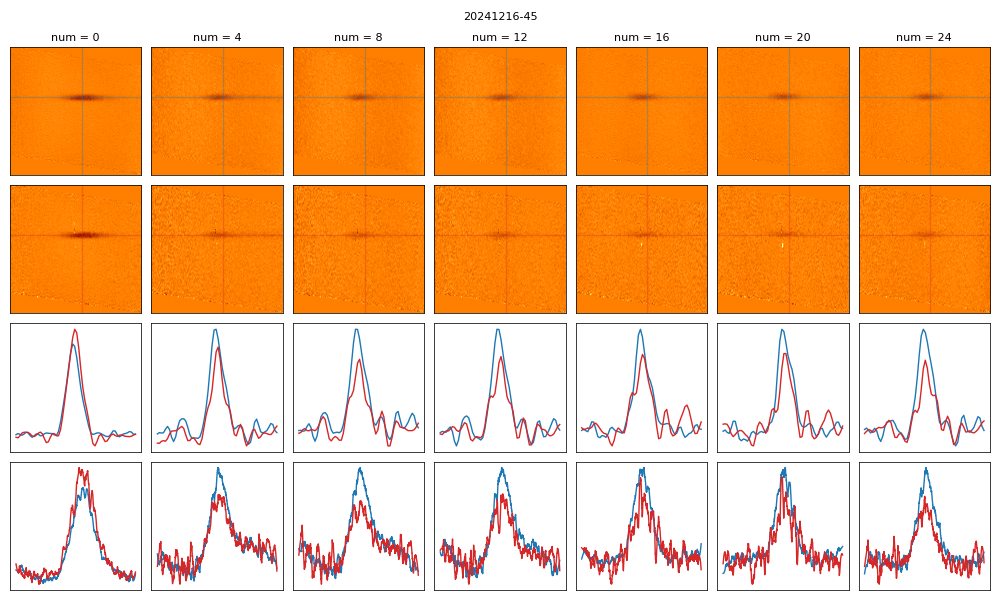

In [211]:
fig, ax = plt.subplots(4, 7, figsize=(15, 9))
fig.suptitle(f"{date}-{shot}")

for i in range(7):
    num_i = 4*i
    ax[0][i].set_title(f"num = {num_i}")
    ax[0][i].imshow(angs_rot[0][num_i], vmin=-2, vmax=2, cmap="afmhot_r", origin="lower", aspect='auto')
    ax[1][i].imshow(angs_rot[1][num_i], vmin=-2, vmax=2, cmap="afmhot_r", origin="lower", aspect='auto')
    
    lc = 1342 
    ax[0][i].axvline(x=lc, c='C0', alpha=0.3)
    ax[1][i].axvline(x=lc, c='C3', alpha=0.3)
    ax[2][i].plot(angs_rot[0][num_i].T[lc-25:lc+25, 104:164].mean(axis=0), color='C0')
    ax[2][i].plot(angs_rot[1][num_i].T[lc-25:lc+25, 104:164].mean(axis=0), color='C3')
    
    lc = 135 
    ax[0][i].axhline(y=lc, c='C0', alpha=0.3)
    ax[1][i].axhline(y=lc, c='C3', alpha=0.3)
    ax[3][i].plot(fix_data(angs_rot[0][num_i][lc-3:lc+3,10:-10].mean(axis=0), 85, 2, 0.2), color='C0')
    ax[3][i].plot(fix_data(angs_rot[1][num_i][lc-3:lc+3,10:-10].mean(axis=0), 85, 2, 0.2), color='C3')
#     ax[3][i].set_ylim([-0.5, 1.3])



for axs in fig.axes:
    axs.set_xticks([])
    axs.set_yticks([])


plt.tight_layout()
plt.show()



#### Individual

In [14]:
date = 20241216
dz_focus = 0.0024
angle_corr = 0.013886144990548997*180/np.pi

for shot in [45]:
    max_num = len(pyfits.open(f"/storage/data/{date}/{str(shot).zfill(4)}/0.fits")[0].data.astype(float))    
    print(shot, "max num = ", max_num)
    angs = [[HI_refocus(date, shot, num, dz_focus, quad) for num in range(max_num)] for quad in ["quad1", "quad2"]]
    angs_rot = [[rotate(a, angle_corr) for a in an] for an in angs]
    for num_i in range(max_num):
        save_folder = f"/home/bec_lab/Desktop/imgs/SOAH/SPINOR_PHYSICS/{date}/{shot}/"
        os.makedirs(save_folder, exist_ok=True)

        fig, ax = plt.subplots(5, 1, figsize=(15, 9))

        ax[0].imshow(angs_rot[0][num_i], vmin=-2, vmax=2, cmap="afmhot_r", origin="lower", aspect='auto')
        ax[1].imshow(angs_rot[1][num_i], vmin=-2, vmax=2, cmap="afmhot_r", origin="lower", aspect='auto')

        lc = 1342 - num_i*3 
        ax[0].axvline(x=lc, c='C0', alpha=0.3)
        ax[1].axvline(x=lc, c='C3', alpha=0.3)
        ax[2].plot(angs_rot[0][num_i].T[lc-25:lc+25, 104:164].mean(axis=0), color='C0', label="OAH1")
        ax[2].plot(angs_rot[1][num_i].T[lc-25:lc+25, 104:164].mean(axis=0), color='C3', label="OAH2")
        ax[2].legend()

        lc = 135 
        ax[0].axhline(y=lc, c='C0', alpha=0.1)
        ax[1].axhline(y=lc, c='C3', alpha=0.1)
        ax[3].plot(fix_data(angs_rot[0][num_i][lc-3:lc+3,10:-10].mean(axis=0), 75, 2, 0.2), color='C0', label="OAH1")
        ax[3].plot(fix_data(angs_rot[1][num_i][lc-3:lc+3,10:-10].mean(axis=0), 75, 2, 0.2), color='C3', label="OAH2")
        ax[3].legend()

        ax[4].plot((fix_data(angs_rot[0][num_i][lc-3:lc+3,10:-10].mean(axis=0), 75, 2, 0.2) - fix_data(angs_rot[1][num_i][lc-3:lc+3,10:-10].mean(axis=0), 75, 2, 0.2)), color='C1', label="SPIN 1")
        ax[4].plot((-0.45*fix_data(angs_rot[0][num_i][lc-3:lc+3,10:-10].mean(axis=0), 75, 2, 0.2) + fix_data(angs_rot[1][num_i][lc-3:lc+3,10:-10].mean(axis=0), 75, 2, 0.2)), color='C4', label="SPIN 2")
        ax[4].legend()


        for axs in [ax[3], ax[4]]:
            axs.set_ylim([-0.4, 1.2])

        fig.suptitle(f"{date}-{shot}-{num} - time={num_i*10.01} - In ODT", fontsize=18)
        ax[0].set_ylabel("OAH 1", fontsize=12)
        ax[1].set_ylabel("OAH 2", fontsize=12)
        ax[2].set_ylabel("Vertical \nLinecut (intg.)", fontsize=12)
        ax[3].set_ylabel("Horizontal \nLinecut (intg.)", fontsize=12)
        ax[4].set_ylabel("Spin \nReconstruction", fontsize=12)

        for axs in fig.axes:
            axs.set_xticks([])
            axs.set_yticks([])


        plt.tight_layout()

        plt.savefig(f"{save_folder}{str(num_i).zfill(3)}.png")
        plt.close()
        clear_output()



45 max num =  25
Using the new box cutter
------ r='quad1' ------
Using quad1
Using the new box cutter
Indices provided: 
Indices provided: 
------ r='quad1' ------
Using quad1
Indices provided: 
(198, 2558) (198, 2558)
Using the new box cutter
------ r='quad1' ------
Using quad1
Using the new box cutter
Indices provided: 
Indices provided: 
------ r='quad1' ------
Using quad1
Indices provided: 
(198, 2558) (198, 2558)
Using the new box cutter
------ r='quad1' ------
Using quad1
Using the new box cutter
Indices provided: 
Indices provided: 
------ r='quad1' ------
Using quad1
Indices provided: 
(198, 2558) (198, 2558)
Using the new box cutter
------ r='quad1' ------
Using quad1
Using the new box cutter
Indices provided: 
Indices provided: 
------ r='quad1' ------
Using quad1
Indices provided: 
(198, 2558) (198, 2558)
Using the new box cutter
------ r='quad1' ------
Using quad1
Using the new box cutter
Indices provided: 
Indices provided: 
------ r='quad1' ------
Using quad1
Indices pro

KeyboardInterrupt: 

### 20241216 - 20 - Big single shot

In [15]:
date = 20241216
shot = 20
dz_focus = 0.0024
num = 0
angle_corr = 0.013886144990548997*180/np.pi

max_num = len(pyfits.open(f"/storage/data/{date}/{str(shot).zfill(4)}/0.fits")[0].data.astype(float))
print("number of images:", max_num)

number of images: 1


In [16]:
angs = [HI_refocus(date, shot, num, dz_focus, quad) for quad in ["quad1", "quad2"]]
angs_rot_b = [rotate(a, angle_corr) for a in angs]

Using the new box cutter
------ r='quad1' ------
Using quad1
Using the new box cutter
Indices provided: 
Indices provided: 
------ r='quad1' ------
Using quad1
Indices provided: 
(2158, 2558) (2158, 2558)
Using the new box cutter
------ r='quad2' ------
Using quad2
Using the new box cutter
Indices provided: 
Indices provided: 
------ r='quad2' ------
Using quad2
Indices provided: 
(2158, 2558) (2158, 2558)


<IPython.core.display.Javascript object>


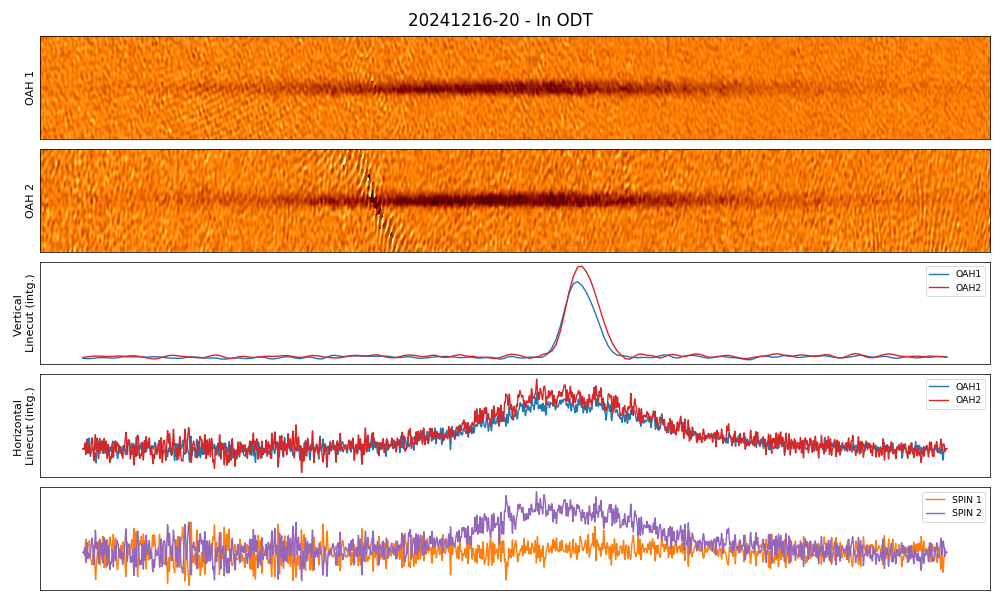

In [21]:
fig, ax = plt.subplots(5, 1, figsize=(15, 9))

ax[0].imshow(angs_rot_b[0], vmin=-2, vmax=2, cmap="afmhot_r", origin="lower", aspect='auto')
ax[1].imshow(angs_rot_b[1], vmin=-2, vmax=2, cmap="afmhot_r", origin="lower", aspect='auto')

ax[0].set_xlim([743, 2100])
ax[0].set_ylim([1080, 1150])
ax[1].set_xlim([743, 2100])
ax[1].set_ylim([1080, 1150])

lc = 1442 
ax[0].axvline(x=lc, c='C0', alpha=0.3)
ax[1].axvline(x=lc, c='C3', alpha=0.3)
ax[2].plot(angs_rot_b[0].T[lc-250:lc+250, 1000:1200].mean(axis=0), color='C0', label="OAH1")
ax[2].plot(angs_rot_b[1].T[lc-250:lc+250, 1000:1200].mean(axis=0), color='C3', label="OAH2")
ax[2].legend()

lc = 1115 
ax[0].axhline(y=lc, c='C0', alpha=0.1)
ax[1].axhline(y=lc, c='C3', alpha=0.1)

win_mag = 5
polyord = 2
threshold = 0.2

ax[3].plot(fix_data(angs_rot_b[0][lc-3:lc+3,10:-10].mean(axis=0), win_mag, polyord, threshold), color='C0', label="OAH1")
ax[3].plot(fix_data(angs_rot_b[1][lc-3:lc+3,10:-10].mean(axis=0), win_mag, polyord, threshold), color='C3', label="OAH2")
ax[3].legend()

ax[4].plot((1.1*fix_data(angs_rot_b[0][lc-3:lc+3,10:-10].mean(axis=0), win_mag, polyord, threshold) - 0.85*fix_data(angs_rot_b[1][lc-3:lc+3,10:-10].mean(axis=0), win_mag, polyord, threshold)), color='C1', label="SPIN 1")
ax[4].plot((-0.45*fix_data(angs_rot_b[0][lc-3:lc+3,10:-10].mean(axis=0), win_mag, polyord, threshold) + fix_data(angs_rot_b[1][lc-3:lc+3,10:-10].mean(axis=0), win_mag, polyord, threshold)), color='C4', label="SPIN 2")
ax[4].legend()



fig.suptitle(f"{date}-{shot} - In ODT", fontsize=18)
ax[0].set_ylabel("OAH 1", fontsize=12)
ax[1].set_ylabel("OAH 2", fontsize=12)
ax[2].set_ylabel("Vertical \nLinecut (intg.)", fontsize=12)
ax[3].set_ylabel("Horizontal \nLinecut (intg.)", fontsize=12)

for axs in fig.axes:
    axs.set_xticks([])
    axs.set_yticks([])


plt.tight_layout()
plt.show()



In [ ]:
for mltpl in [1, 1.2]:

    fig, ax = plt.subplots(2, 1, figsize=(14, 8))

    win_mag = 95
    polyord = 2
    threshold = 0.2

#     mltpl = 1.2 

    plt.suptitle(f"{date}-{shot}-0 \n{mltpl} $\\times$ OAH 1 = OAH 2")

    ax[0].plot(mltpl*angs_rot_b[0].T[lc-250:lc+250, 1000:1200].mean(axis=0), color='C0', label="OAH1")
    ax[0].plot(angs_rot_b[1].T[lc-250:lc+250, 1000:1200].mean(axis=0), color='C3', label="OAH2")
    ax[0].legend()


    ax[1].plot(mltpl*fix_data(angs_rot_b[0][lc-3:lc+3,10:-10].mean(axis=0), win_mag, polyord, threshold), color='C0', label="OAH1")
    ax[1].plot(fix_data(angs_rot_b[1][lc-3:lc+3,10:-10].mean(axis=0), win_mag, polyord, threshold), color='C3', label="OAH2")
    ax[1].legend()

    ax[1].plot((mltpl*fix_data(angs_rot_b[0][lc-3:lc+3,10:-10].mean(axis=0), win_mag, polyord, threshold) - fix_data(angs_rot_b[1][lc-3:lc+3,10:-10].mean(axis=0), win_mag, polyord, threshold)), color='C1', alpha=0.4+0.05*j, label=f"{mltpl} $\\times$ OAH 1 - OAH 2")
    ax[1].legend()

    plt.show()


# Figures

## POSTER FIGURES

<IPython.core.display.Javascript object>


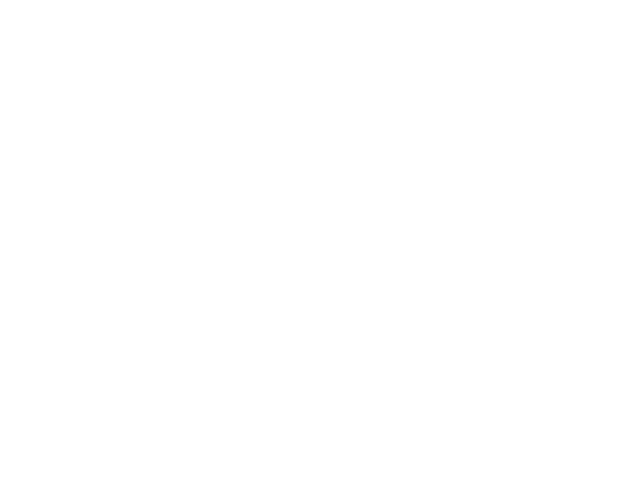

<IPython.core.display.Javascript object>


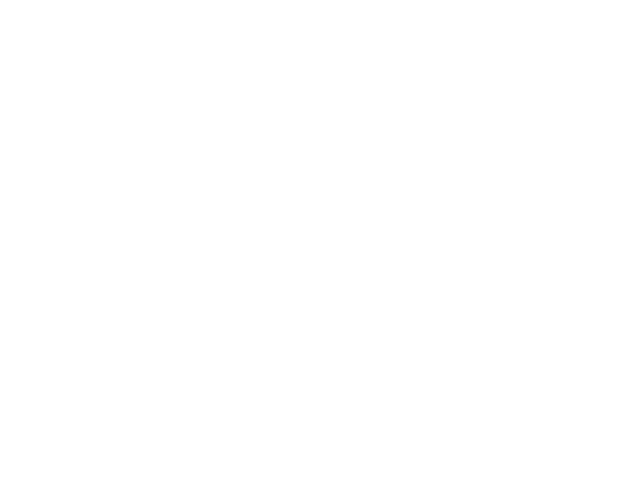

<IPython.core.display.Javascript object>


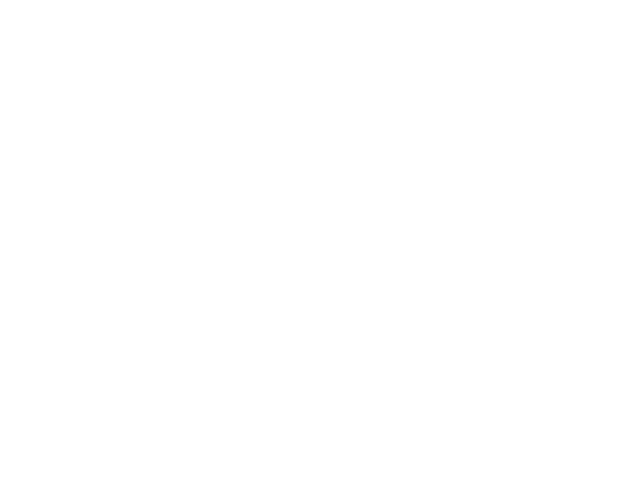

<IPython.core.display.Javascript object>


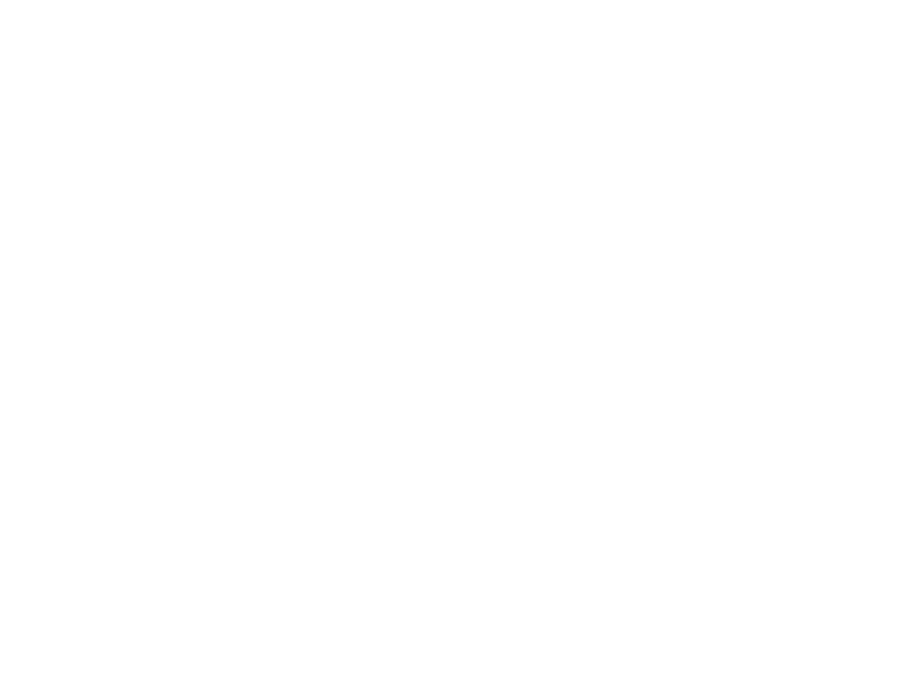

<IPython.core.display.Javascript object>


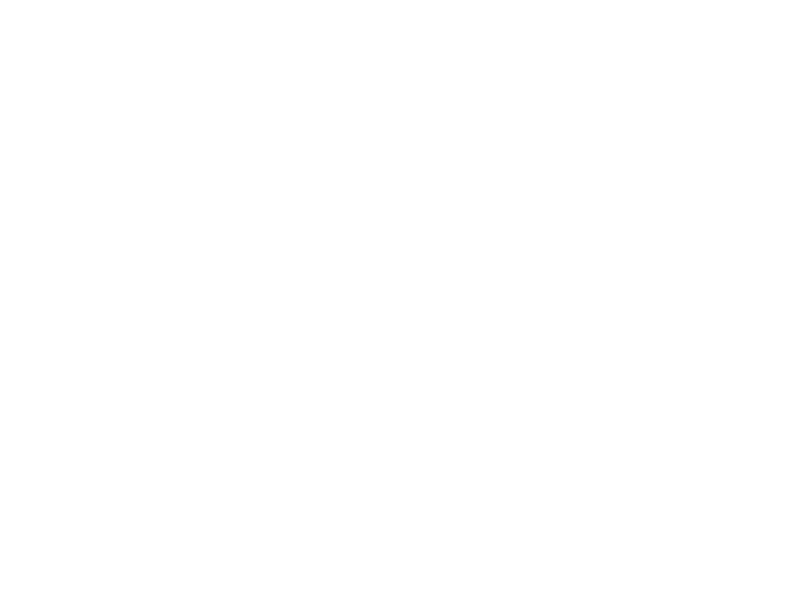

<IPython.core.display.Javascript object>


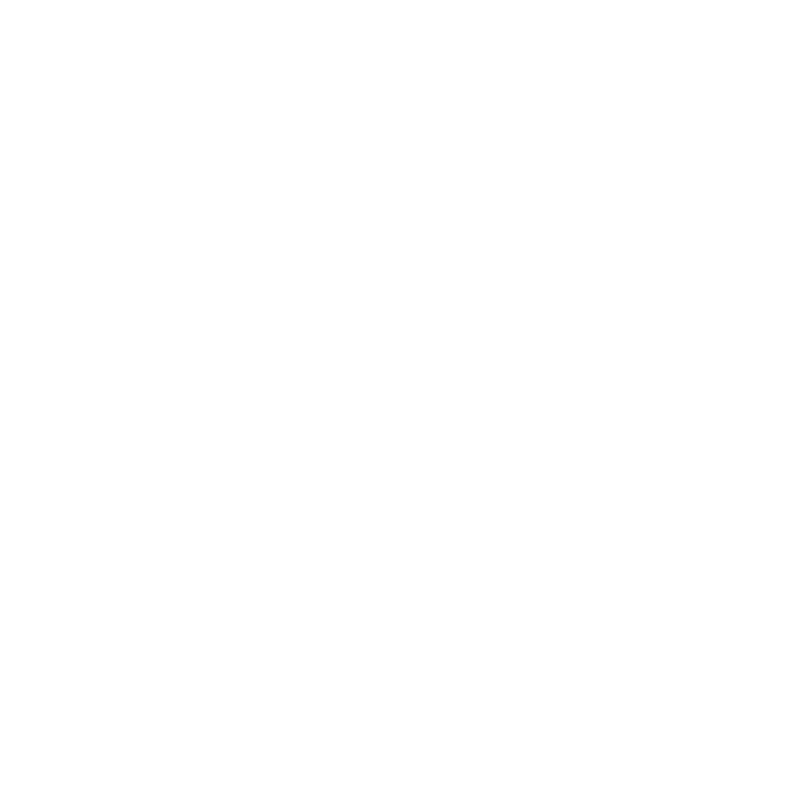

<IPython.core.display.Javascript object>


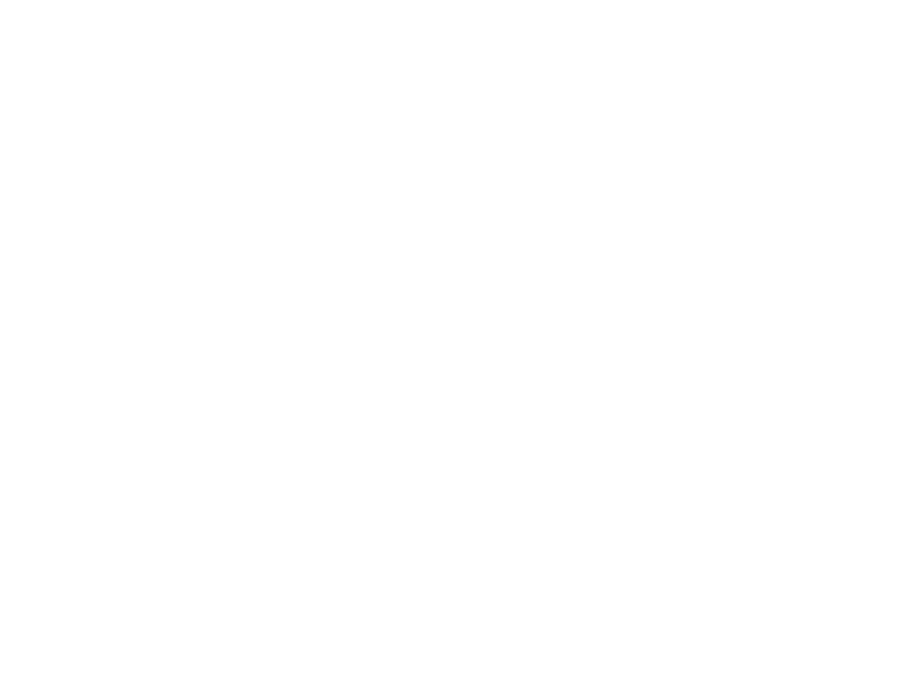

<IPython.core.display.Javascript object>


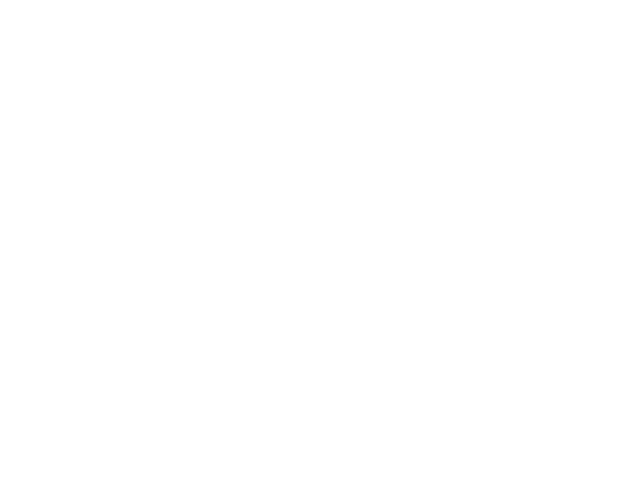

<IPython.core.display.Javascript object>


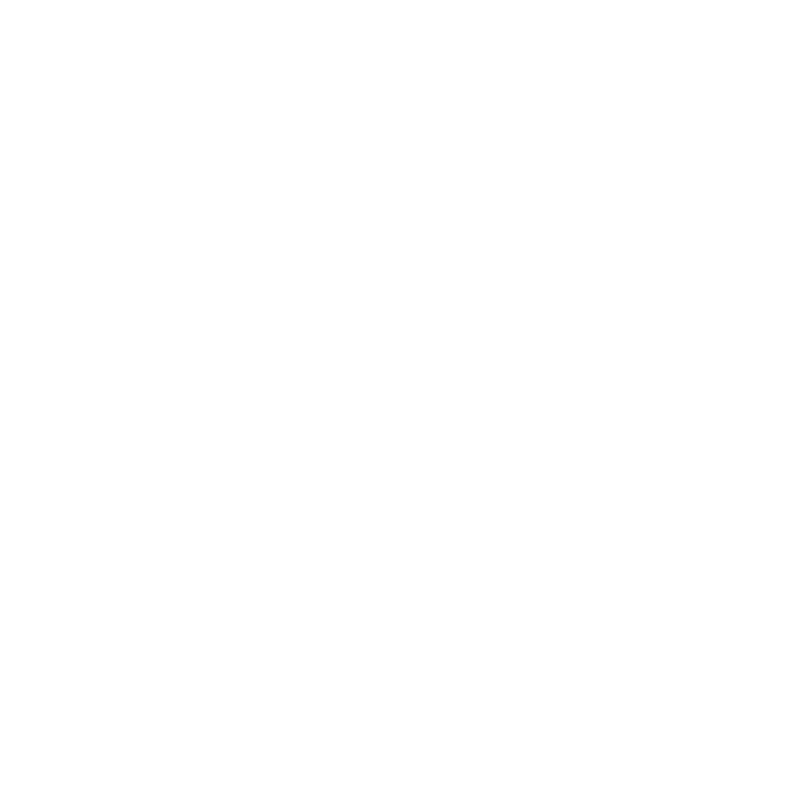

<IPython.core.display.Javascript object>


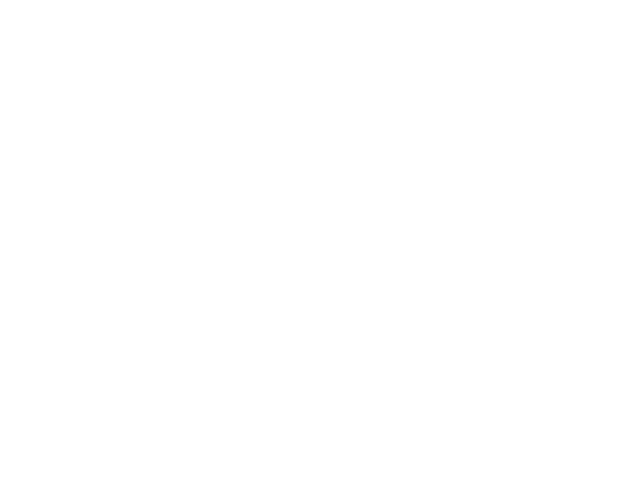

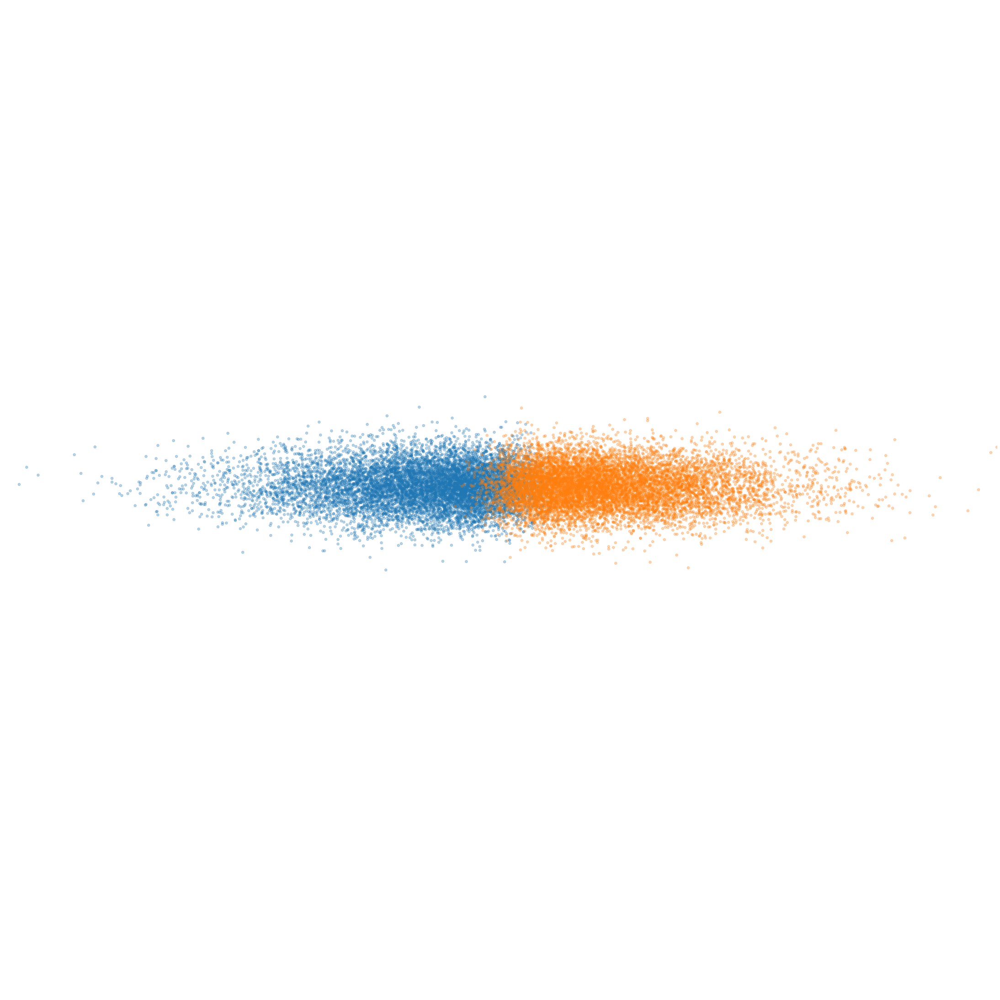

In [75]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import skewnorm

# Generate 3D data for the elongated ellipsoid-shaped cloud of atoms
n_points = 10000

a = 6
x1 = skewnorm.rvs(a=a, size=n_points) * 2  # 'a' parameter controls the skewness
y1 = np.random.normal(0, 0.4, n_points)
z1 = np.random.normal(0, 0.4, n_points)  # Elongated along the Z-axis


x2 = skewnorm.rvs(a=-a, size=n_points) * 2  # 'a' parameter controls the skewness
y2 = np.random.normal(0, 0.4, n_points)
z2 = np.random.normal(0, 0.4, n_points)  # Elongated along the Z-axis

# Generate density components (ellipsoid along Z-axis, and two distinct components)
density_component_1 = np.zeros(n_points) # np.exp(-(x**2 + y**2 + (z / 3)**2) / 20)
density_component_2 = np.ones(n_points) # np.exp(-(x**2 + y**2 + (z - 3)**2) / 20)

# Plot the 3D ellipsoid-shaped cloud of atoms
fig = plt.figure(figsize=(40,40))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(x1, y1, z1, c='C0', s=30, alpha=0.32, label='Density Component 1')
ax.scatter(x2, y2, z2, c='C1', s=30, alpha=0.32, label='Density Component 2')
# ax.scatter(x1[::2], y1[::2], z1[::2], c='C0', s=30, alpha=0.32, label='Density Component 1')
# ax.scatter(x1[1:2], y1[1:2], z1[1:2], c='C0', s=30, alpha=0.32, label='Density Component 1')

ax.set_axis_off() 
ax.set_xlim([-5, 5])
ax.set_ylim([-5, 5])
ax.set_zlim([-5, 5])

ax.view_init(elev=30, azim=90)

plt.savefig("/home/bec_lab/Desktop/UUOneDrive/atoms.png", transparent = True)
plt.show()



In [ ]:
# Plot projections of only first component
# fs = 40
# ss = 30

fs = 7
ss = 7

fig, (ax, ax1) = plt.subplots(2, 1, figsize=(fs,fs))
ax.scatter(x2, y2, s=ss, c='gray', alpha=0.05)
ax.scatter(x1, y1, s=ss, c='C1', alpha=0.32)

ax1.hist(x1, 500, density=True, histtype='step', color='C1', alpha=0.9)
ax.set_ylim([-6, 6])

for ax in [ax, ax1]:
    ax.set_xlim([-6, 6])
    ax.set_xticks([])
    ax.set_yticks([])
    ax.spines[['right', 'left', 'top', 'bottom']].set_color('white')
plt.savefig("/home/bec_lab/Desktop/UUOneDrive/atomsS1.png", transparent = True)
plt.show()

# Plot projections of only second component
fig, (ax, ax1) = plt.subplots(2, 1, figsize=(fs,fs))
ax.scatter(x1, y1, s=ss, c='gray', alpha=0.05)
ax.scatter(x2, y2, s=ss, c='C0', alpha=0.32)
ax1.hist(x2, 500, density=True, histtype='step', color='C0', alpha=0.9)
ax.set_ylim([-6, 6])

for ax in [ax, ax1]:
    ax.set_xlim([-6, 6])
    ax.set_xticks([])
    ax.set_yticks([])
    ax.spines[['right', 'left', 'top', 'bottom']].set_color('white')
plt.savefig("/home/bec_lab/Desktop/UUOneDrive/atomsS2.png", transparent = True)
plt.show()



In [ ]:
pic = makeAPic(20230425, 137, num=0, multi_loop=0)
fig, ax = plt.subplots(1,1, figsize=(10, 10))
ax.imshow(pic[900:1370, 920:1402], vmin=0, vmax=1.6, cmap='afmhot_r', interpolation=None, origin="lower")
ax.set_xticks([])
ax.set_yticks([])
plt.savefig("/home/bec_lab/Desktop/UUOneDrive/double_interference.png", transparent = True)

plt.show()

In [ ]:
# THIRD PLOTTING - Check the log-normalized fft's. We expect two peaks in the top-left and bottom-right quadrants
f, ax = plt.subplots(1, 1, figsize=(10, 10))
ax.imshow(abs(fft_atoms), cmap=plt.get_cmap('gist_heat'), norm=colors.LogNorm())
ax.set_xticks([])
ax.set_yticks([])
plt.savefig("/home/bec_lab/Desktop/UUOneDrive/FFT_double.png", transparent = True)

plt.show()

## SDOAH Presentation 2023-07-25

### Cooling In the MT 

In [ ]:
date = 20230420
runs = range(19, 108)

pnums = [get_fit_parameter(date, shot, "ntherm", "gauss") for shot in runs if shot not in [86]]
tx = [get_fit_parameter(date, shot, "tx", "gauss") for shot in runs if shot not in [86]]
tz = [get_fit_parameter(date, shot, "tz", "gauss") for shot in runs if shot not in [86]]
temp = np.add(tx, tz)
rf = [get_parameter(date, shot, "rftime") for shot in runs if shot not in [86]]


fig, ax = plt.subplots(1,1)
ax.scatter(rf, np.array(pnums)/1e6, c='C0', marker='x', alpha=0.4)

ax2 = ax.twinx()
ax2.scatter(rf, temp/1e-6, c='C1', marker='o', alpha=0.4)


ax.tick_params(axis='y', labelcolor='C0')
ax2.tick_params(axis='y', labelcolor='C1')
ax.set_xlabel("RF Cooling Time [s]")
ax.set_ylabel("Particle Number [M]", color='C0')
ax2.set_ylabel("Temperature [$\mu$K]", color='C1')


### Cooling video in MT

In [ ]:
# make a video of cooling 
xbin = 4
zbin = 4
for shot in range(19, 108):
    pic = makeAPic(20230420, shot, num=0, multi_loop=0)
    # Normalize the background for a pretty video: 
    pic -= (pic[34:40].mean()-1)
    # Maybe bin
    if pic.shape[0] % xbin != 0:
        pic = pic[:-(pic.shape[0] % xbin), :]
    if pic.shape[1] % zbin != 0:
        pic = pic[:, :-(pic.shape[1] % zbin)]
    pic = pic.reshape(pic.shape[0] // xbin, xbin, pic.shape[1] // zbin, zbin).mean(axis=3).mean(axis=1)
    
    fig, ax = plt.subplots(1,1)
    rf = get_parameter(date, shot, "rftime")
    ax.imshow(pic, vmin=0, vmax=1.3, cmap='afmhot_r', interpolation='none', origin="lower")
    ax.set_title("RF Cooling = {:} s".format(rf))
    ax.set_xticks([])
    ax.set_yticks([])
    plt.savefig("/home/bec_lab/Desktop/imgs/absorption_cooling/{:}.png".format(str(shot).zfill(4)))
    plt.close()

In [ ]:
images = []
for filename in sorted(os.listdir("/home/bec_lab/Desktop/imgs/absorption_cooling/")):
    print("Moviefying ", filename)
    images.append(imageio.imread("/home/bec_lab/Desktop/imgs/absorption_cooling/" + filename))
    clear_output(wait=True)
imageio.mimsave('/home/bec_lab/Desktop/UUOneDrive/Desktop/cooling.gif', images)
print("Moviefying completed!")
# for filename in os.listdir("/home/bec_lab/Desktop/imgs/"):
#     if filename.endswith(".png"):
#         os.remove(os.path.join("/home/bec_lab/Desktop/imgs/", filename))     
# print("All temp files deleted.")

In [ ]:
# make a video of cooling 
xbin = 4
zbin = 4
for num in range(100):
    atoms, flat, dark, fft_atoms, fft_flat, ang1, amp = fft_analysis(20210412, 99, num, 0.0000, quad_cut="quad1", multi_loop=0, el_x=10, el_z=100, edge_x=10, edge_z=80, e_w=0.1)
    pic = ang1[:, 500:1300]
#     # Normalize the background for a pretty video: 
#     pic -= (pic[34:40].mean()-1)
#     # Maybe bin
#     if pic.shape[0] % xbin != 0:
#         pic = pic[:-(pic.shape[0] % xbin), :]
#     if pic.shape[1] % zbin != 0:
#         pic = pic[:, :-(pic.shape[1] % zbin)]
#     pic = pic.reshape(pic.shape[0] // xbin, xbin, pic.shape[1] // zbin, zbin).mean(axis=3).mean(axis=1)
    cooltime = 77
    fig, ax = plt.subplots(1,1)
    ax.imshow(pic, vmin=-4., vmax=0.5, cmap='afmhot_r', interpolation='none', origin="lower")
    ax.set_title("RF Cooling = {:} s".format(cooltime))
    ax.set_xticks([])
    ax.set_yticks([])
    plt.savefig("/home/bec_lab/Desktop/imgs/OAH_cooling/{:}.png".format(str(num).zfill(4)))
    plt.close()
    cooltime =+ 0.066

### Overlap ODT

<IPython.core.display.Javascript object>


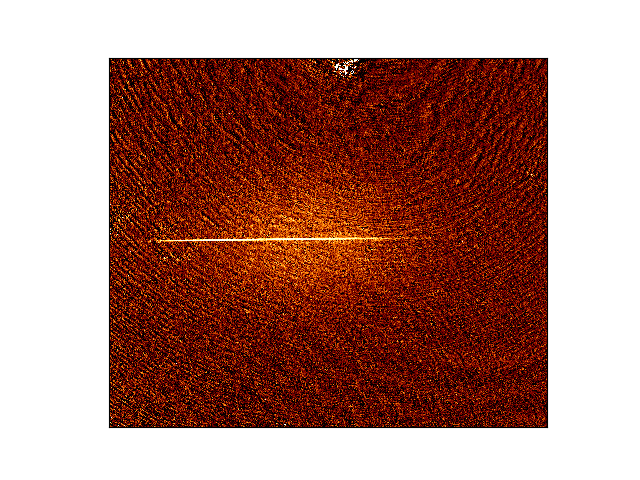

In [24]:
pic = makeAPic(20230228, 153, num=0, multi_loop=0)
fig, ax = plt.subplots(1,1)
ax.imshow(pic, vmin=0, vmax=1.3, cmap='afmhot_r', interpolation='none', origin="lower")
ax.set_xticks([])
ax.set_yticks([])
plt.show()

###  Condensate in ODT 

In [23]:
pic = makeAPic(20230711, 35, num=0, multi_loop=0)
fig, ax = plt.subplots(1,1)
ax.imshow(pic, vmin=0, vmax=1.3, cmap='afmhot_r', interpolation='none', origin="lower")
ax.set_xticks([])
ax.set_yticks([])
plt.show()

<IPython.core.display.Javascript object>

### Stern Gerlach Or Whatever it is

<IPython.core.display.Javascript object>


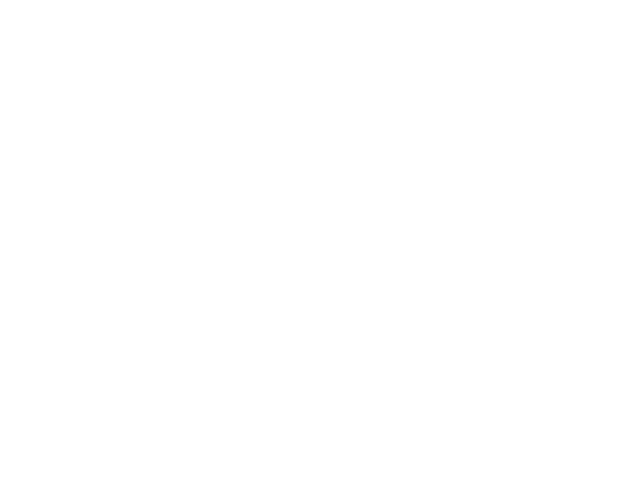

In [22]:
pic = makeAPic(20230724, 20, num=0, multi_loop=0)
fig, ax = plt.subplots(1,1)
ax.imshow(pic, vmin=0, vmax=1.3, cmap='afmhot_r', interpolation='none', origin="lower")
ax.set_xticks([])
ax.set_yticks([])
plt.show()

# Mark's Bullshit

## Functions & Imports

In [56]:
import astropy.io.fits as pyfits
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks
from scipy.odr import Model, Data, ODR
import matplotlib
import scipy.odr as odr
from mpmath import *
from scipy import optimize as opt
from scipy import signal
from mpl_toolkits.mplot3d import Axes3D
from skimage.restoration import unwrap_phase
from sklearn.linear_model import LinearRegression
from scipy.signal import tukey
from scipy.ndimage import rotate
from scipy.signal import convolve
import os
import cv2

In [57]:
#---------------------
#CONSTANTS
#---------------------
kB = 1.38064852E-23  # Boltzmann constant
m = 3.81923979E-26   # Sodium atom mass
hb = 1.0545718E-34   # h-bar
asc = 2.802642E-9    # scattering length for Sodium
psize = 2.471482E-6  # pizel size in meters
pi = 3.14159265
#---------------------
#PARAMETERS 
#---------------------
TOF = 0
U_0 = 4*pi*(hb**2)*asc/m
w_z = 2.3*2*pi
w_p = 1800*2*pi
w_l = 598e-9
k0 = 2*np.pi/w_l  # k-vector
C_eg2 = 8/15
detun = 2*350e6/9.746e6 #for OAH   
factor = 0.5 * detun/(1 + detun**2)
#---------------------
#INPUT FOLDER 
#---------------------
Run = 350
Day = '20231024'
input_folder = '/storage/data/' + Day +'/'+ str(Run).zfill(4)


In [307]:
def open_pyfits(x):        
    atom = pyfits.open(x + '/0.fits')[0].data.astype(float)
    flat = pyfits.open(x + '/1.fits')[0].data.astype(float)[0]
    dark = pyfits.open(x + '/2.fits')[0].data.astype(float).mean(axis=0)  
    return atom, flat, dark 

def crop_img(img):
    row, col = img.shape
    row_start, row_end = 2, int(row)-2
    col_start, col_end = 5, int(col)-5
    return img[row_start:row_end, col_start:col_end]

def create_fitvars(img):
    x, y = np.meshgrid(np.arange(img.shape[0]), np.arange(img.shape[1]), indexing='ij')
    return x,y
   
def create_fitvars_reshaped(img):
    x, y = np.meshgrid(np.arange(img.shape[0]), np.arange(img.shape[1]), indexing='ij')
    return np.array([x, y]).reshape(2, -1)


def fourier(img):
    img = np.fft.fft2(img)
    return img


def find_peak(img):
    return np.unravel_index(np.argmax(np.copy(img), axis = None), img.shape)

def find_peak_beam(img, beam):    
    """Find peak from either beam 1 or 2 in fourier space"""       
    mask = np.zeros_like(img)
    # rows, cols = img.shape[0], img.shape[1]
    if beam == 1:
        # mask[ int(rows//0.9) : int(rows//2.1) , int(cols//0.9): int(cols//2.2) ] = 1
        mask[ 100 : 800 , 400: 850 ] = 1
    elif beam == 2:
        # mask[ int(rows//0.9) : int(rows//2.1) , int(cols//1.8) : int(img[1].size - int(rows//0.9)) ] = 1  
        mask[ 100 : 800 , 1650 : 2300 ] = 1  
    img = img * mask      
#     fig, ax = plt.subplots()
#     ax.imshow( np.log(np.abs(img)), cmap='afmhot_r')
    peak = find_peak(img)
    print(peak)
    return peak


def ellipse(row_0, col_0, r_row, r_col, x, y):    
    ellip = ((y - col_0) / r_col) ** 2 + ((x - row_0) / r_row) ** 2 <= 1    
    return ellip


def window_tukey(alpha, shape):
    raw, col = shape
    tukey_window = np.sqrt(np.outer(signal.windows.tukey(raw, alpha),
                                    signal.windows.tukey(col, alpha)))
    return tukey_window

def mask_tukey(img, raw0, col0, r_row, r_col):
    x, y = create_fitvars(img)
    elip = ellipse(raw0, col0, r_row, r_col, x, y)
    tukey_ = window_tukey(0.5, [100, 100])  
    #tykey mask
    mask = convolve(elip, tukey_, mode='same')
    norm = np.max(mask)
    mask = mask/norm  
    img_masked = img*mask
    #nan mask
    mask_nan = (np.log(np.abs(img_masked)) <= 0)
    img_masked[mask_nan] = 0
    return img, img_masked

def shift_peak_center(img, peak):    
    raw0, col0 = peak
    #shift required
    center_raw, center_col = np.array(img.shape) // 2
    shift_raw, shift_col = center_raw - raw0, center_col - col0
    # Shift the image
    shifted_img = np.roll(img, (shift_raw, shift_col), axis=(0, 1))
    
    return shifted_img
    
    
def refocus(img, dz_focus):    
    fft_kx = np.fft.fftfreq(img.shape[1], d=psize)  
    fft_ky = np.fft.fftfreq(img.shape[0], d=psize)  
    fft_k2 = fft_kx[None, :] ** 2 + fft_ky[:, None] ** 2  
    ly = 0 
    coma_y_arg = ly * fft_ky[:, None] * (3 * fft_k2 / k0 ** 2) / k0
    lin_y = np.exp(-1j * coma_y_arg)    
    focus = np.exp(-1j * fft_k2 * dz_focus / (2 * k0))
    return img * focus * lin_y

def invers_fourier(img):
#     img = np.fft.ifftshift(img)
    img_fin = np.fft.ifft2(img)
    return img_fin

    
def obtain_angle(img, img_flat):
    
    # E_norm =  img/img_flat
    E_norm = np.where(img_flat == 0, 0, img/img_flat)
    ang = -np.angle(E_norm)
    
#     fig, ax = plt.subplots(1, 3)
#     im0 = ax[0].imshow(np.abs(img), cmap='hot')
#     ax[0].set_title('atoms')
#     fig.colorbar(im0, ax=ax[0])
#     im1 = ax[1].imshow(np.abs(img_flat), cmap='hot')
#     ax[1].set_title('flat')
#     fig.colorbar(im1, ax=ax[1])    
#     im1 = ax[2].imshow(ang, cmap='hot')
#     ax[2].set_title('angle(atoms/flat)')
#     fig.colorbar(im1, ax=ax[2])
    
    return ang 
    
def crop_img_2(img):    
    # x = x[ 100:x[0].size-100 , 100:x[1].size-100]
    crop_center = find_peak(img)[0]        
    row_start, row_end = crop_center[0]-120, crop_center[0]+120
    col_start, col_end = crop_center[1]-200, crop_center[1]+200
    img = img[row_start:row_end, col_start:col_end]    
    return img

   
def detrend_2d(img):
    n_rows, n_cols = img.shape
    x = np.arange(n_cols)
    y = np.arange(n_rows)
    xx, yy = np.meshgrid(x, y)
    X = np.column_stack((np.ravel(xx), np.ravel(yy)))
    y = np.ravel(img)
    model = LinearRegression()
    model.fit(X, y)
    trend_surface = model.predict(X).reshape(n_rows, n_cols)
    detrended_data = img - trend_surface  
    # Plotting the trend surface
    # fig = plt.figure()
    # ax1 = fig.add_subplot(121, projection='3d')
    # ax1.plot_surface(xx, yy, trend_surface, cmap='viridis')
    # ax1.set_title('Trend Surface')
    return detrended_data

def fitting(fitting_model, xx, yy, init_):     
    model = Model(fitting_model)     
    x = xx[:, ~yy.mask.flatten()]
    y = yy.flatten()[~yy.mask.flatten()]
    data = odr.Data(x, y)            
    myodr = ODR(data, model, beta0 = init_ )    
    return myodr.run()

def rotate_img(img, rot):
    return rotate(img, rot, reshape=False) #anticlockwise

def rotate_array_img(data_array, rot_array):
    data_rotated = []    
    for i in range(len(data_array)):         
        data = data_array[i]
        rot = rot_array[i]        
        data_transformed = rotate_img(data, rot)
        data_rotated.append(data_transformed)
    return data_rotated

def rotvars(rot, xo, yo, grid):   
    x, y = grid
    rot_x = (np.cos(rot) * (x - xo) - np.sin(rot) * (y - yo)) 
    rot_z = (np.cos(rot) * (y - yo) + np.sin(rot) * (x - xo))
    return rot_x, rot_z

def thomas_fermi(parameters, grid):
    A, xo, yo, rx_tf, ry_tf, rot = parameters 
    x, y = rotvars(rot, xo, yo, grid)
    r = (x/rx_tf)**2 + (y/ry_tf)**2
    tf = 1 - r
    tf = np.maximum(tf, 0)    
    return  A * tf

def double_fermi(parameters, grid):
    A1, xo1, yo1, rx_tf1, ry_tf1, A2, xo2, yo2, rx_tf2, ry_tf2, rot = parameters 
    params1 = A1, xo1, yo1, rx_tf1, ry_tf1, rot
    params2 = A2, xo2, yo2, rx_tf2, ry_tf2, rot
    tf1 = thomas_fermi(params1, grid)
    tf2 = thomas_fermi(params2, grid)
    return tf1 + tf2


## Get into it

In [308]:
atom_raw, flat_raw ,dark = open_pyfits(input_folder)
flat = flat_raw - dark
atom = atom_raw[0] - dark

# atom = atom[200:atom.shape[0]-200, 200:atom.shape[1]-200]
# flat = flat[200:flat.shape[0]-200, 200:flat.shape[1]-200]

tukey_ =  window_tukey(0.5, atom.shape)

atom = atom * tukey_
flat = flat * tukey_

fig, ax = plt.subplots(1,3)
im0 = ax[0].imshow(atom, cmap='hot')
ax[0].set_title('atom')
# plt.colorbar(im0, ax=ax[0]) 
im1 = ax[1].imshow(flat, cmap='hot')
im1 = ax[2].imshow(atom[:2158,:2558]/flat[:2158,:2558], cmap='hot')
ax[1].set_title('flat')
# plt.colorbar(im1, ax=ax[1]) 


<IPython.core.display.Javascript object>

<ipython-input-308-2188c158b3e6>:18: RuntimeWarning: invalid value encountered in divide
  im1 = ax[2].imshow(atom[:2158,:2558]/flat[:2158,:2558], cmap='hot')


Text(0.5, 1.0, 'flat')

In [169]:
data_1 = fft_analysis(date, shot, num, dz_focus, quad_cut="quad1", multi_loop=0)#, shp="tight") ### with this shp - we can re-do it with the tight version

Indices provided: 
(2148, 2548) (2148, 2548)


In [309]:
atom_fft = fourier(atom)
flat_fft = fourier(flat)

fig, ax = plt.subplots(1,2)

im0 = ax[0].imshow( np.log(np.abs(atom_fft)), cmap='hot')
ax[0].set_title('atom')
im1 = ax[1].imshow(np.log(np.abs(flat_fft)), cmap='hot')
ax[1].set_title('flat')


<IPython.core.display.Javascript object>

Text(0.5, 1.0, 'flat')

In [310]:
#%%                                MASK 
rows, cols = atom_fft.shape
#find the peak coordinates of beam 1 and 2
raw0_1, col0_1  = find_peak_beam(atom_fft,1)
raw0_2, col0_2 = find_peak_beam(atom_fft,2)
#define size of window
r_row = rows / 5
r_col = cols / 5   
#apply window
atom_1_original, atom_1_masked = mask_tukey(atom_fft, raw0_1, col0_1, r_row, r_col)
flat_1_original, flat_1_masked = mask_tukey(flat_fft, raw0_1, col0_1, r_row, r_col)
atom_2_original, atom_2_masked = mask_tukey(atom_fft, raw0_2, col0_2, r_row, r_col)
flat_2_original, flat_2_masked = mask_tukey(flat_fft, raw0_2, col0_2, r_row, r_col)

#shift peak center
atom_1_shifted = shift_peak_center(atom_1_masked, [raw0_1,col0_1] )
flat_1_shifted = shift_peak_center(flat_1_masked, [raw0_1,col0_1] )
atom_2_shifted = shift_peak_center(atom_2_masked, [raw0_2,col0_2] )
flat_2_shifted = shift_peak_center(flat_2_masked, [raw0_2,col0_2] )

   
fig, ax = plt.subplots(5,2)
ax[0][0].imshow(np.log(abs(atom_1_original)), vmin=np.log(abs(atom_1_original)).min(), vmax=np.log(abs(atom_1_original)).max(),  cmap='afmhot_r', interpolation=None)
ax[0][1].imshow(np.log(abs(atom_2_original)), vmin=np.log(abs(atom_1_original)).min(), vmax=np.log(abs(atom_1_original)).max(),  cmap='afmhot_r', interpolation=None)
ax[1][0].imshow(np.log(abs(atom_1_masked)), vmin=np.log(abs(atom_1_original)).min(), vmax=np.log(abs(atom_1_original)).max(),  cmap='afmhot_r', interpolation=None)
ax[1][1].imshow(np.log(abs(atom_2_masked)), vmin=np.log(abs(atom_1_original)).min(), vmax=np.log(abs(atom_1_original)).max(),  cmap='afmhot_r', interpolation=None)
ax[2][0].plot(np.log(abs(atom_1_original))[561], c='C0', alpha=0.3)
ax[2][1].plot(np.log(abs(atom_2_original))[561], c='C0', alpha=0.3)
ax[2][0].plot(np.log(abs(atom_1_masked))[561], c='C1', alpha=0.3)
ax[2][1].plot(np.log(abs(atom_2_masked))[561], c='C1', alpha=0.3)
ax[3][0].imshow(np.log(abs(atom_1_shifted)), vmin=np.log(abs(atom_1_original)).min(), vmax=np.log(abs(atom_1_original)).max(),  cmap='afmhot_r', interpolation=None)
ax[3][1].imshow(np.log(abs(atom_2_shifted)), vmin=np.log(abs(atom_1_original)).min(), vmax=np.log(abs(atom_1_original)).max(),  cmap='afmhot_r', interpolation=None)
ax[4][0].imshow(np.log(abs(flat_1_shifted)), vmin=np.log(abs(atom_1_original)).min(), vmax=np.log(abs(atom_1_original)).max(),  cmap='afmhot_r', interpolation=None)
ax[4][1].imshow(np.log(abs(flat_2_shifted)), vmin=np.log(abs(atom_1_original)).min(), vmax=np.log(abs(atom_1_original)).max(),  cmap='afmhot_r', interpolation=None)


(561, 662)
(558, 1935)


<ipython-input-307-fc920889aedc>:69: RuntimeWarning: divide by zero encountered in log
  mask_nan = (np.log(np.abs(img_masked)) <= 0)


<IPython.core.display.Javascript object>

<ipython-input-310-897818b8b376>:25: RuntimeWarning: divide by zero encountered in log
  ax[1][0].imshow(np.log(abs(atom_1_masked)), vmin=np.log(abs(atom_1_original)).min(), vmax=np.log(abs(atom_1_original)).max(),  cmap='afmhot_r', interpolation=None)
<ipython-input-310-897818b8b376>:26: RuntimeWarning: divide by zero encountered in log
  ax[1][1].imshow(np.log(abs(atom_2_masked)), vmin=np.log(abs(atom_1_original)).min(), vmax=np.log(abs(atom_1_original)).max(),  cmap='afmhot_r', interpolation=None)
<ipython-input-310-897818b8b376>:29: RuntimeWarning: divide by zero encountered in log
  ax[2][0].plot(np.log(abs(atom_1_masked))[561], c='C1', alpha=0.3)
<ipython-input-310-897818b8b376>:30: RuntimeWarning: divide by zero encountered in log
  ax[2][1].plot(np.log(abs(atom_2_masked))[561], c='C1', alpha=0.3)
<ipython-input-310-897818b8b376>:31: RuntimeWarning: divide by zero encountered in log
  ax[3][0].imshow(np.log(abs(atom_1_shifted)), vmin=np.log(abs(atom_1_original)).min(), vmax=np.l

In [236]:
el_x=10
el_z=100
edge_x=10
edge_z=80
e_w=0.1
fullfield=False
shp=None

atoms, flat, dark, fft_atoms, fft_flat = pre_fft(date, shot, num, multi_loop=0)
quad1, q1peak = f1.box_cutter_pad_ellips(fft_atoms, "quad1", el_x, el_z, edge_x=edge_x, edge_z=edge_z, e_w=e_w, shp=shp)
flatq1, f1peak = f1.box_cutter_pad_ellips(fft_flat, "quad1", el_x, el_z, edge_x=edge_x, edge_z=edge_z, e_w=e_w, indices=q1peak, shp=shp)


Indices provided: 


In [311]:
fig, ax = plt.subplots(2,2, figsize=(12, 12))
ax[0][0].imshow(np.log(abs(atom_1_shifted)), vmin=np.log(abs(atom_1_original)).min(), vmax=np.log(abs(atom_1_original)).max(),  cmap='afmhot_r', interpolation=None)
ax[0][1].imshow(np.log(abs(quad1)), vmin=np.log(abs(atom_1_original)).min(), vmax=np.log(abs(atom_1_original)).max(),  cmap='afmhot_r', interpolation=None)
ax[1][0].plot(np.log(abs(atom_1_shifted))[1000])
ax[1][1].plot(np.log(abs(quad1))[1000])
ax[1][0].set_ylim([0, 18])
ax[1][1].set_ylim([0, 18])
ax[1][0].set_xlim([0, 2500])
ax[1][1].set_xlim([0, 2500])
plt.show()

<IPython.core.display.Javascript object>

<ipython-input-311-abf68ac3c561>:2: RuntimeWarning: divide by zero encountered in log
  ax[0][0].imshow(np.log(abs(atom_1_shifted)), vmin=np.log(abs(atom_1_original)).min(), vmax=np.log(abs(atom_1_original)).max(),  cmap='afmhot_r', interpolation=None)
<ipython-input-311-abf68ac3c561>:3: RuntimeWarning: divide by zero encountered in log
  ax[0][1].imshow(np.log(abs(quad1)), vmin=np.log(abs(atom_1_original)).min(), vmax=np.log(abs(atom_1_original)).max(),  cmap='afmhot_r', interpolation=None)
<ipython-input-311-abf68ac3c561>:4: RuntimeWarning: divide by zero encountered in log
  ax[1][0].plot(np.log(abs(atom_1_shifted))[1000])
<ipython-input-311-abf68ac3c561>:5: RuntimeWarning: divide by zero encountered in log
  ax[1][1].plot(np.log(abs(quad1))[1000])


In [312]:
d_refocus = 0
refocused_atom_1 = refocus(np.fft.fftshift(atom_1_shifted), 0)
refocused_flat_1 = refocus(np.fft.fftshift(flat_1_shifted), 0)
refocused_atom_2 = refocus(np.fft.fftshift(atom_2_shifted), 0)
refocused_flat_2 = refocus(np.fft.fftshift(flat_2_shifted), 0)

In [313]:
fig, ax = plt.subplots(2,2)
ax[0][0].imshow(np.log(abs(refocused_atom_1)), vmin=np.log(abs(atom_1_original)).min(), vmax=np.log(abs(atom_1_original)).max(),  cmap='afmhot_r', interpolation=None)
ax[0][1].imshow(np.log(abs(refocused_atom_2)), vmin=np.log(abs(atom_1_original)).min(), vmax=np.log(abs(atom_1_original)).max(),  cmap='afmhot_r', interpolation=None)
ax[1][0].imshow(np.log(abs(refocused_flat_1)), vmin=np.log(abs(atom_1_original)).min(), vmax=np.log(abs(atom_1_original)).max(),  cmap='afmhot_r', interpolation=None)
ax[1][1].imshow(np.log(abs(refocused_flat_2)), vmin=np.log(abs(atom_1_original)).min(), vmax=np.log(abs(atom_1_original)).max(),  cmap='afmhot_r', interpolation=None)


<IPython.core.display.Javascript object>

<ipython-input-313-4fd1411321ff>:2: RuntimeWarning: divide by zero encountered in log
  ax[0][0].imshow(np.log(abs(refocused_atom_1)), vmin=np.log(abs(atom_1_original)).min(), vmax=np.log(abs(atom_1_original)).max(),  cmap='afmhot_r', interpolation=None)
<ipython-input-313-4fd1411321ff>:3: RuntimeWarning: divide by zero encountered in log
  ax[0][1].imshow(np.log(abs(refocused_atom_2)), vmin=np.log(abs(atom_1_original)).min(), vmax=np.log(abs(atom_1_original)).max(),  cmap='afmhot_r', interpolation=None)
<ipython-input-313-4fd1411321ff>:4: RuntimeWarning: divide by zero encountered in log
  ax[1][0].imshow(np.log(abs(refocused_flat_1)), vmin=np.log(abs(atom_1_original)).min(), vmax=np.log(abs(atom_1_original)).max(),  cmap='afmhot_r', interpolation=None)
<ipython-input-313-4fd1411321ff>:5: RuntimeWarning: divide by zero encountered in log
  ax[1][1].imshow(np.log(abs(refocused_flat_2)), vmin=np.log(abs(atom_1_original)).min(), vmax=np.log(abs(atom_1_original)).max(),  cmap='afmhot_r', 

In [315]:
#%%                       INVERSE FOURIER  
atom_1_ifft = invers_fourier(refocused_atom_1)
flat_1_ifft = invers_fourier(refocused_flat_1)
atom_2_ifft = invers_fourier(refocused_atom_2)
flat_2_ifft = invers_fourier(refocused_flat_2)

In [230]:
atoms, flat, dark, fft_atoms, fft_flat = pre_fft(date, shot, num, multi_loop=0)
inv1, fft1, flatfft1 = post_fft(fft_atoms, fft_flat, 0.0000, "quad1", shp=None, fullfield=True)
inv2, fft2, flatfft2 = post_fft(fft_atoms, fft_flat, 0.0000, "quad2", shp=None, fullfield=True)
atoms1_inv = np.fft.ifft2(fft1)
flat1_inv = np.fft.ifft2(flatfft1)[border_x:-border_x, border_z:-border_z]
atoms2_inv = np.fft.ifft2(fft2)
flat2_inv = np.fft.ifft2(flatfft2)[border_x:-border_x, border_z:-border_z]


Indices provided: 
(2148, 2548) (2148, 2548)
Indices provided: 
(2148, 2548) (2148, 2548)


In [316]:
fig, ax = plt.subplots(2,2)
ax[0][0].imshow(np.angle(atoms1_inv),cmap='afmhot_r', interpolation=None)
ax[0][1].imshow(np.angle(flat1_inv),cmap='afmhot_r', interpolation=None)
ax[1][0].imshow(np.angle(atoms2_inv),cmap='afmhot_r', interpolation=None)
ax[1][1].imshow(np.angle(flat2_inv),cmap='afmhot_r', interpolation=None)

<IPython.core.display.Javascript object>

In [317]:
fig, ax = plt.subplots(2,2)
ax[0][0].imshow(np.angle(atom_1_ifft),cmap='afmhot_r', interpolation=None)
ax[0][1].imshow(np.angle(atom_2_ifft),cmap='afmhot_r', interpolation=None)
ax[1][0].imshow(np.angle(flat_1_ifft),cmap='afmhot_r', interpolation=None)
ax[1][1].imshow(np.angle(flat_2_ifft),cmap='afmhot_r', interpolation=None)


<IPython.core.display.Javascript object>

In [318]:
E_norm = atom_1_ifft/flat_1_ifft
ang = np.angle(E_norm[5:-5, 50:-50])

In [321]:
# #Plot raw Phase Shift
fig, ax = plt.subplots(2,1)
im0 = ax[0].imshow(ang, cmap='afmhot_r', aspect='auto')
im1 = ax[1].imshow(phase_raw_2, cmap='afmhot_r', aspect='auto')
ax[1].set_title('RAW 2 beam')    


<IPython.core.display.Javascript object>

Text(0.5, 1.0, 'RAW 2 beam')

In [220]:
raw, col = [50, 50]
alpha=0.5
tukey_window = np.sqrt(np.outer(signal.windows.tukey(raw, alpha),
                                signal.windows.tukey(col, alpha)))


<IPython.core.display.Javascript object>


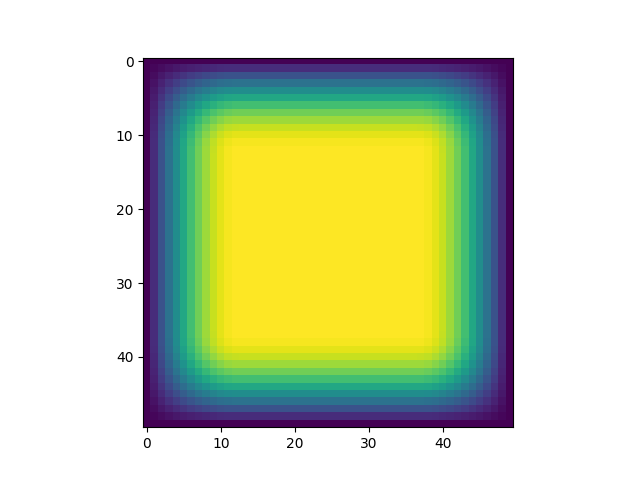

In [221]:
plt.figure()
plt.imshow(tukey_window)

In [19]:
file

In [39]:
atoms = pyfits.open("/storage/data/20201120/0020/0.fits")[0].data[0].astype(float)
flat = pyfits.open("/storage/data/20201120/0020/1.fits")[0].data[0].astype(float)
dark = pyfits.open("/storage/data/20201120/0020/2.fits")[0].data[0].astype(float)

<IPython.core.display.Javascript object>


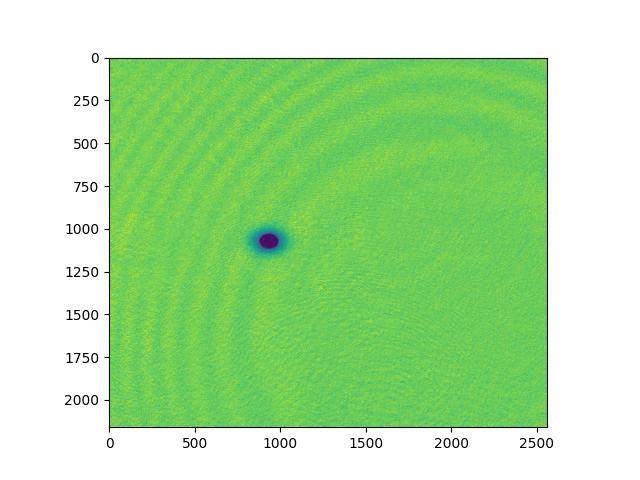

In [42]:
fig, ax = plt.subplots(1, 1)
ax.imshow((atoms-dark)/(flat-dark), vmin=0, vmax=1.3)
plt.colorbar(im)

In [ ]:
atoms = [pyfits.open(path + image + fn)[0].data.astype(float)[:] for fn in ff[:-2]]
